In [8]:
import numpy as np
import mne
import matplotlib
%matplotlib inline
#%matplotlib qt
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import glob, os
import scipy
import pickle
import networkx as nx
import preprocessing as prep
from itertools import permutations
import pandas as pd
from tqdm import tqdm

from epoch_connectivity import ConnEEG as cnegg
from epoch_connectivity import ConnectionMatrices as cm
from epoch_connectivity import Connectomes as cntms

from epoch_connectivity.utils import FrequencyBand, only_EEG_channels

import mne_connectivity as mnecon

In [33]:
# Patients metadata, because the folders are different and require different approachs (some have SEVRAGE and H1)

# To dfine the VERBOSE level for mne
mne.set_log_level(verbose='WARNING')
#direc = 'C:/code_thesis/brain_connectivity_epilepsy/plots_binarized/' # directory to save the plots
#direc = 'C:/code_thesis/brain_connectivity_epilepsy/plots/'
#direc_pickle = 'C:/code_thesis/brain_connectivity_epilepsy/connection_matrices/' # directory to save the pickles
direc = 'C:/code_thesis/brain_connectivity_epilepsy/plots_surrogate/'
direc_pickle = 'C:/code_thesis/brain_connectivity_epilepsy/connection_matrices_surrogate/'

# pat number : sevrage (bool)
PAT_metadata = {'PAT1':False, 'PAT2':False, 'PAT3':False, 'PAT4':True, 'PAT5':False, 'PAT6':True,
               'PAT7':True, 'PAT8':False, 'PAT9':False, 'PAT10':False, 'PAT11':False, 'PAT12':True,
               'PAT13':True, 'PAT14':False, 'PAT15':False, 'PAT16':False, 'PAT17':False, 'PAT18':False,
               'PAT19':True, 'PAT20':True, 'PAT21':True, 'PAT22':False, 'PAT23':False, 'PAT24':True, 'PAT25':True,
               'PAT26':False, 'PAT27':True, 'PAT28':True, 'PAT29':False, 'PAT30':False, 'PAT31':True,
               'PAT32':True, 'PAT33':True, 'PAT34':True, 'PAT35':True, 'PAT36':True, 'PAT37':True, 'PAT38':True}
# patients to process
to_preprocess = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
#to_preprocess = [2, 3, 4, 5, 6, 7, 8, 13, 14, 15, 16, 17, 18, 19, 22, 23, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34]

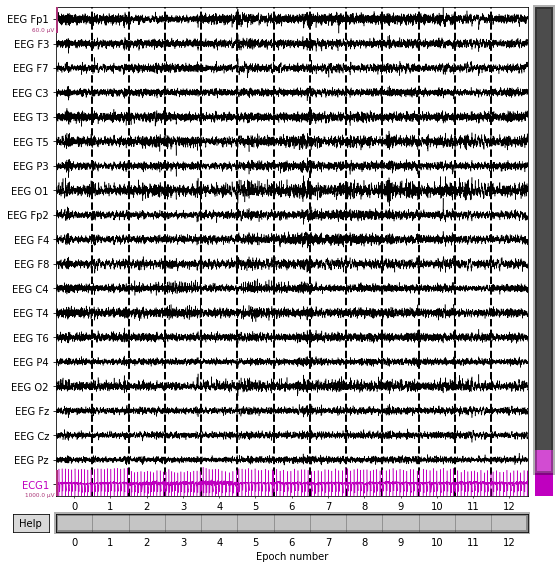

In [16]:
# To get a plot of the raw eeg
raw_eeg = prep.open_preprocessed_epoched(patient_number=24, weaning = PAT_metadata['PAT24'])
prep.plot_epoched_eeg(raw_eeg[0])

### To preprocess the EEGs

In [22]:
# the directories and the methods are in the auxiliar script named preprocessing.py
for pat in tqdm(to_preprocess, position=0, leave=True):
    print('PAT'+str(pat))
    weaning = PAT_metadata['PAT'+str(pat)]
    prep.fully_preprocess_eeg(patient_number=pat, weaning=weaning, overwrite=True, export_edf=False)

  0%|                                                                                           | 0/37 [00:00<?, ?it/s]

PAT1
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


  3%|██▏                                                                                | 1/37 [00:03<02:12,  3.68s/it]

PAT2
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


  5%|████▍                                                                              | 2/37 [00:07<02:07,  3.66s/it]

PAT3
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


  8%|██████▋                                                                            | 3/37 [00:10<02:02,  3.62s/it]

PAT4
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 9 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 9 events and 2561 original time points ...
Overwriting existing file.
Loading data for 9 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 9 events and 2561 original time points ...


C:\code_thesis\brain_connectivity_epilepsy\preprocessing.py:41: RuntimeWarning: Number of records from the header does not match the file size (perhaps the recording was not stopped before exiting). Inferring from the file size.
  a = mne.io.read_raw_edf(filepath, preload=True)
C:\code_thesis\brain_connectivity_epilepsy\preprocessing.py:45: RuntimeWarning: Omitted 10 annotation(s) that were outside data range.
  a.set_annotations(annotations)


Overwriting existing file.
Loading data for 1 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 1 events and 2561 original time points ...


 11%|████████▉                                                                          | 4/37 [00:16<02:28,  4.50s/it]

PAT5
Overwriting existing file.
Loading data for 9 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 9 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 14%|███████████▏                                                                       | 5/37 [00:20<02:13,  4.17s/it]

PAT6
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 16%|█████████████▍                                                                     | 6/37 [00:27<02:39,  5.14s/it]

PAT7
10
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
4
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 19%|███████████████▋                                                                   | 7/37 [00:34<02:52,  5.76s/it]

PAT8
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 22%|█████████████████▉                                                                 | 8/37 [00:37<02:25,  5.03s/it]

PAT9
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 24%|████████████████████▏                                                              | 9/37 [00:41<02:06,  4.53s/it]

PAT10
Overwriting existing file.
Loading data for 9 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 9 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 27%|██████████████████████▏                                                           | 10/37 [00:44<01:53,  4.22s/it]

PAT11
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 30%|████████████████████████▍                                                         | 11/37 [00:48<01:43,  3.98s/it]

PAT13
9
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 32%|██████████████████████████▌                                                       | 12/37 [00:55<02:03,  4.94s/it]

PAT14
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
9
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 35%|████████████████████████████▊                                                     | 13/37 [00:58<01:48,  4.51s/it]

PAT15
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 38%|███████████████████████████████                                                   | 14/37 [01:02<01:36,  4.21s/it]

PAT16
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 9 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 9 events and 2561 original time points ...


 41%|█████████████████████████████████▏                                                | 15/37 [01:05<01:27,  3.98s/it]

PAT17
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 43%|███████████████████████████████████▍                                              | 16/37 [01:09<01:19,  3.78s/it]

PAT18
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 46%|█████████████████████████████████████▋                                            | 17/37 [01:12<01:13,  3.70s/it]

PAT19
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 49%|███████████████████████████████████████▉                                          | 18/37 [01:20<01:32,  4.85s/it]

PAT20
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 51%|██████████████████████████████████████████                                        | 19/37 [01:27<01:40,  5.57s/it]

PAT21
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 54%|████████████████████████████████████████████▎                                     | 20/37 [01:34<01:41,  5.99s/it]

PAT22
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 57%|██████████████████████████████████████████████▌                                   | 21/37 [01:37<01:23,  5.23s/it]

PAT23
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
7
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 59%|████████████████████████████████████████████████▊                                 | 22/37 [01:41<01:10,  4.70s/it]

PAT24
Overwriting existing file.
Loading data for 10 events and 5121 original time points ...
0 bad epochs dropped
Loading data for 1 events and 5121 original time points ...
Loading data for 10 events and 5121 original time points ...
Overwriting existing file.
Loading data for 10 events and 5121 original time points ...
0 bad epochs dropped
Loading data for 1 events and 5121 original time points ...
Loading data for 10 events and 5121 original time points ...
Overwriting existing file.
Loading data for 10 events and 5121 original time points ...
0 bad epochs dropped
Loading data for 1 events and 5121 original time points ...
Loading data for 10 events and 5121 original time points ...
2
Overwriting existing file.
Loading data for 10 events and 5121 original time points ...
0 bad epochs dropped
Loading data for 1 events and 5121 original time points ...
Loading data for 10 events and 5121 original time points ...


 62%|██████████████████████████████████████████████████▉                               | 23/37 [01:54<01:42,  7.30s/it]

PAT25
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 65%|█████████████████████████████████████████████████████▏                            | 24/37 [02:01<01:33,  7.17s/it]

PAT26
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 68%|███████████████████████████████████████████████████████▍                          | 25/37 [02:05<01:12,  6.05s/it]

PAT27
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 70%|█████████████████████████████████████████████████████████▌                        | 26/37 [02:11<01:09,  6.29s/it]

PAT28
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 9 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 9 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 73%|███████████████████████████████████████████████████████████▊                      | 27/37 [02:18<01:05,  6.51s/it]

PAT29
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 76%|██████████████████████████████████████████████████████████████                    | 28/37 [02:22<00:50,  5.63s/it]

PAT30
8
9
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 78%|████████████████████████████████████████████████████████████████▎                 | 29/37 [02:25<00:39,  4.97s/it]

PAT31
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 81%|██████████████████████████████████████████████████████████████████▍               | 30/37 [02:32<00:39,  5.57s/it]

PAT32
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 84%|████████████████████████████████████████████████████████████████████▋             | 31/37 [02:39<00:35,  5.98s/it]

PAT33
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 86%|██████████████████████████████████████████████████████████████████████▉           | 32/37 [02:46<00:31,  6.23s/it]

PAT34
Overwriting existing file.
Loading data for 10 events and 5121 original time points ...
0 bad epochs dropped
Loading data for 1 events and 5121 original time points ...
Loading data for 10 events and 5121 original time points ...
Overwriting existing file.
Loading data for 10 events and 5121 original time points ...
0 bad epochs dropped
Loading data for 1 events and 5121 original time points ...
Loading data for 10 events and 5121 original time points ...
Overwriting existing file.
Loading data for 10 events and 5121 original time points ...
0 bad epochs dropped
Loading data for 1 events and 5121 original time points ...
Loading data for 10 events and 5121 original time points ...


C:\code_thesis\brain_connectivity_epilepsy\preprocessing.py:41: RuntimeWarning: Number of records from the header does not match the file size (perhaps the recording was not stopped before exiting). Inferring from the file size.
  a = mne.io.read_raw_edf(filepath, preload=True)


Overwriting existing file.
Loading data for 10 events and 5121 original time points ...
0 bad epochs dropped
Loading data for 1 events and 5121 original time points ...
Loading data for 10 events and 5121 original time points ...


 89%|█████████████████████████████████████████████████████████████████████████▏        | 33/37 [03:00<00:33,  8.44s/it]

PAT35
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 92%|███████████████████████████████████████████████████████████████████████████▎      | 34/37 [03:07<00:23,  7.96s/it]

PAT36
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 95%|█████████████████████████████████████████████████████████████████████████████▌    | 35/37 [03:13<00:15,  7.65s/it]

PAT37
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
4
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
2
Overwriting existing file.
Loading data for 12 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 12 events and 2561 original time points ...
2
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 36/37 [03:21<00:07,  7.55s/it]

PAT38
2
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
2
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
Overwriting existing file.
Loading data for 10 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 10 events and 2561 original time points ...
2
Overwriting existing file.
Loading data for 11 events and 2561 original time points ...
0 bad epochs dropped
Loading data for 1 events and 2561 original time points ...
Loading data for 11 events and 2561 original time points ...


100%|██████████████████████████████████████████████████████████████████████████████████| 37/37 [03:28<00:00,  5.63s/it]


In [23]:
n_epochs_h1 = {}
for pat in to_preprocess:
    weaning = PAT_metadata['PAT'+str(pat)]
    epoched = prep.open_preprocessed_epoched(pat, weaning=weaning)
    n_epochs_h1['PAT'+str(pat)] = [len(epoched[0].events), len(epoched[1].events)]
n_epochs_h1

{'PAT1': [10, 10],
 'PAT2': [10, 10],
 'PAT3': [10, 10],
 'PAT4': [10, 9],
 'PAT5': [9, 10],
 'PAT6': [10, 10],
 'PAT7': [10, 10],
 'PAT8': [10, 10],
 'PAT9': [10, 10],
 'PAT10': [9, 10],
 'PAT11': [10, 10],
 'PAT13': [10, 10],
 'PAT14': [10, 10],
 'PAT15': [10, 10],
 'PAT16': [10, 9],
 'PAT17': [10, 10],
 'PAT18': [10, 10],
 'PAT19': [10, 10],
 'PAT20': [10, 10],
 'PAT21': [10, 10],
 'PAT22': [10, 10],
 'PAT23': [10, 10],
 'PAT24': [10, 10],
 'PAT25': [10, 10],
 'PAT26': [10, 10],
 'PAT27': [10, 10],
 'PAT28': [10, 10],
 'PAT29': [10, 10],
 'PAT30': [10, 10],
 'PAT31': [10, 10],
 'PAT32': [10, 10],
 'PAT33': [10, 10],
 'PAT34': [10, 10],
 'PAT35': [10, 10],
 'PAT36': [10, 10],
 'PAT37': [10, 10],
 'PAT38': [10, 10]}

### To create the connection matrices and save them as pickle

This process can take some time, due to the MVAR model fit, that requires some computational power. Moreover, if the surrogate data test is performed it can take a really long time, due to the surrogate data generation.

  0%|                                                                                           | 0/37 [00:00<?, ?it/s]

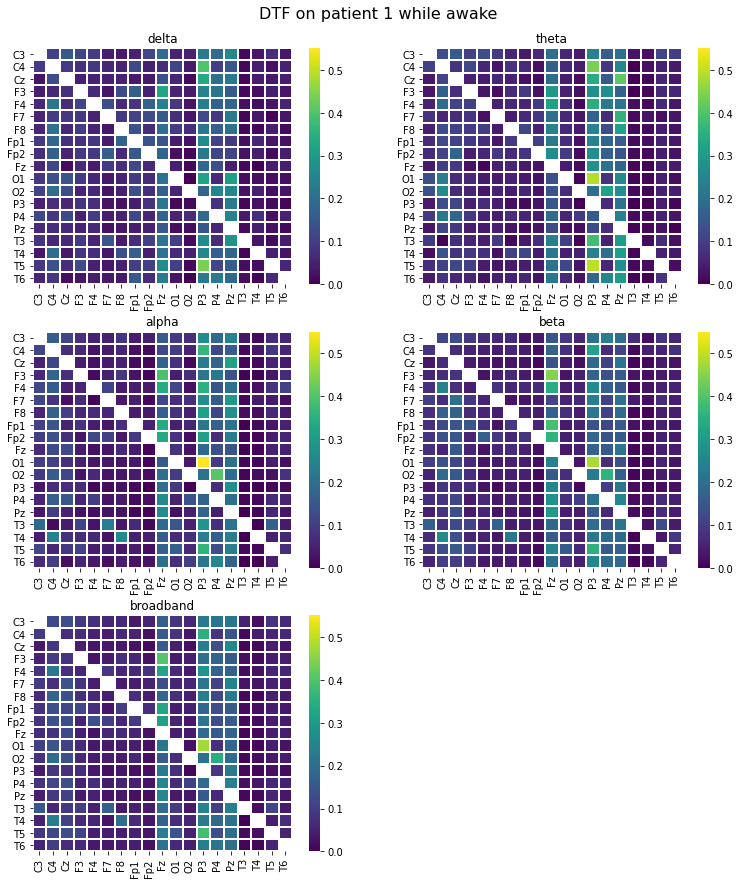

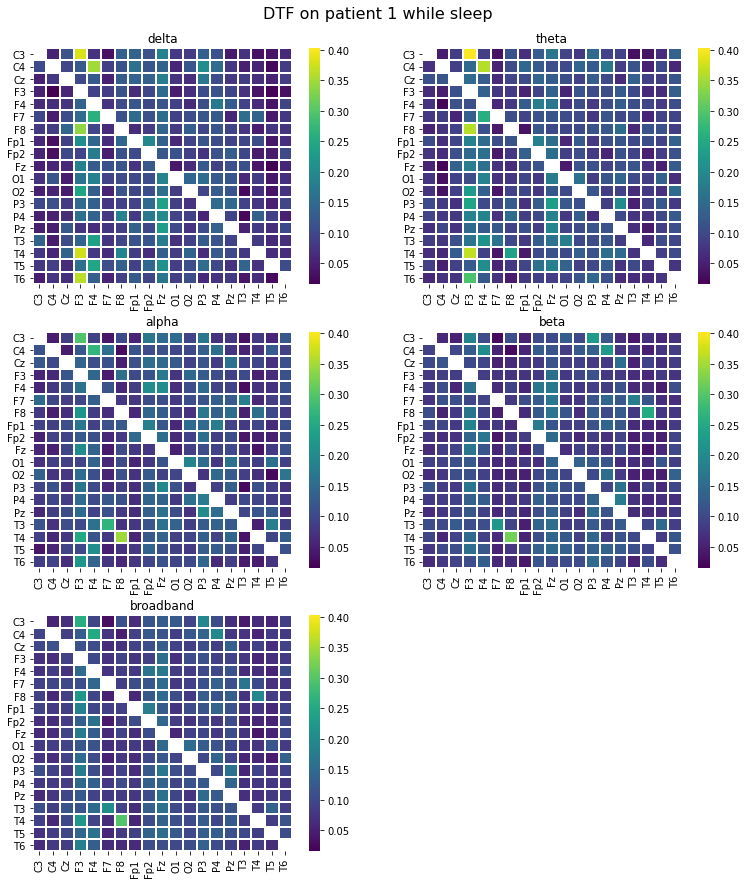

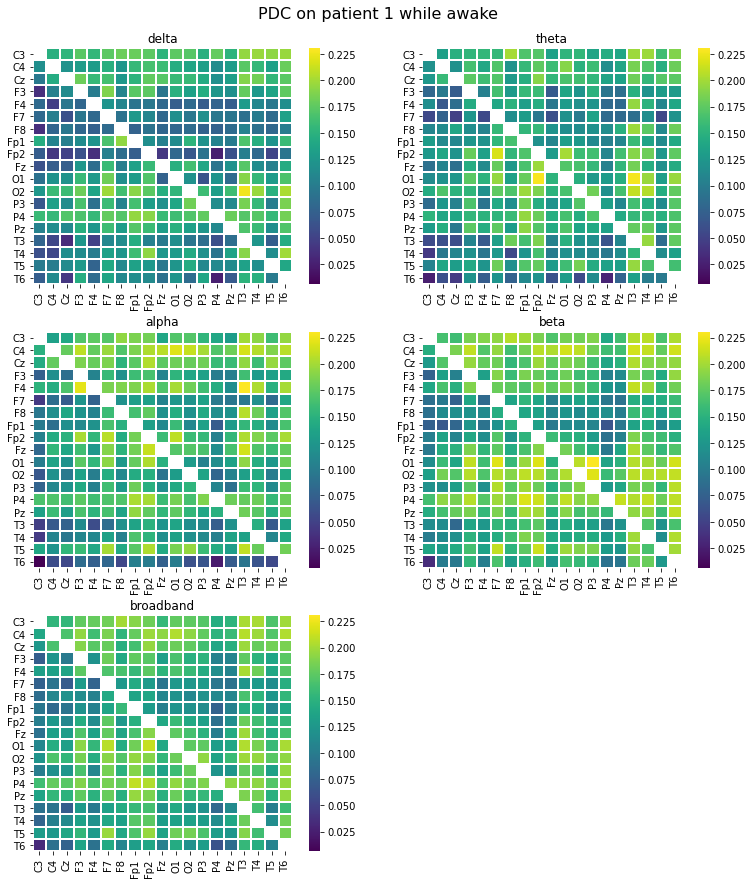

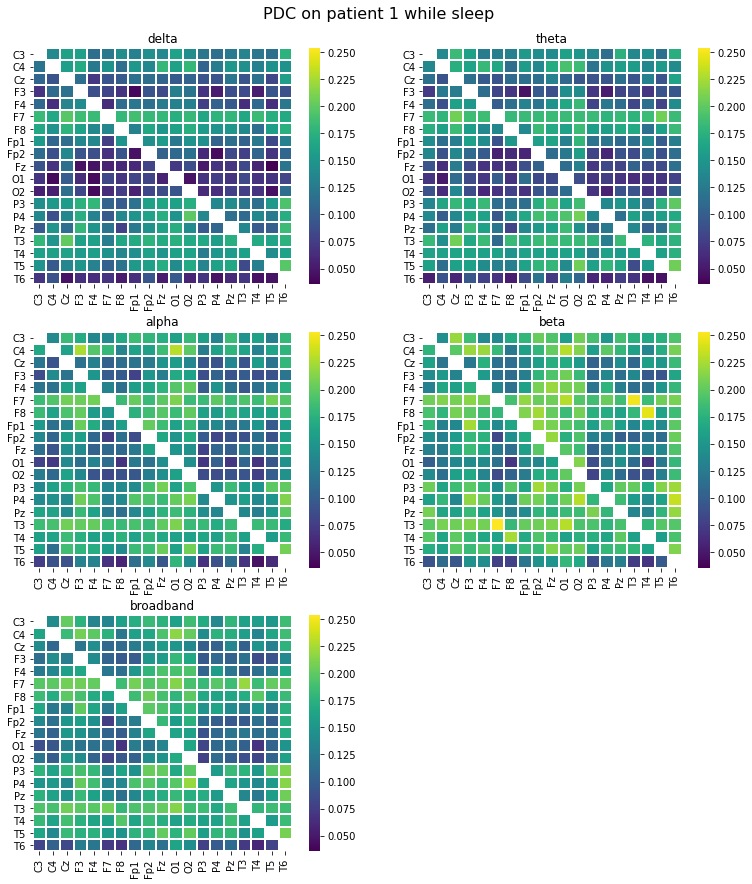

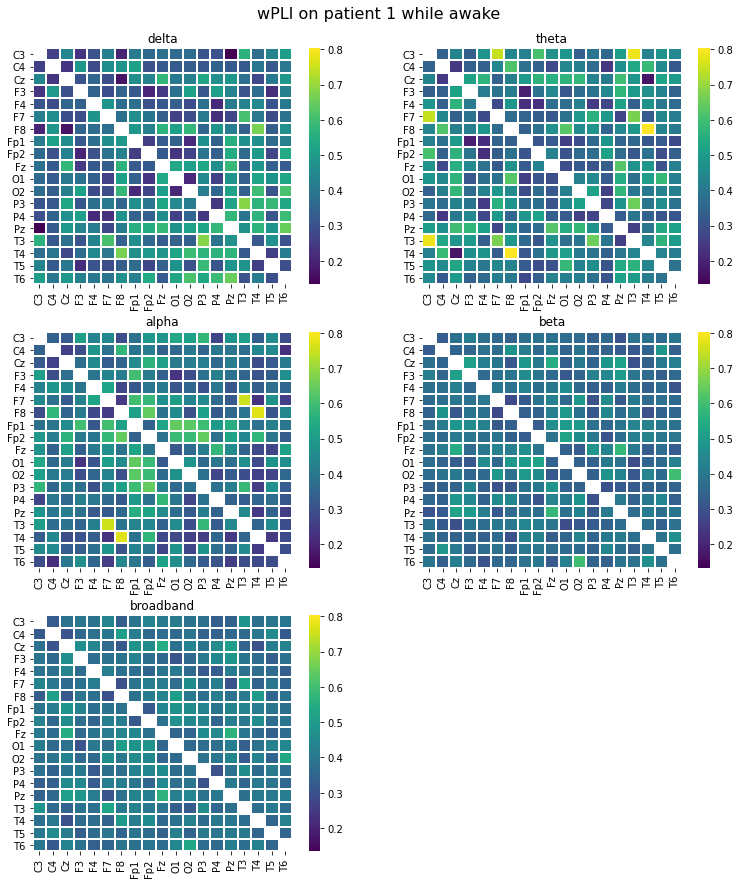

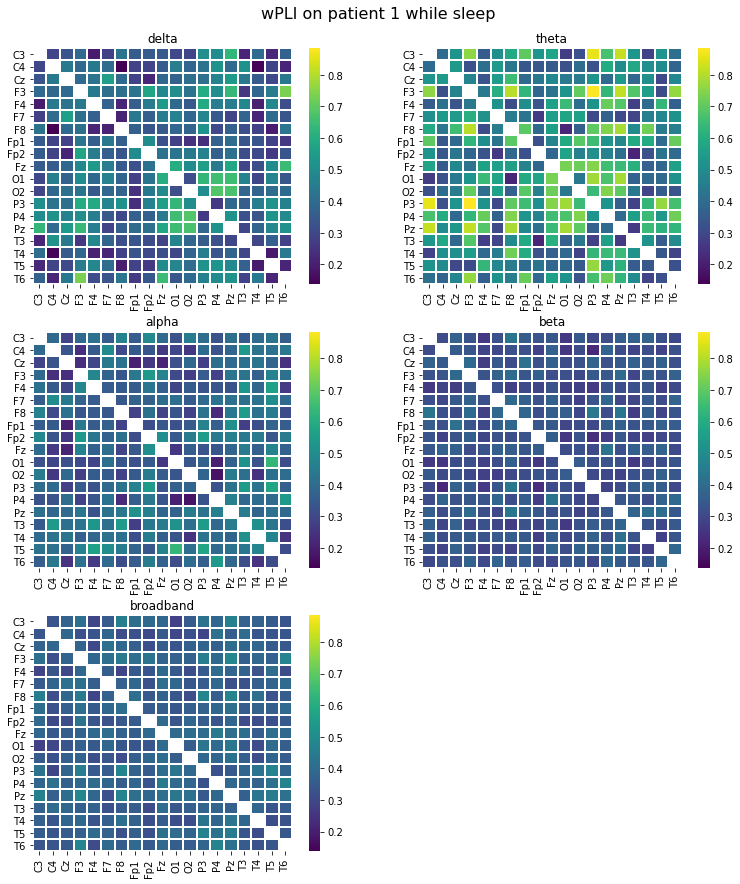

  3%|██▏                                                                             | 1/37 [05:45<3:27:13, 345.38s/it]

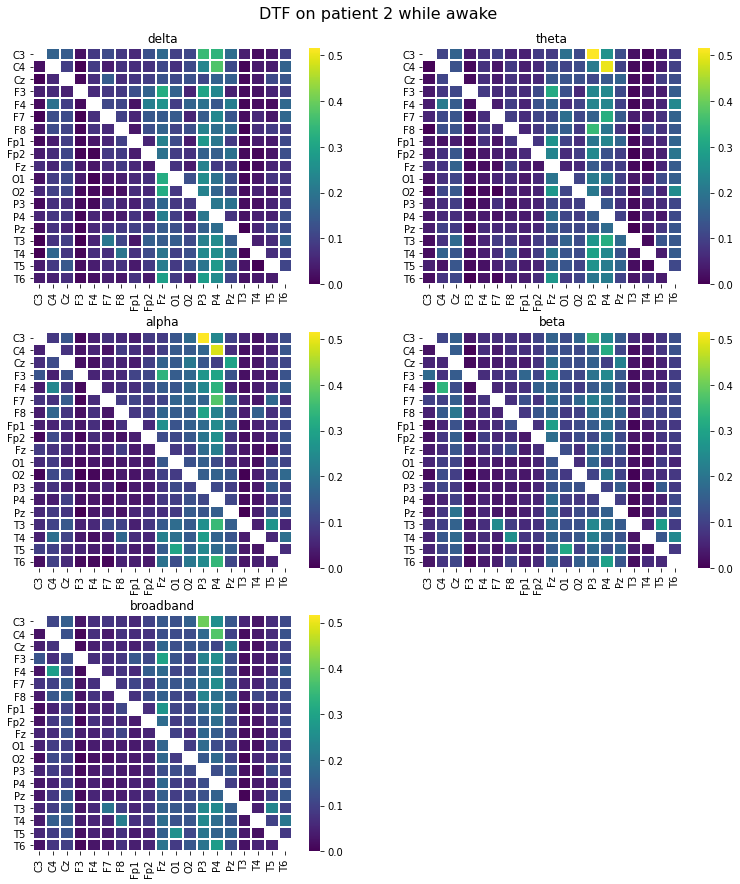

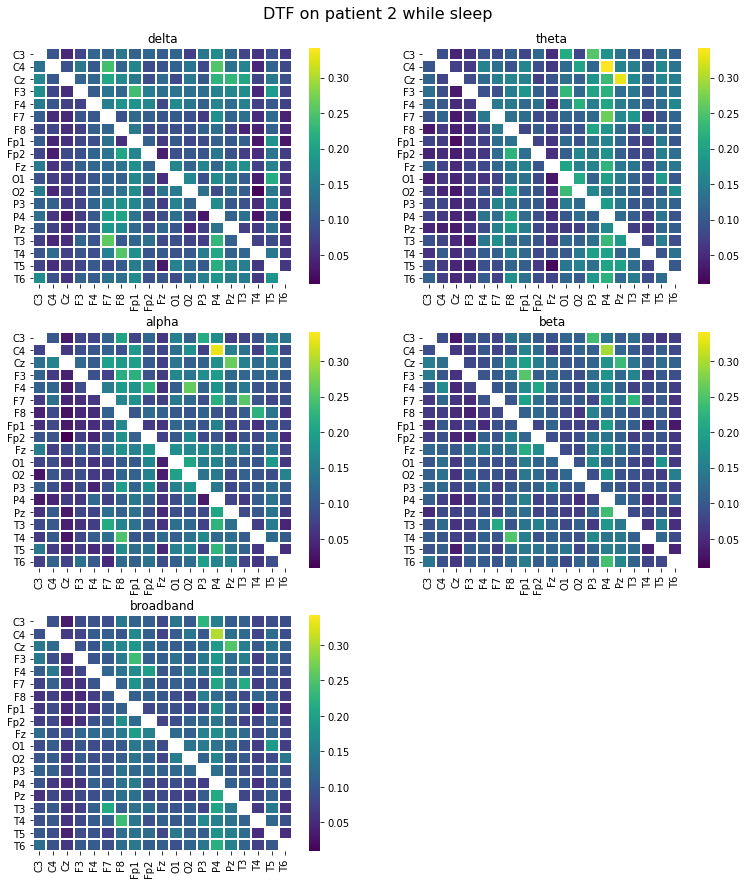

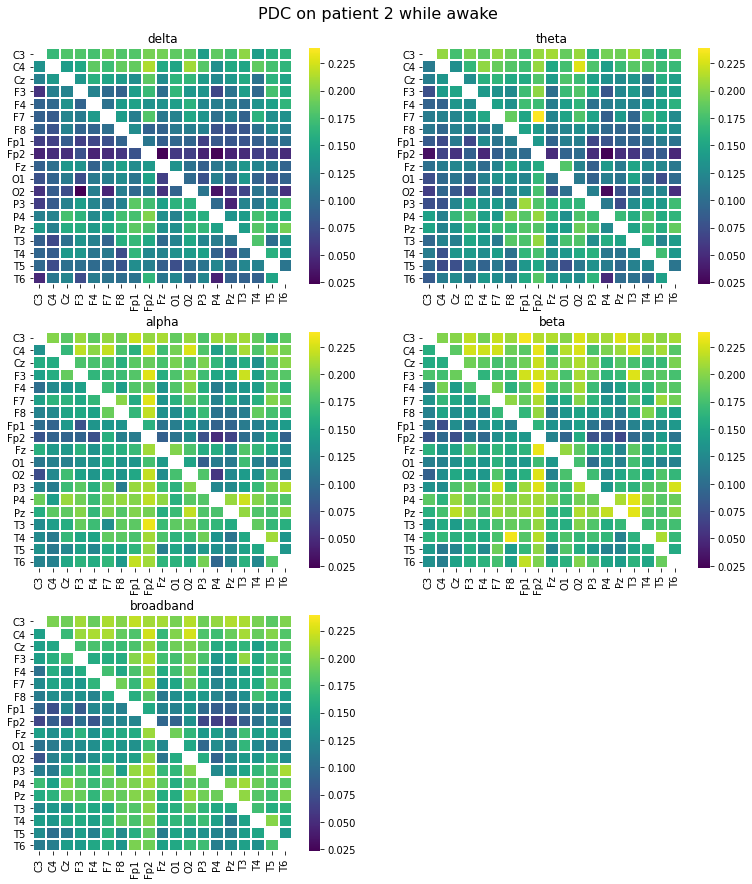

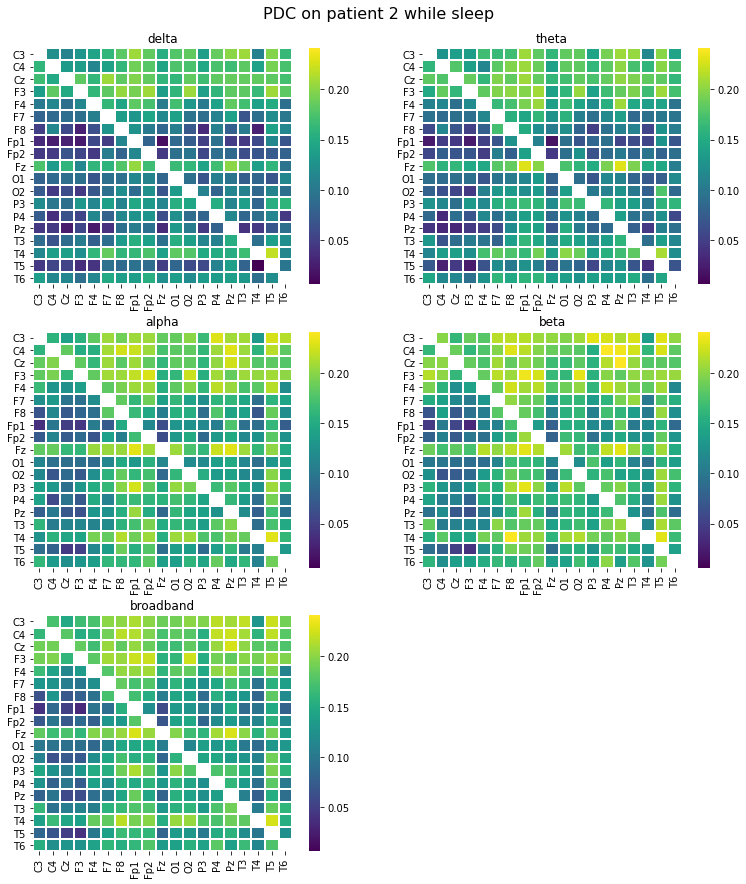

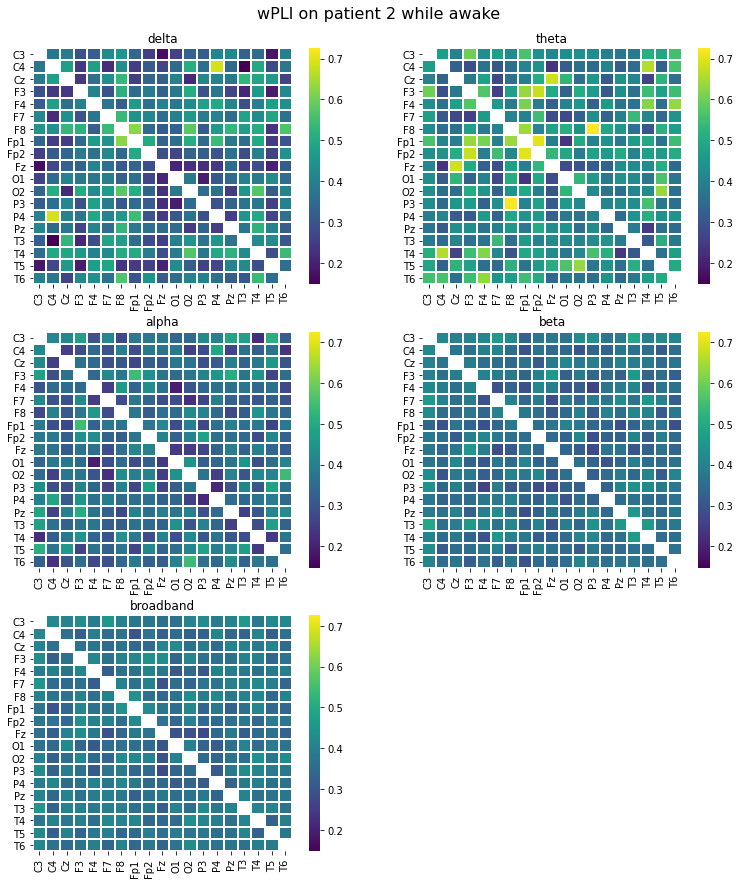

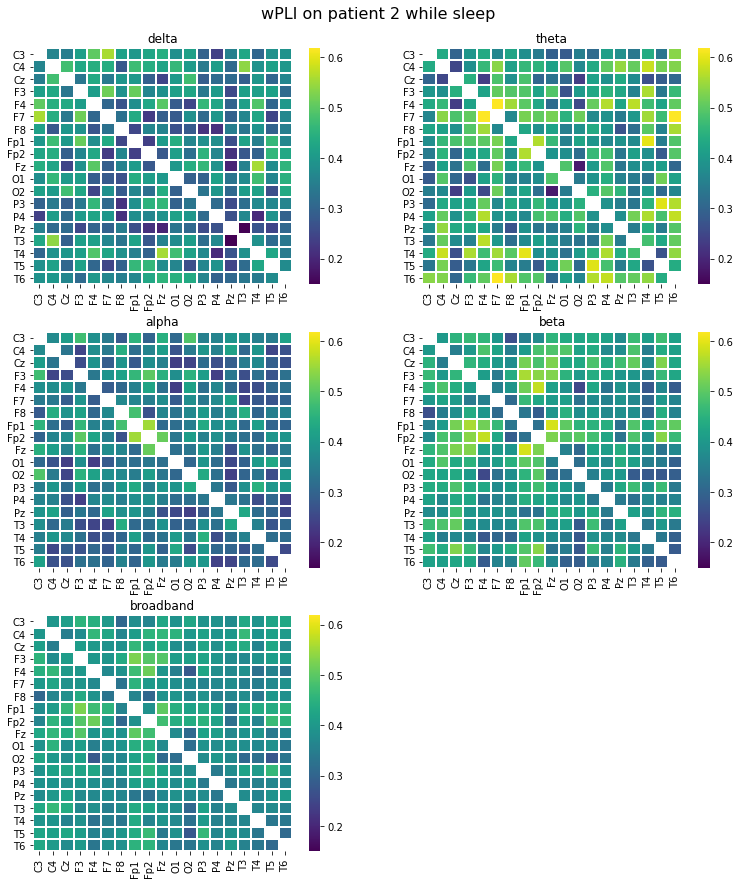

  5%|████▎                                                                           | 2/37 [12:00<3:31:48, 363.09s/it]

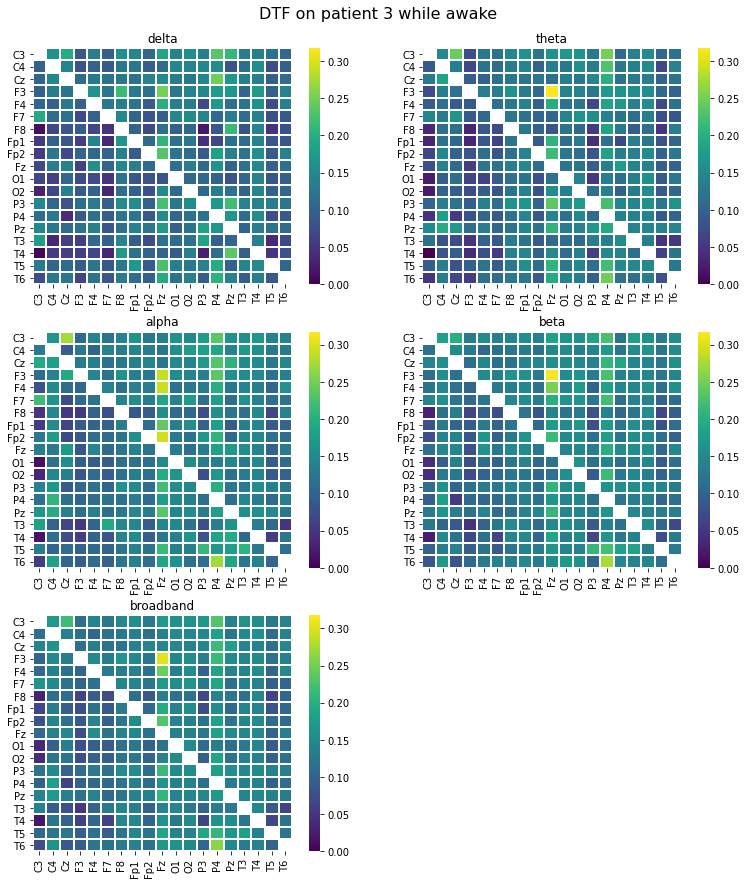

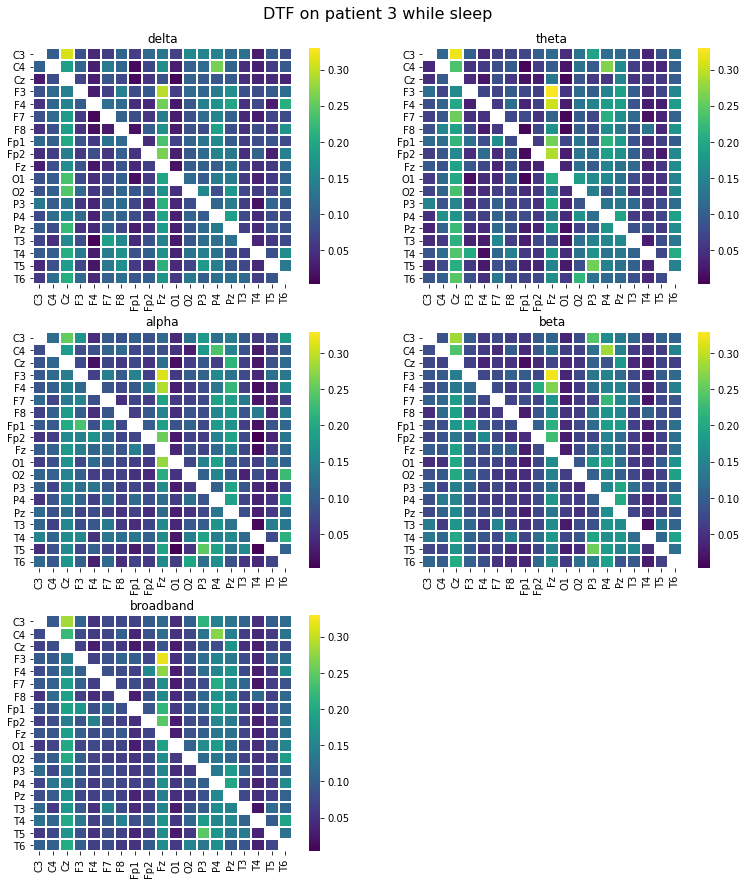

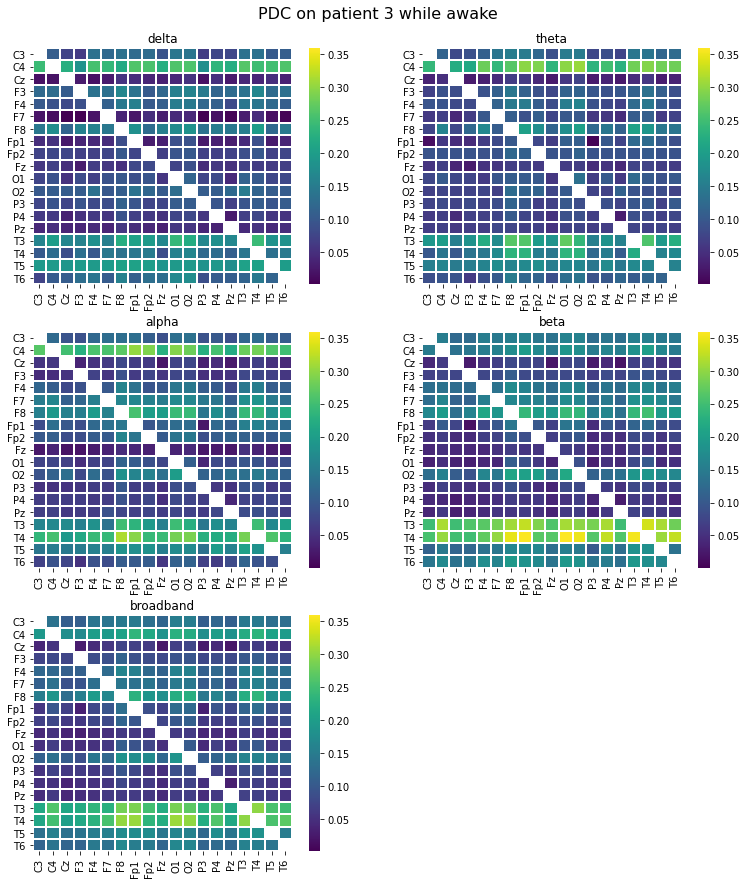

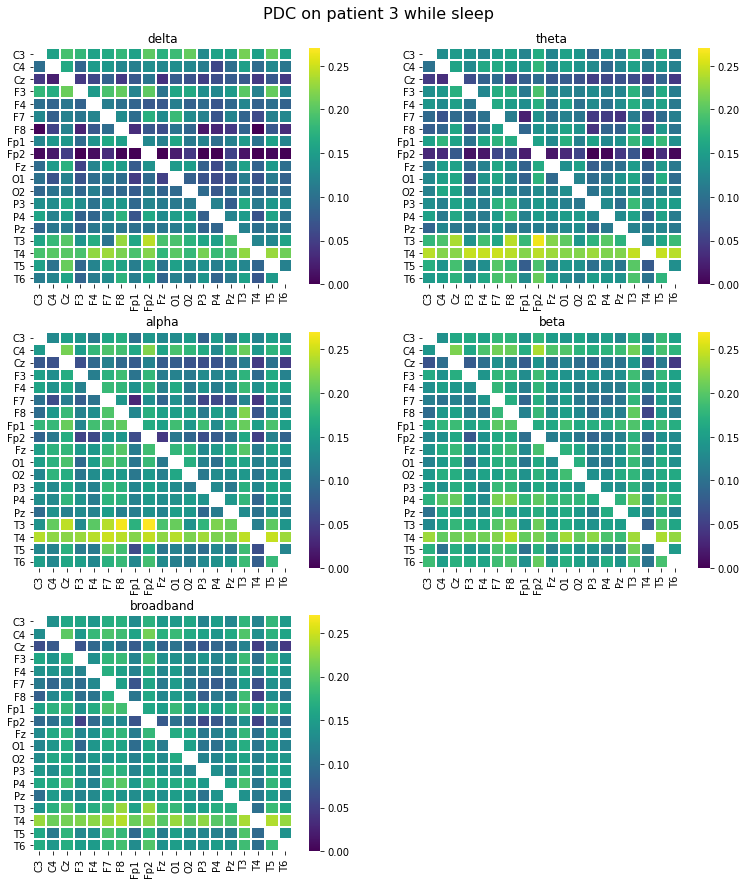

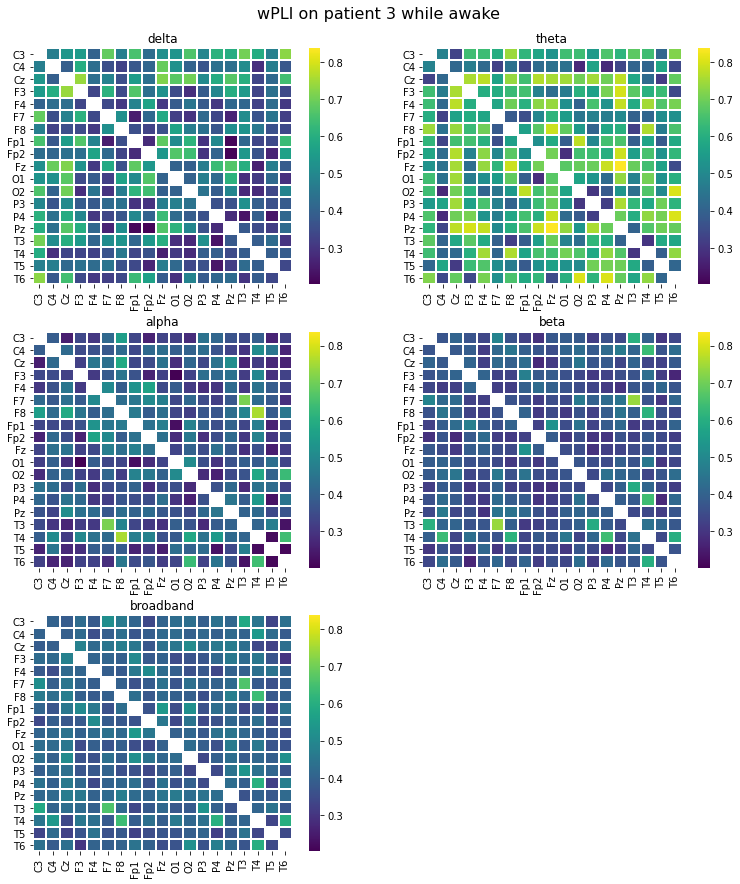

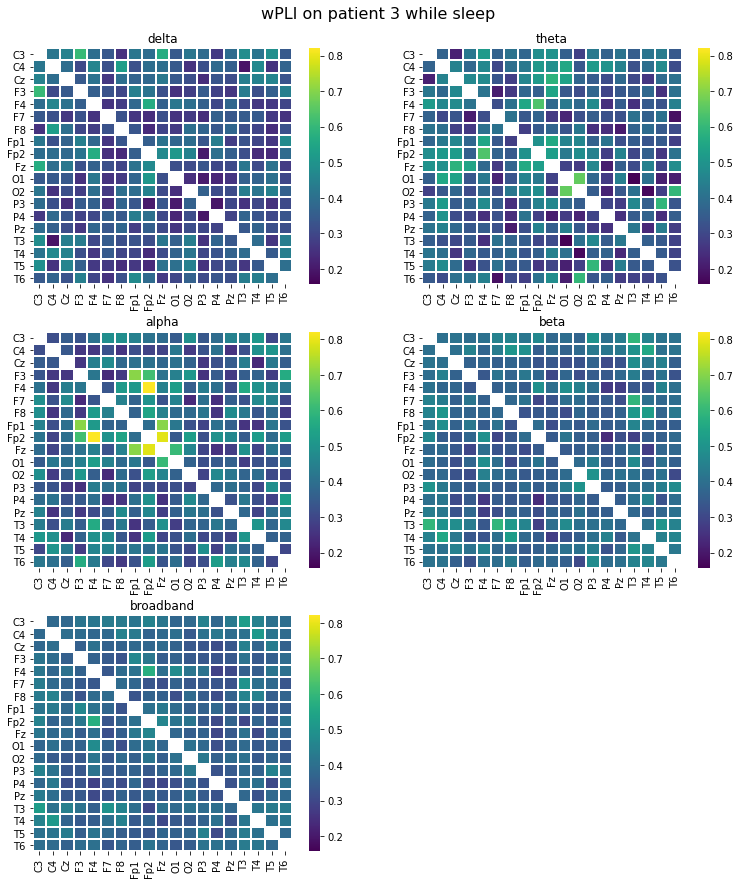

  8%|██████▍                                                                         | 3/37 [18:01<3:24:59, 361.75s/it]

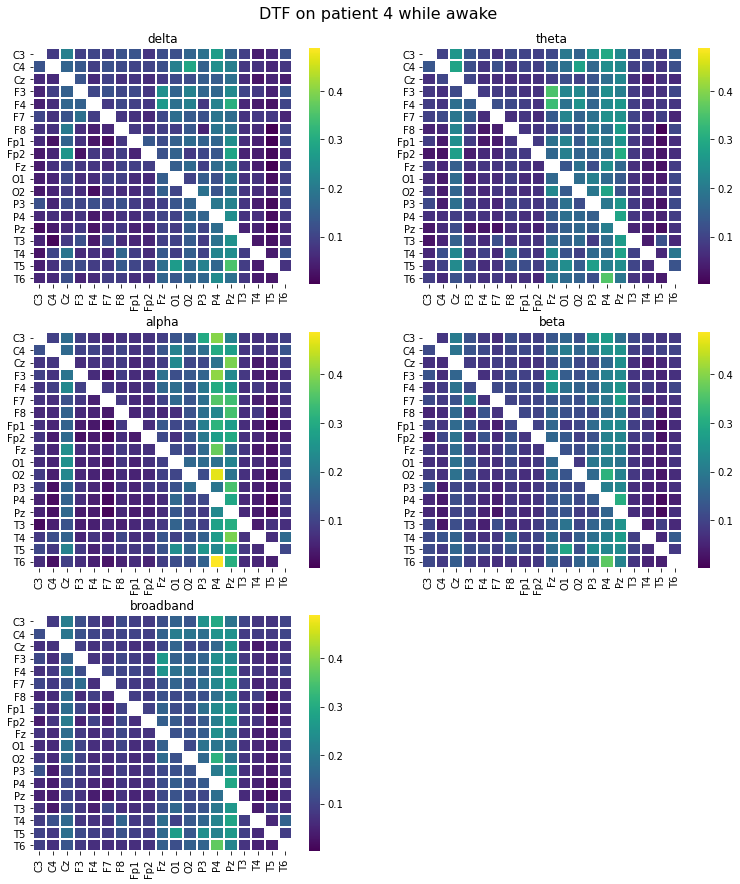

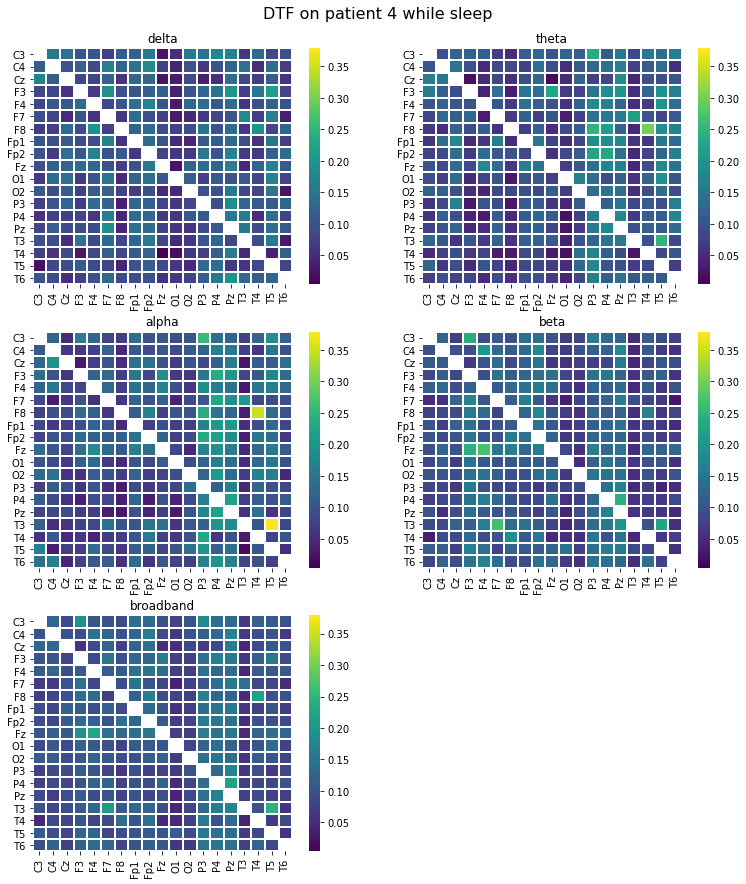

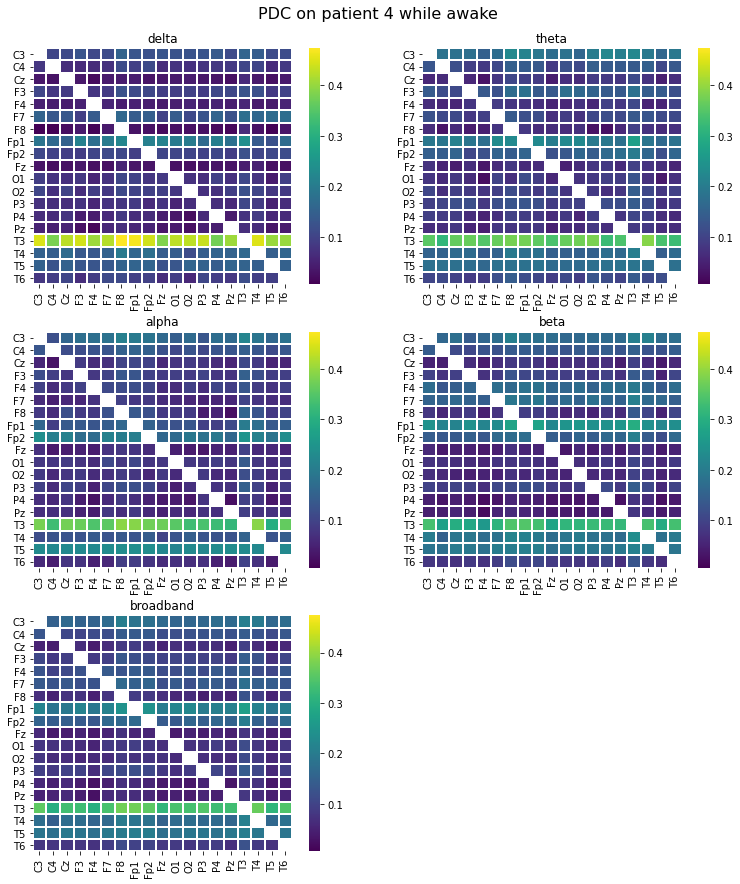

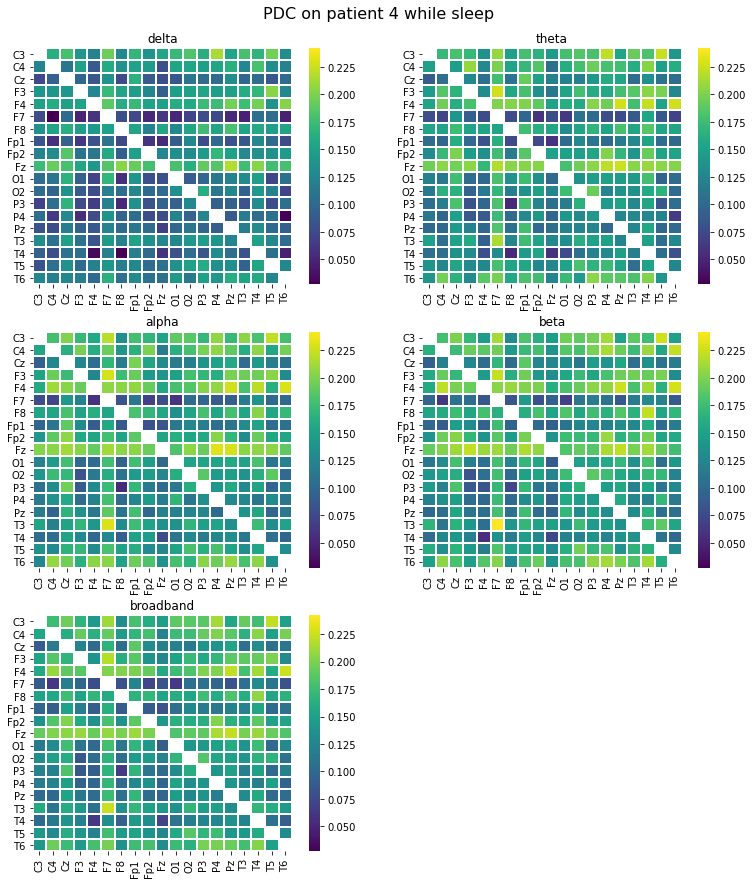

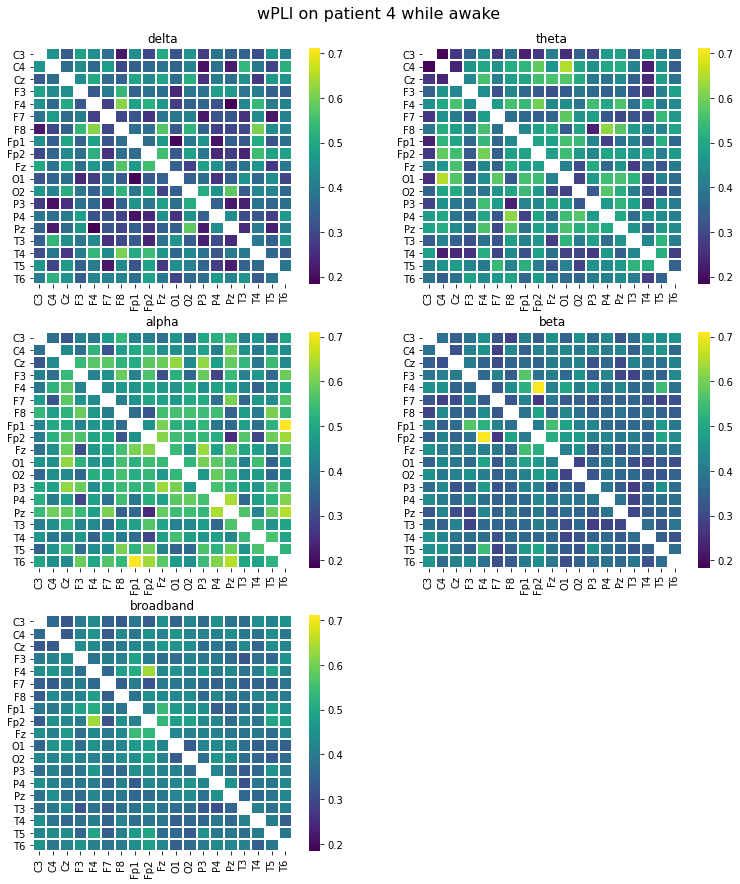

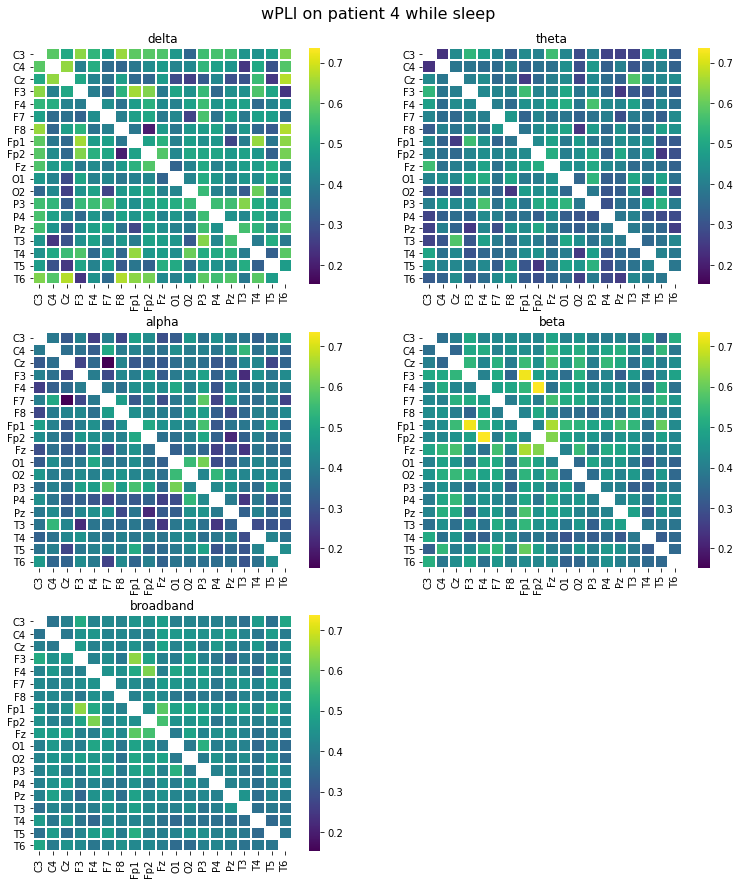

 11%|████████▋                                                                       | 4/37 [23:29<3:11:47, 348.72s/it]

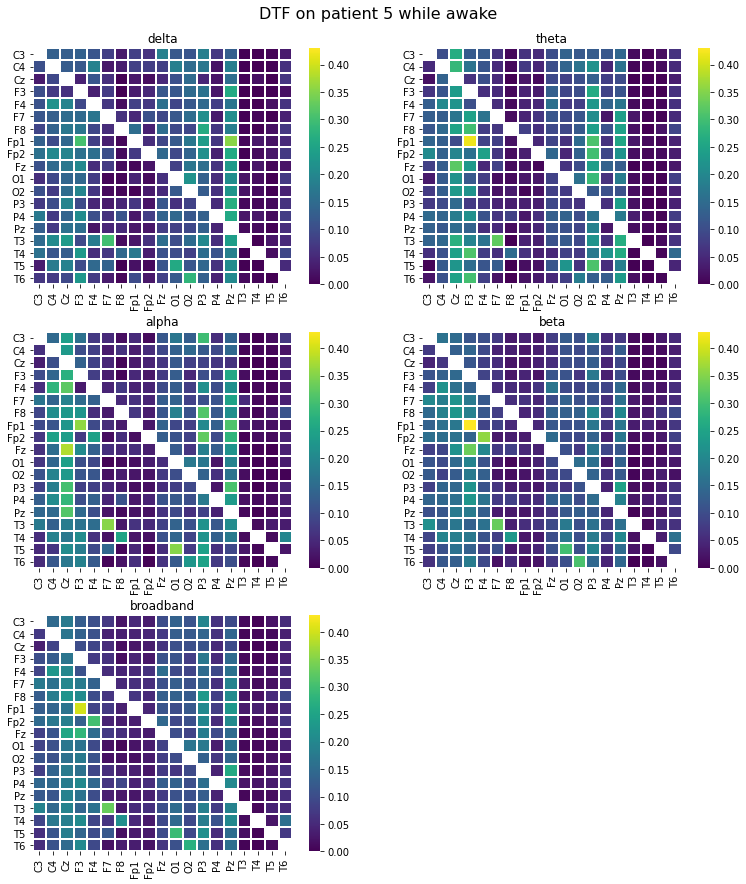

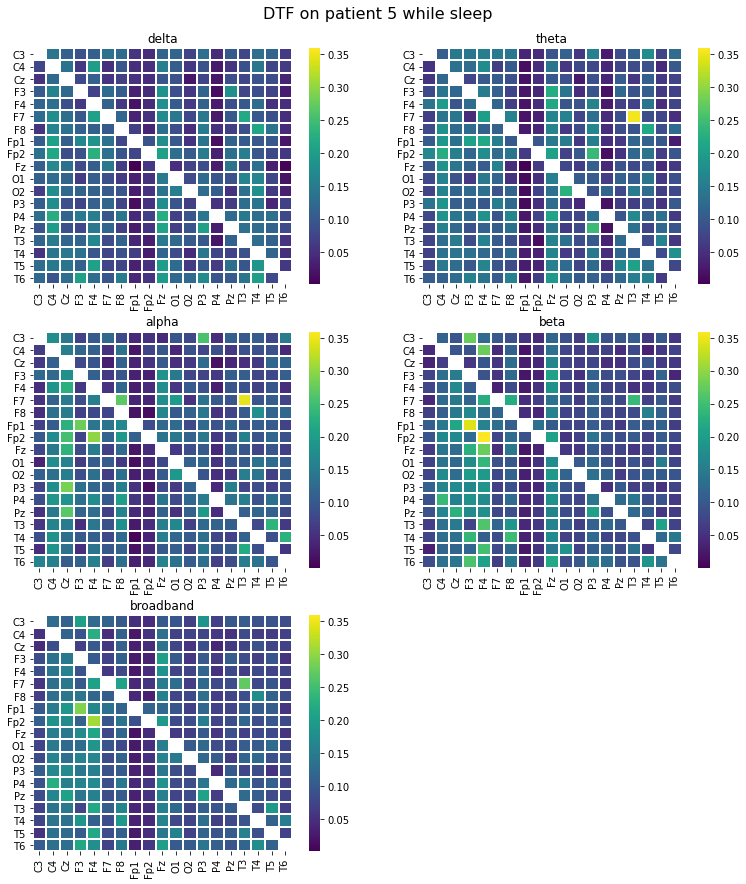

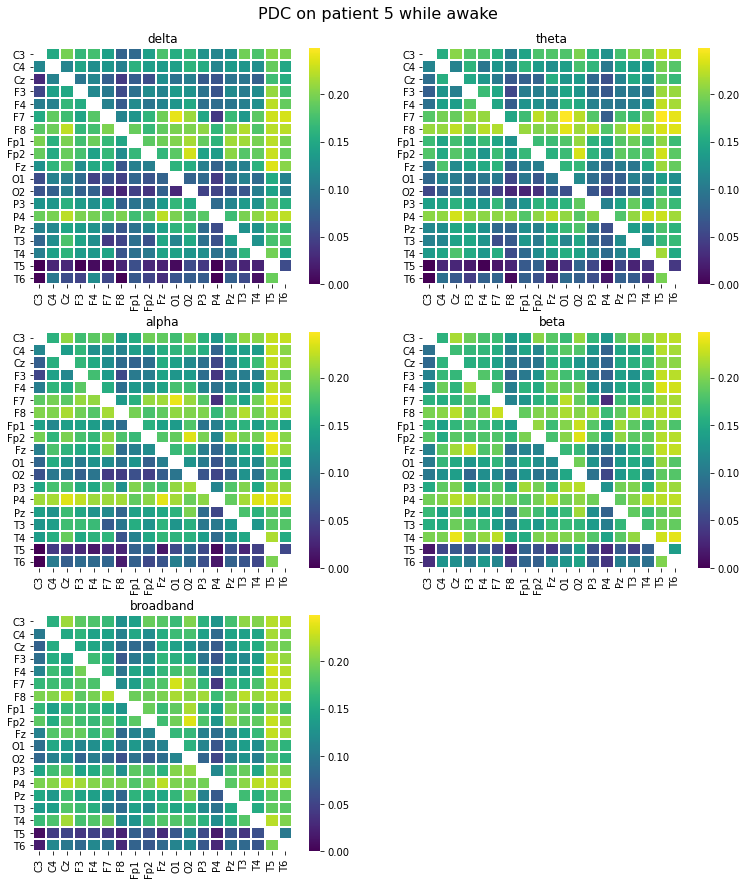

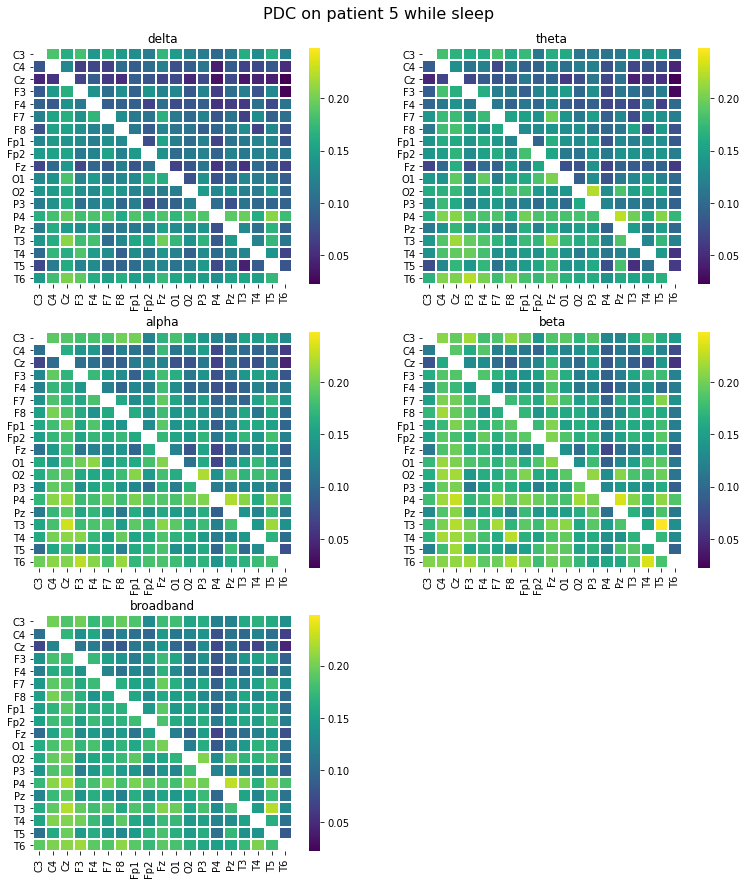

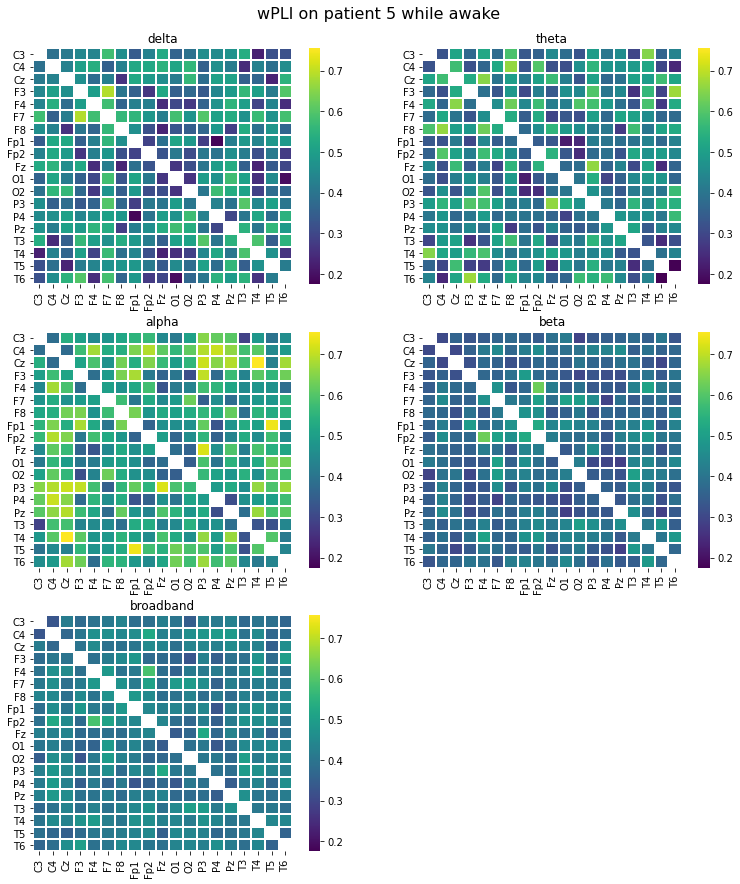

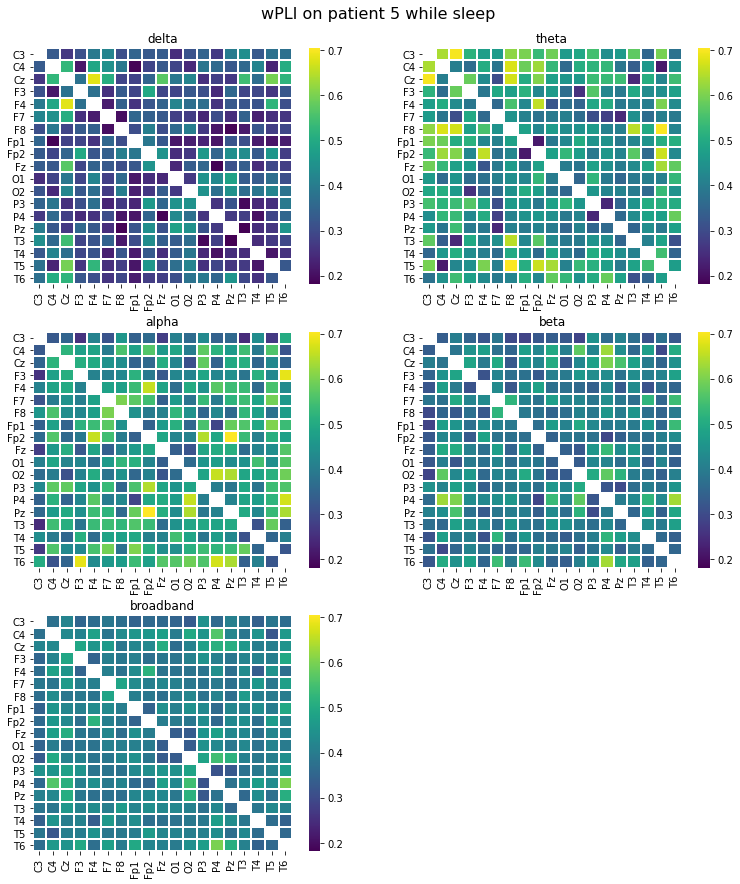

 14%|██████████▊                                                                     | 5/37 [28:50<3:00:36, 338.63s/it]

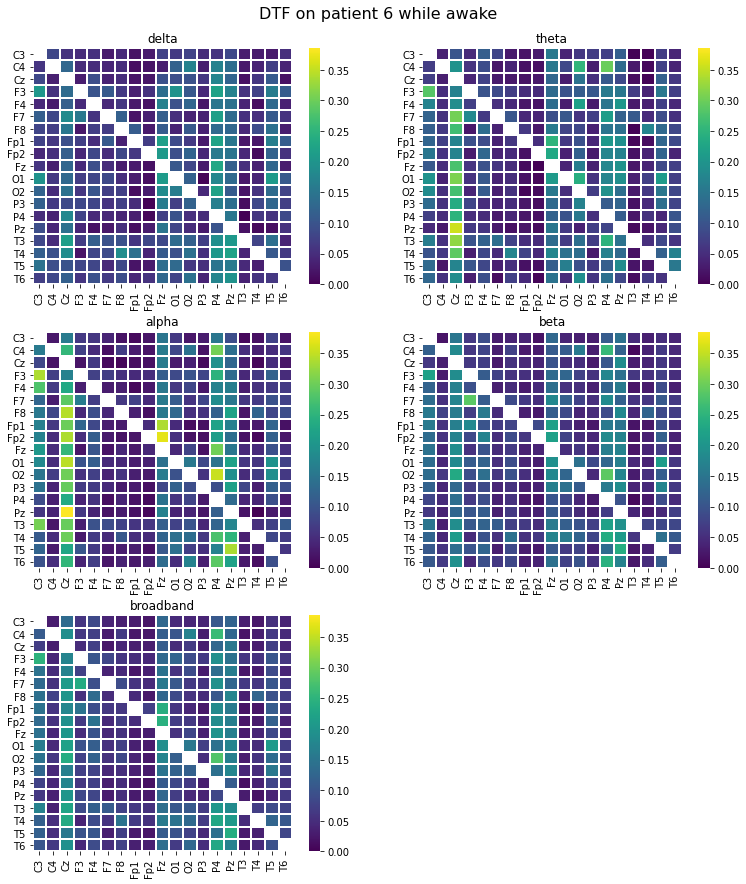

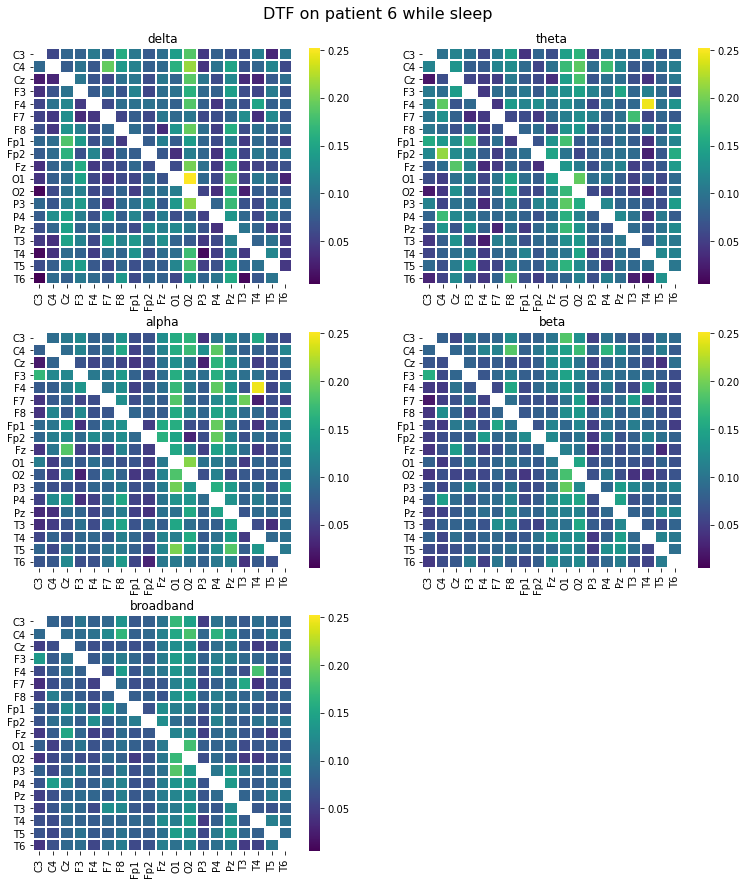

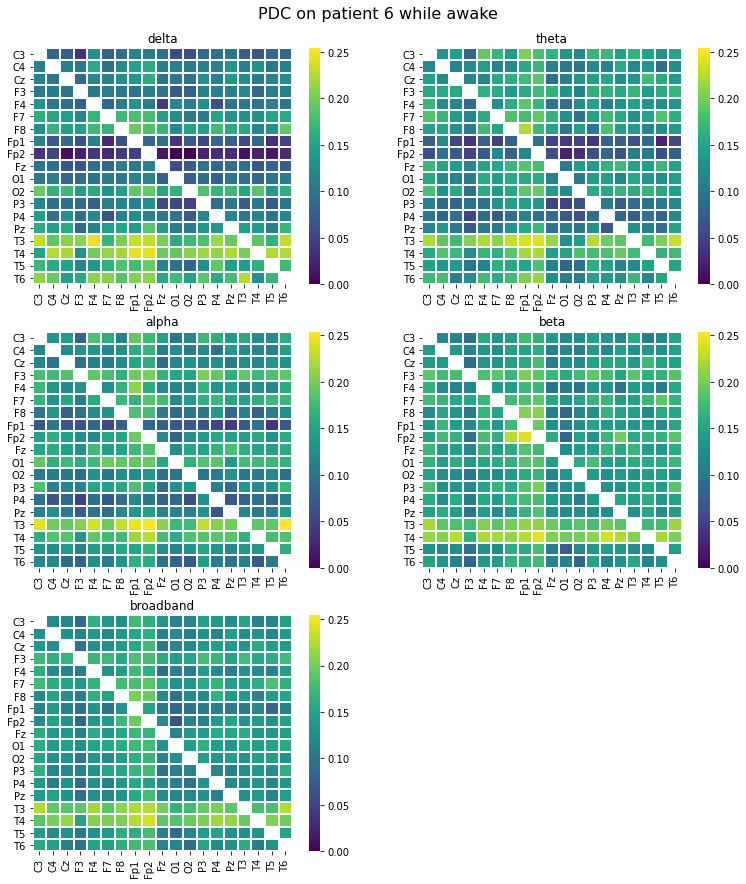

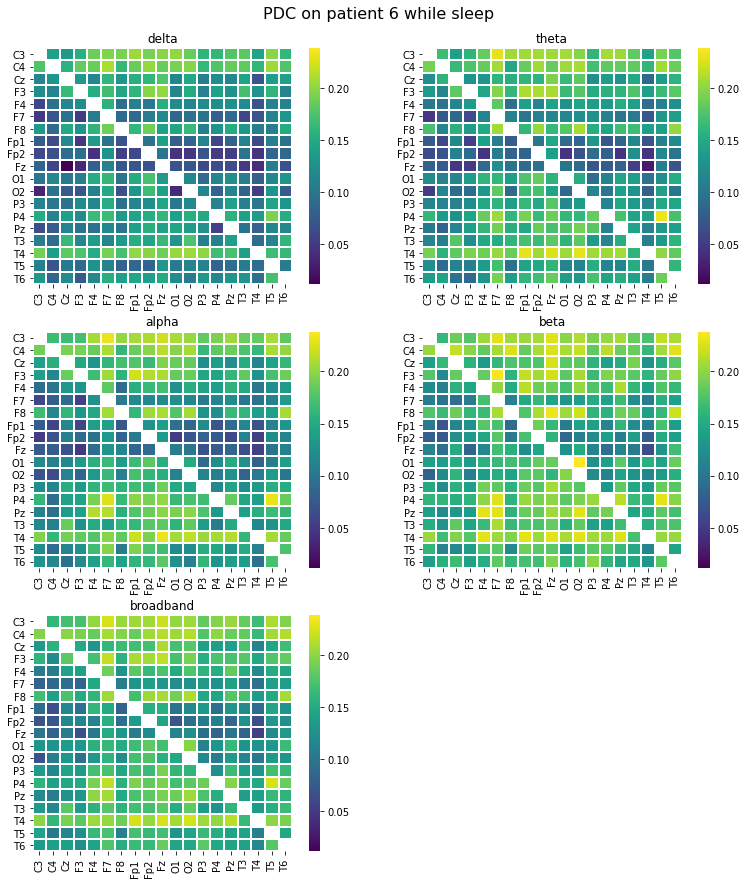

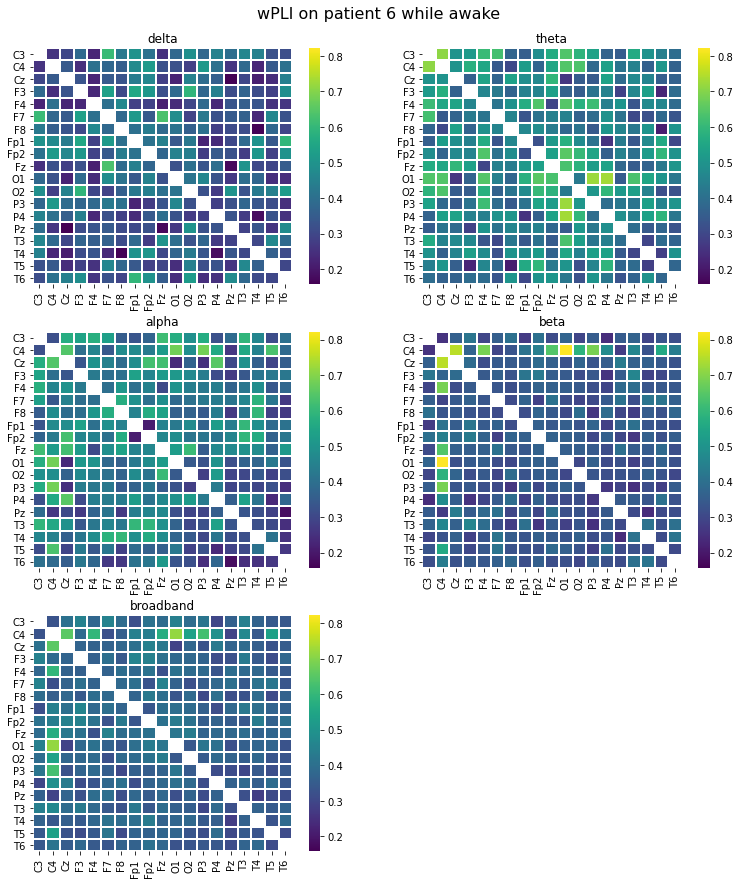

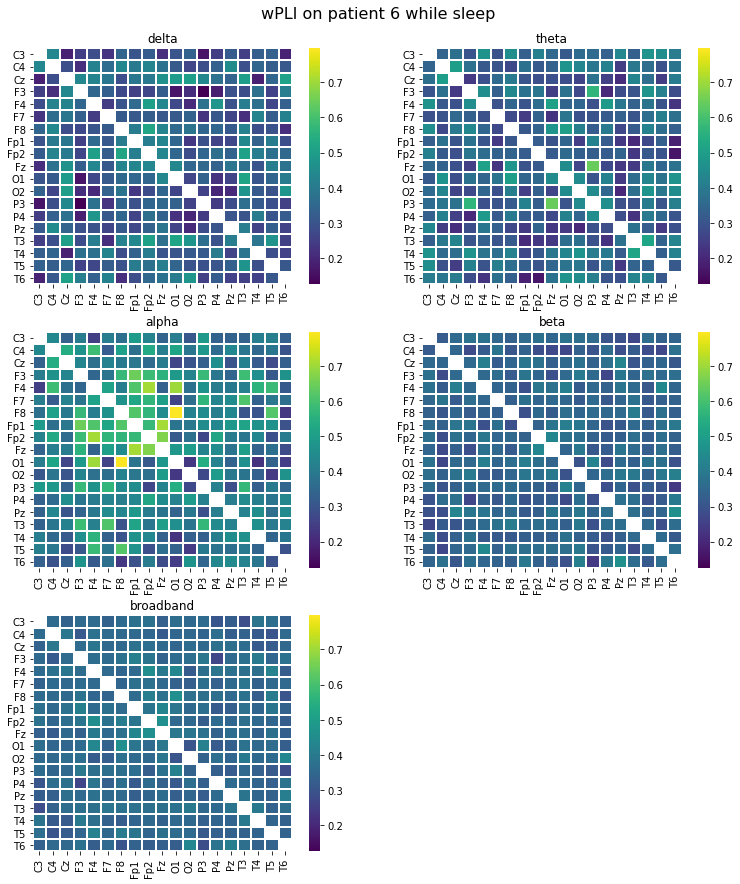

 16%|████████████▉                                                                   | 6/37 [34:26<2:54:32, 337.82s/it]

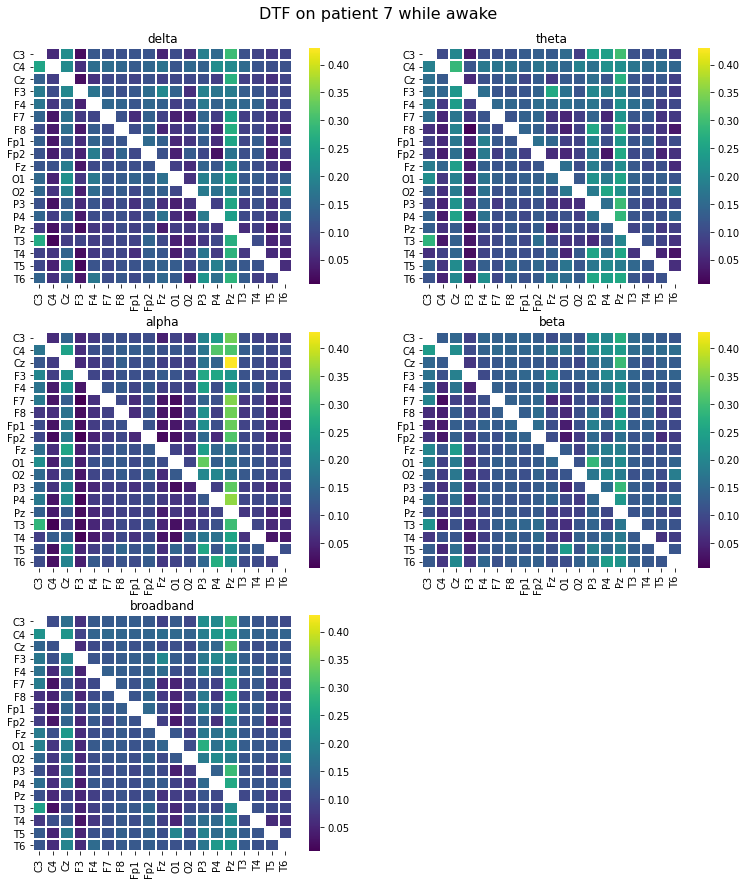

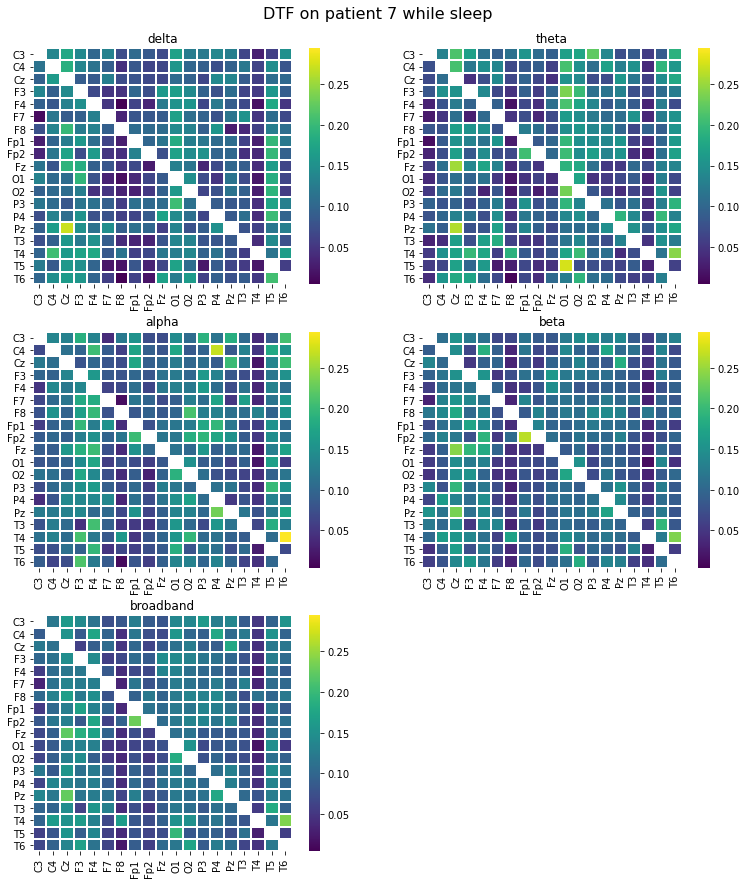

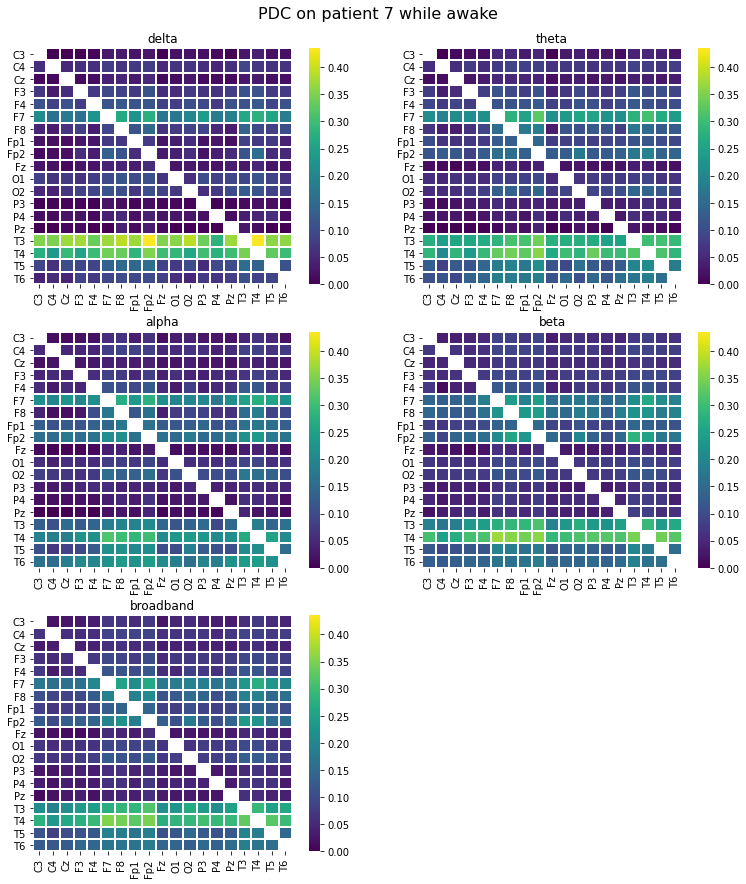

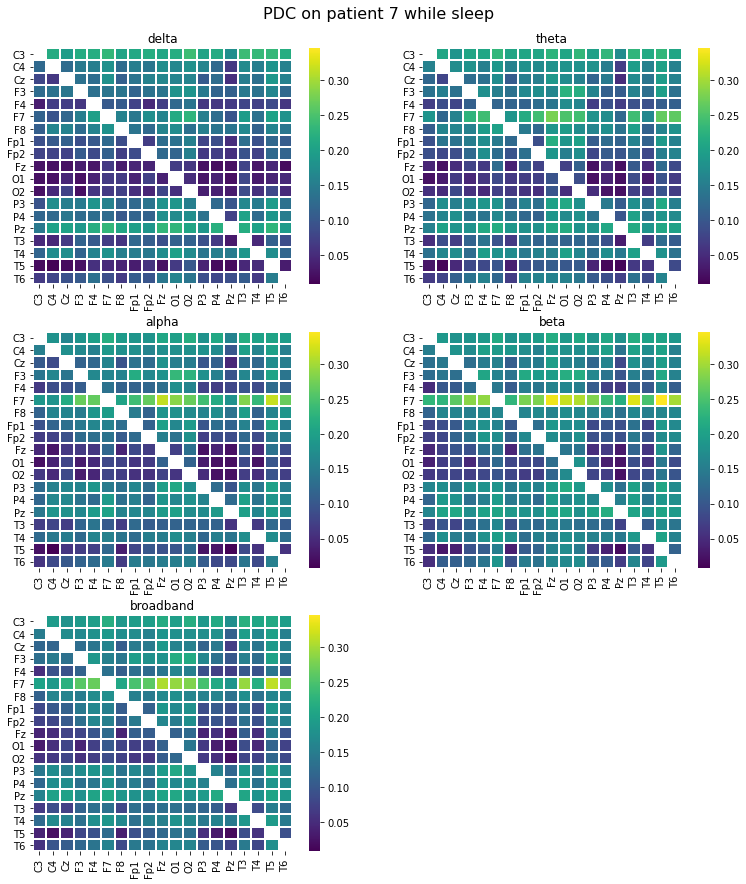

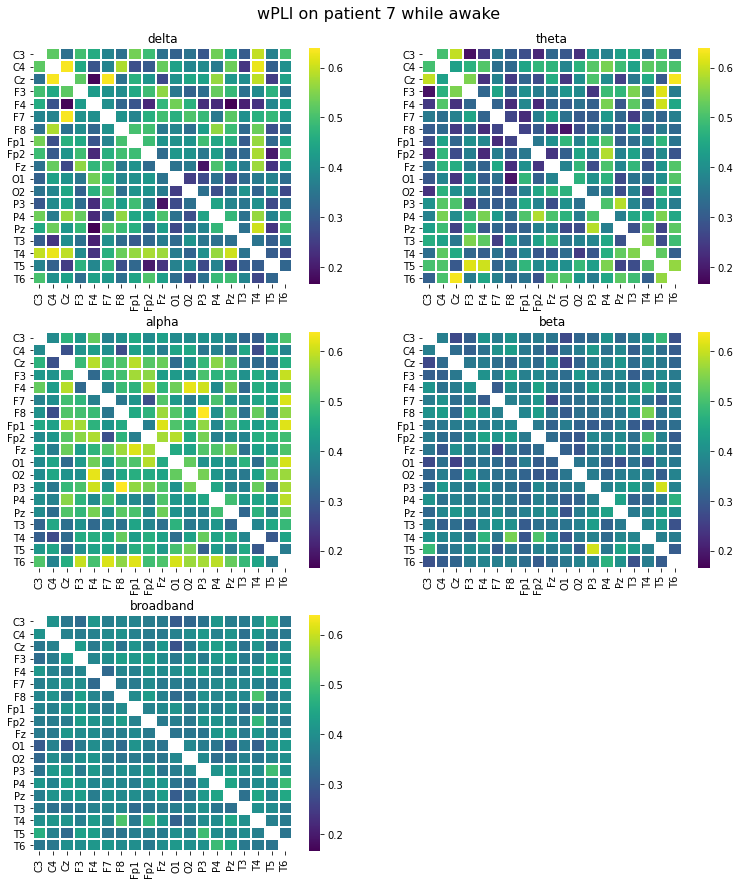

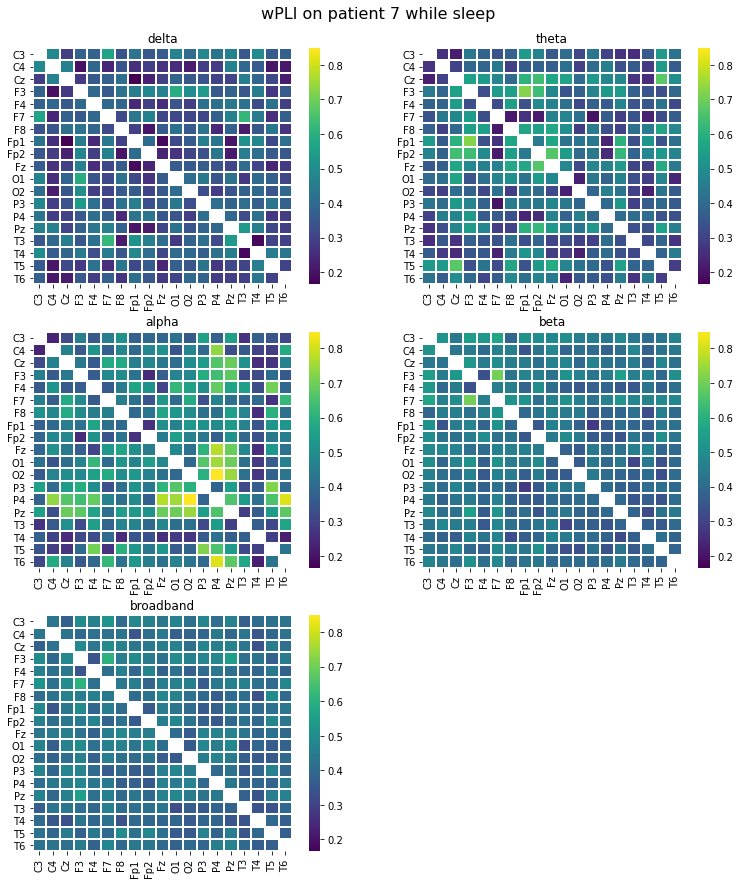

 19%|███████████████▏                                                                | 7/37 [40:02<2:48:36, 337.21s/it]

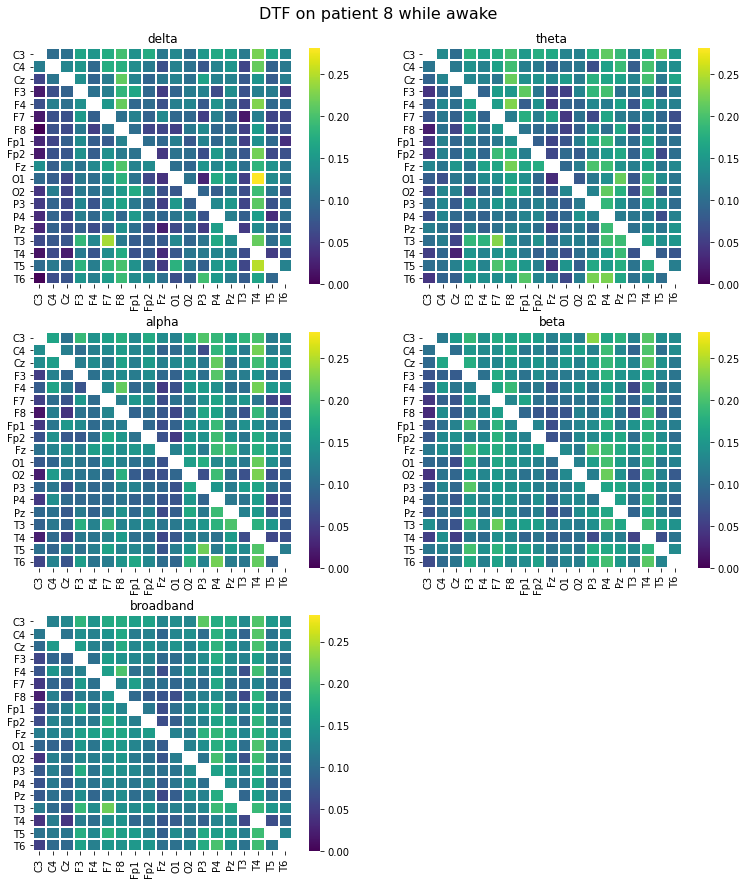

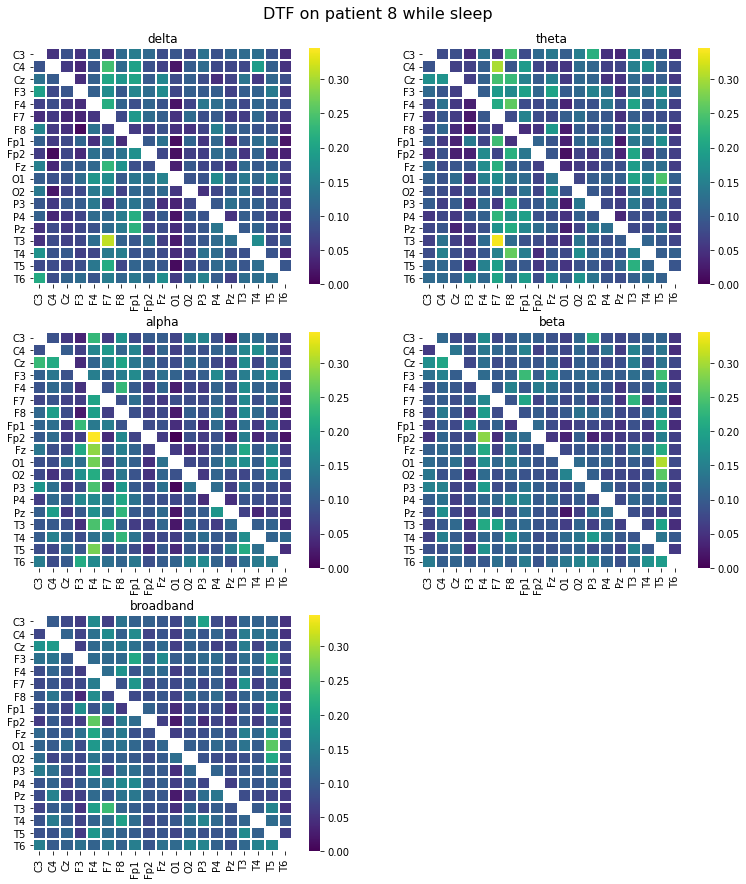

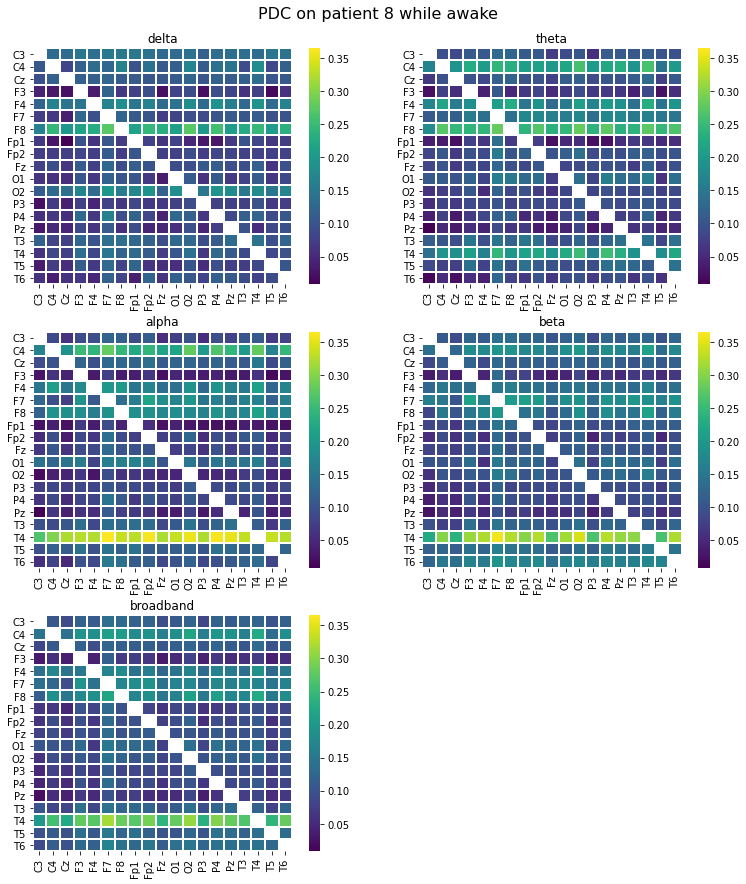

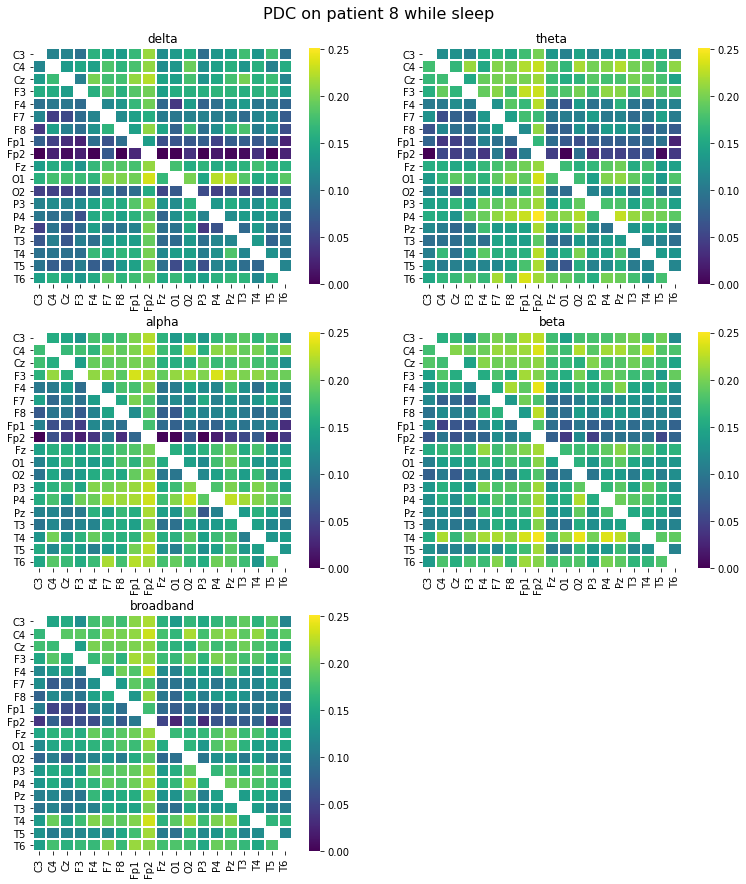

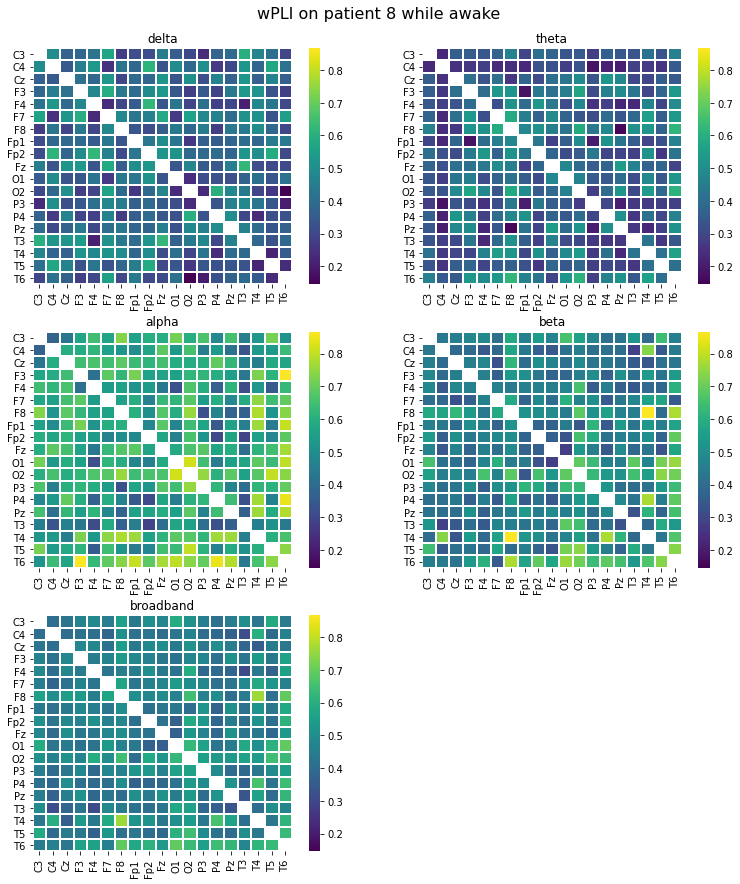

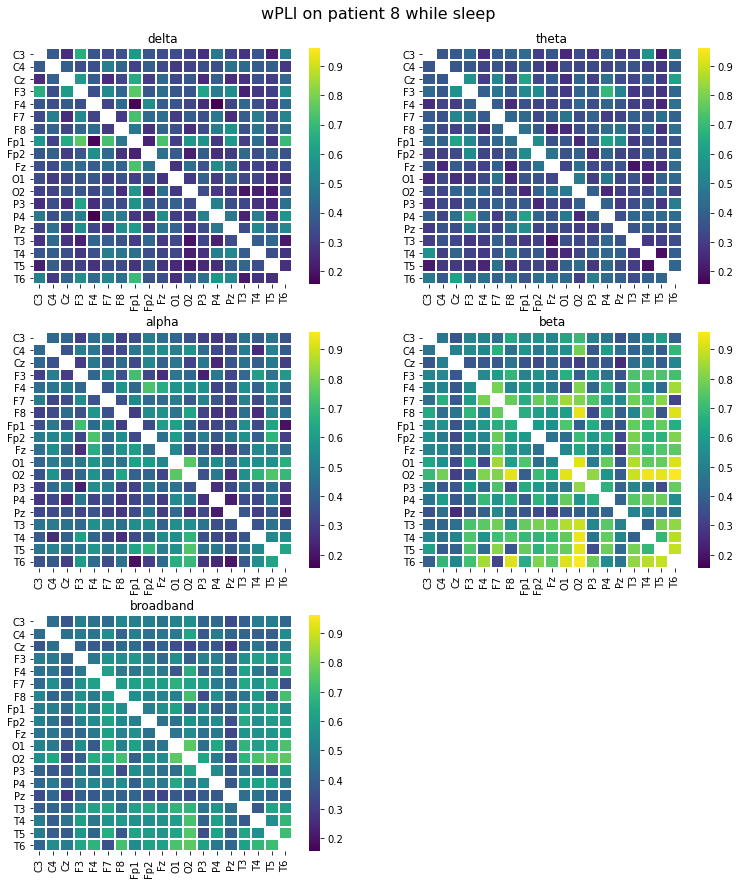

 22%|█████████████████▎                                                              | 8/37 [45:37<2:42:34, 336.37s/it]

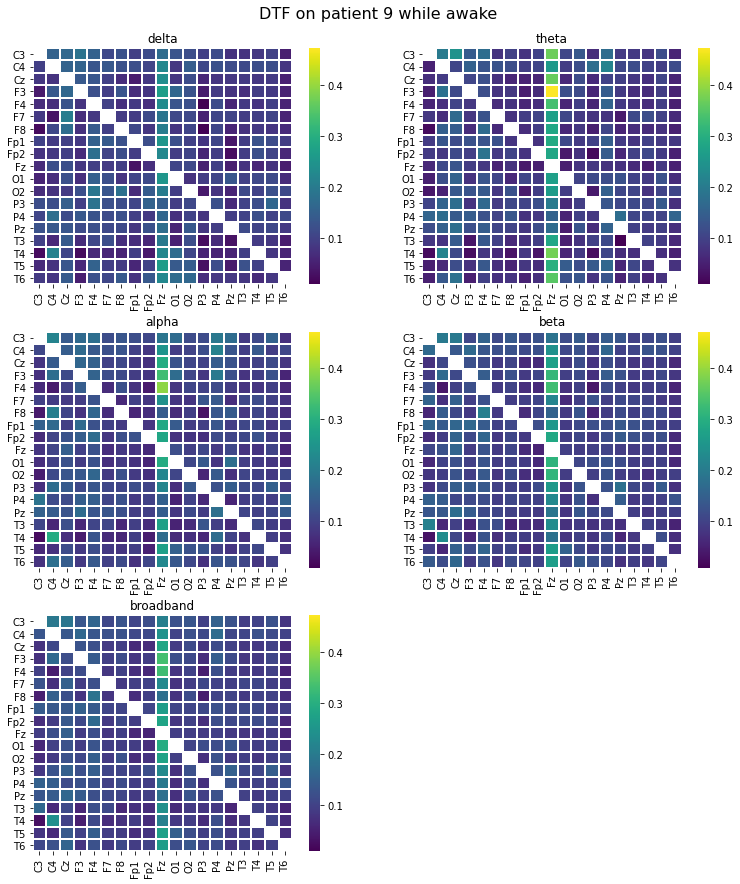

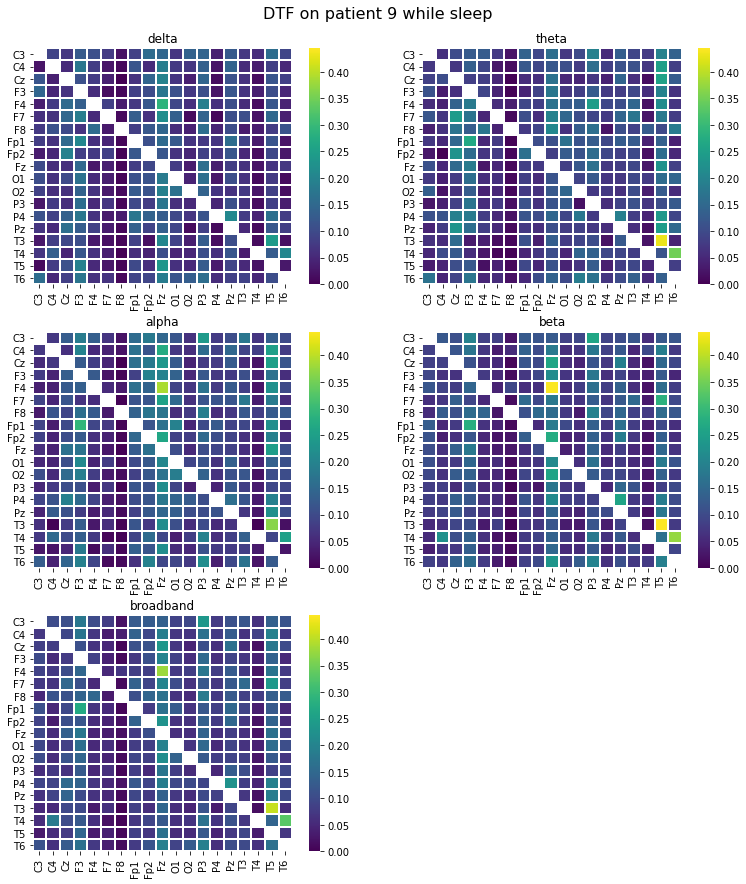

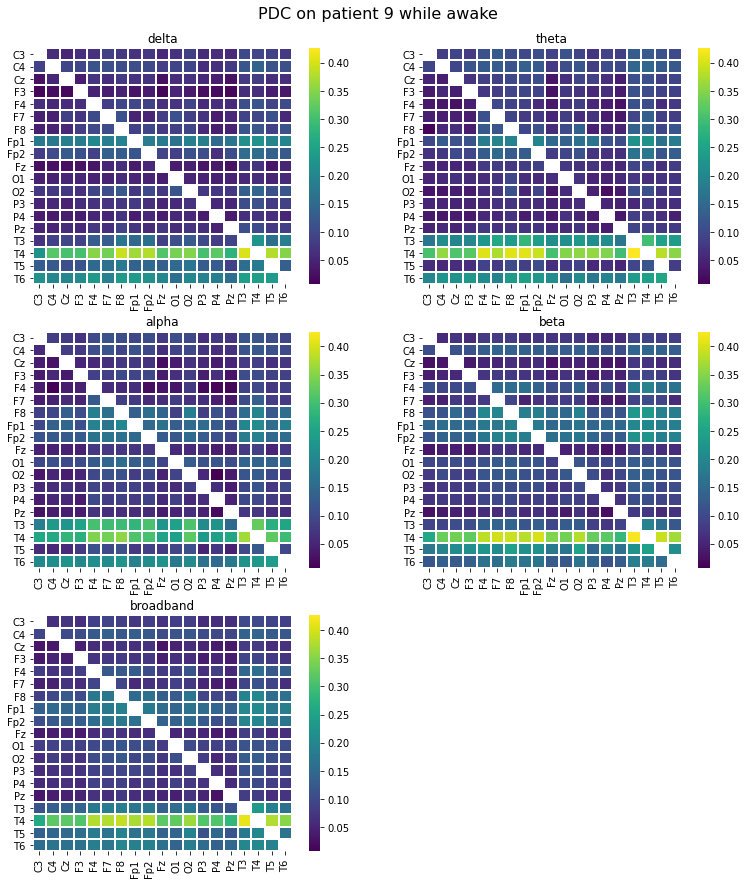

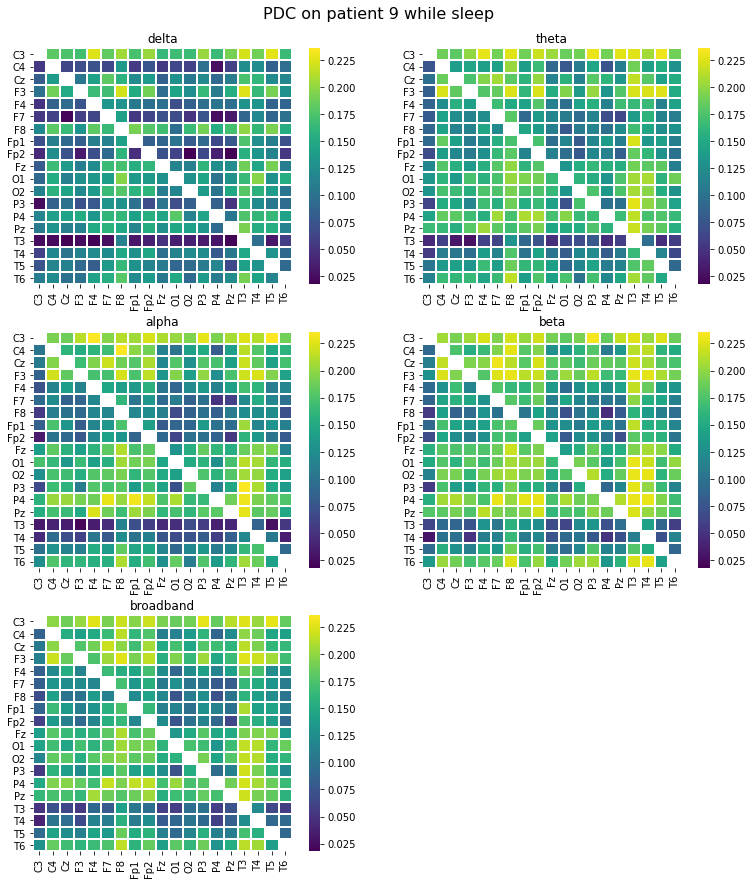

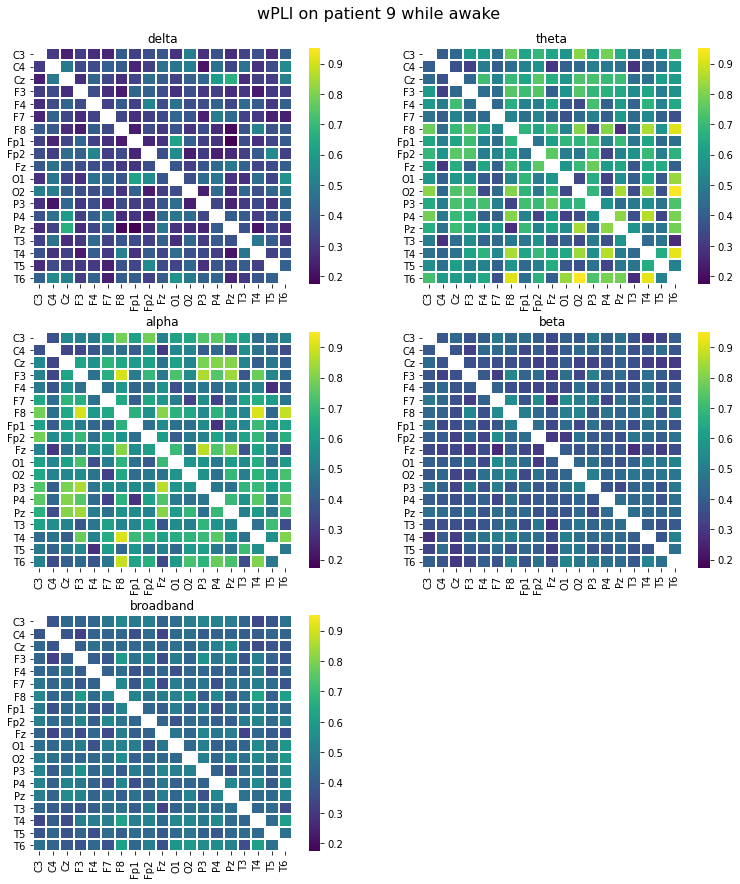

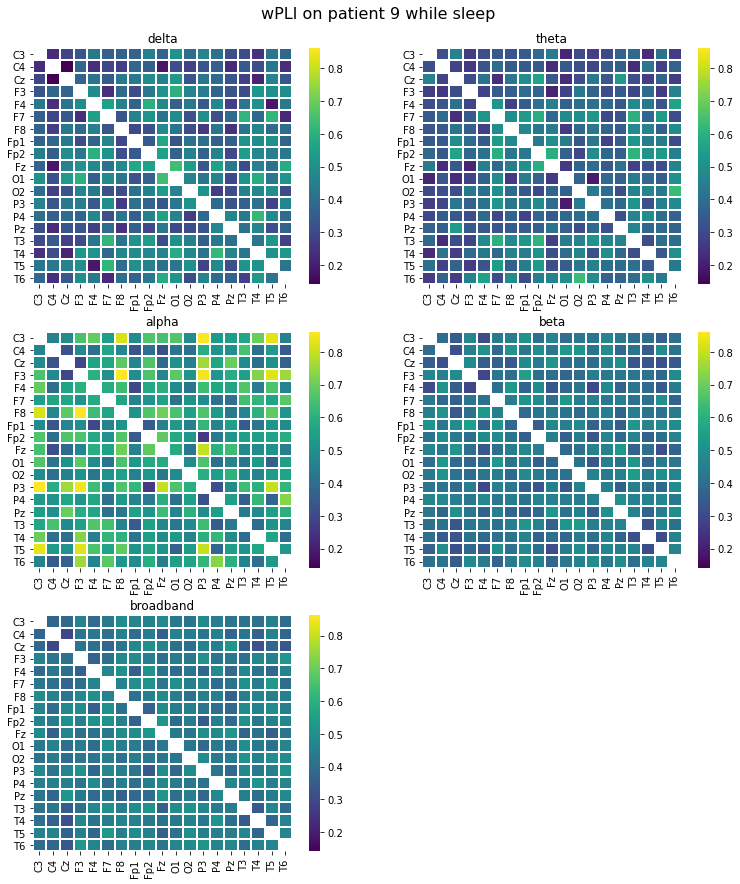

 24%|███████████████████▍                                                            | 9/37 [51:13<2:37:00, 336.46s/it]

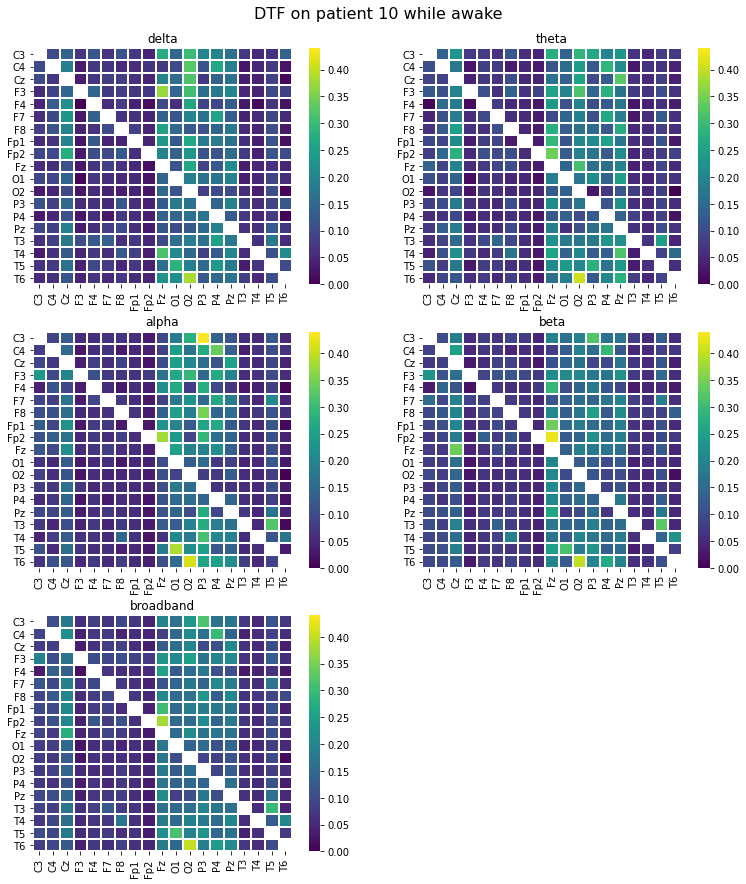

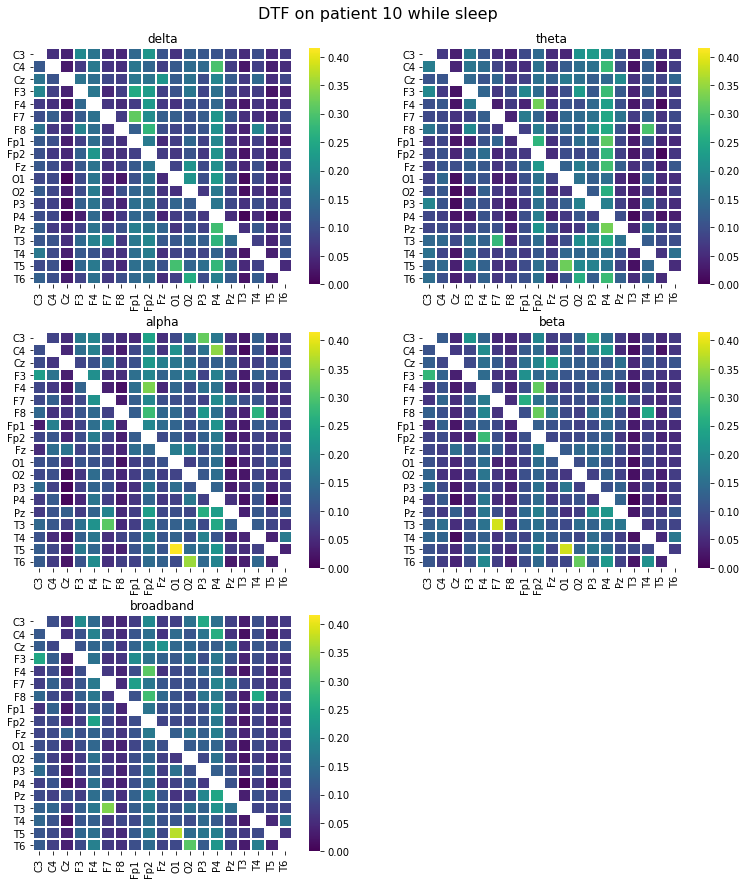

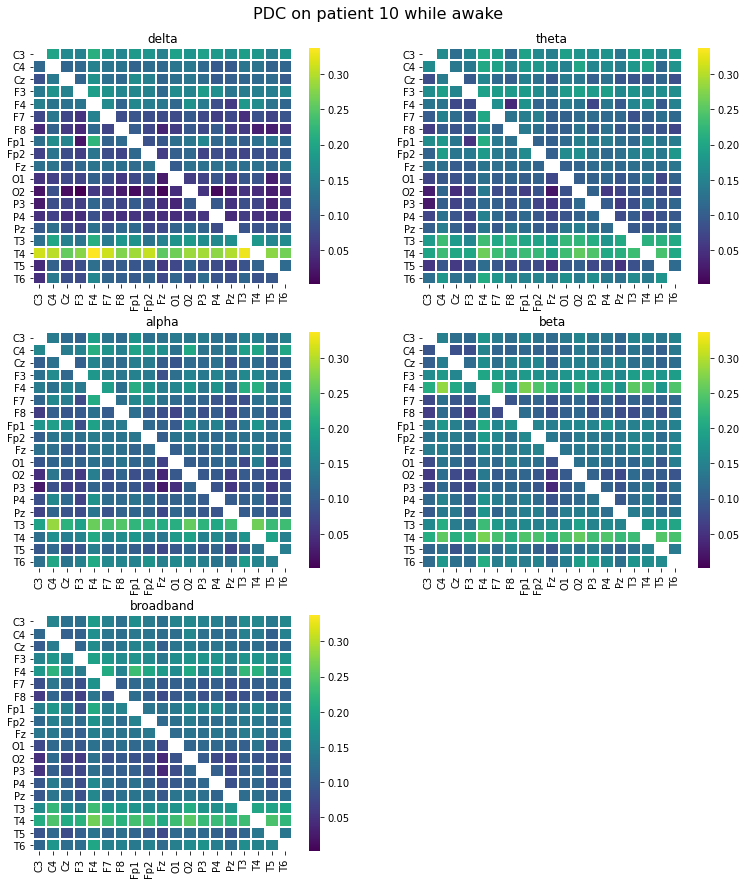

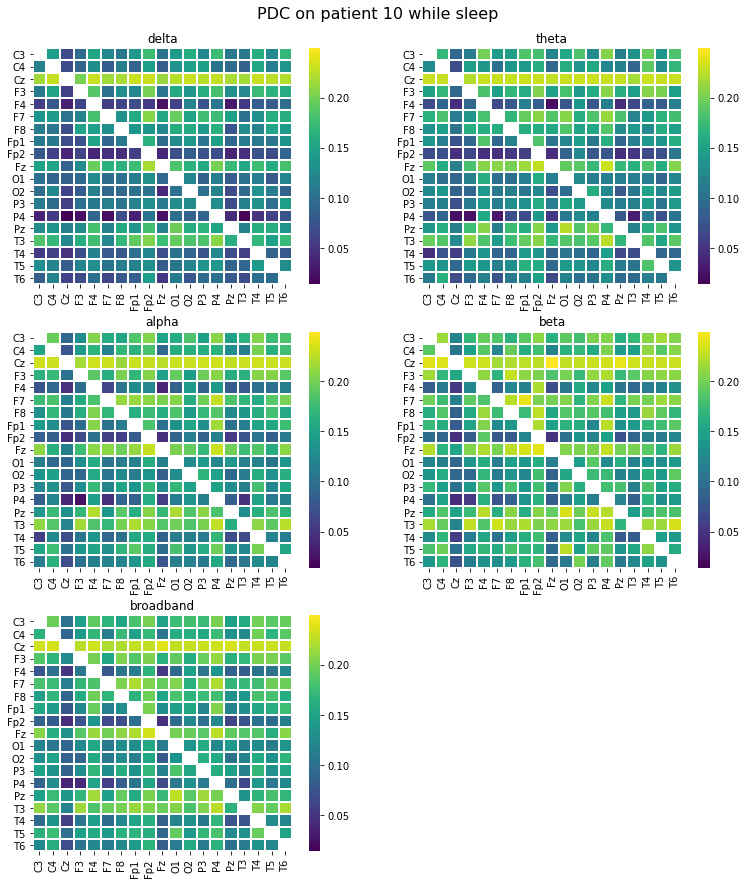

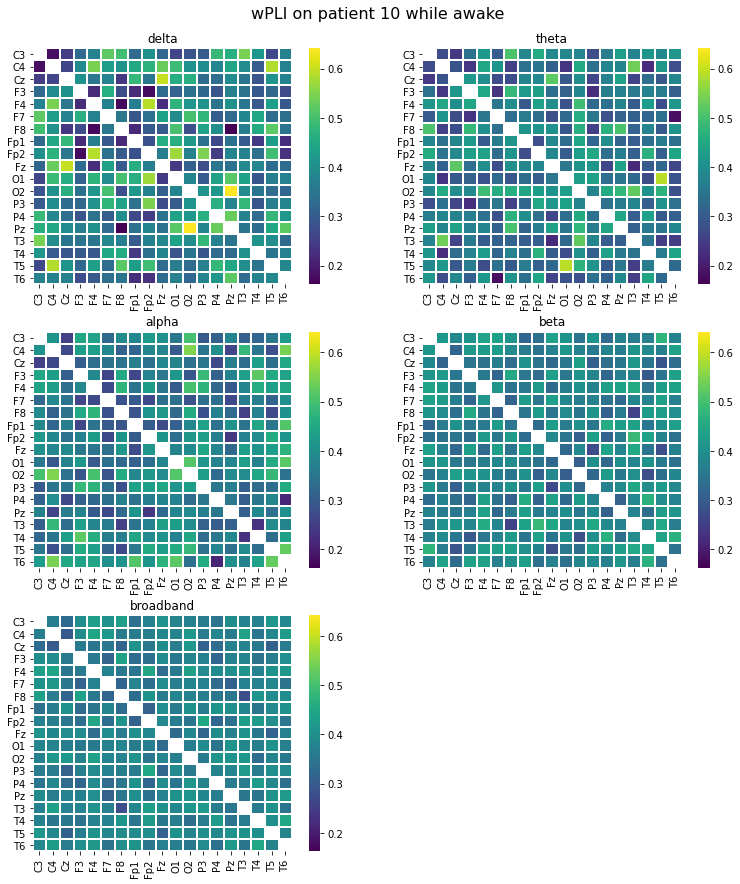

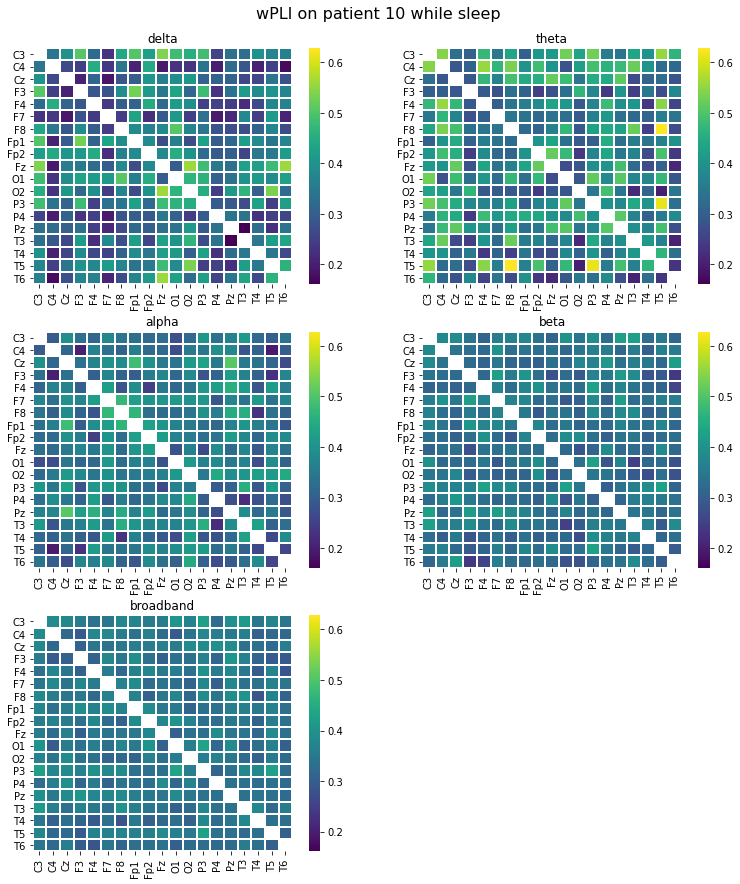

 27%|█████████████████████▎                                                         | 10/37 [56:34<2:29:12, 331.59s/it]

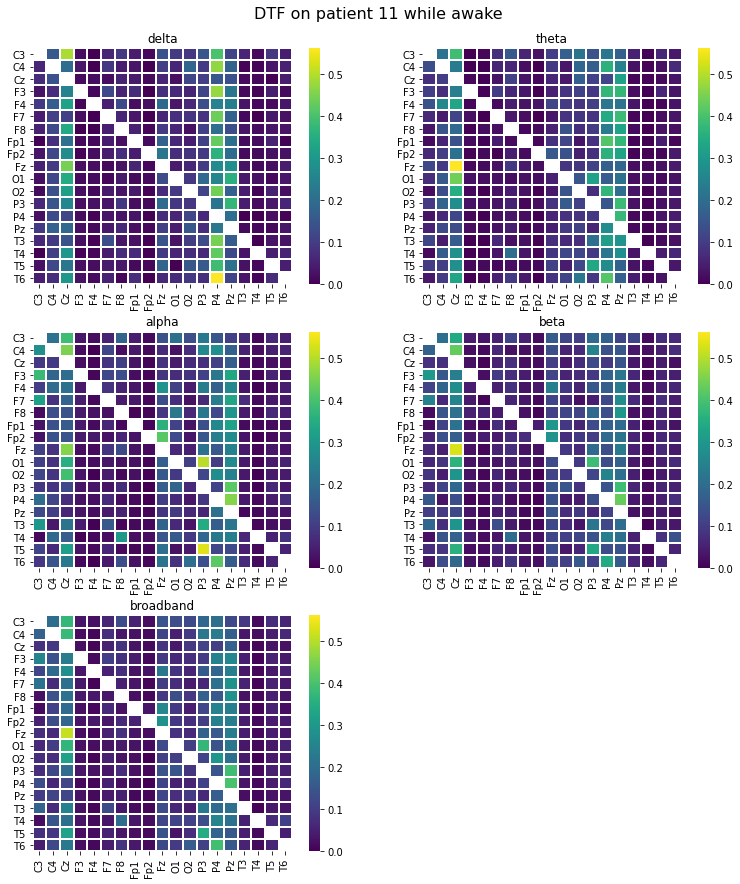

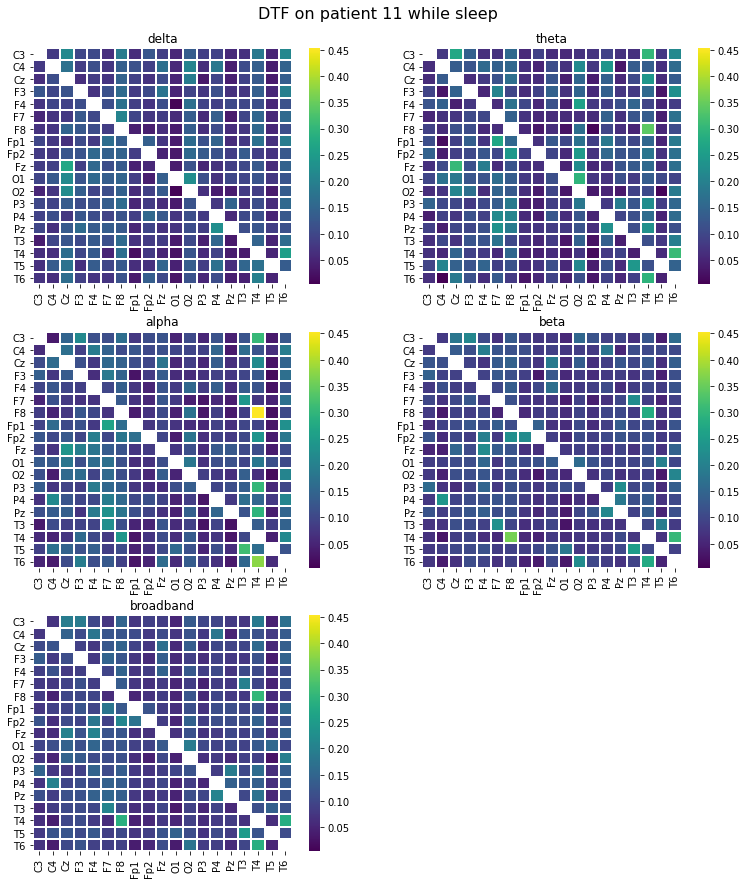

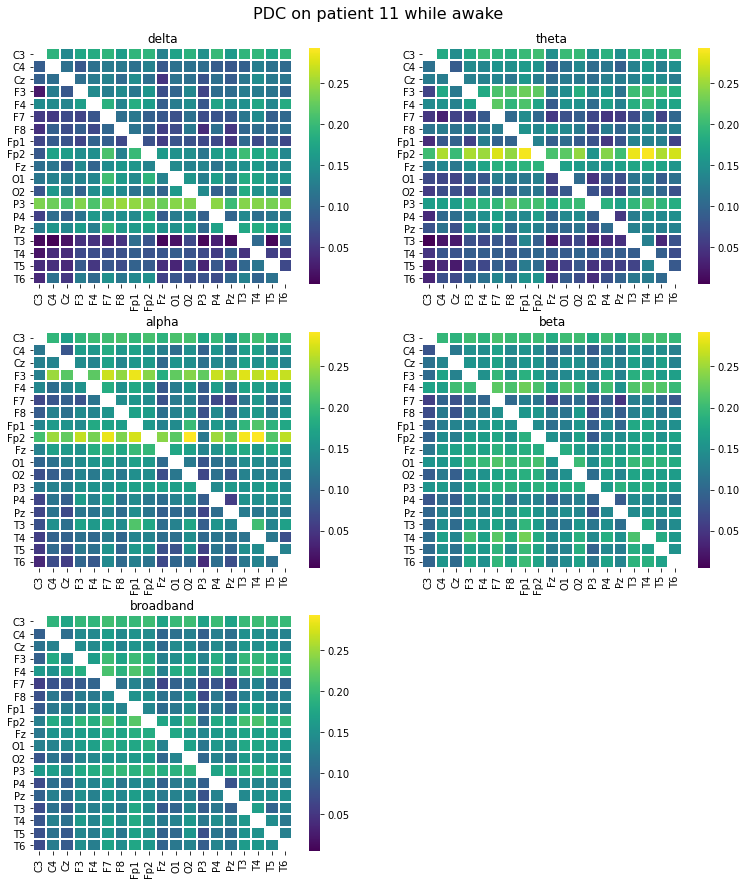

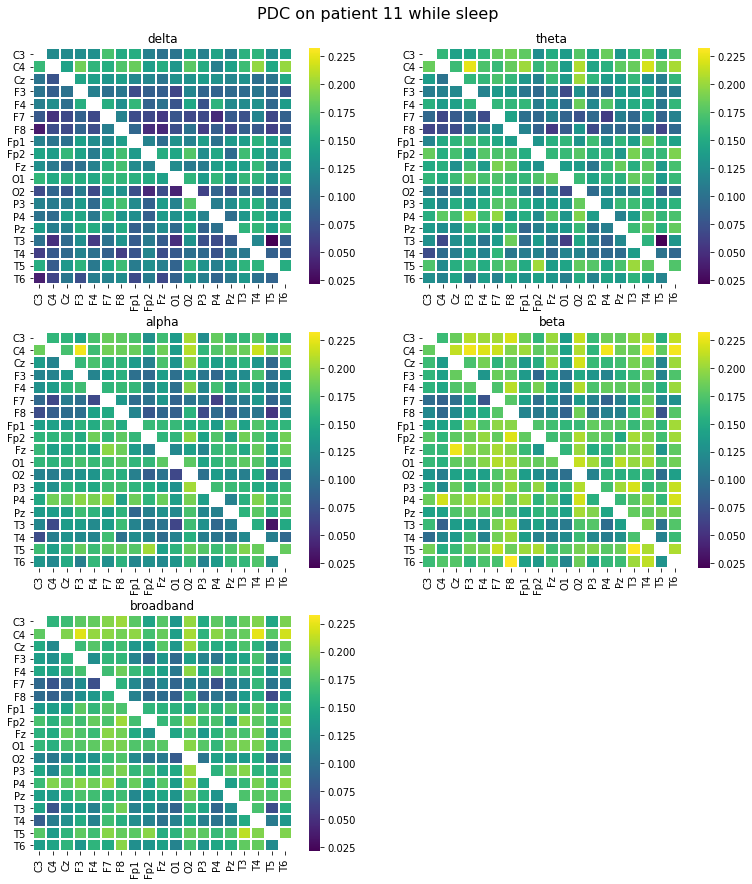

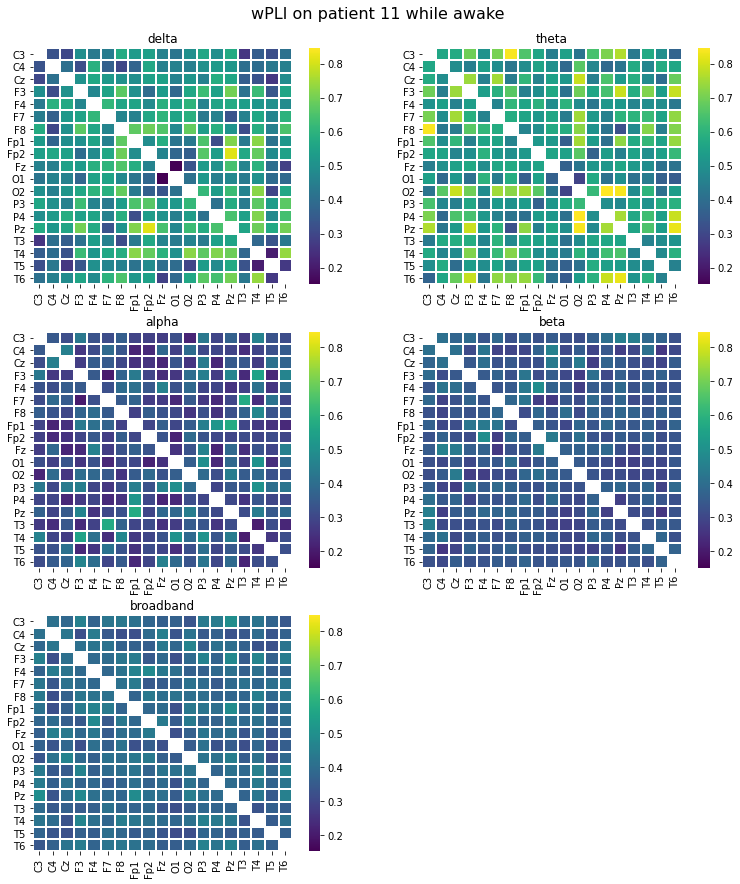

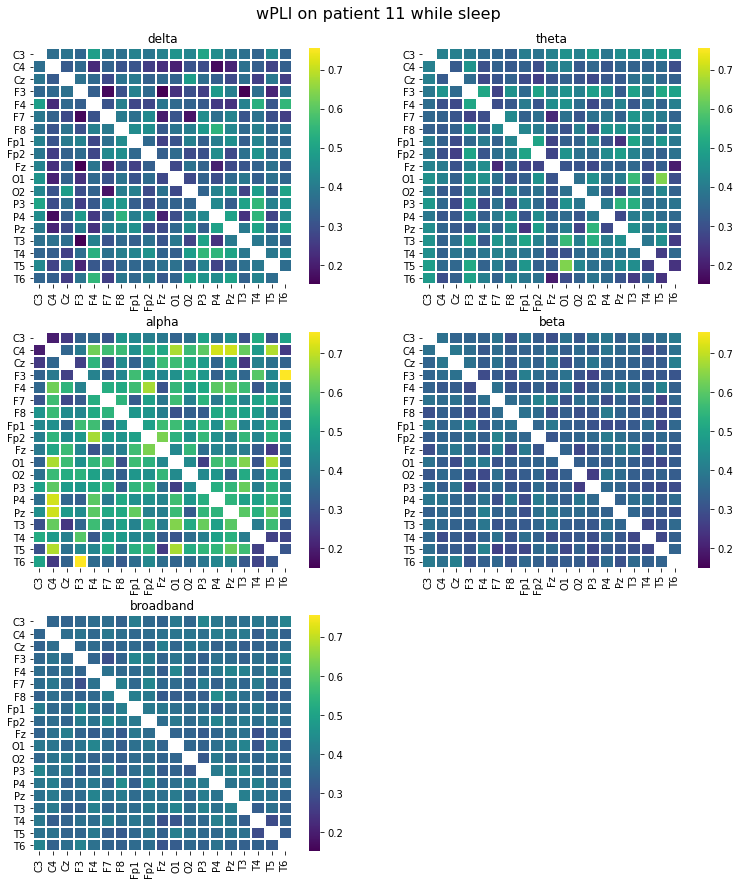

 30%|██████████████████████▉                                                      | 11/37 [1:02:09<2:24:08, 332.64s/it]

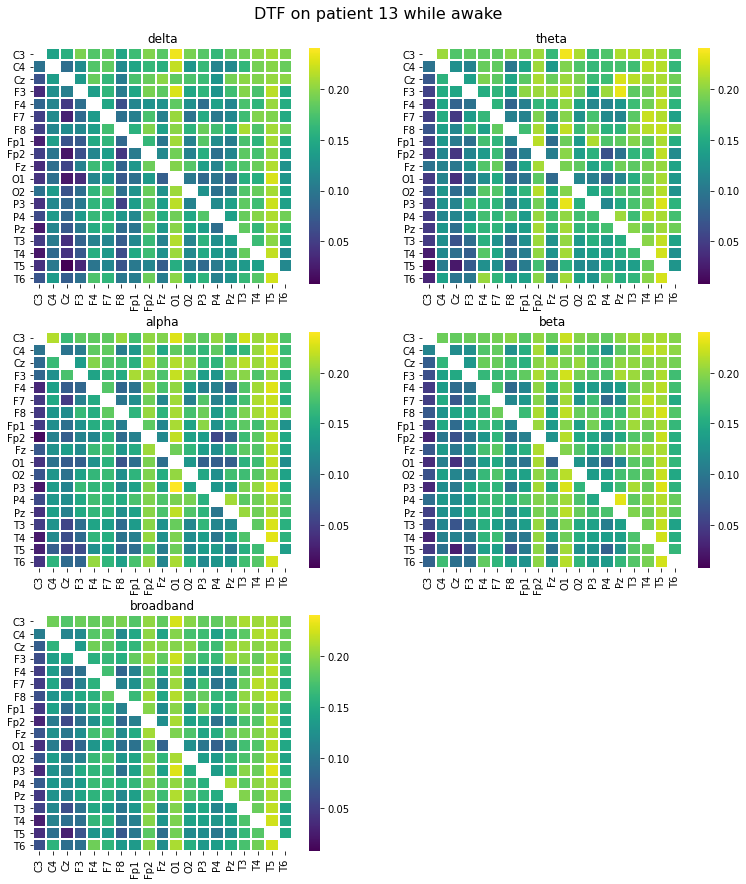

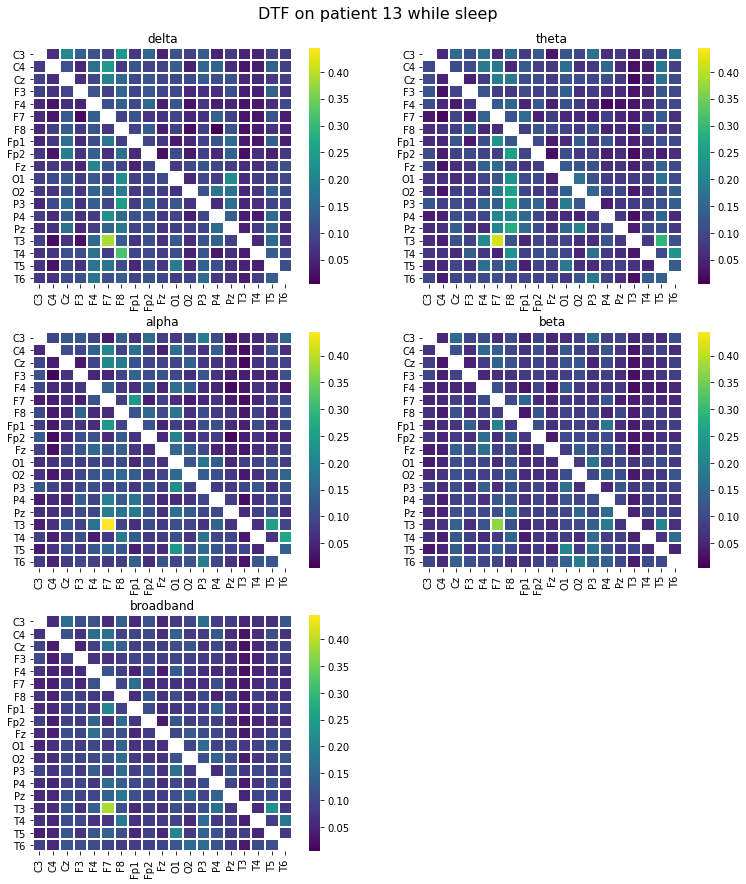

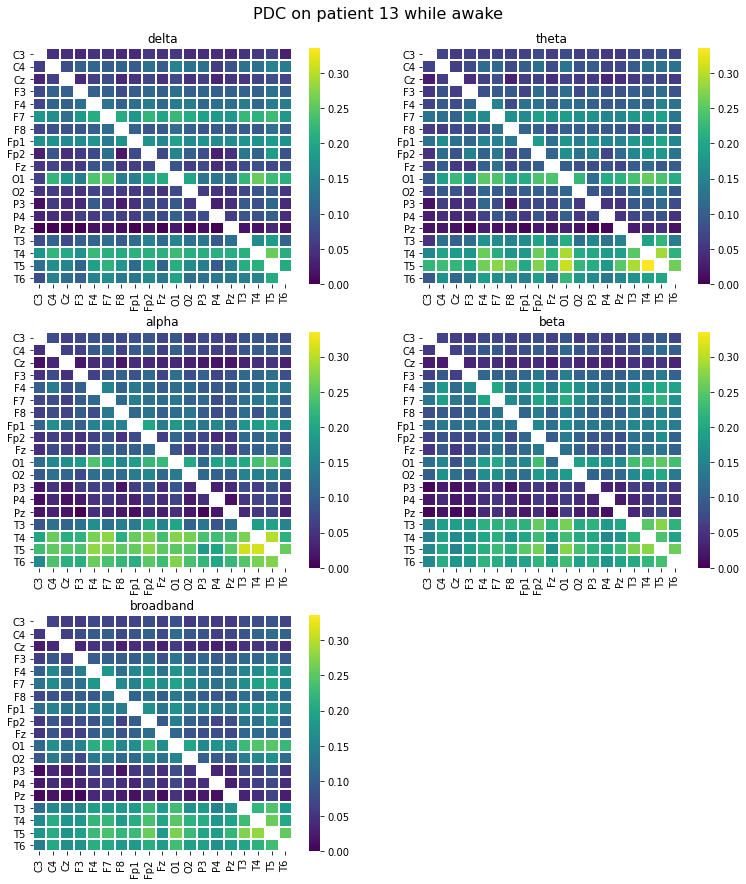

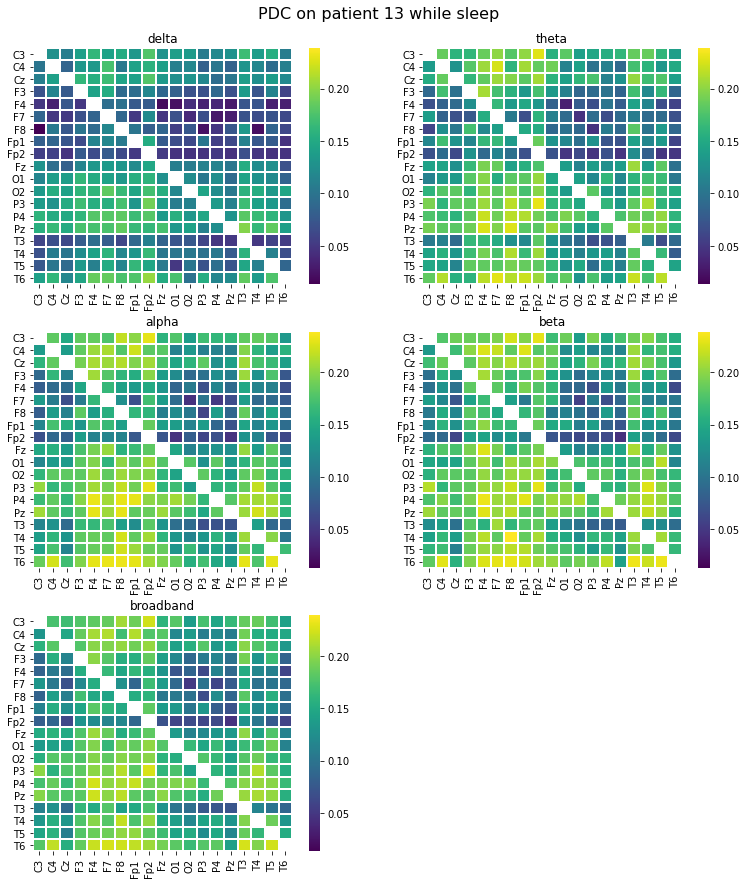

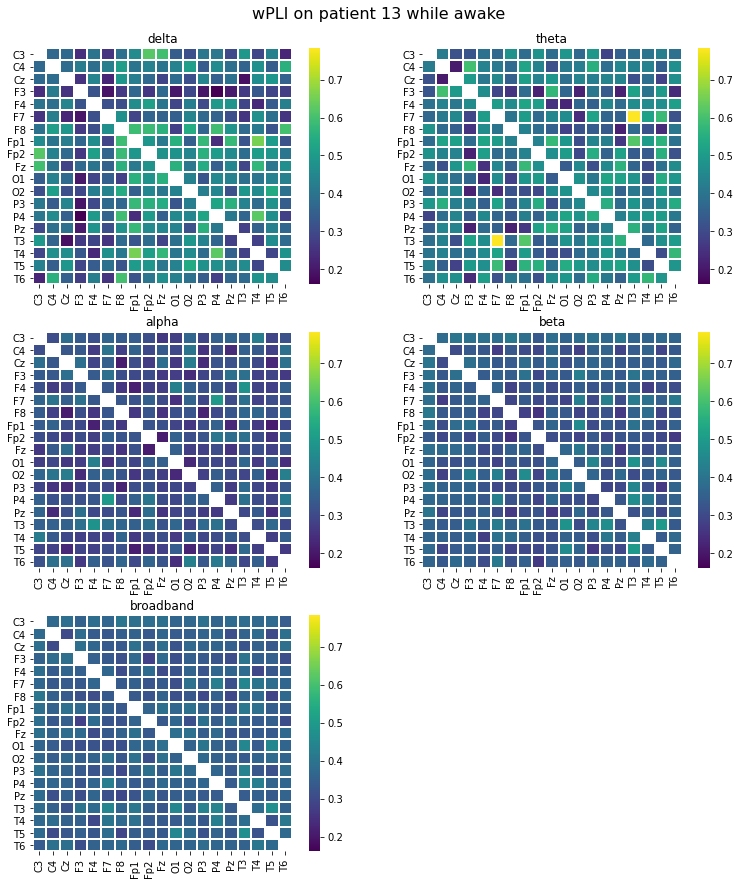

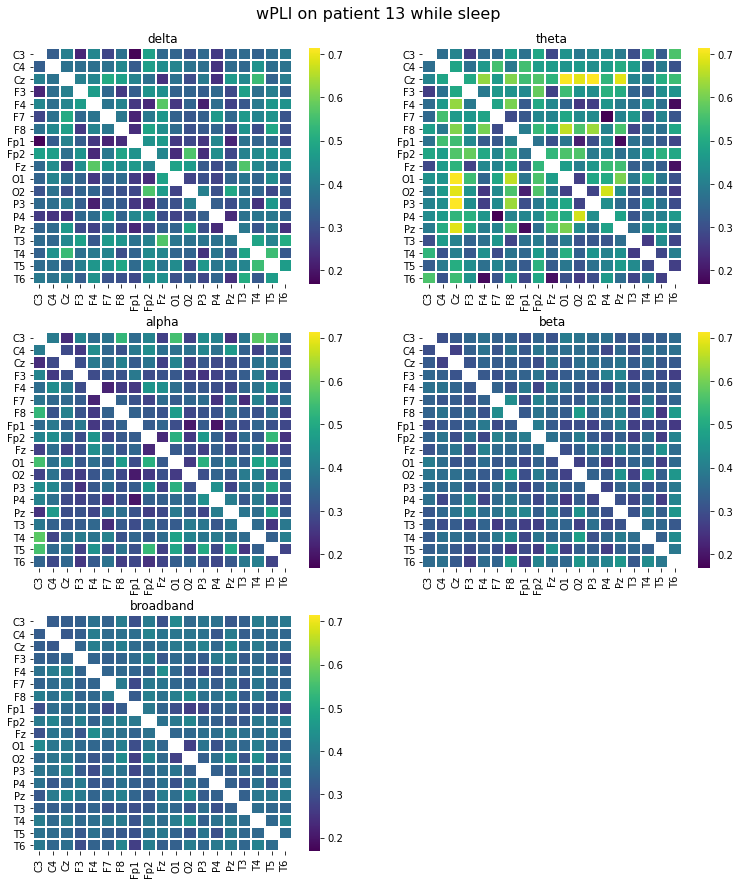

 32%|████████████████████████▉                                                    | 12/37 [1:07:41<2:18:28, 332.33s/it]

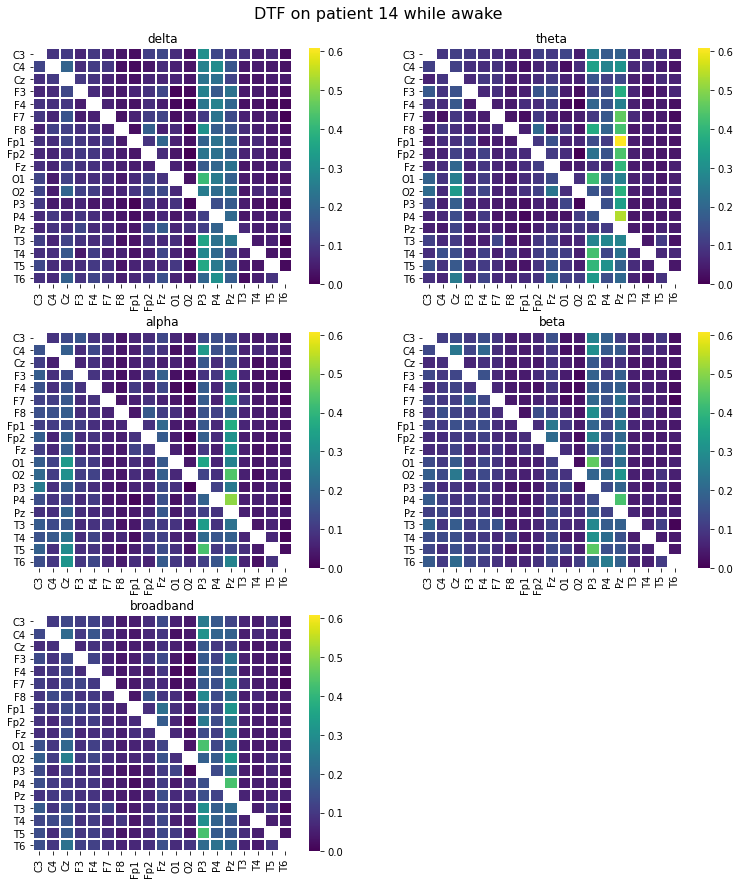

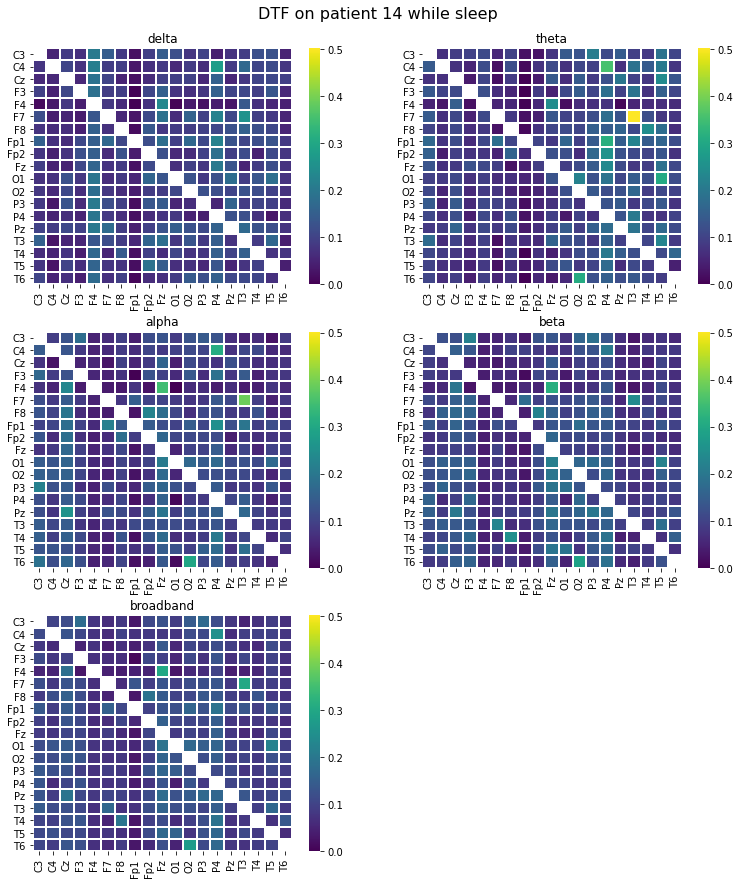

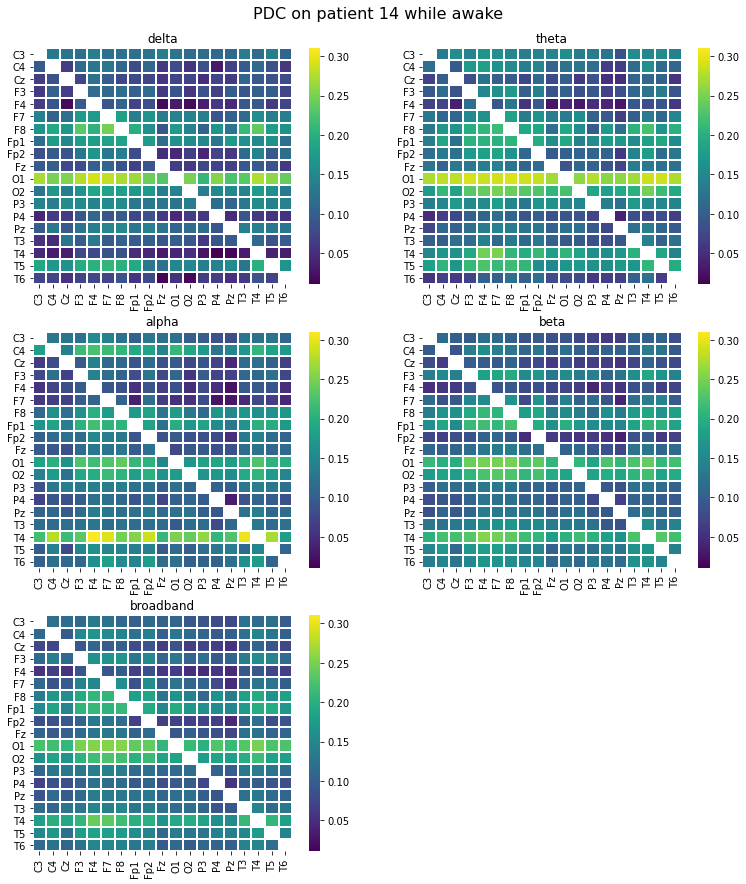

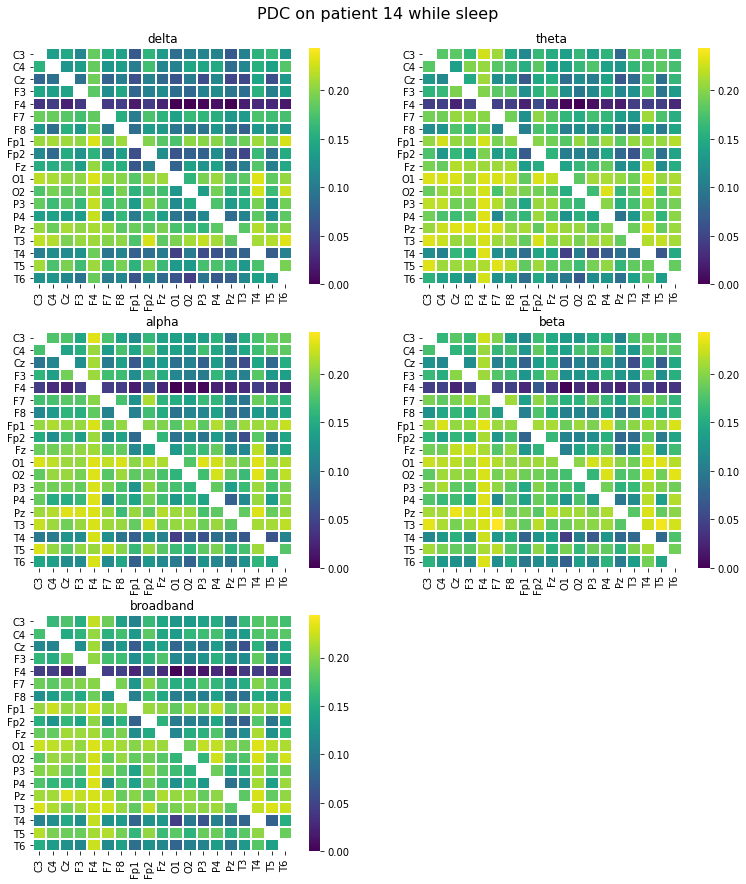

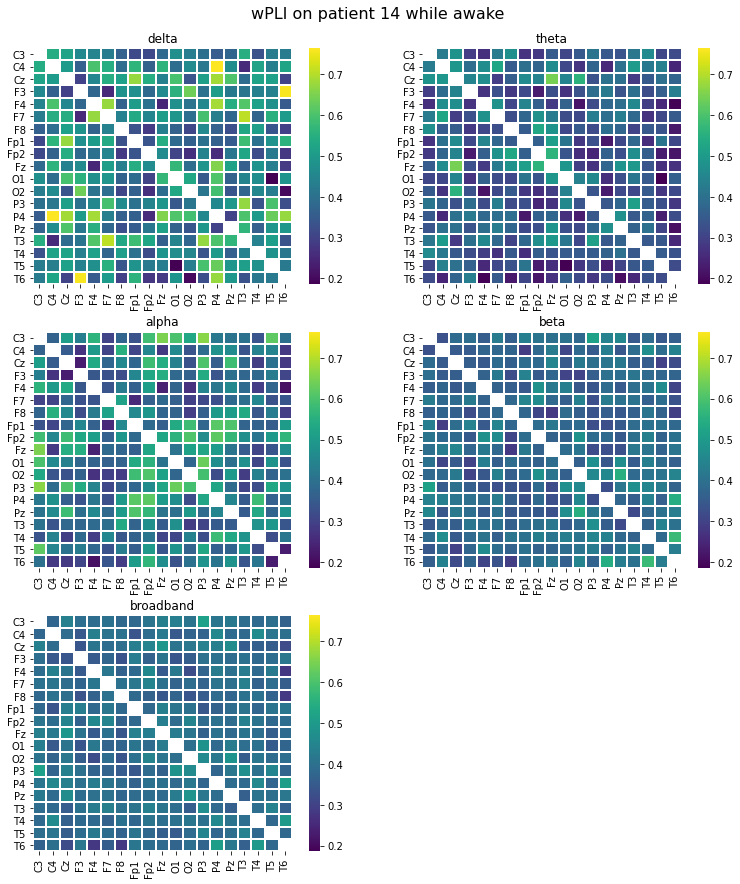

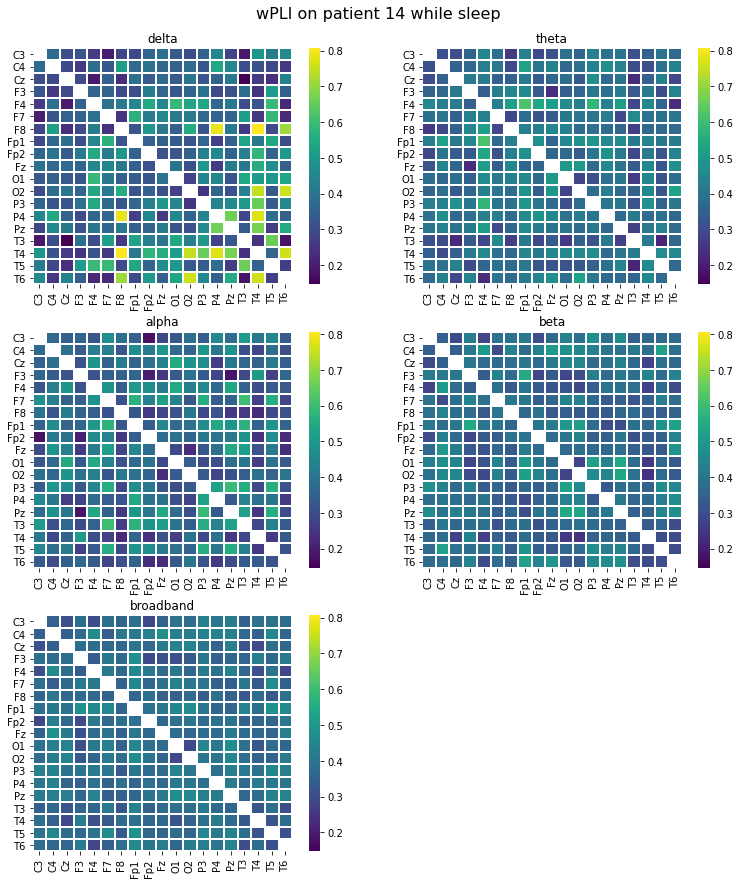

 35%|███████████████████████████                                                  | 13/37 [1:13:15<2:13:11, 332.98s/it]

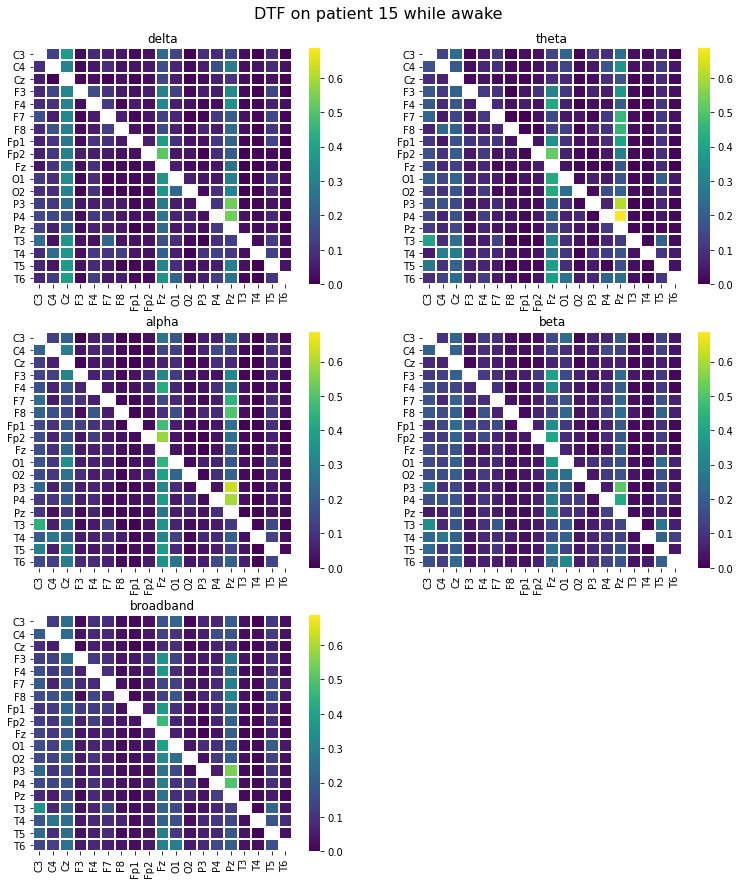

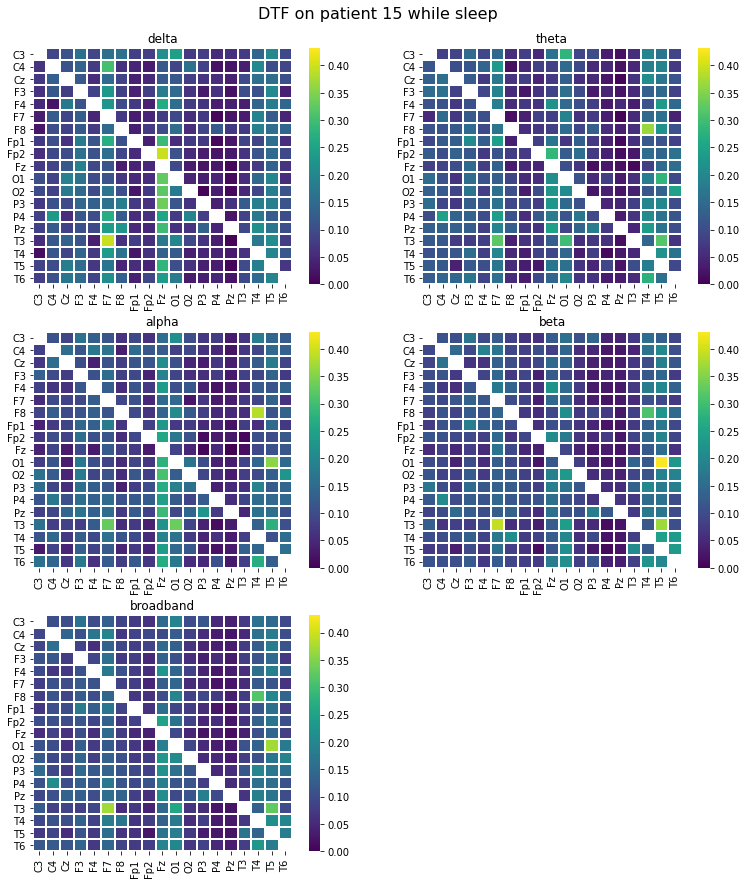

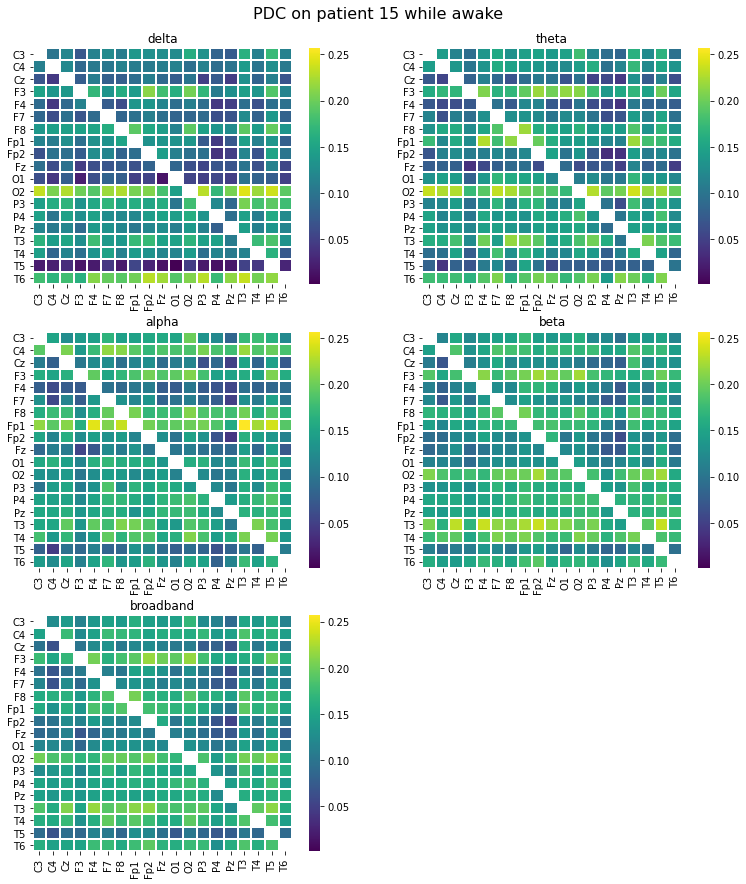

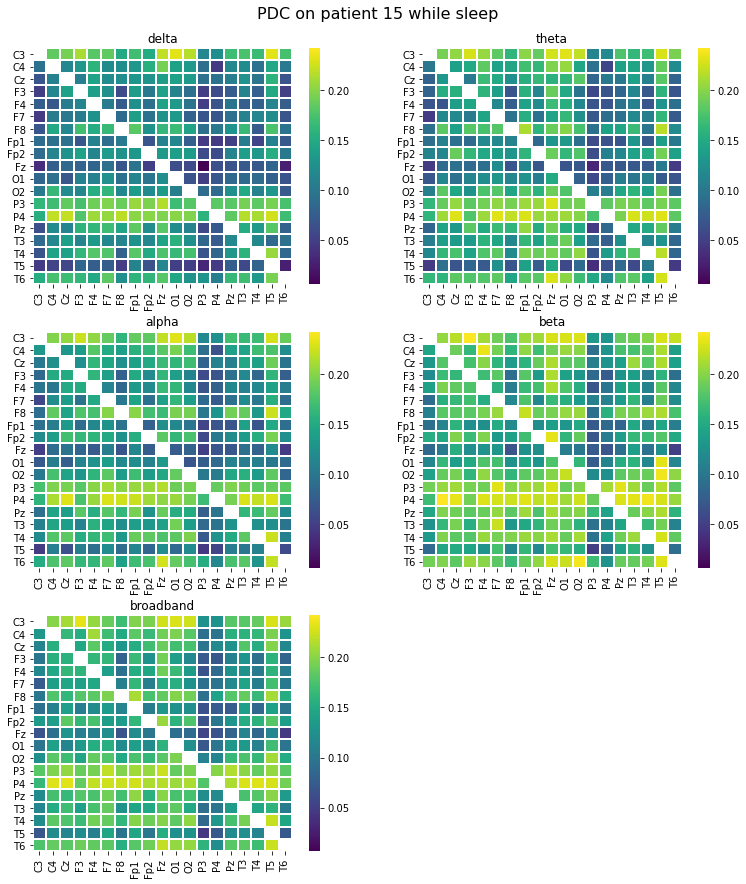

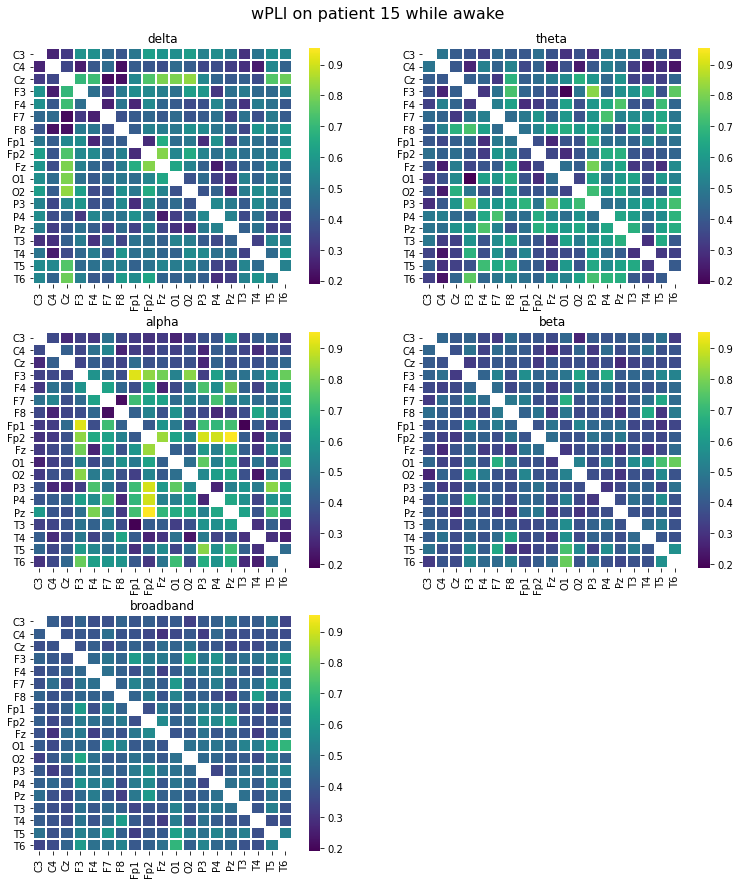

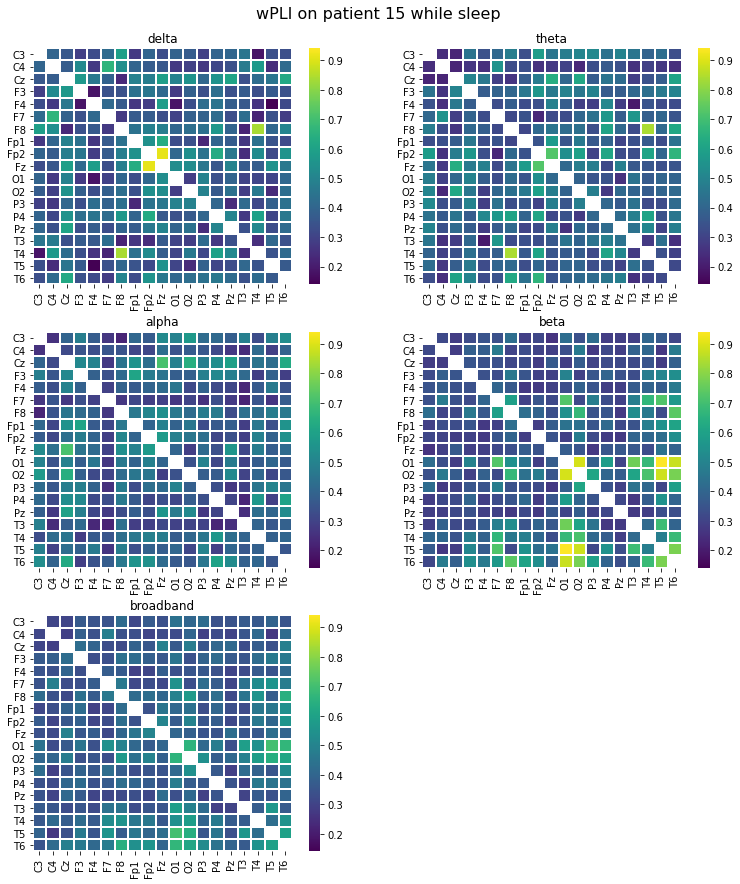

 38%|█████████████████████████████▏                                               | 14/37 [1:18:51<2:07:59, 333.90s/it]

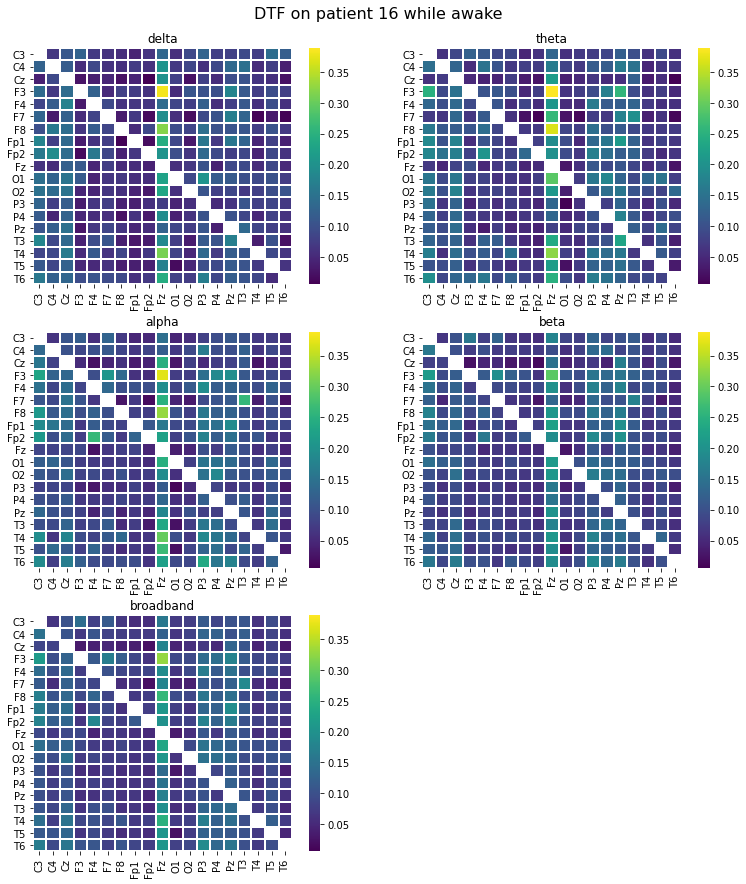

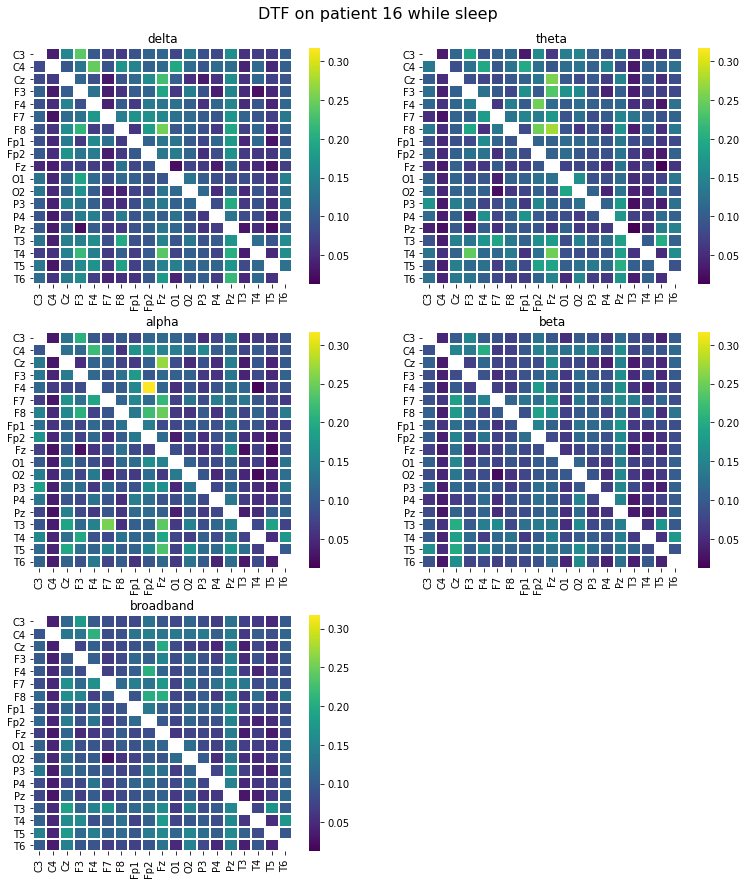

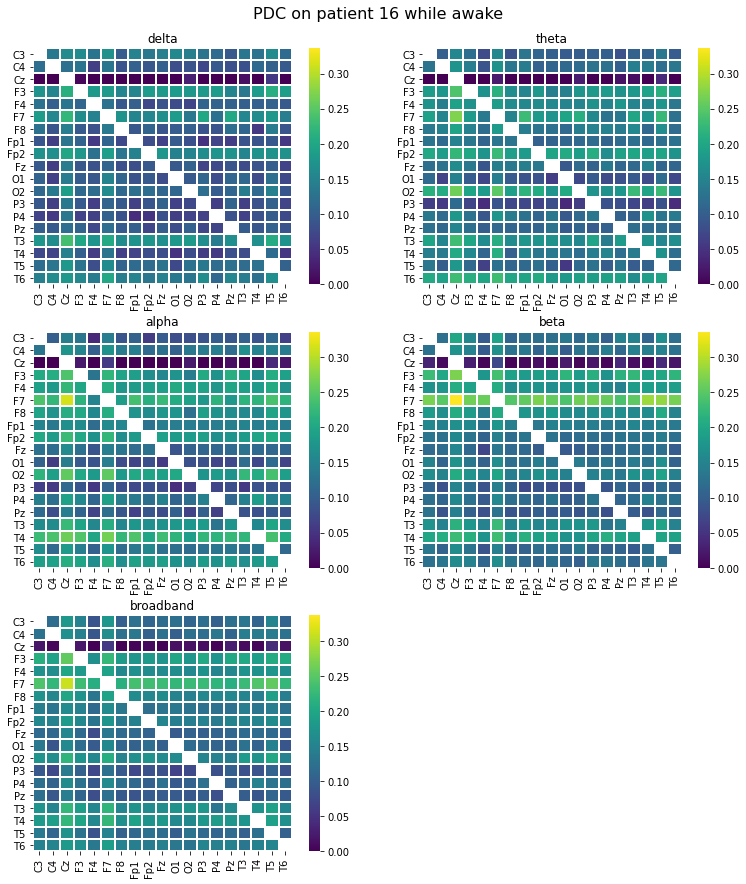

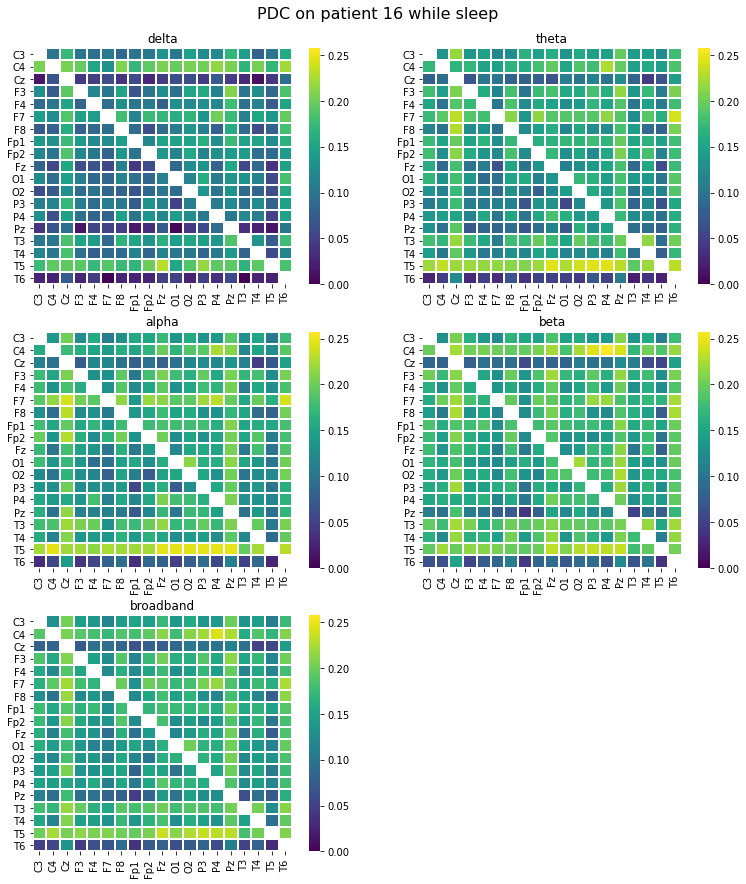

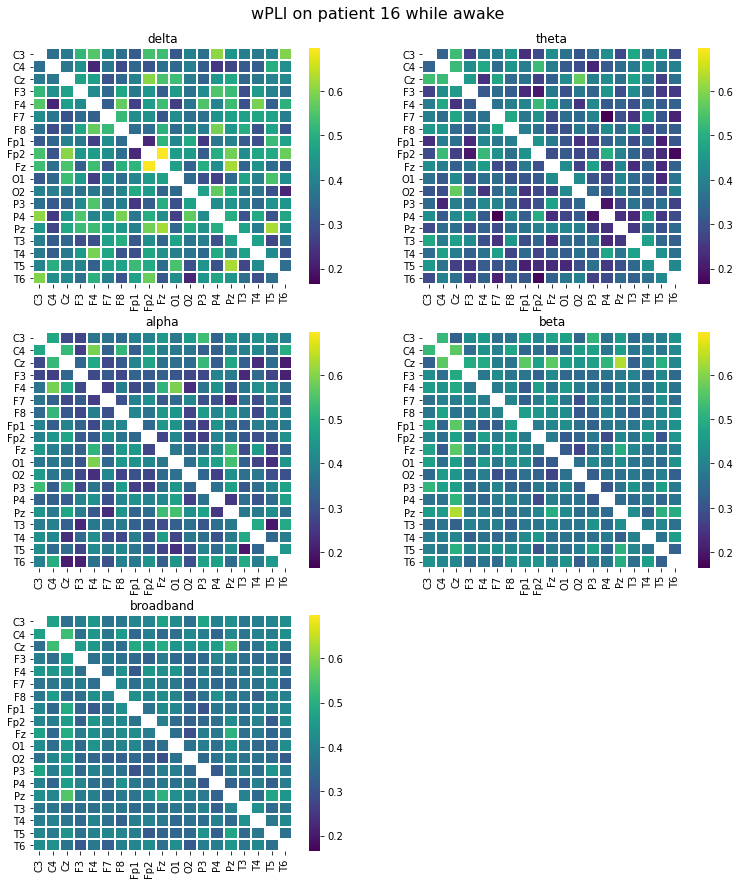

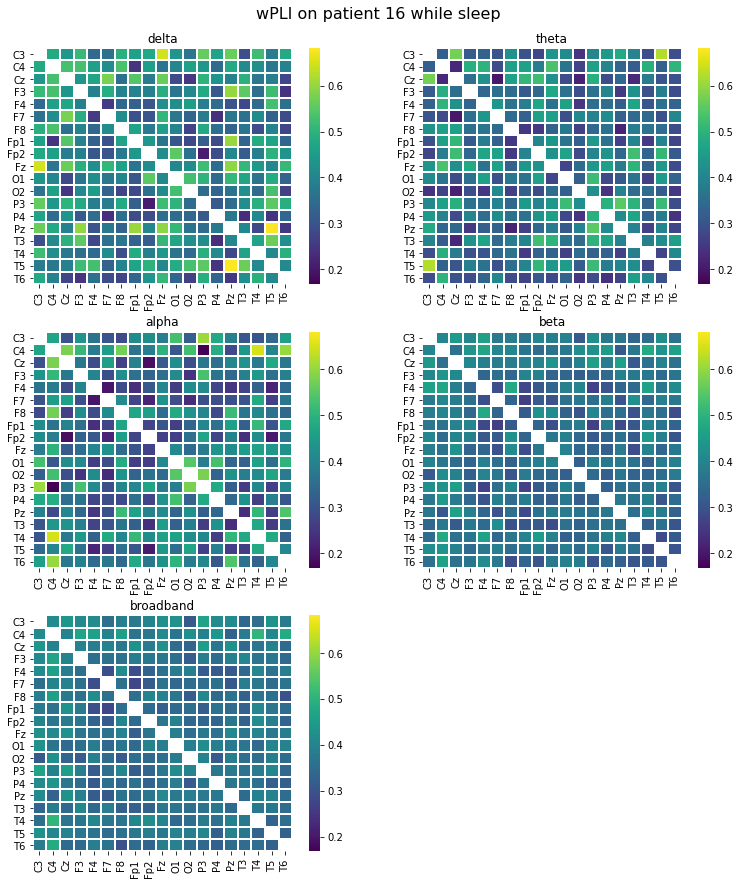

 41%|███████████████████████████████▏                                             | 15/37 [1:24:16<2:01:23, 331.08s/it]

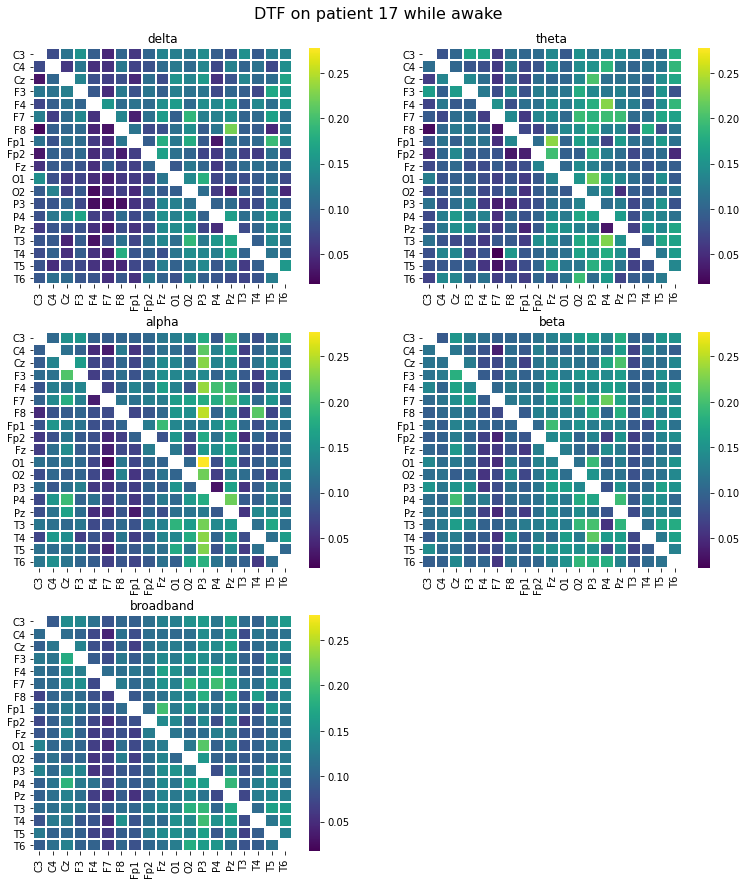

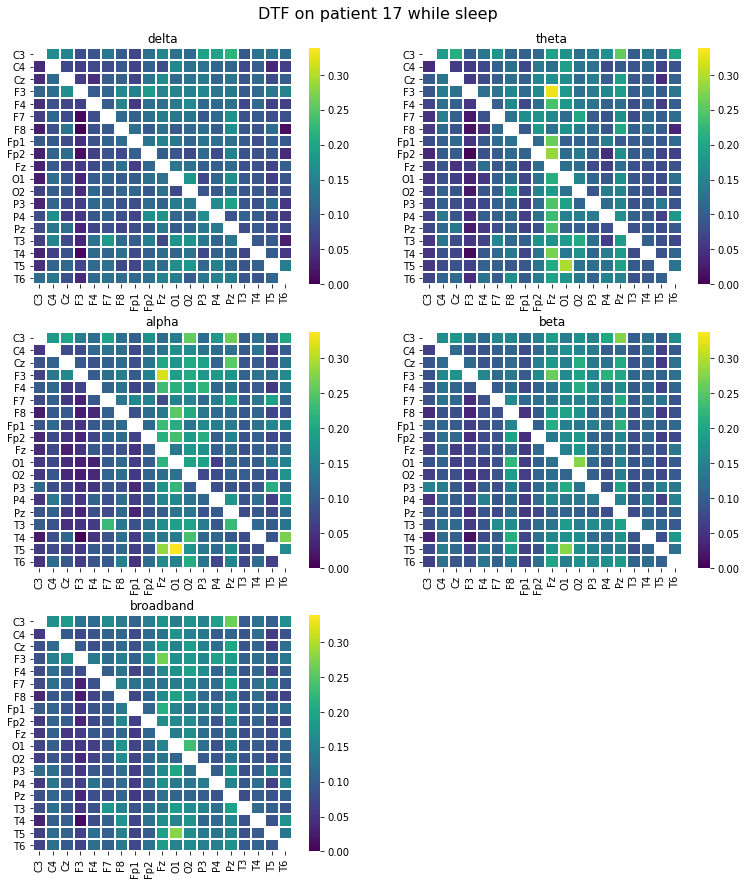

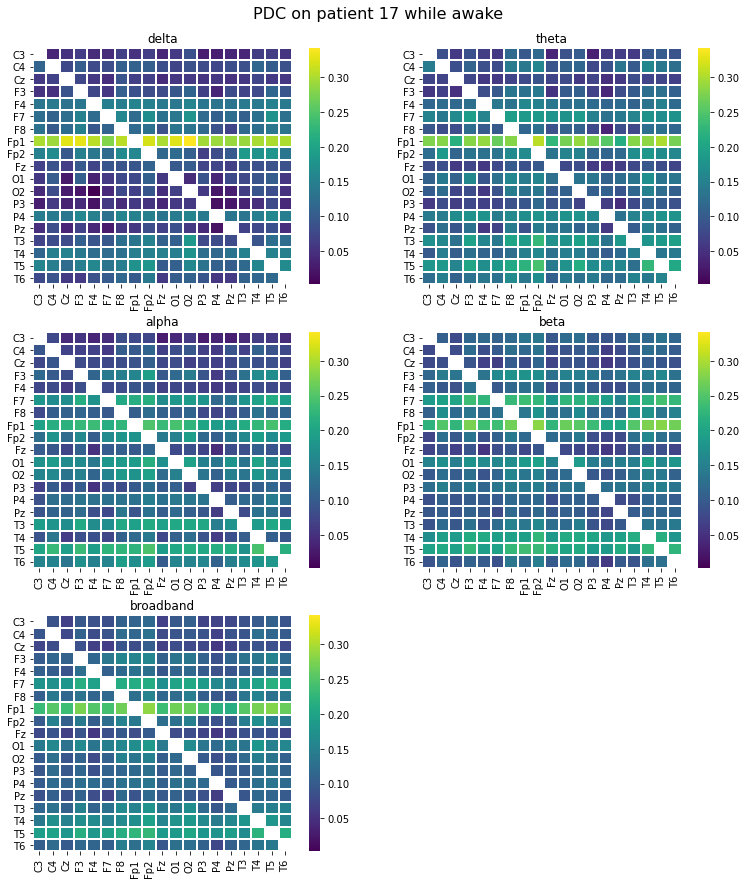

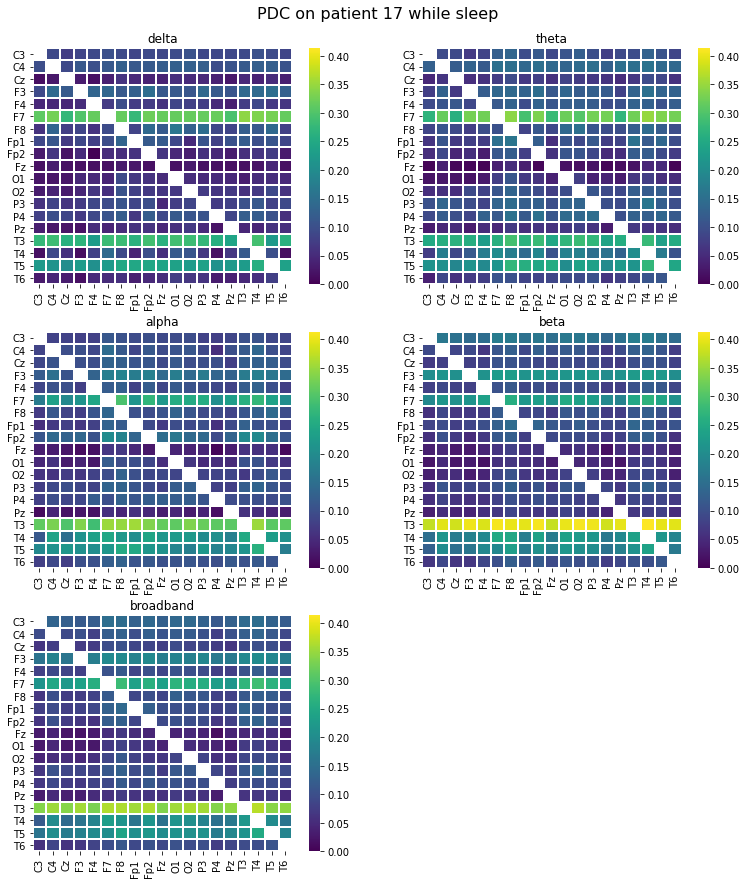

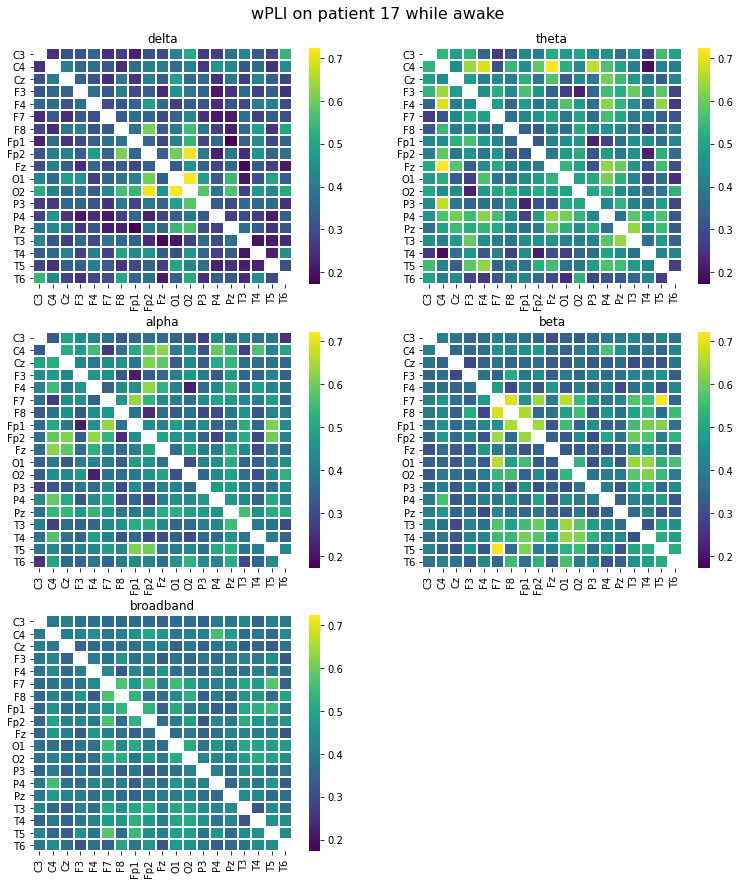

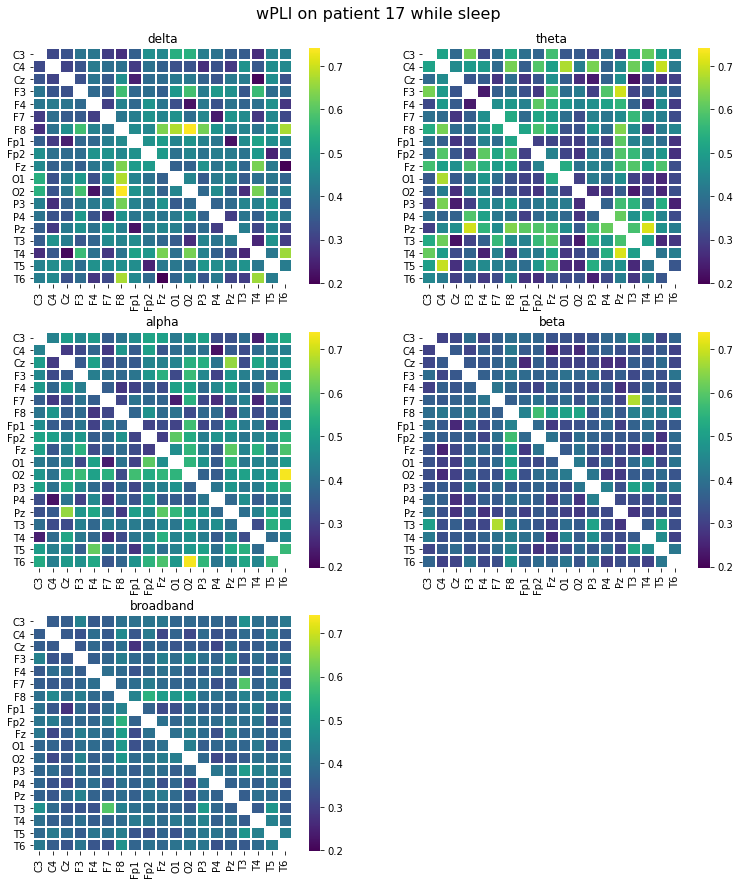

 43%|█████████████████████████████████▎                                           | 16/37 [1:29:58<1:57:00, 334.33s/it]

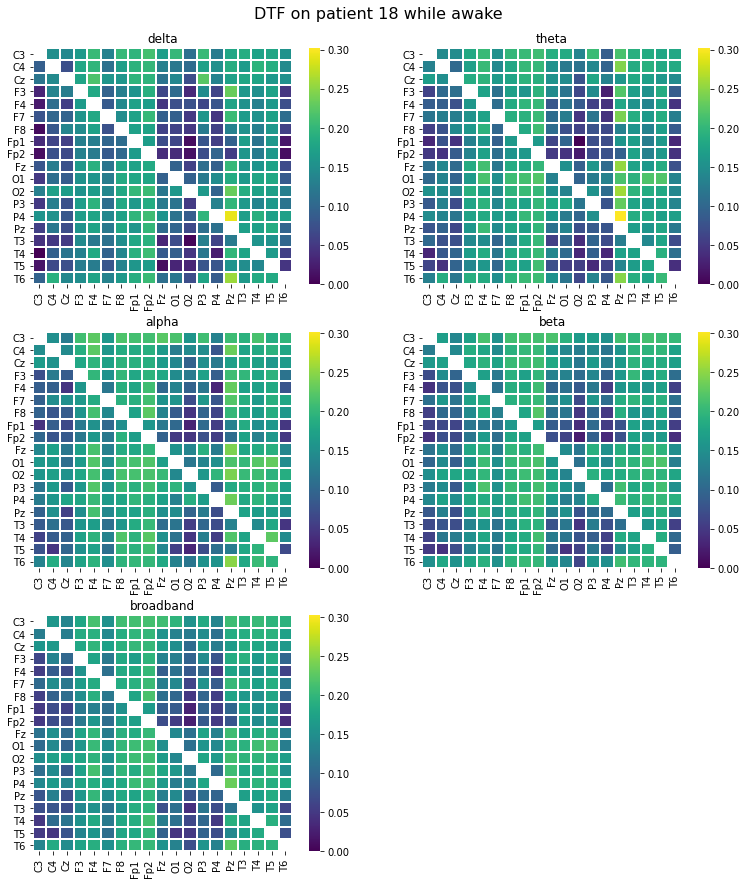

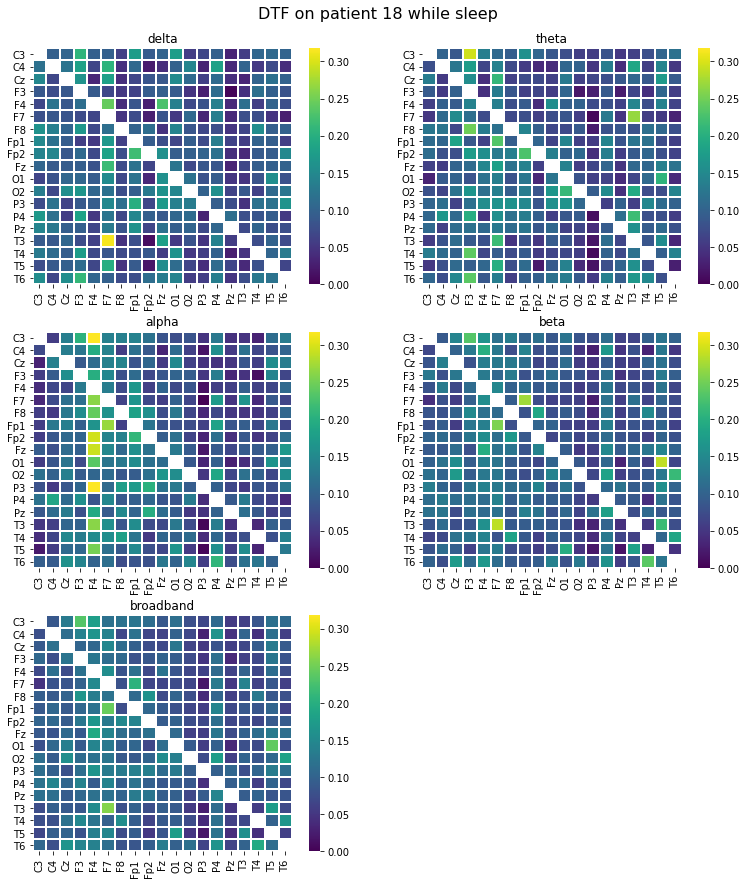

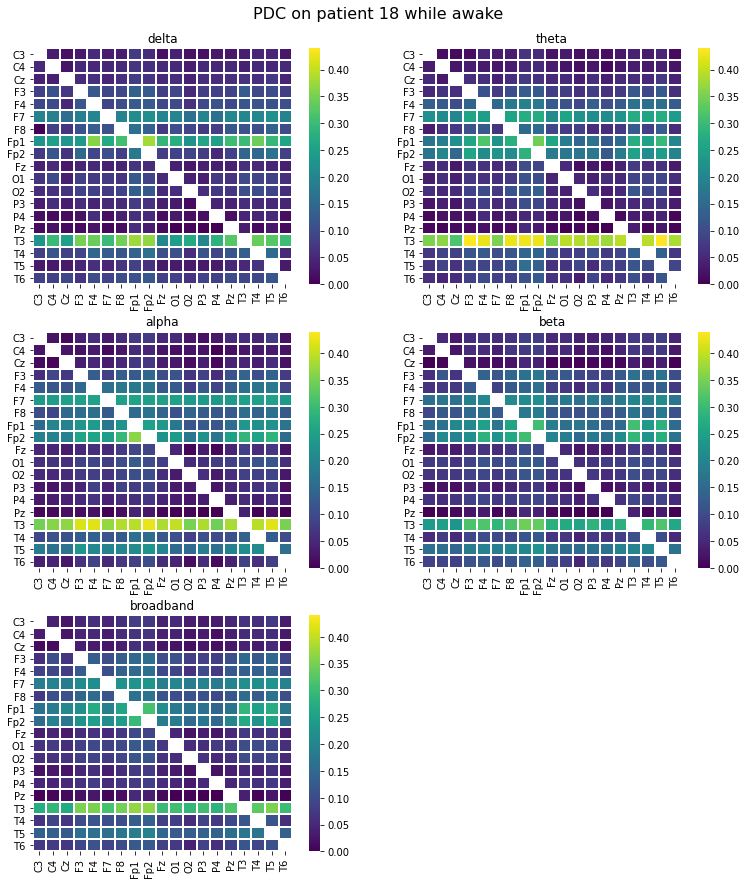

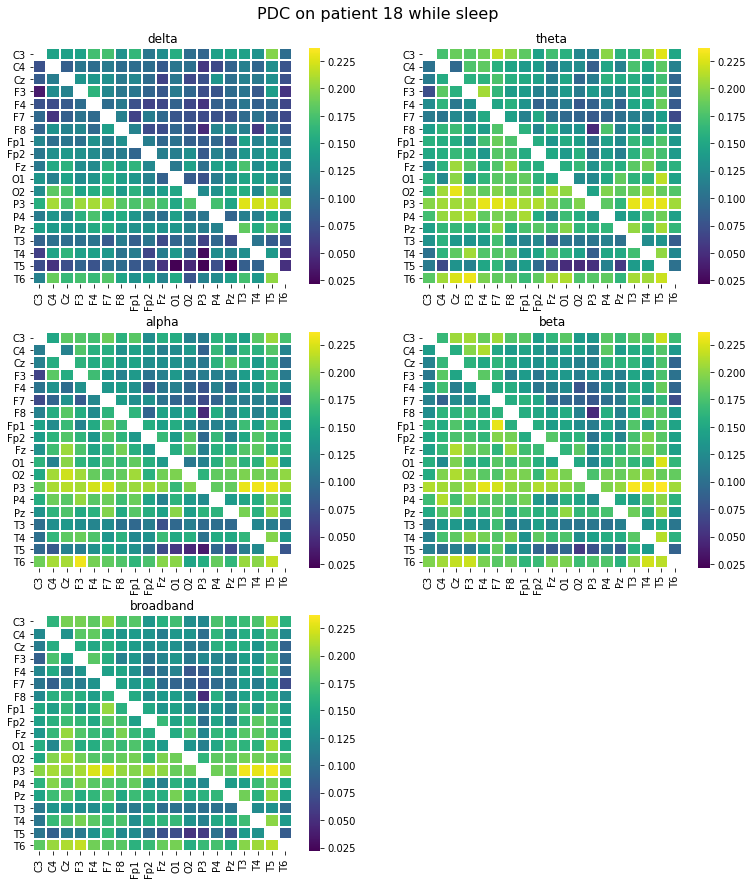

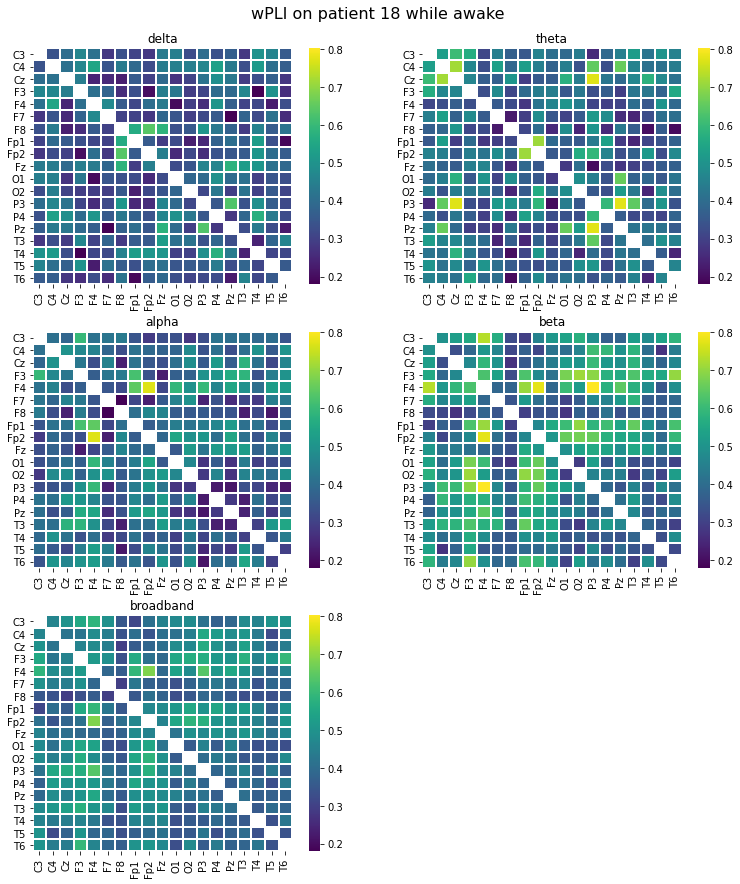

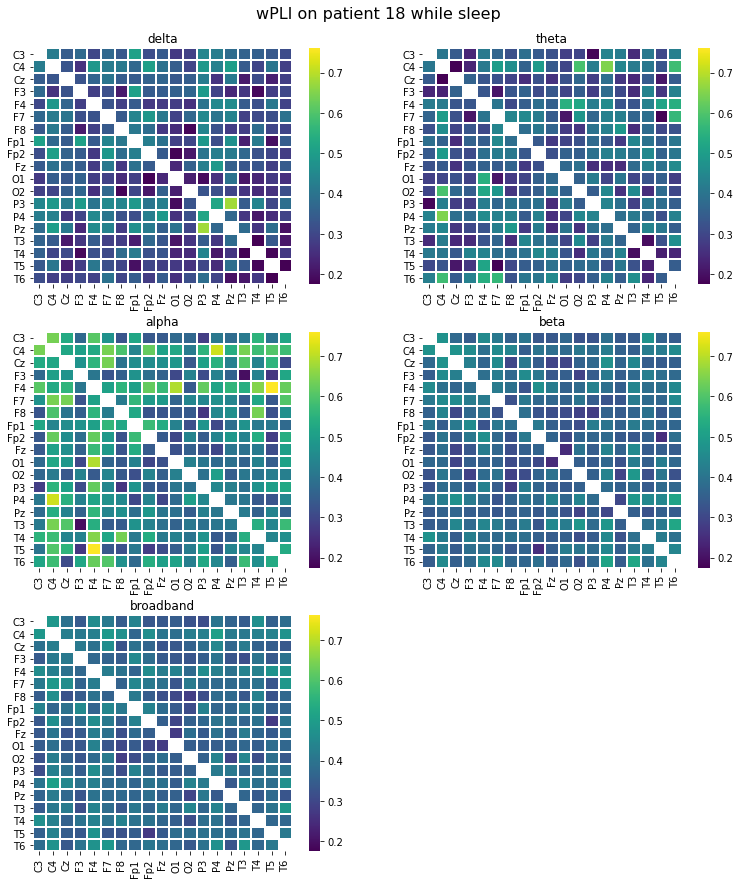

 46%|███████████████████████████████████▍                                         | 17/37 [1:35:28<1:51:02, 333.13s/it]

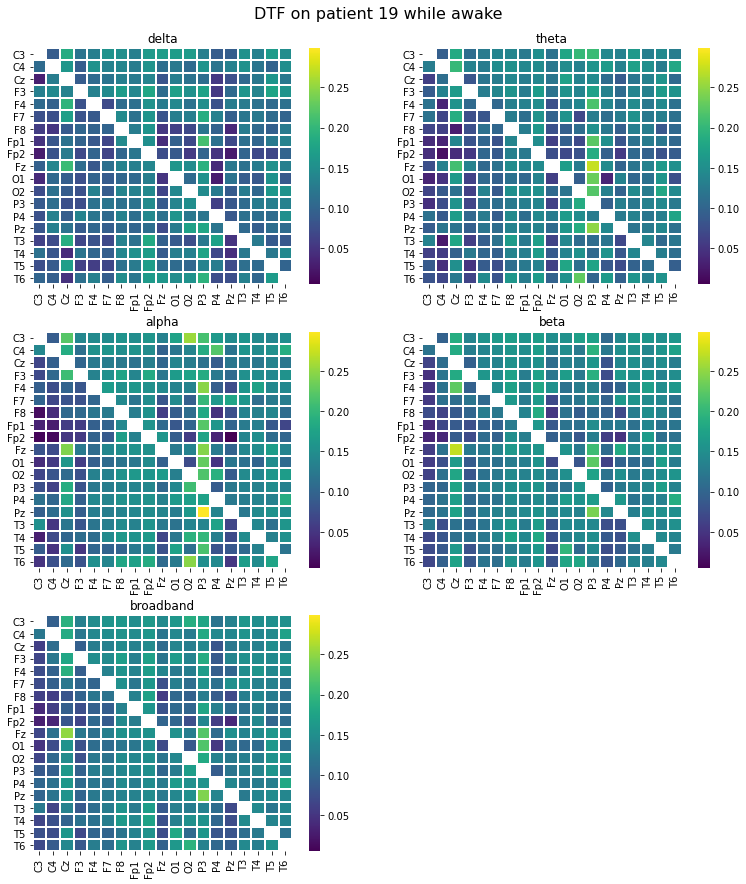

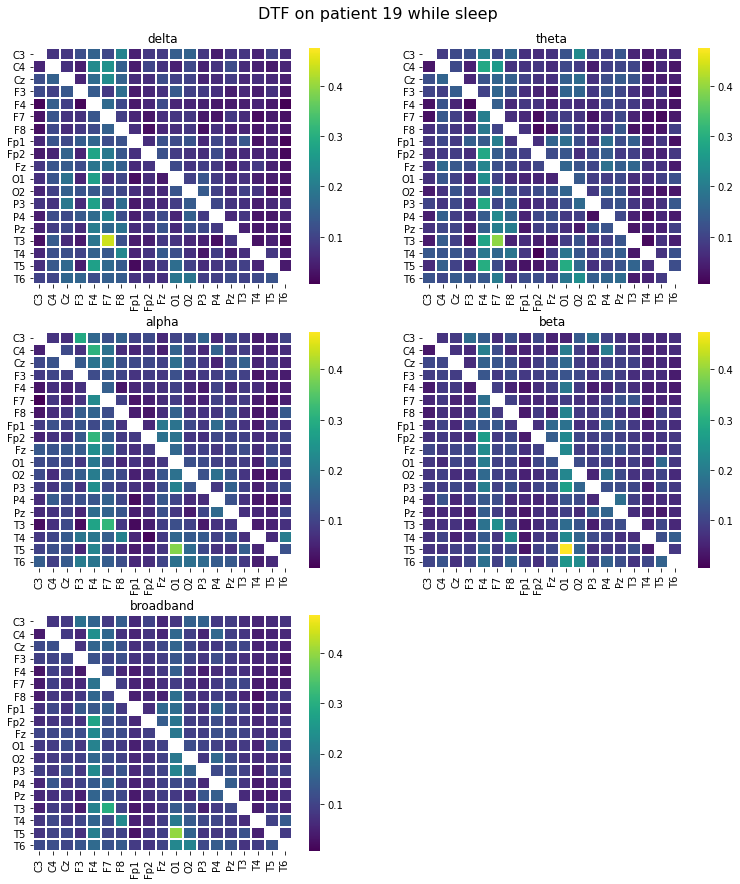

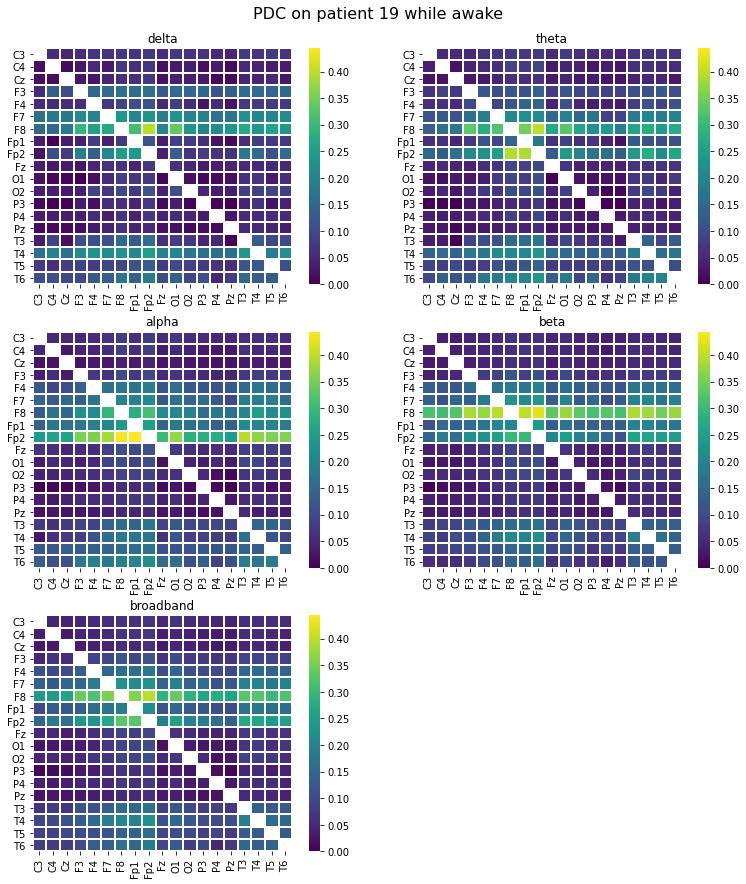

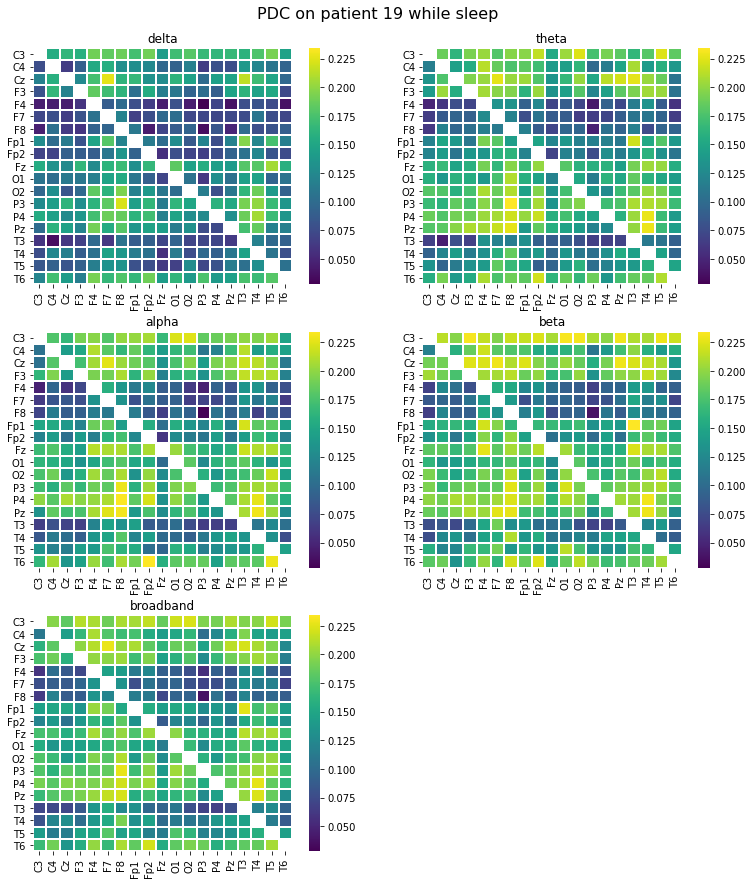

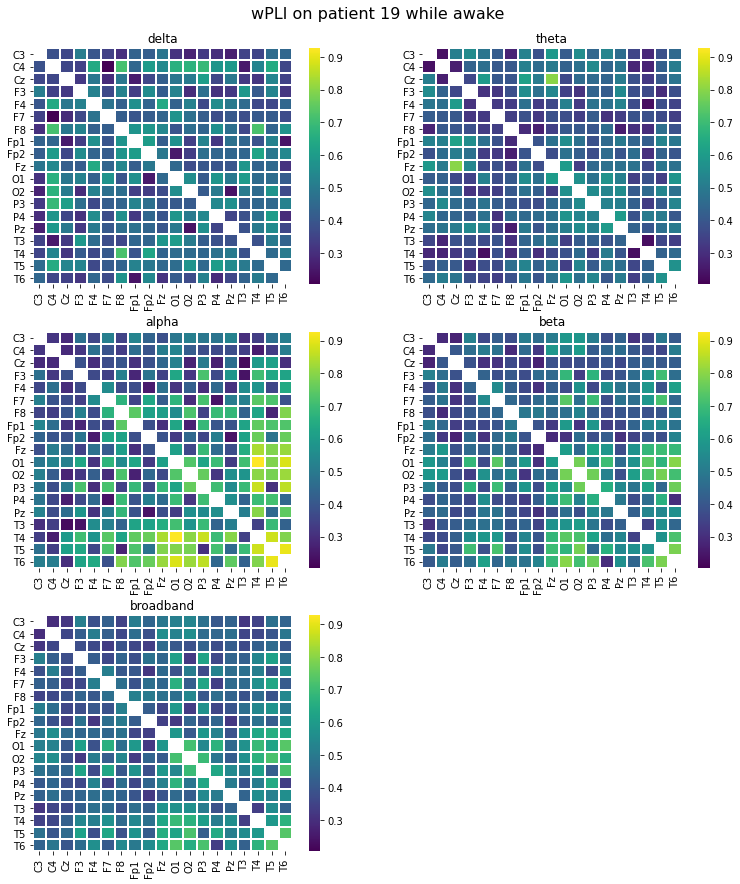

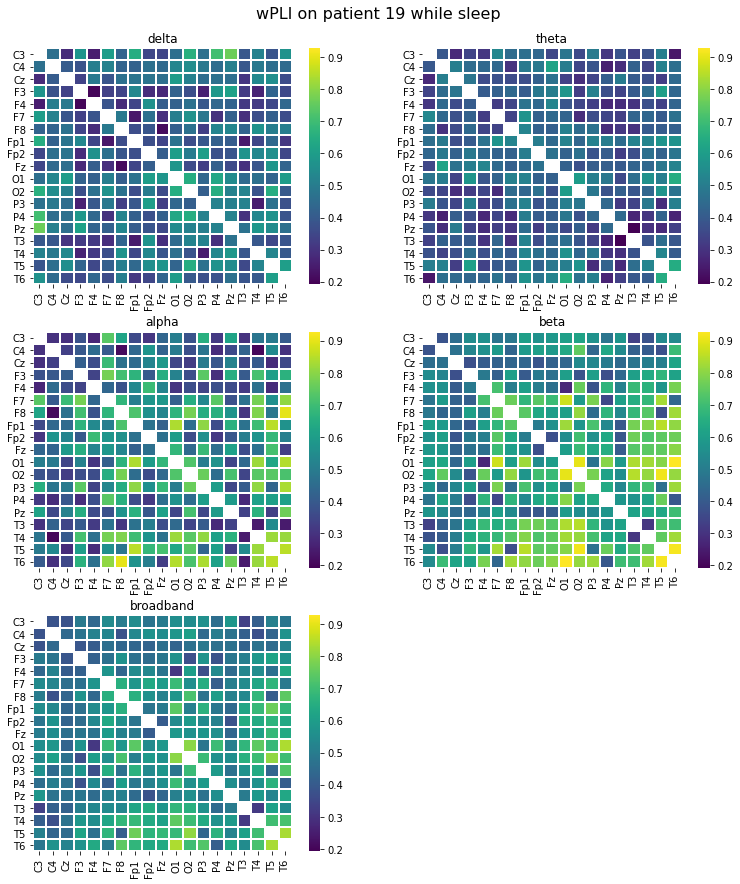

 49%|█████████████████████████████████████▍                                       | 18/37 [1:41:02<1:45:36, 333.51s/it]

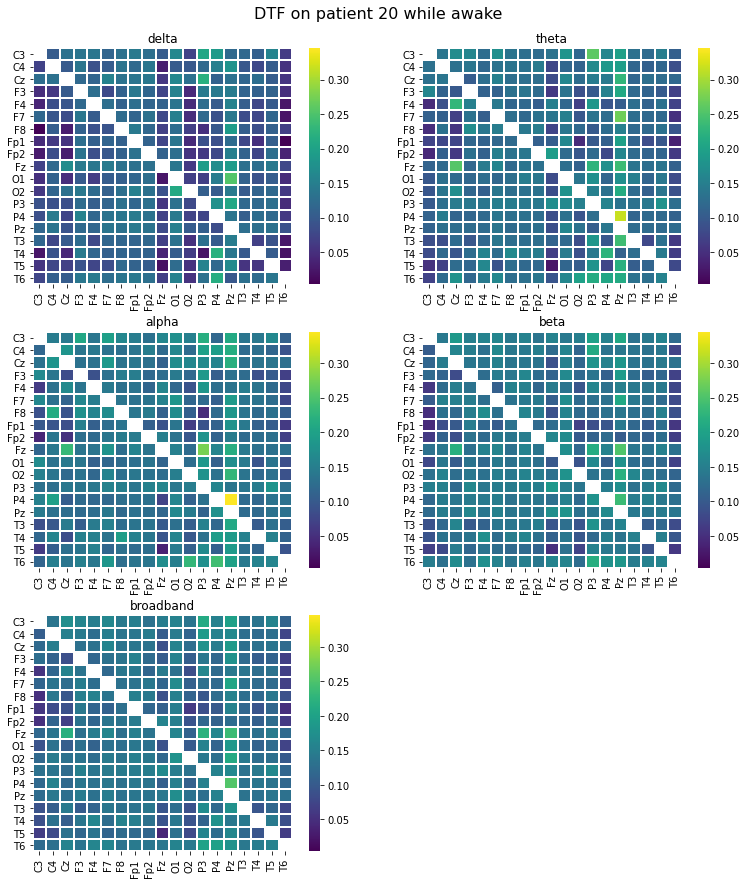

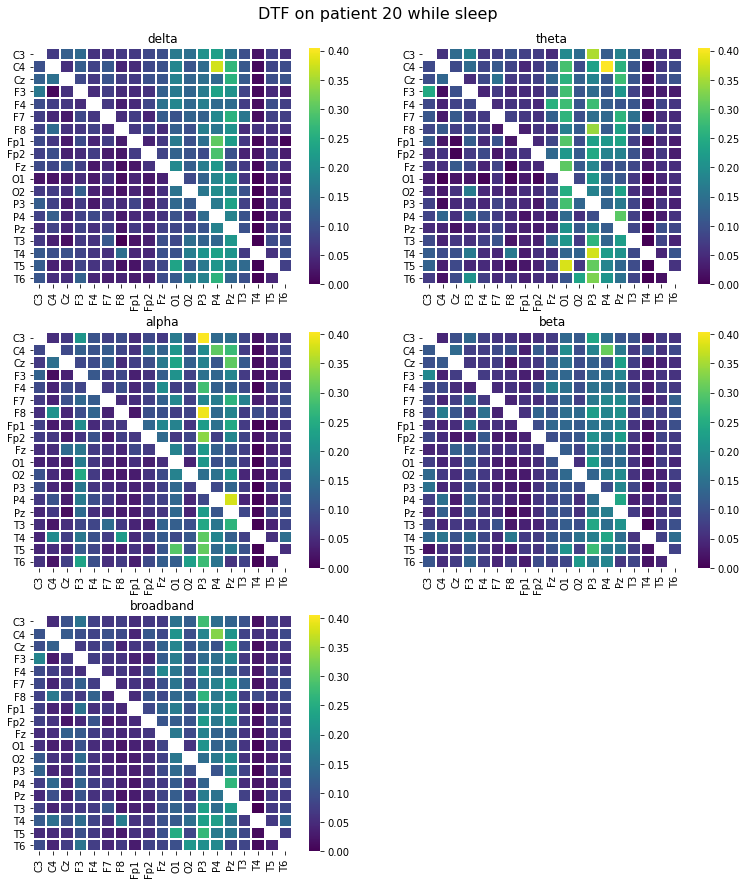

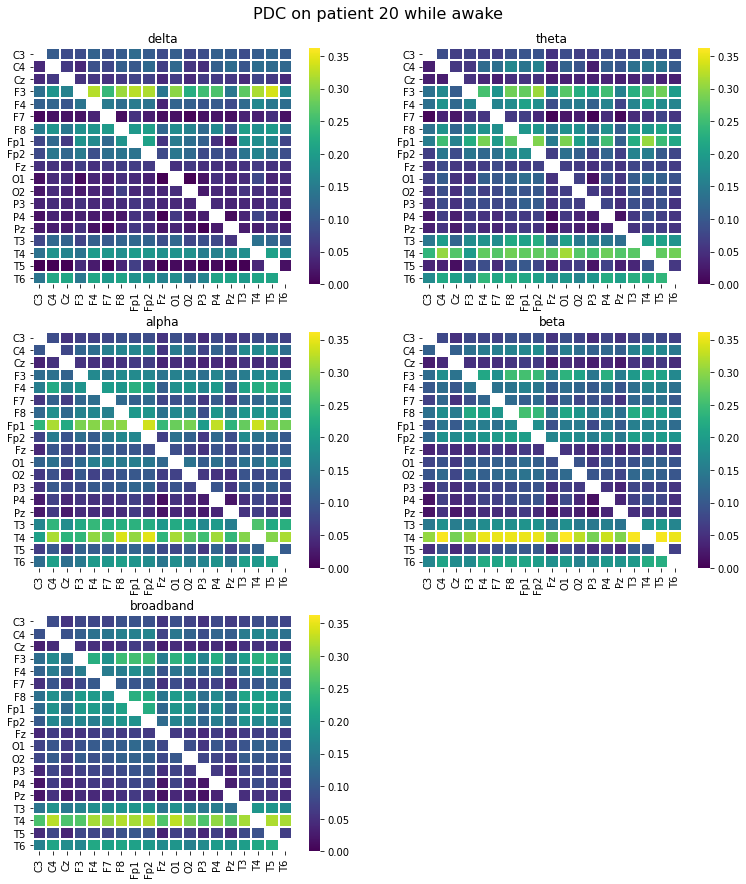

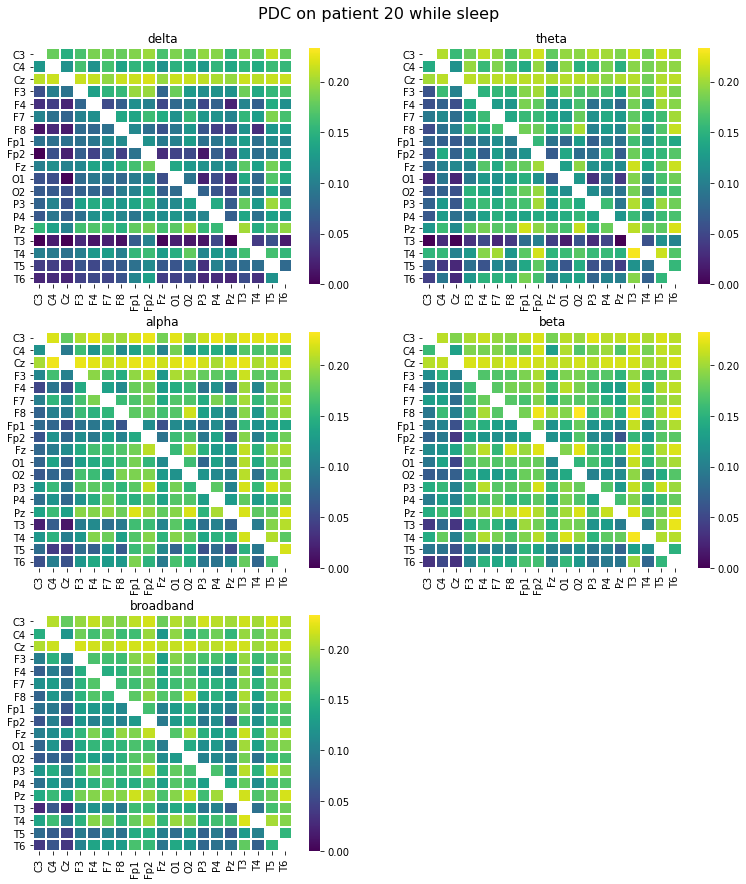

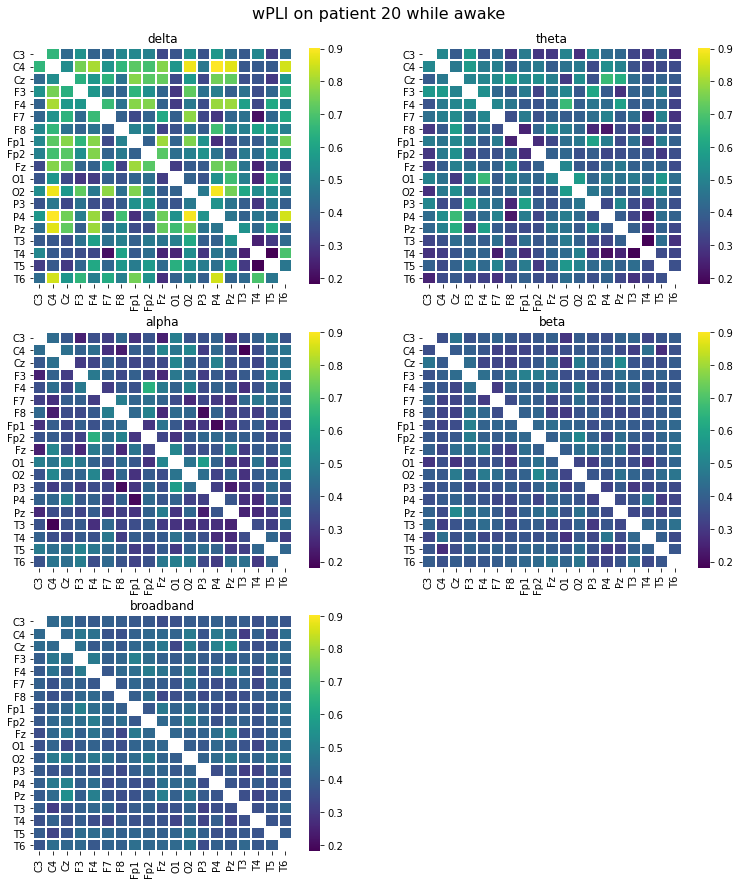

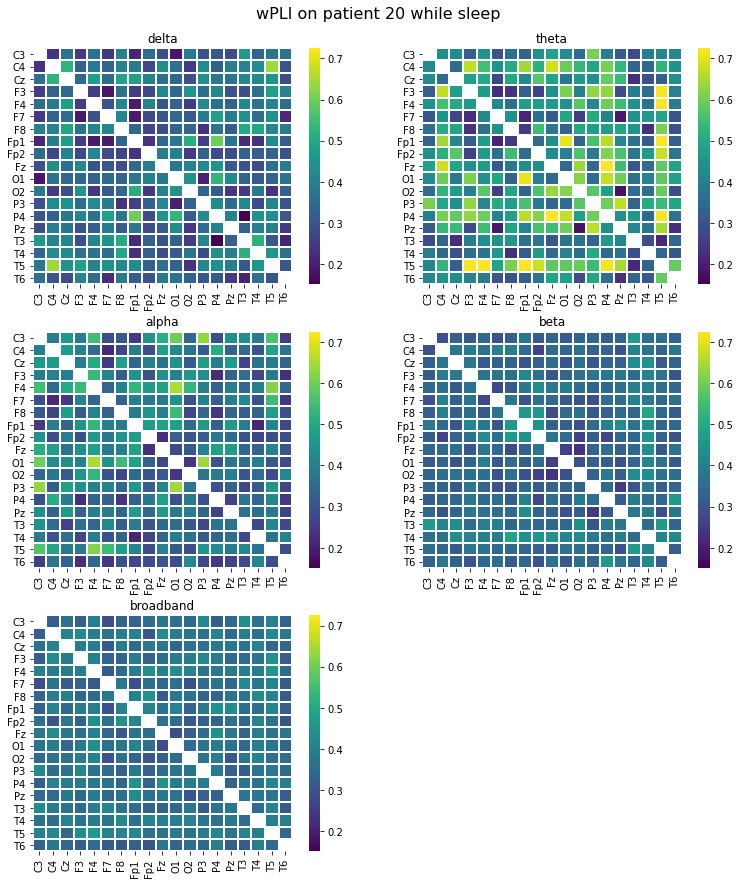

 51%|███████████████████████████████████████▌                                     | 19/37 [1:46:34<1:39:53, 332.98s/it]

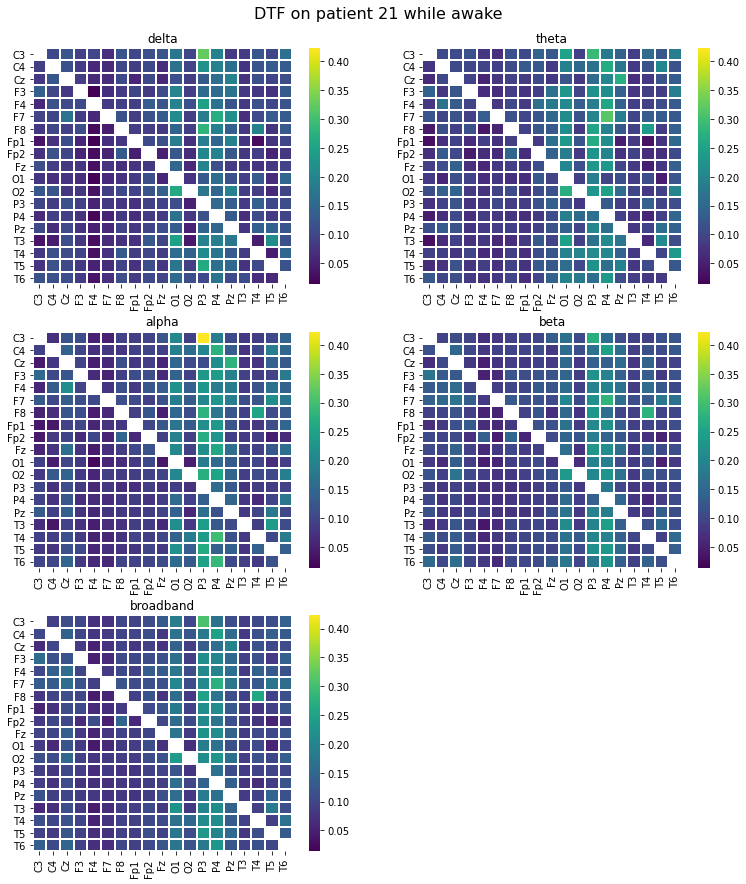

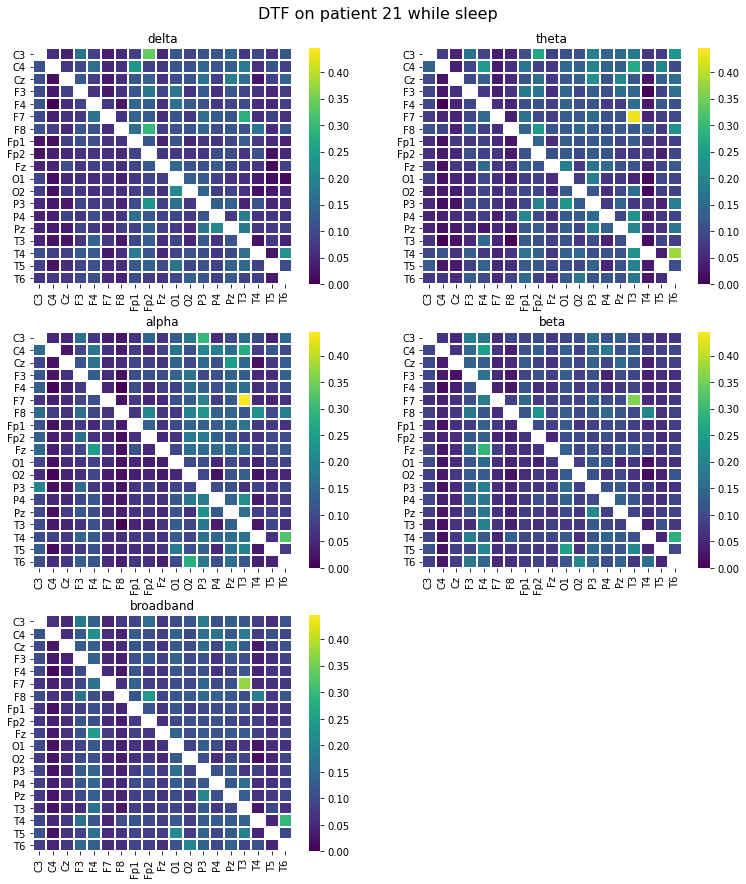

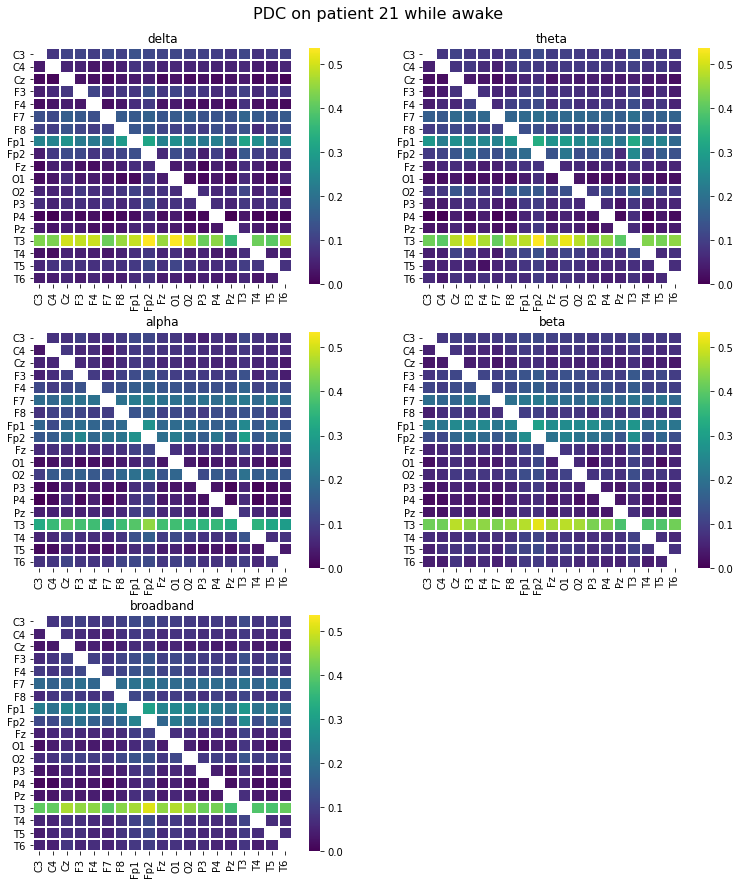

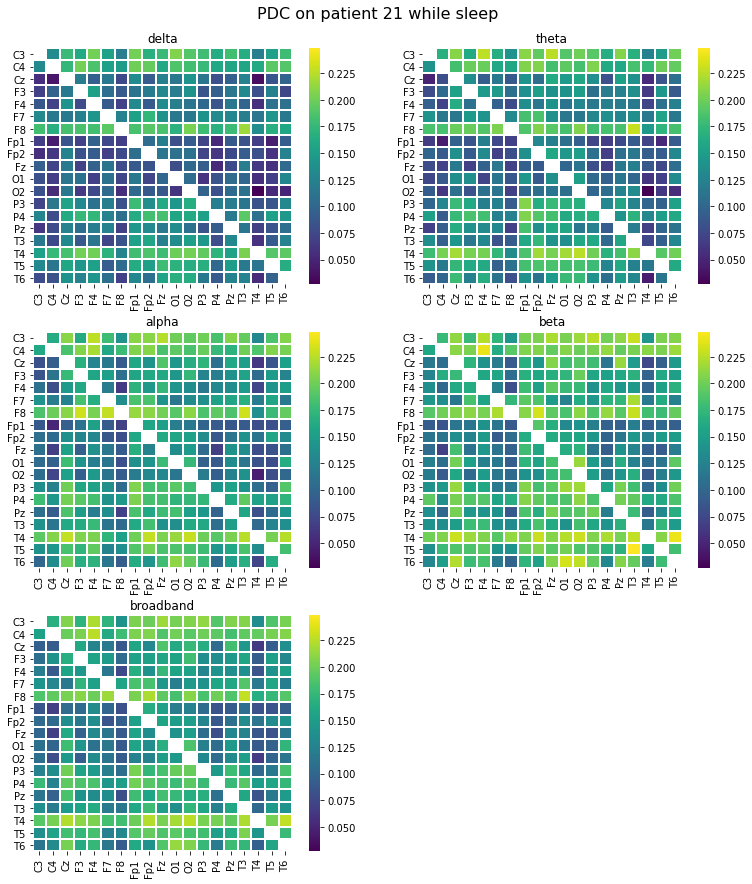

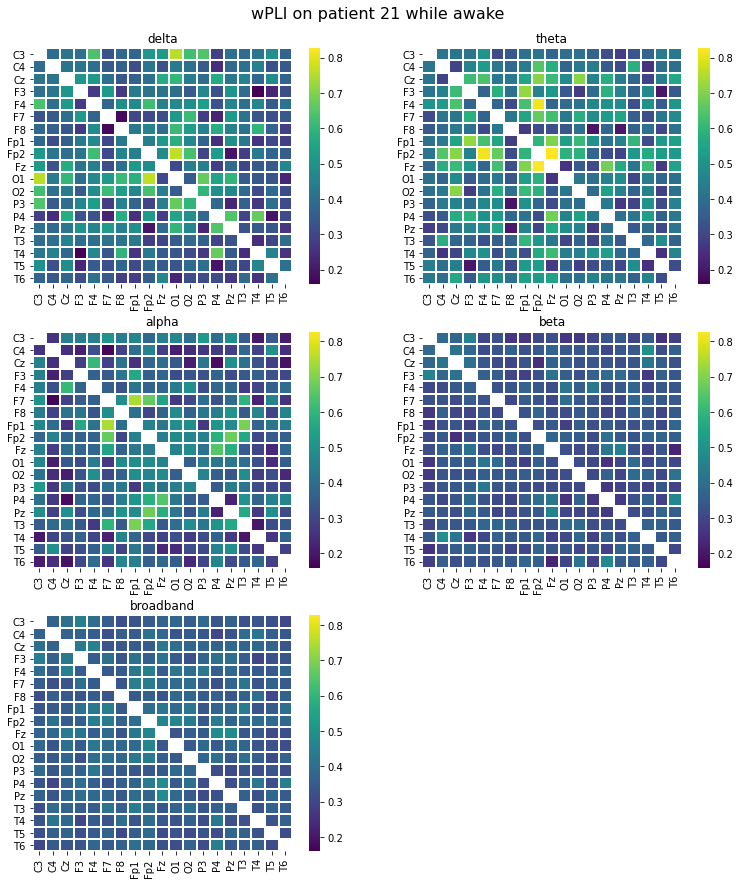

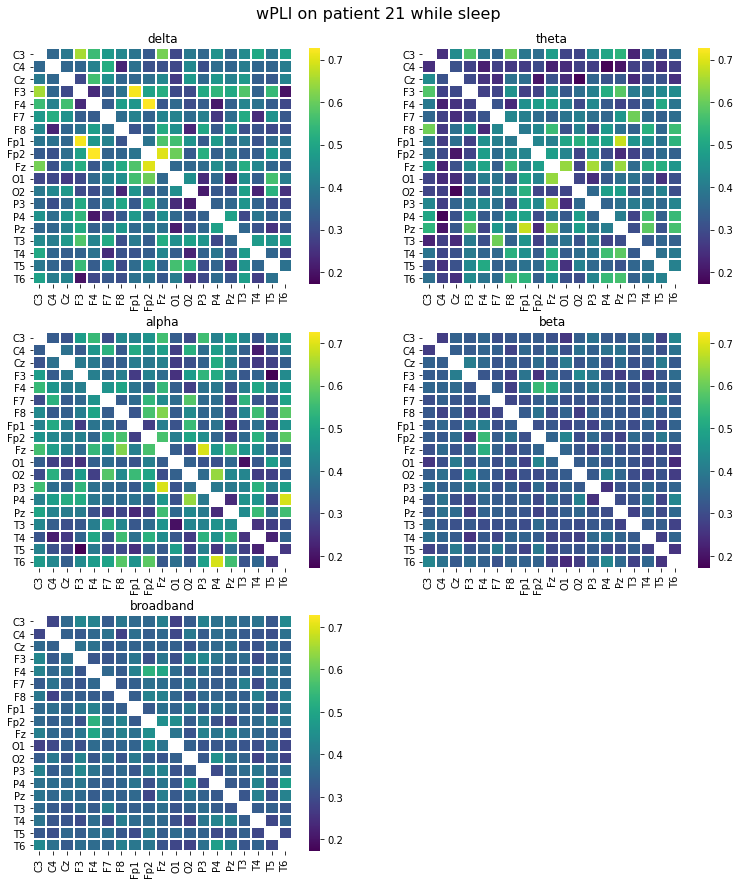

 54%|█████████████████████████████████████████▌                                   | 20/37 [1:52:06<1:34:16, 332.74s/it]

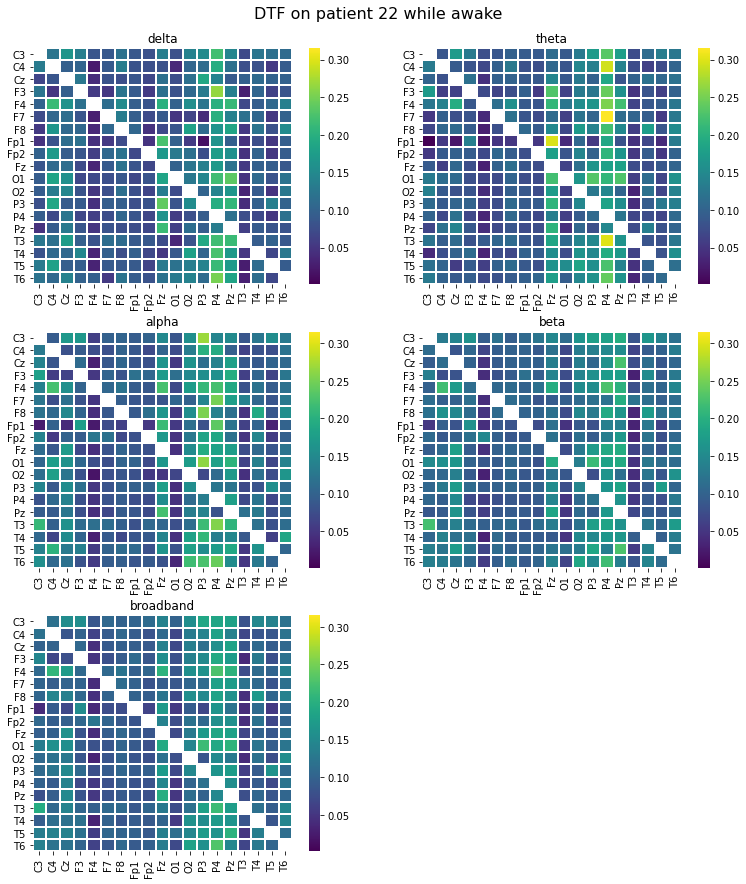

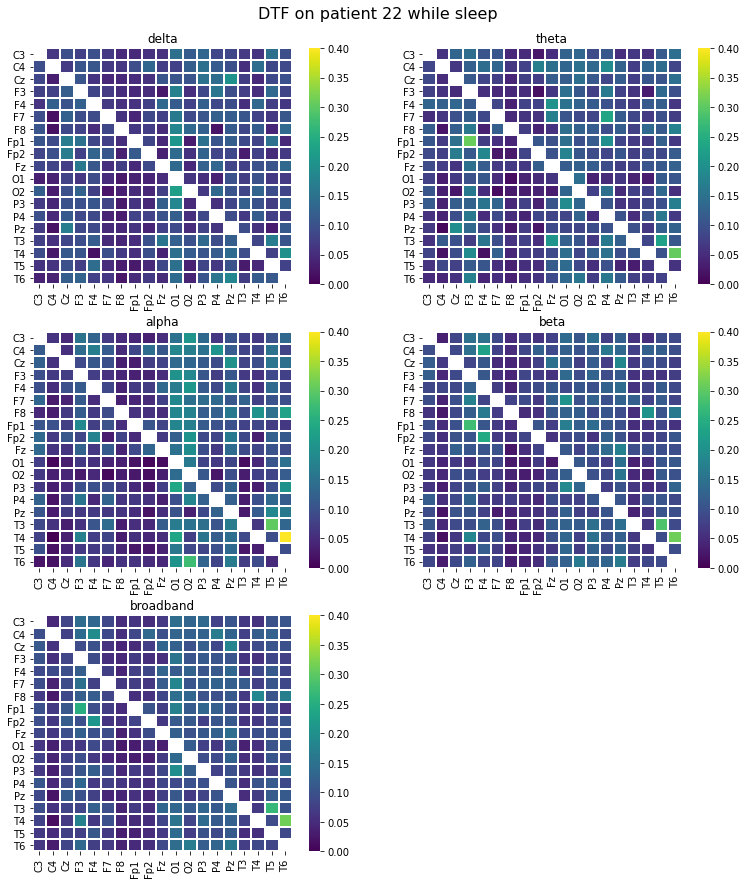

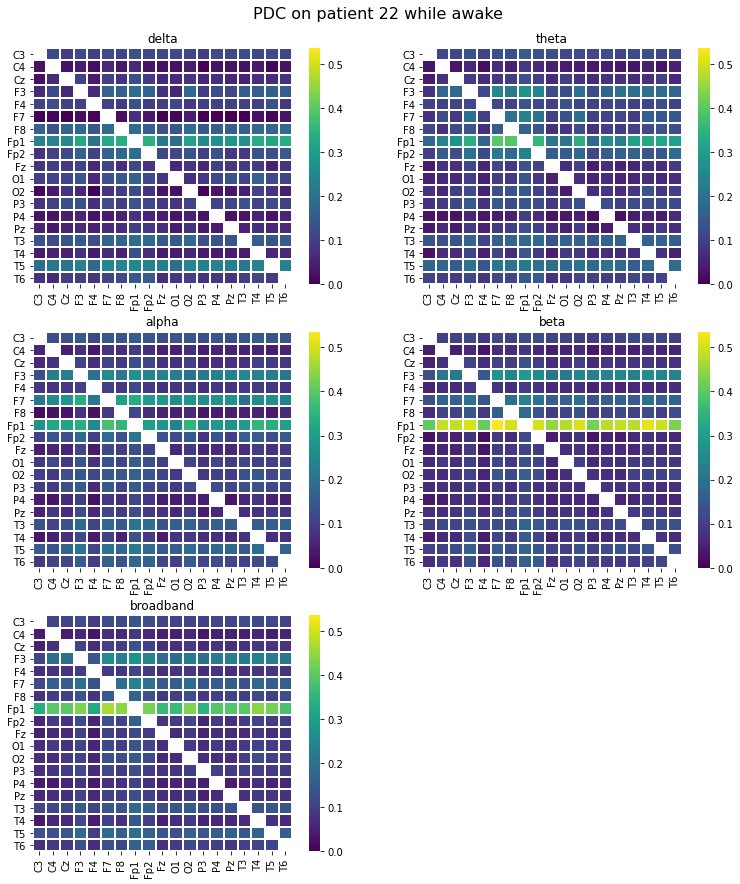

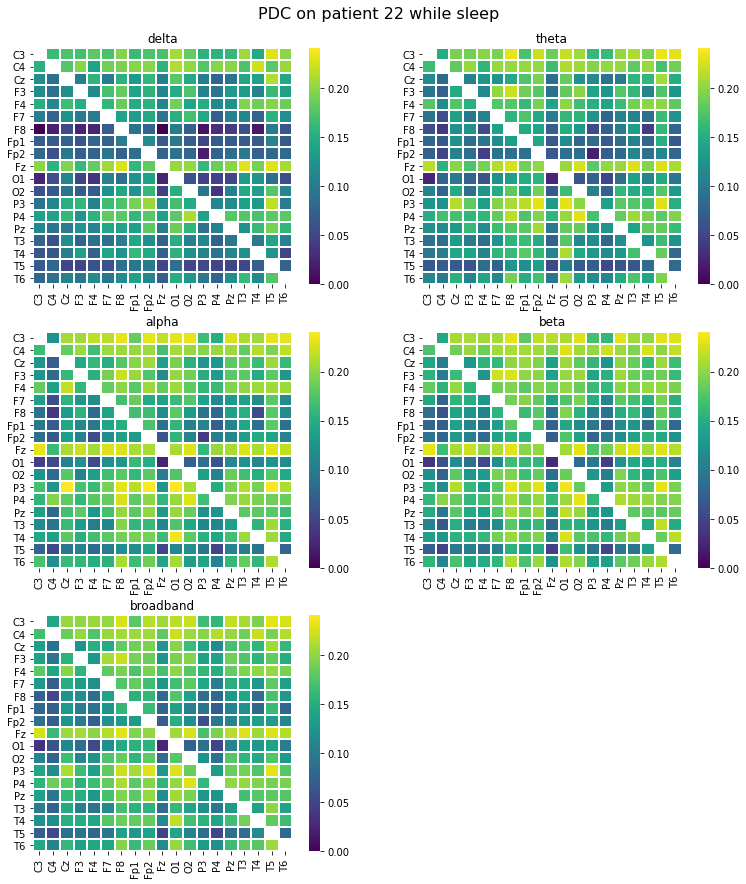

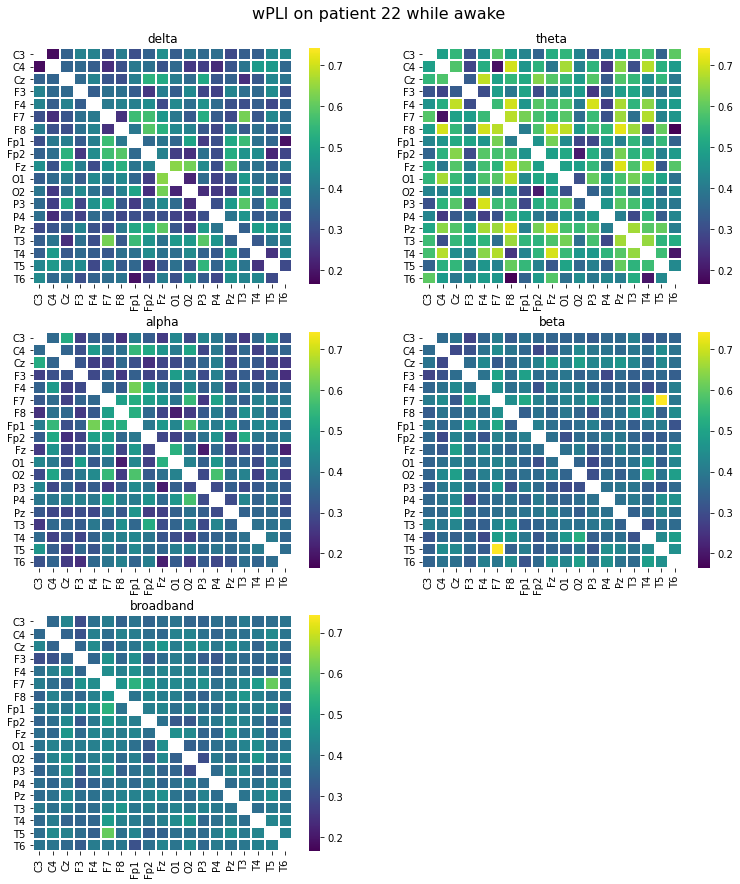

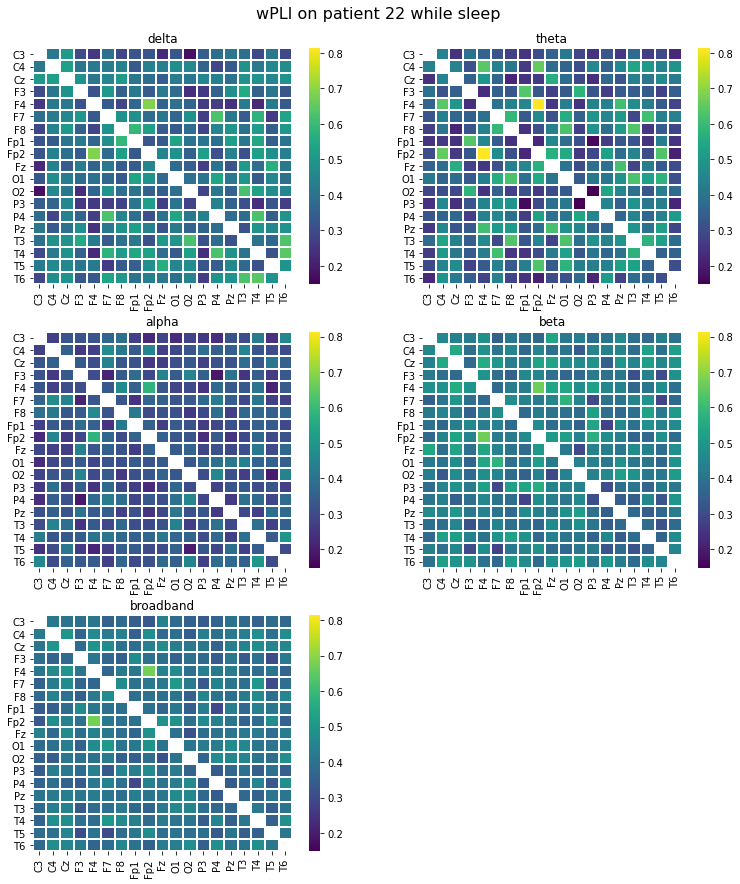

 57%|███████████████████████████████████████████▋                                 | 21/37 [1:57:40<1:28:47, 332.96s/it]

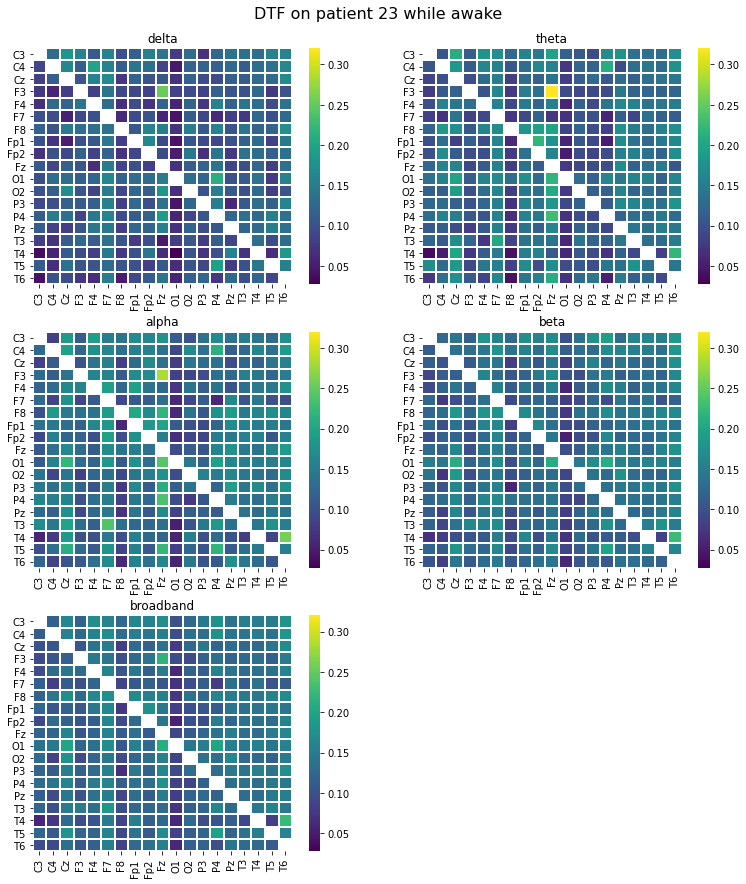

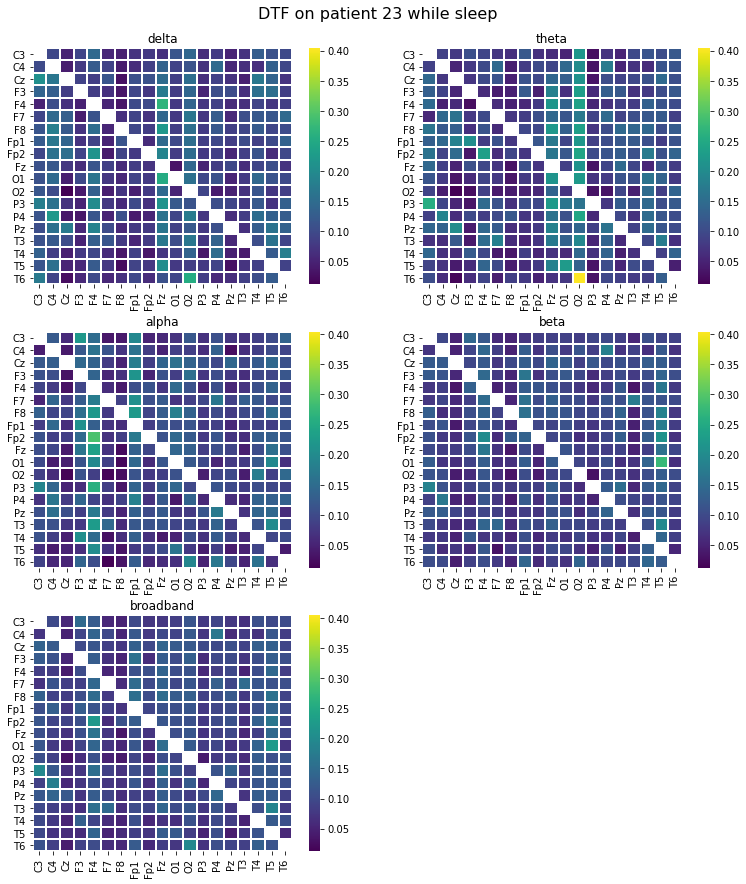

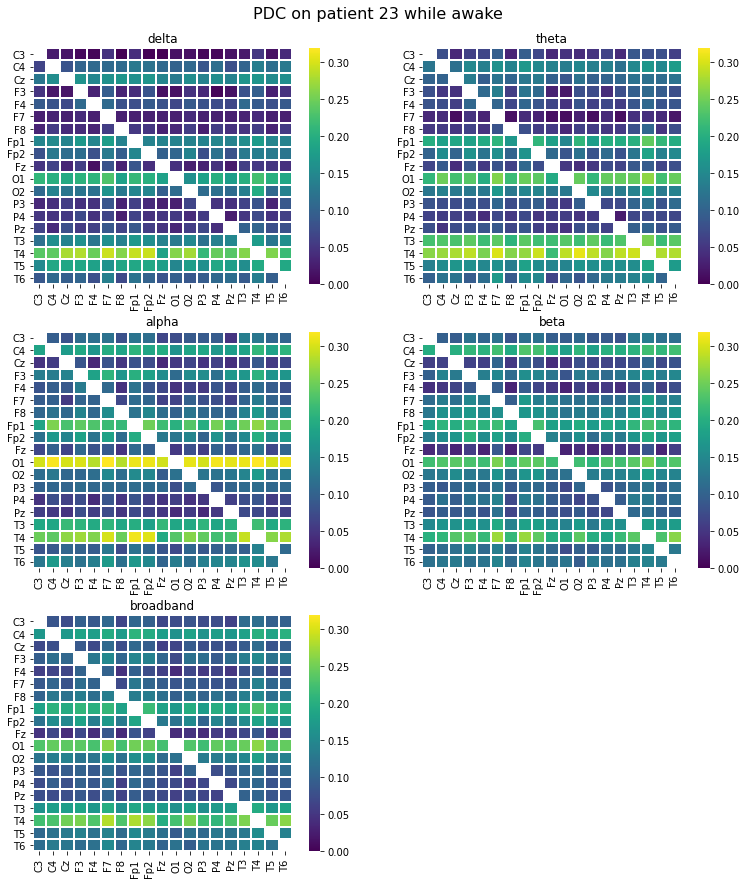

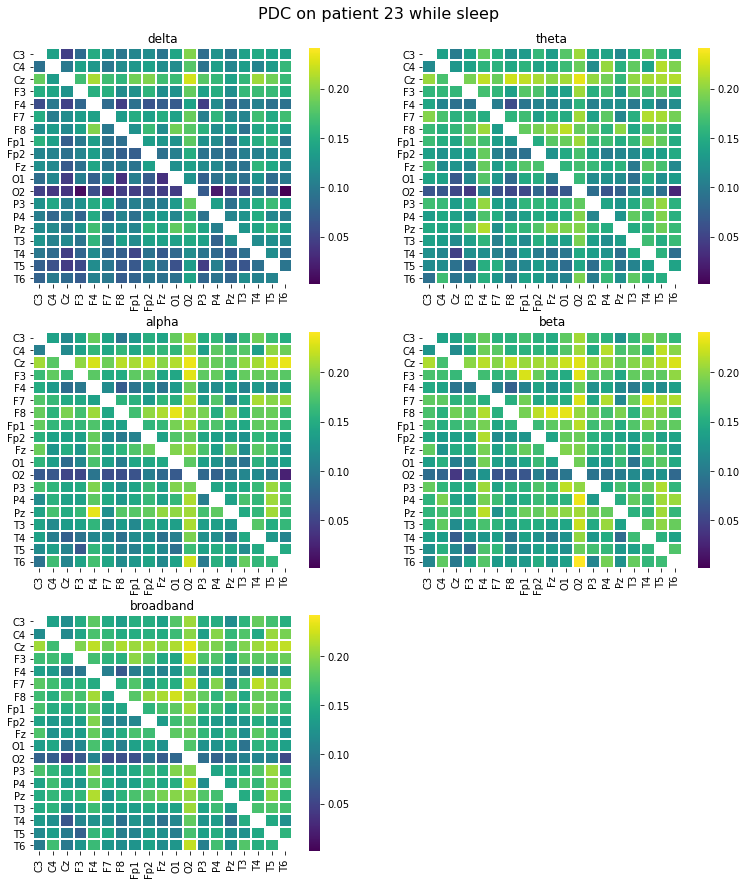

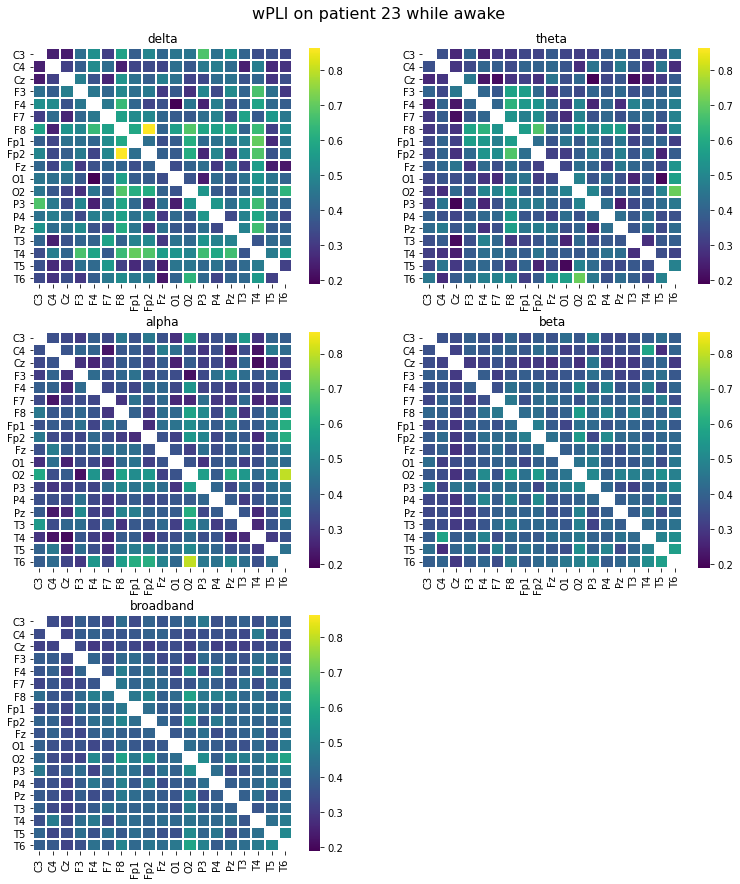

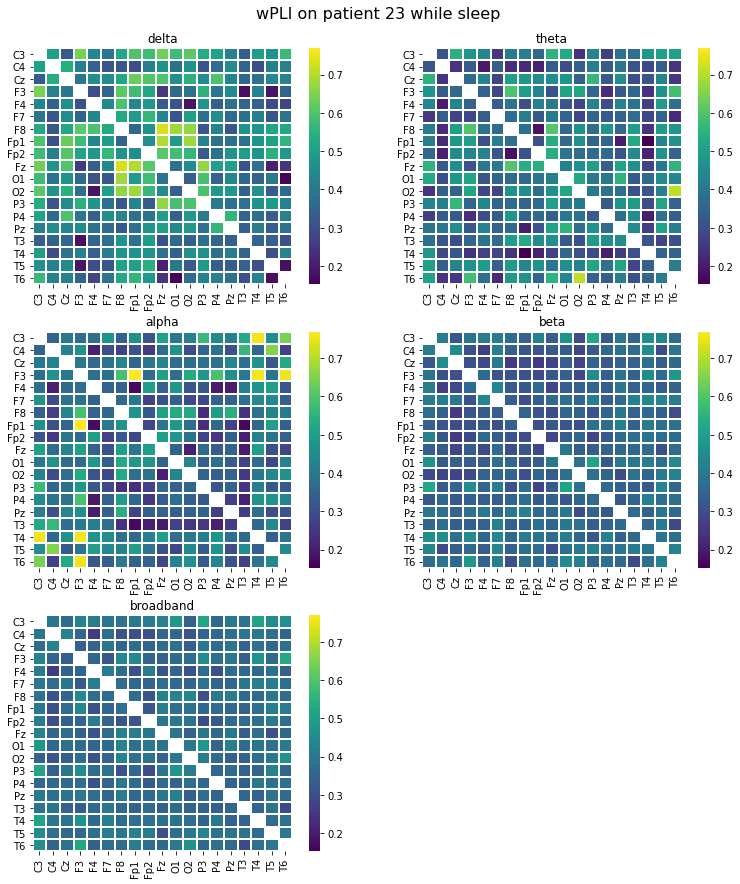

 59%|█████████████████████████████████████████████▊                               | 22/37 [2:03:11<1:23:07, 332.49s/it]

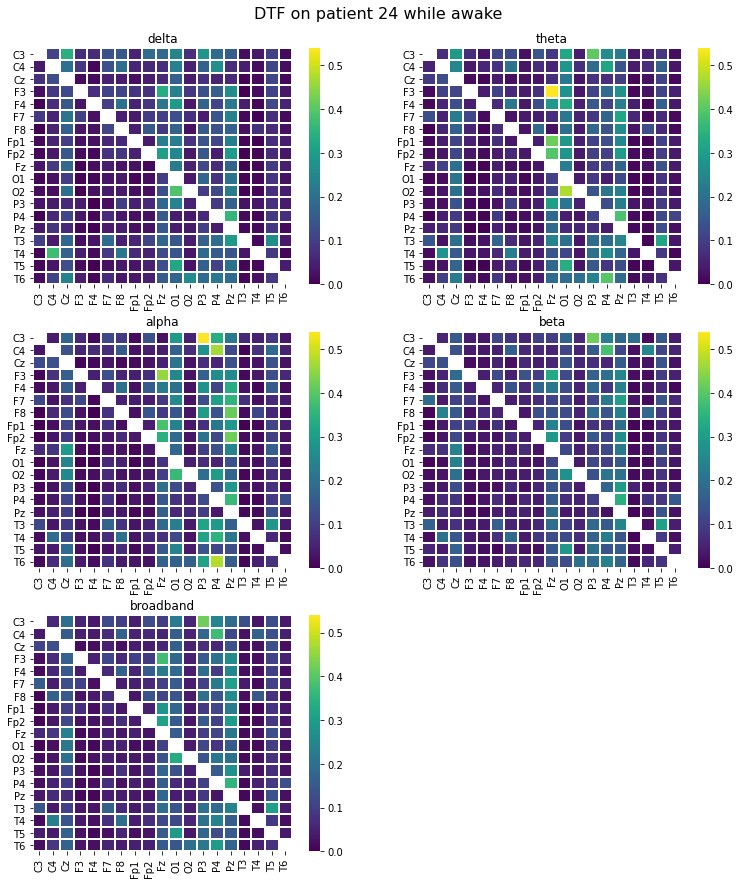

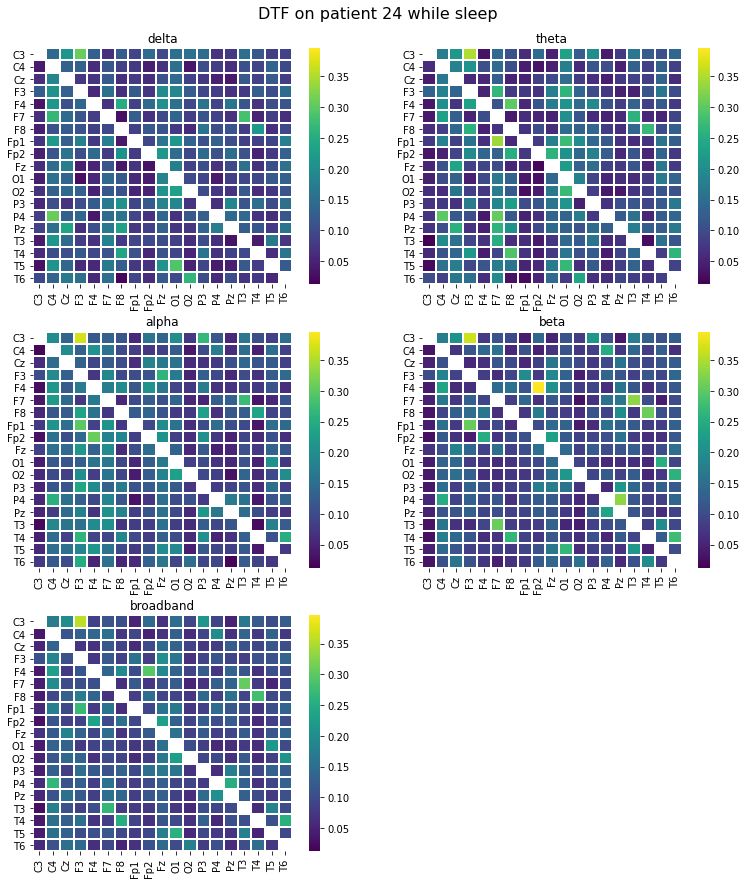

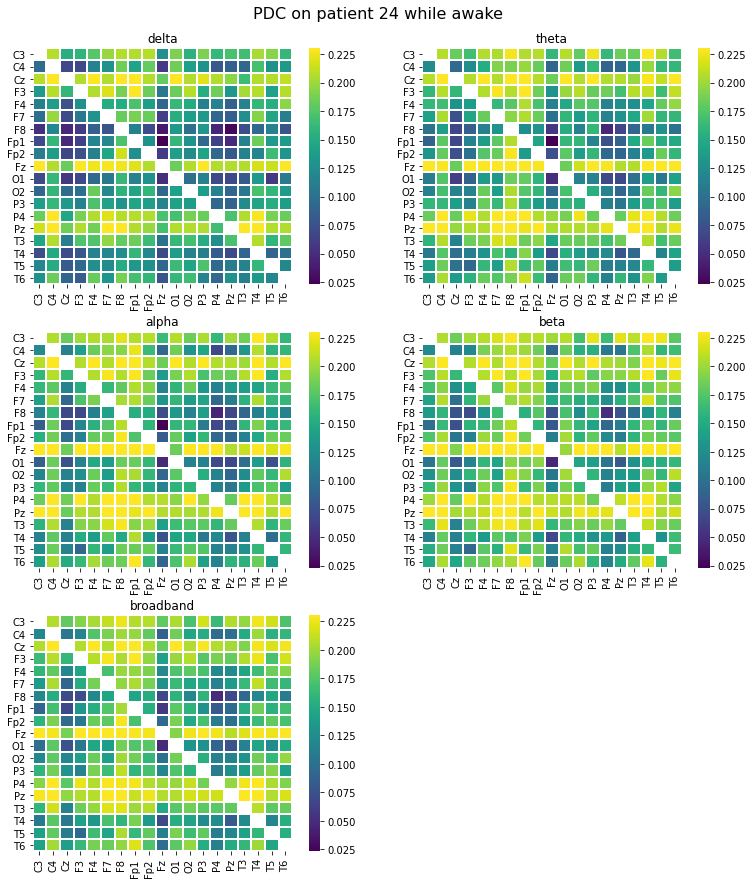

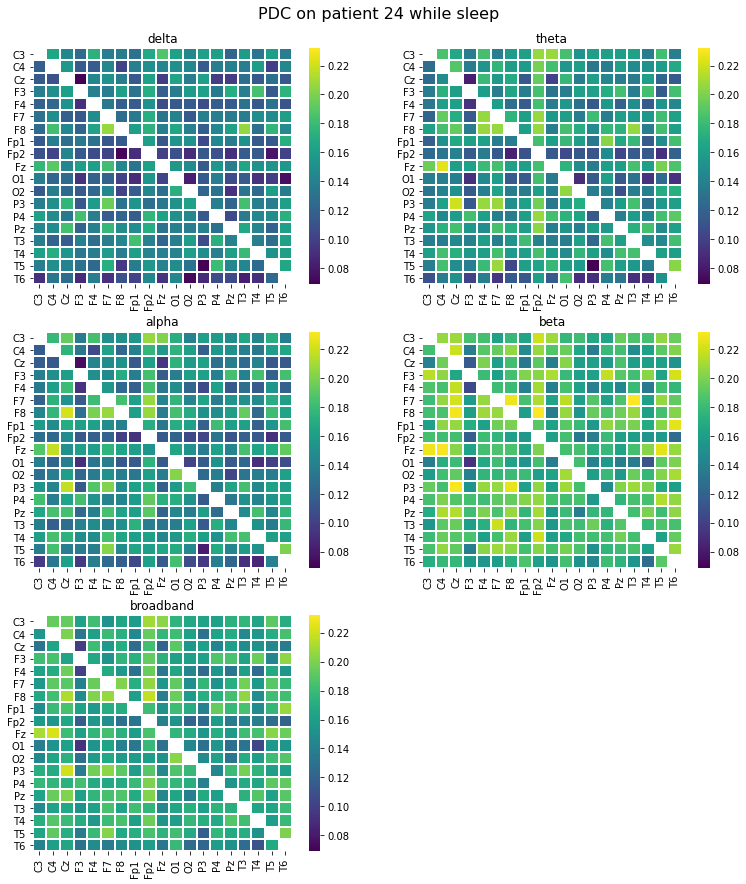

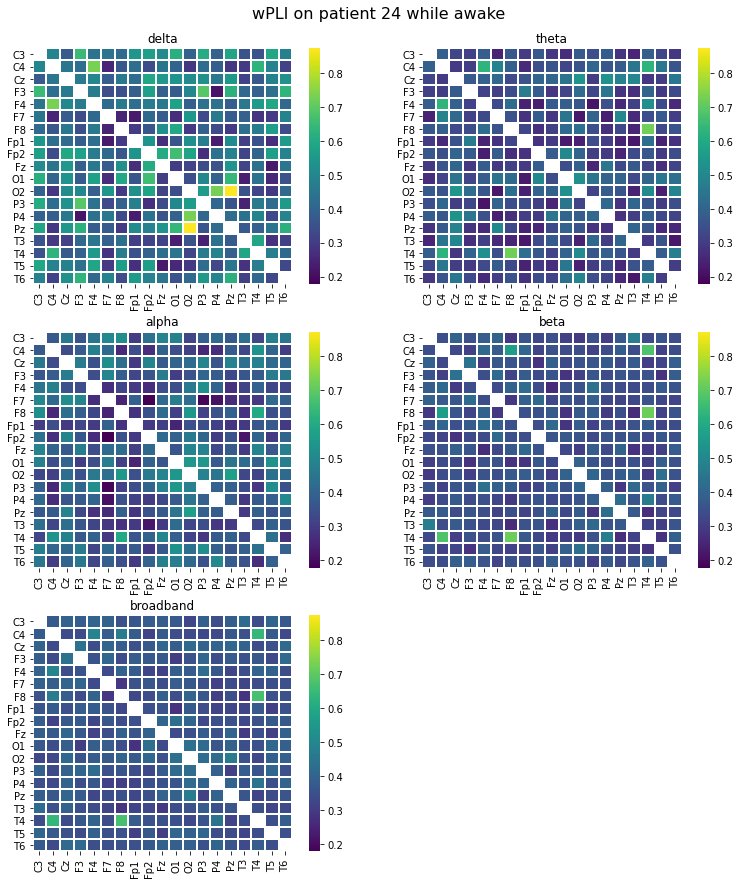

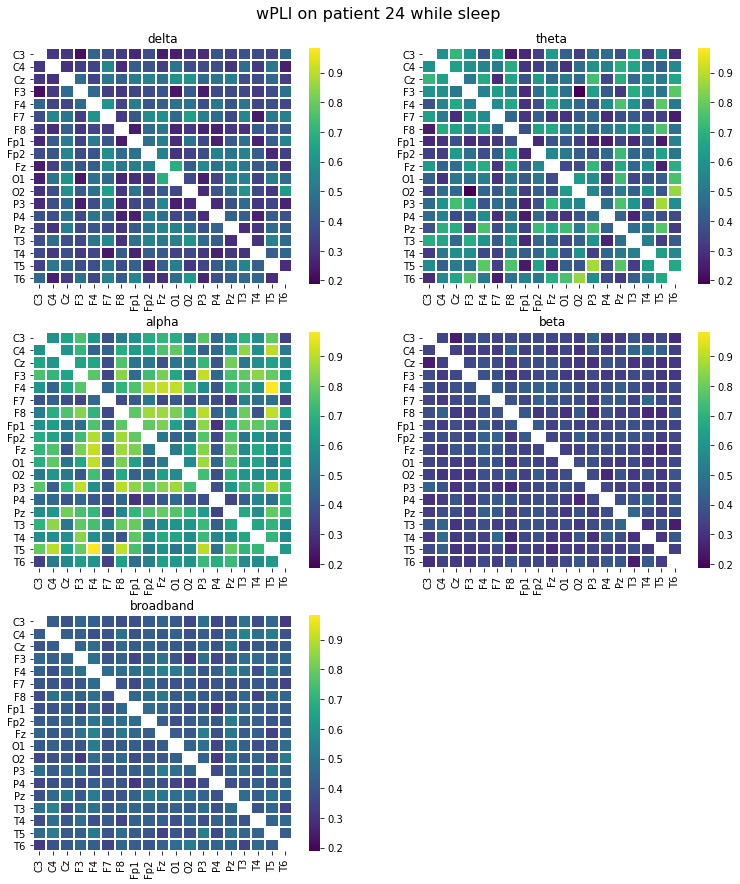

 62%|███████████████████████████████████████████████▊                             | 23/37 [2:14:02<1:39:50, 427.89s/it]

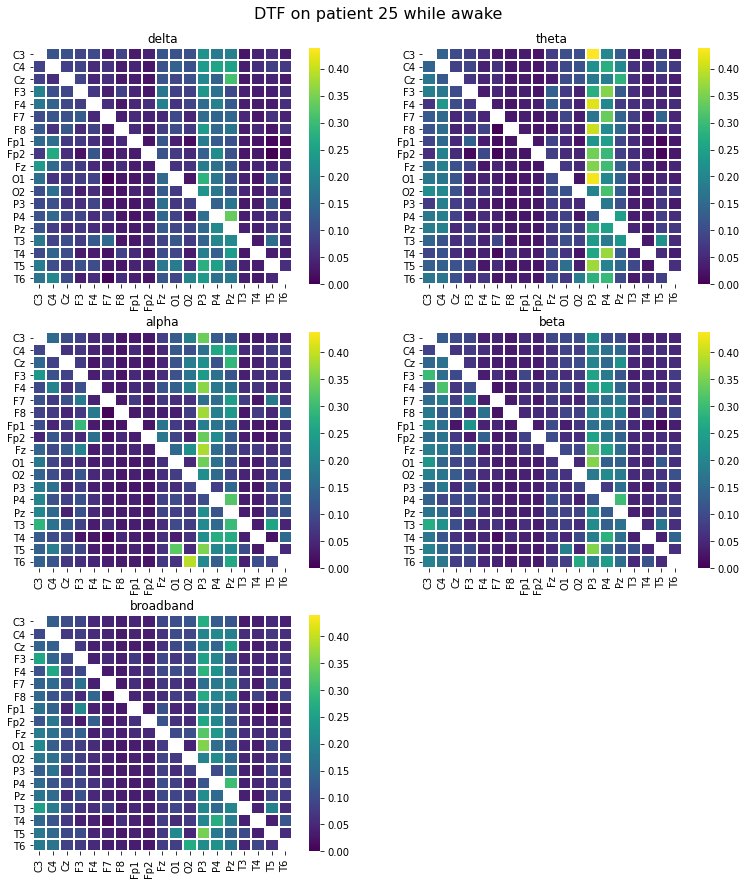

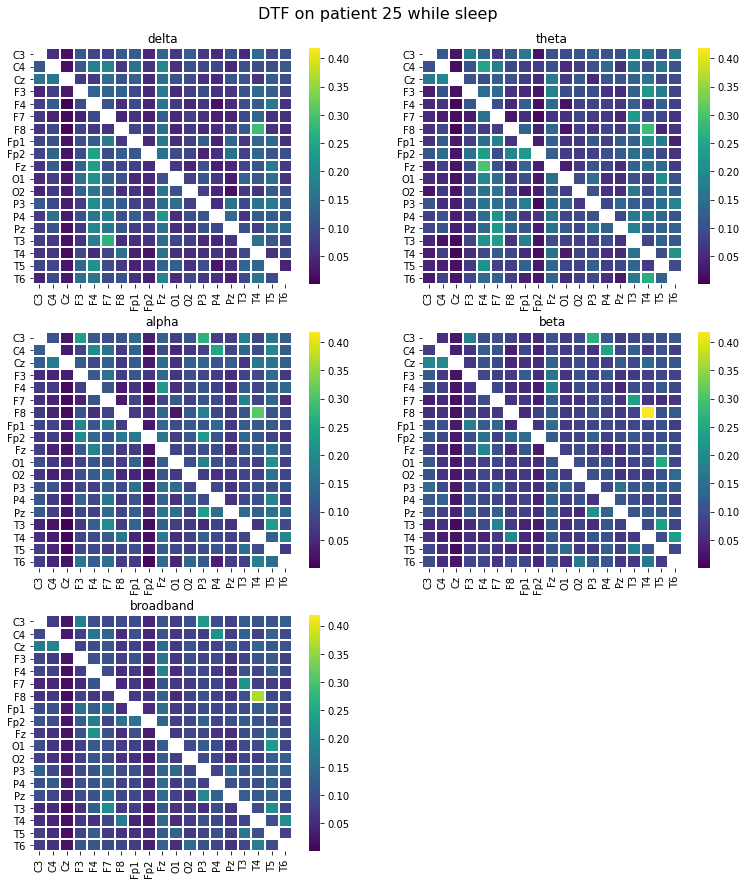

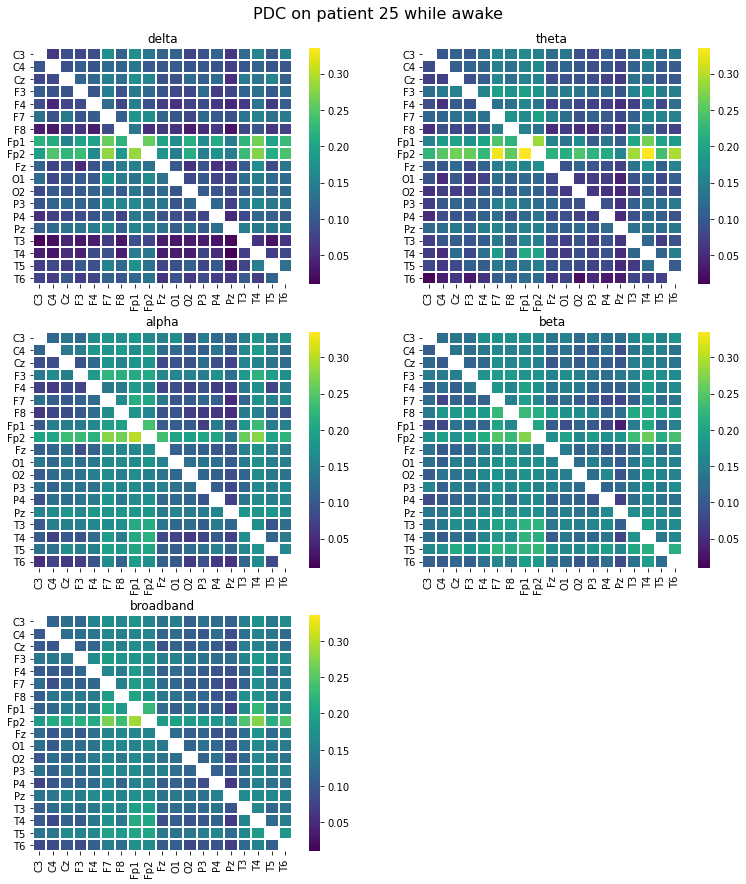

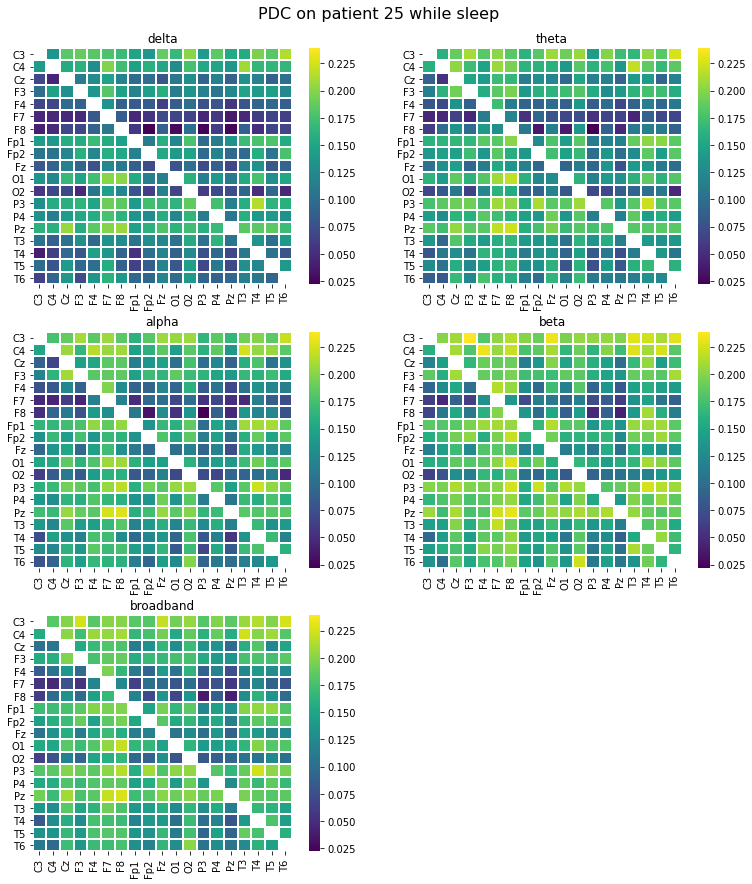

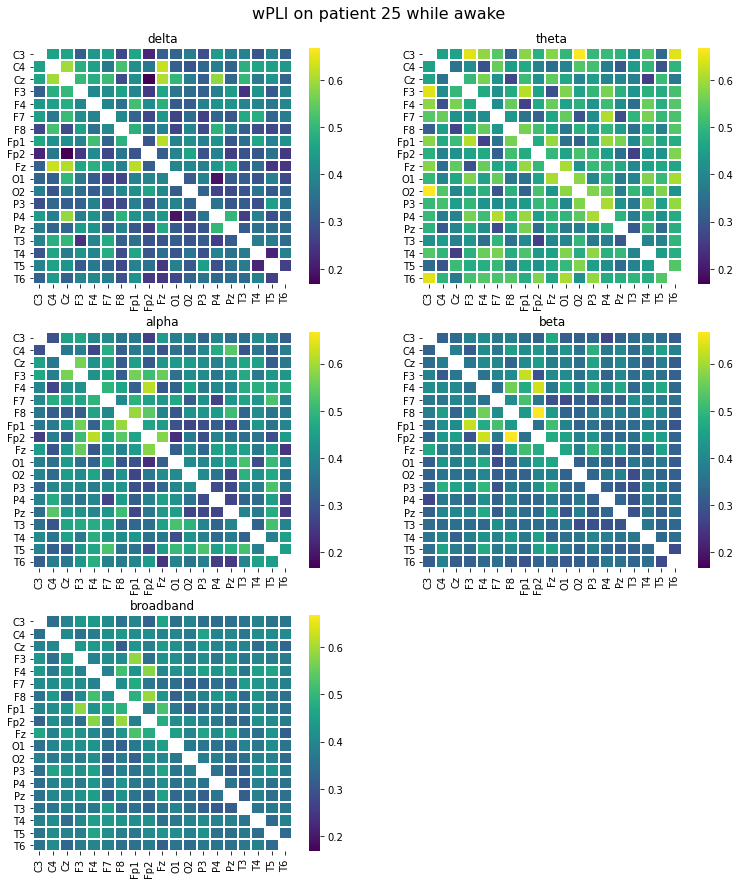

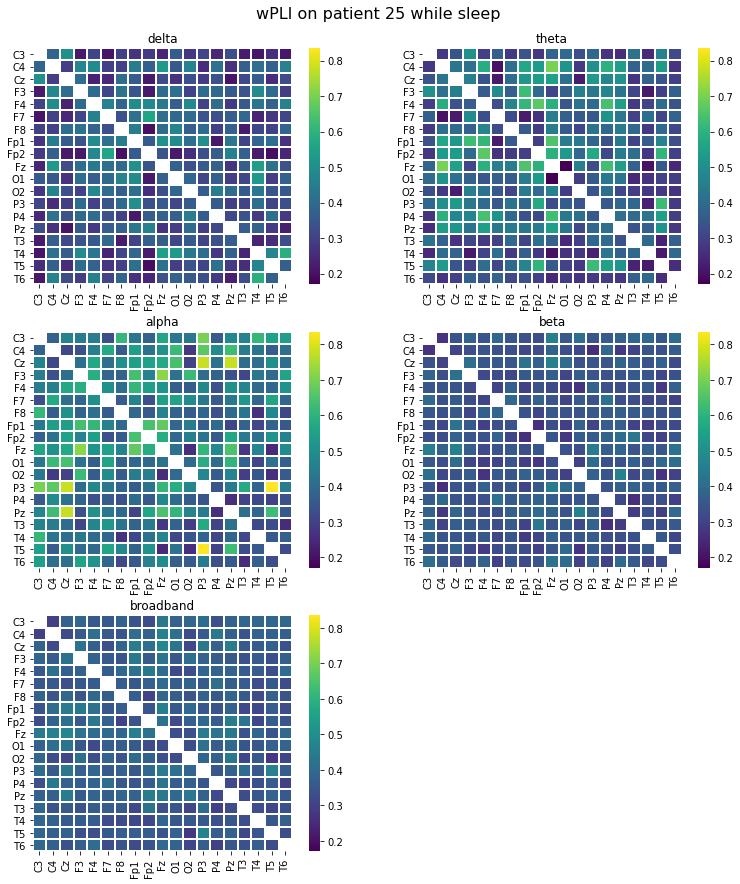

 65%|█████████████████████████████████████████████████▉                           | 24/37 [2:19:34<1:26:30, 399.27s/it]

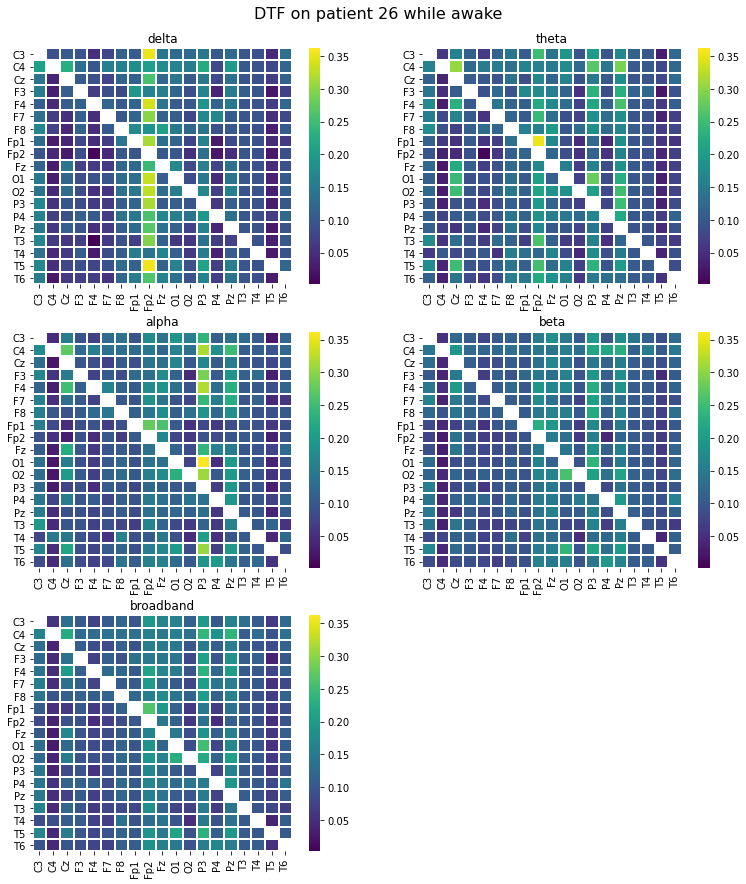

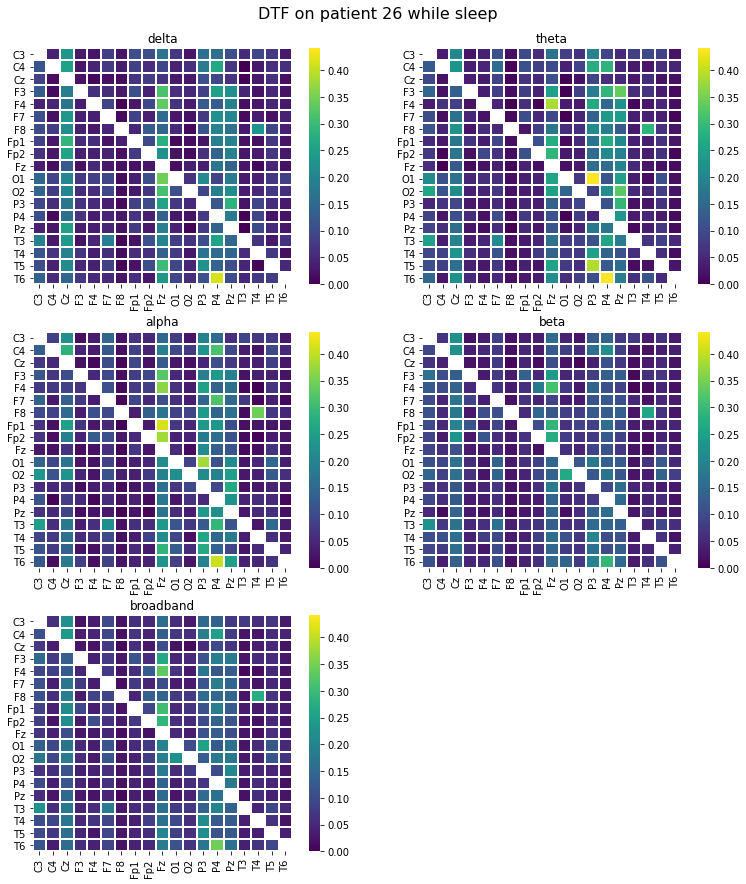

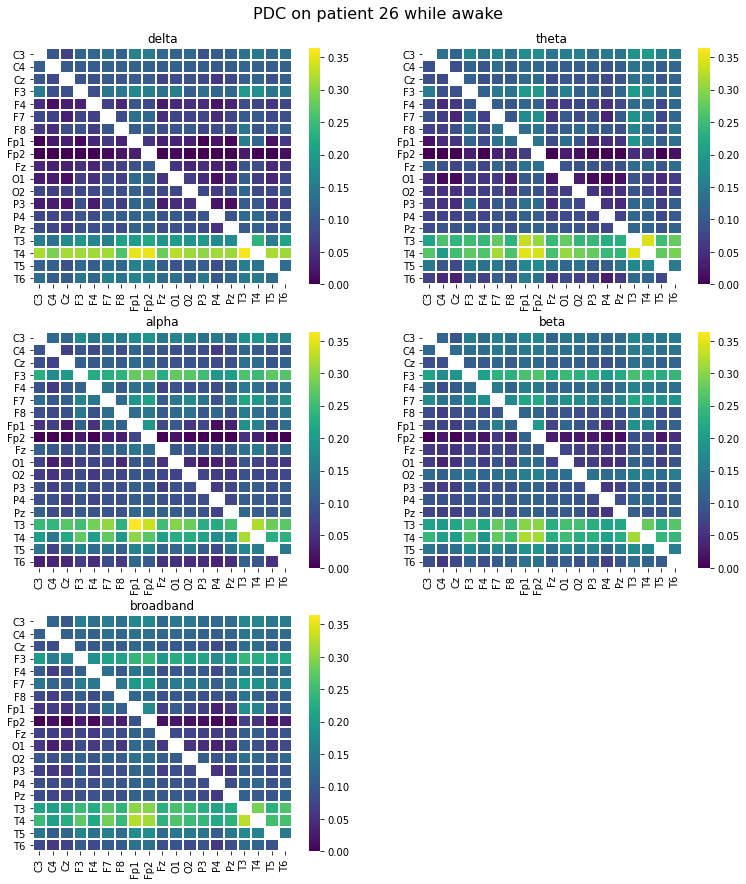

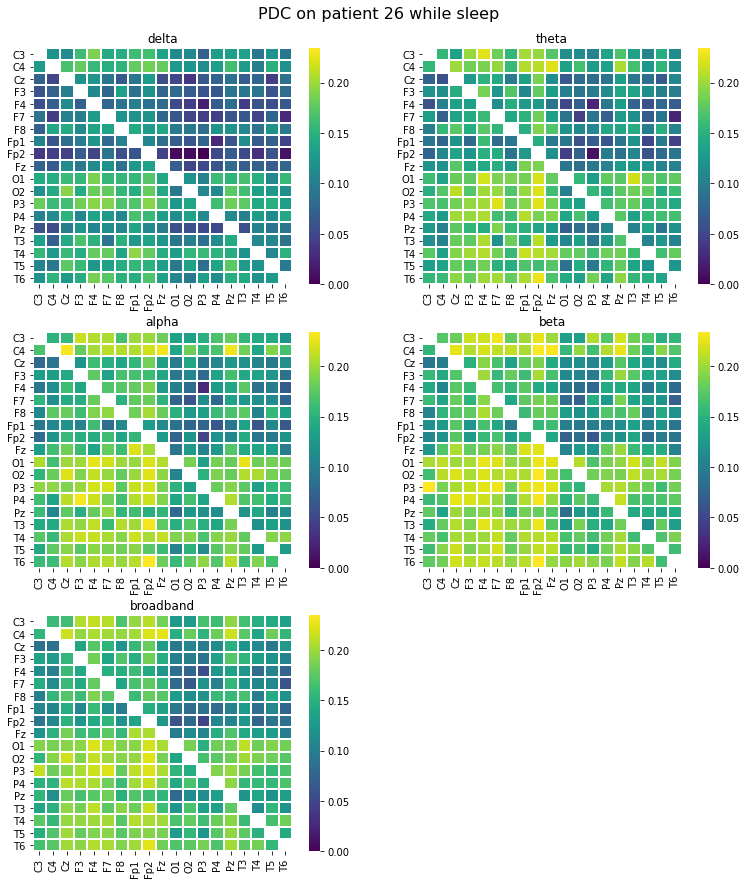

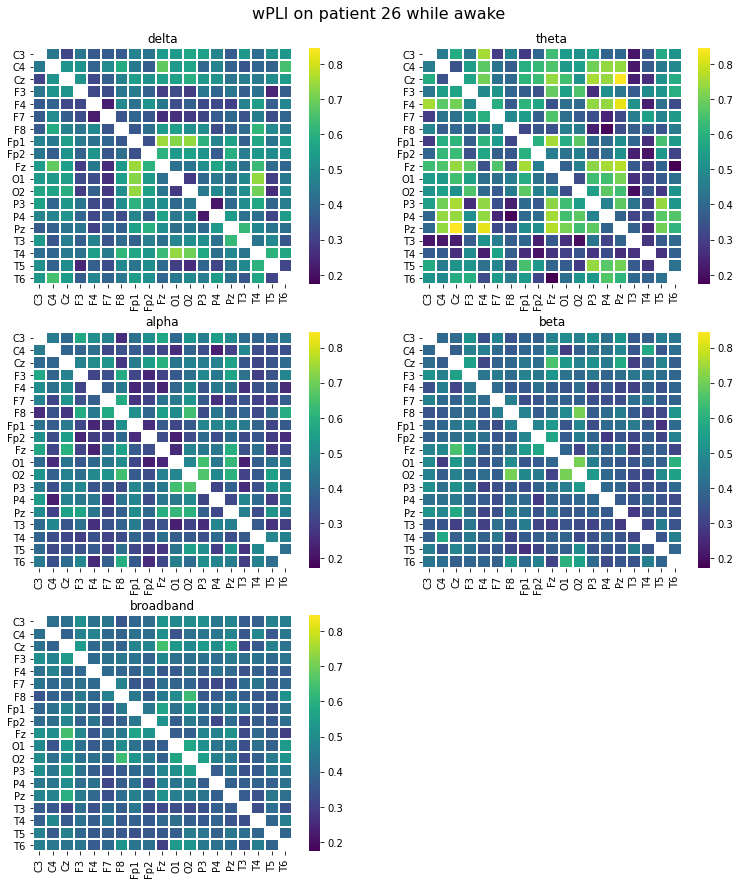

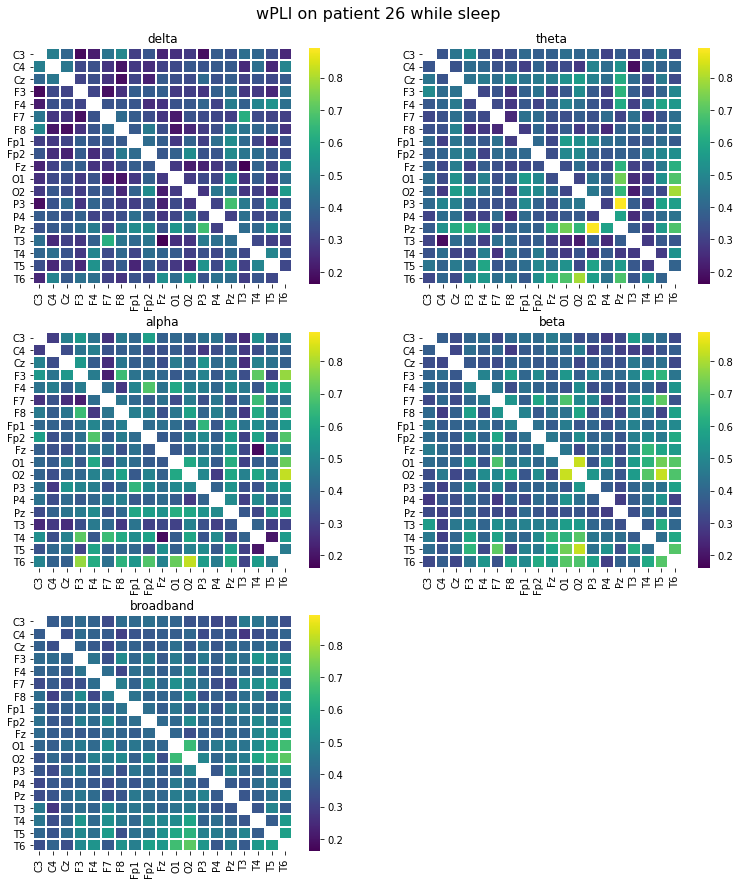

 68%|████████████████████████████████████████████████████                         | 25/37 [2:25:05<1:15:43, 378.64s/it]

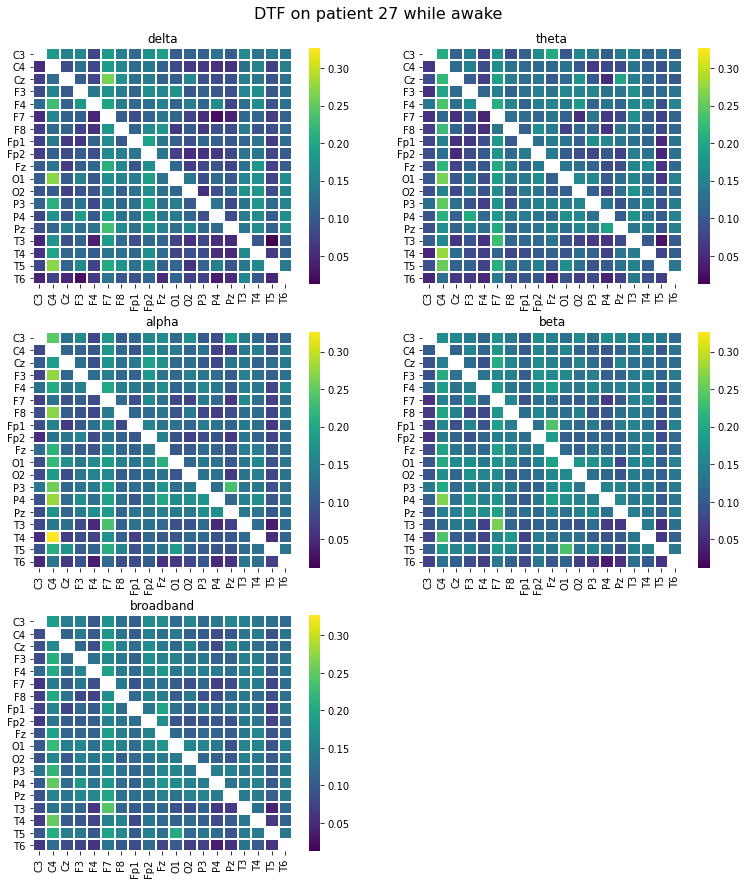

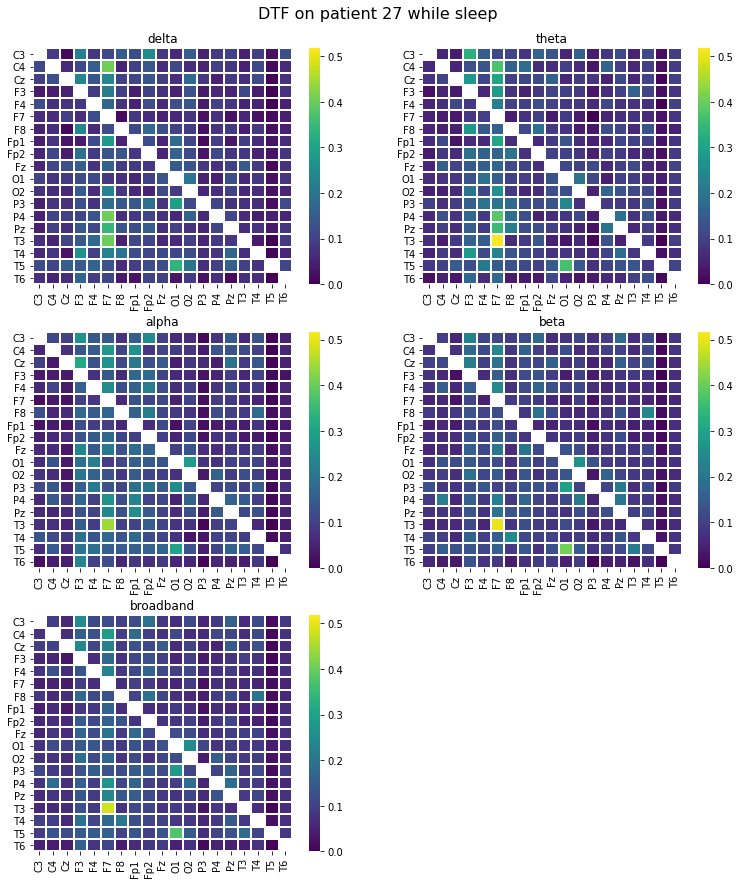

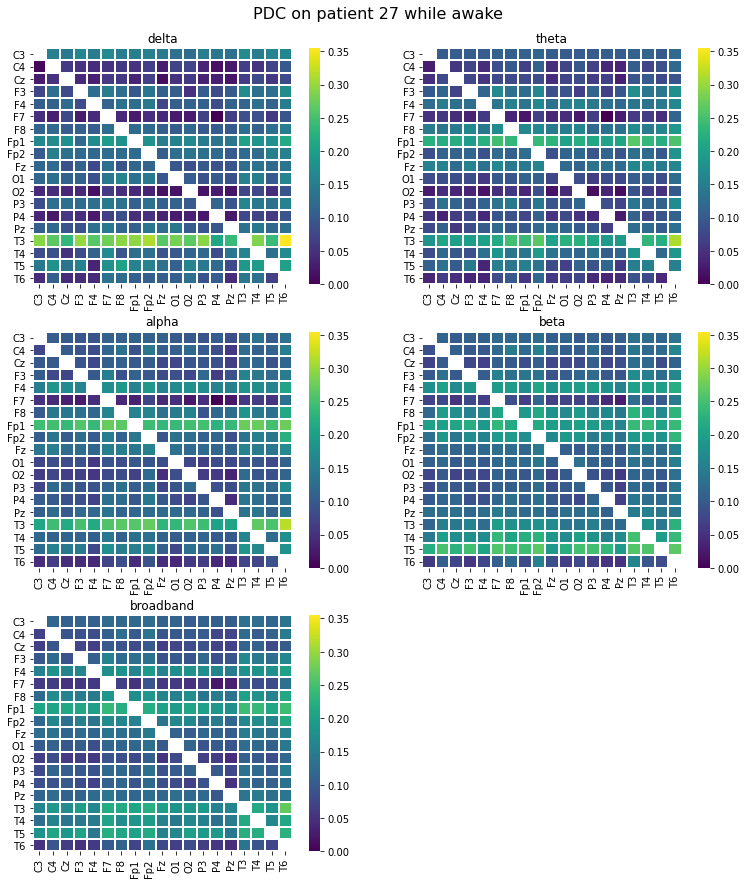

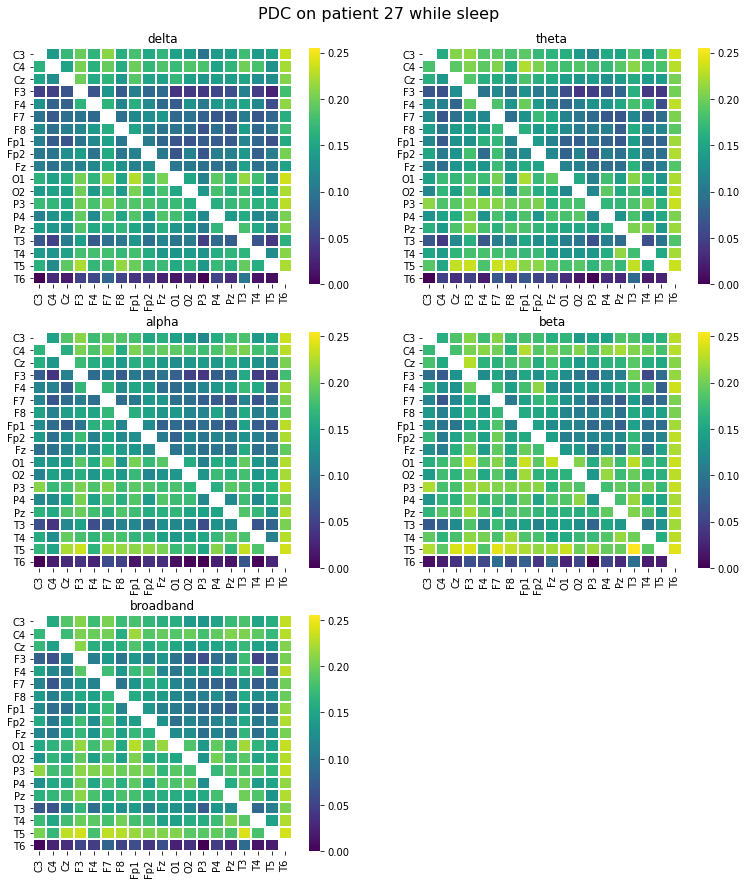

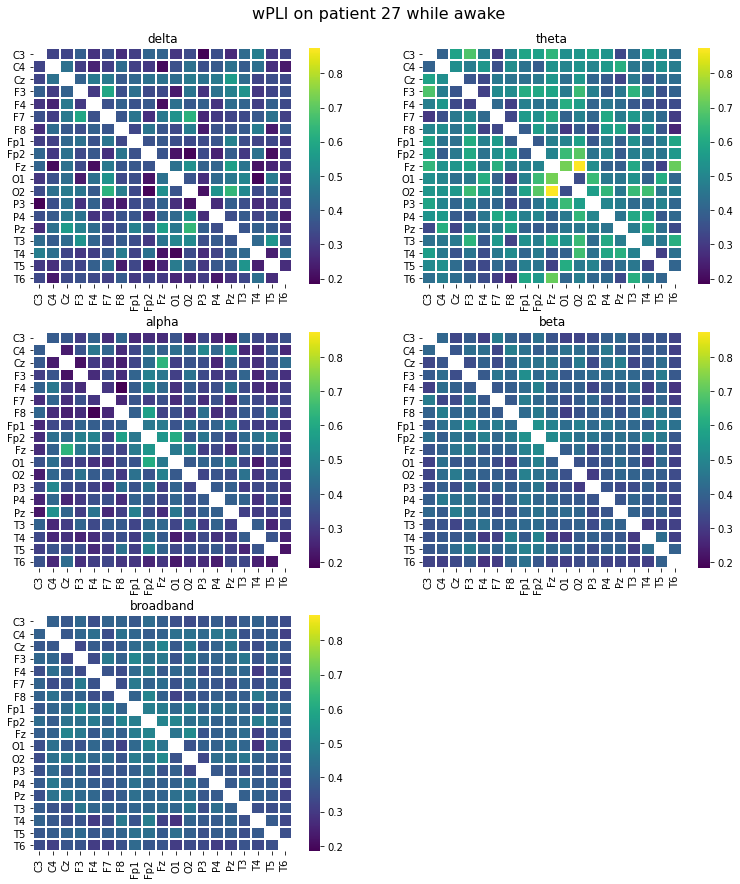

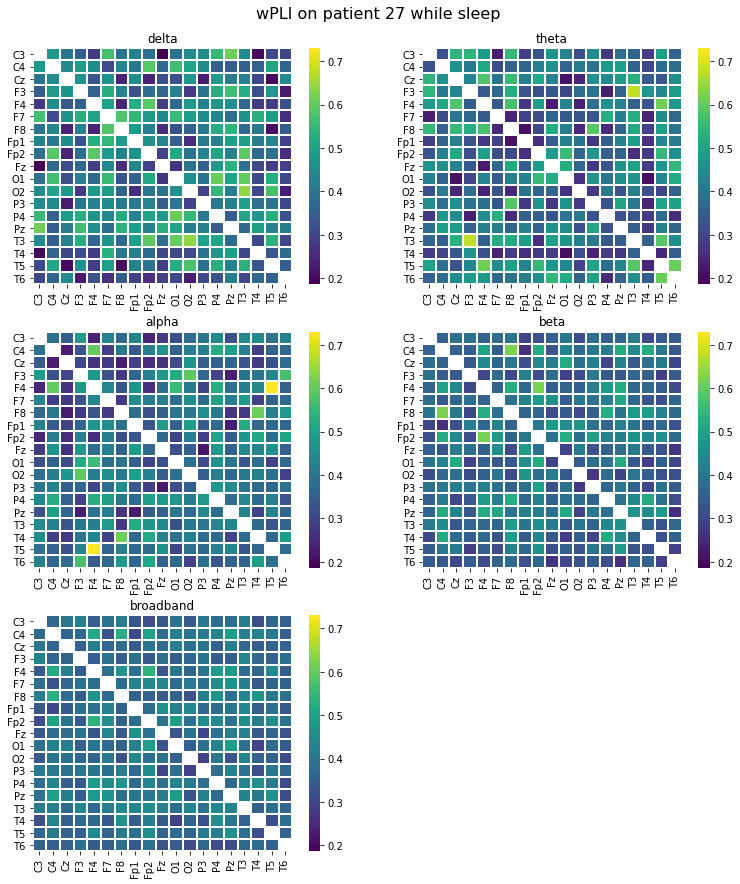

 70%|██████████████████████████████████████████████████████                       | 26/37 [2:30:32<1:06:37, 363.39s/it]

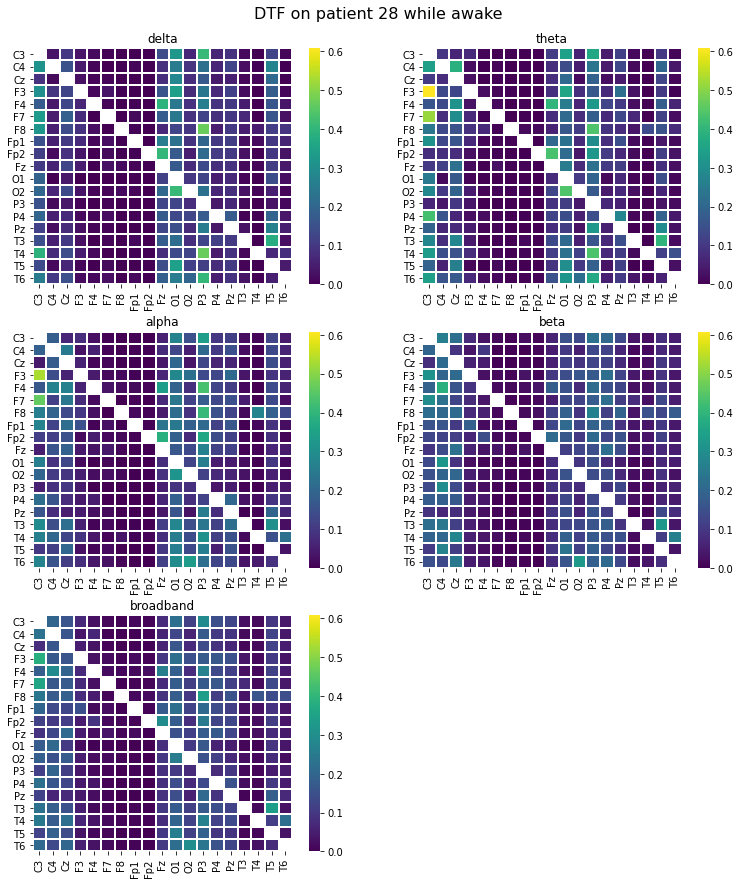

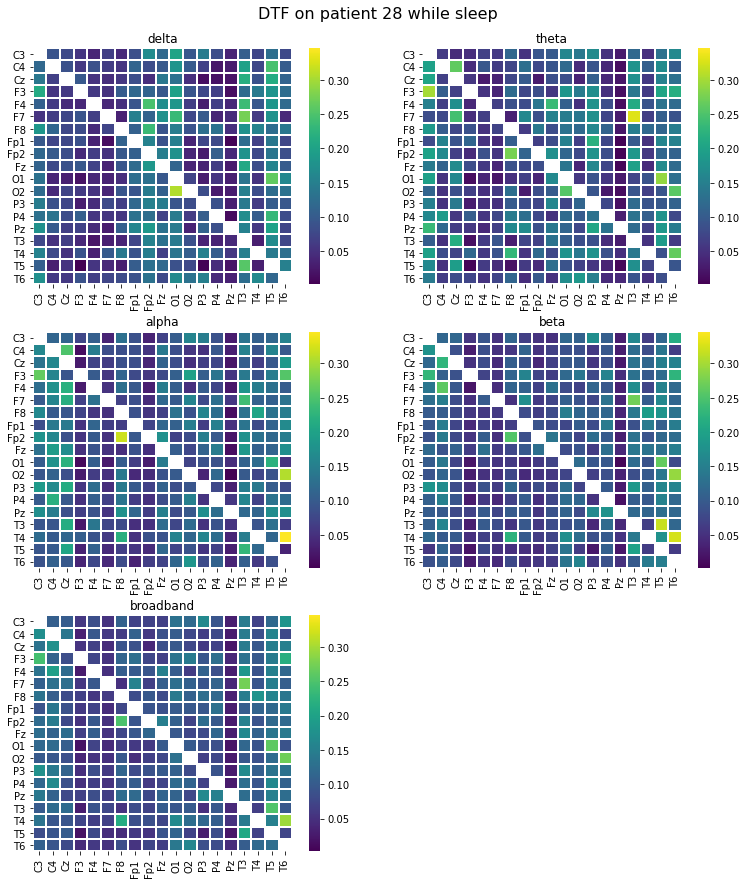

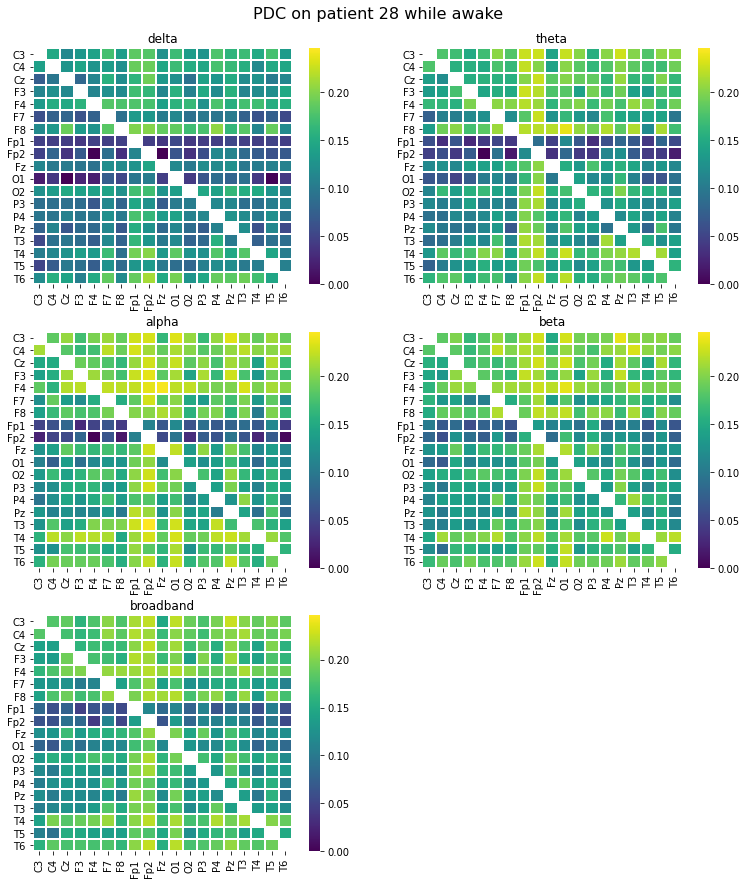

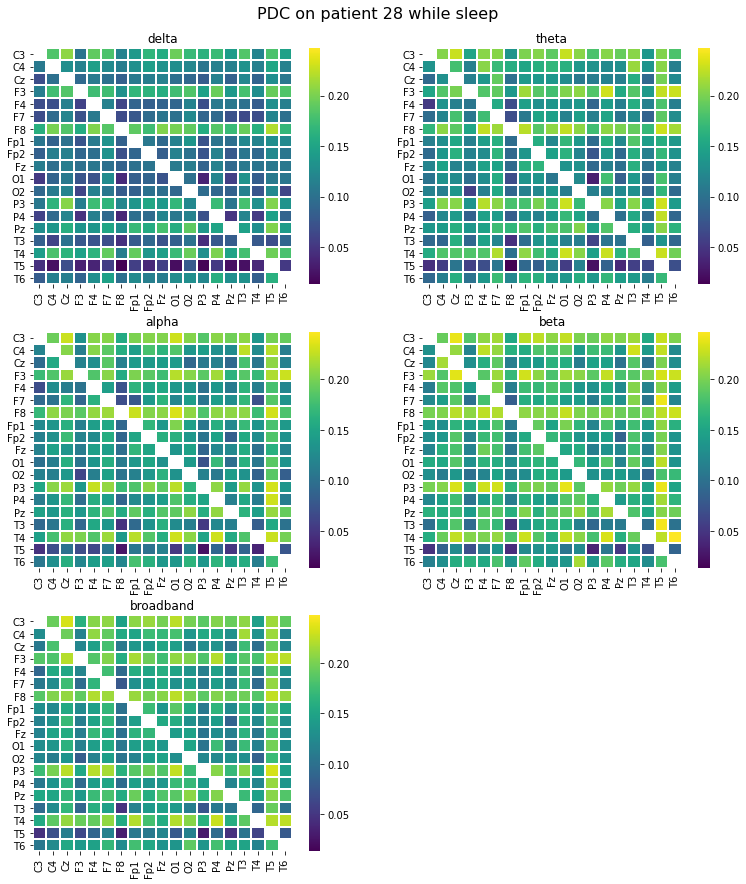

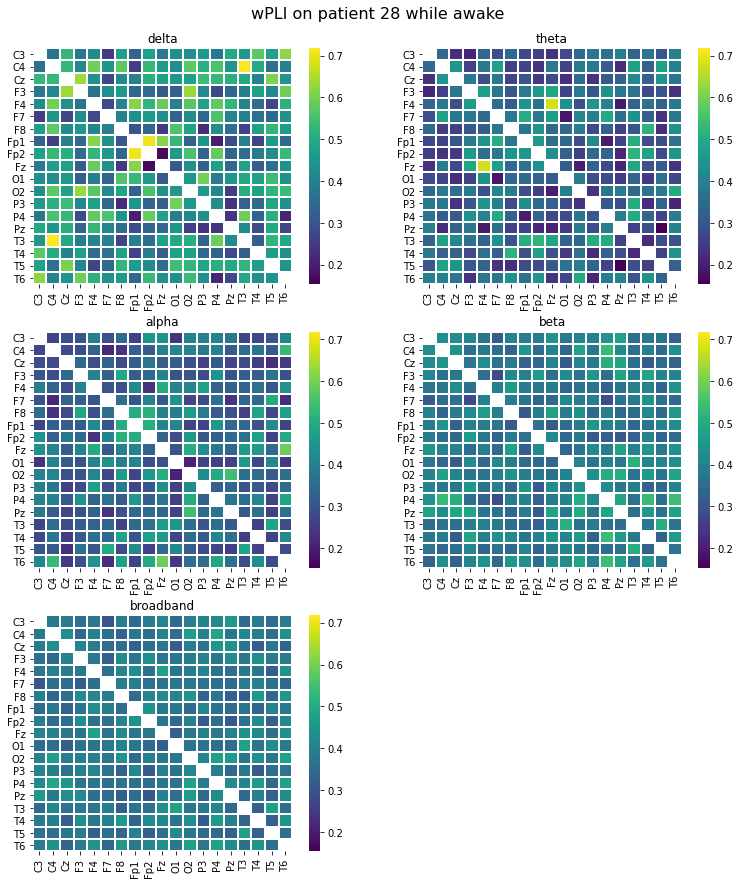

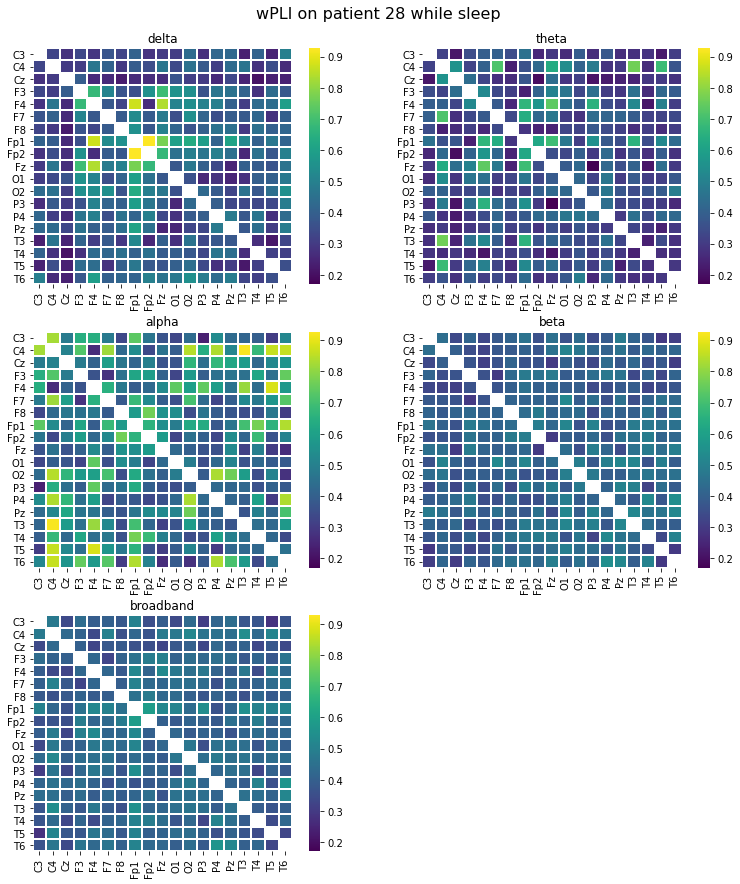

 73%|█████████████████████████████████████████████████████████▋                     | 27/37 [2:36:05<59:01, 354.11s/it]

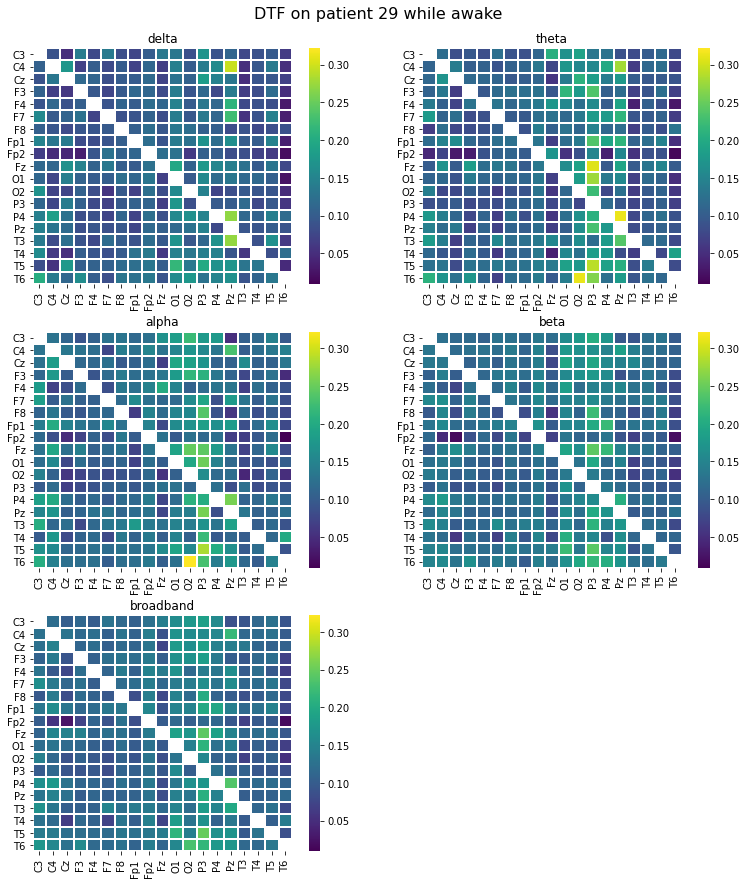

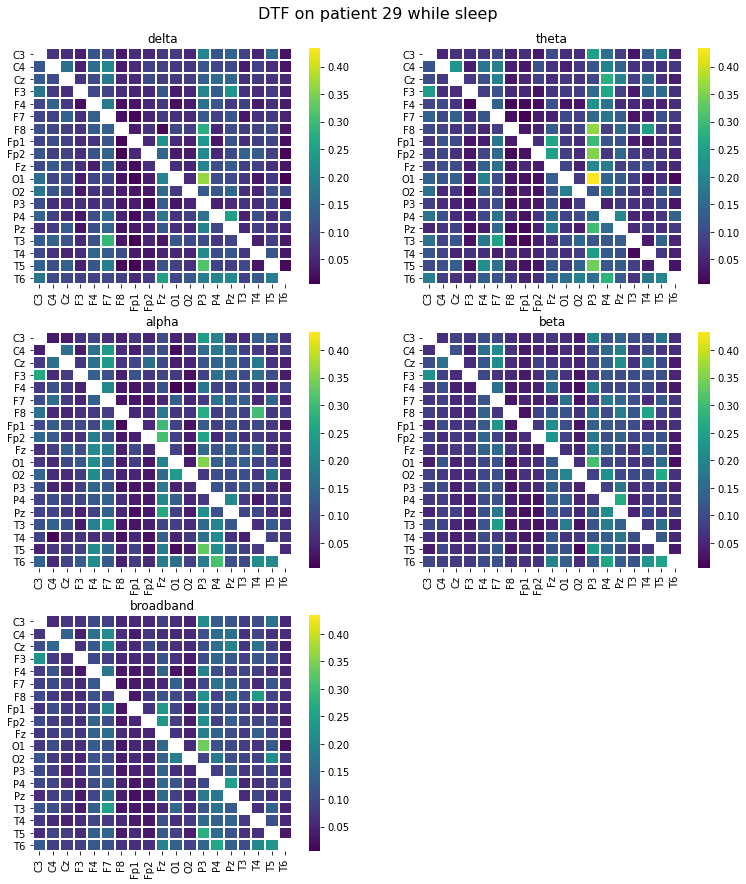

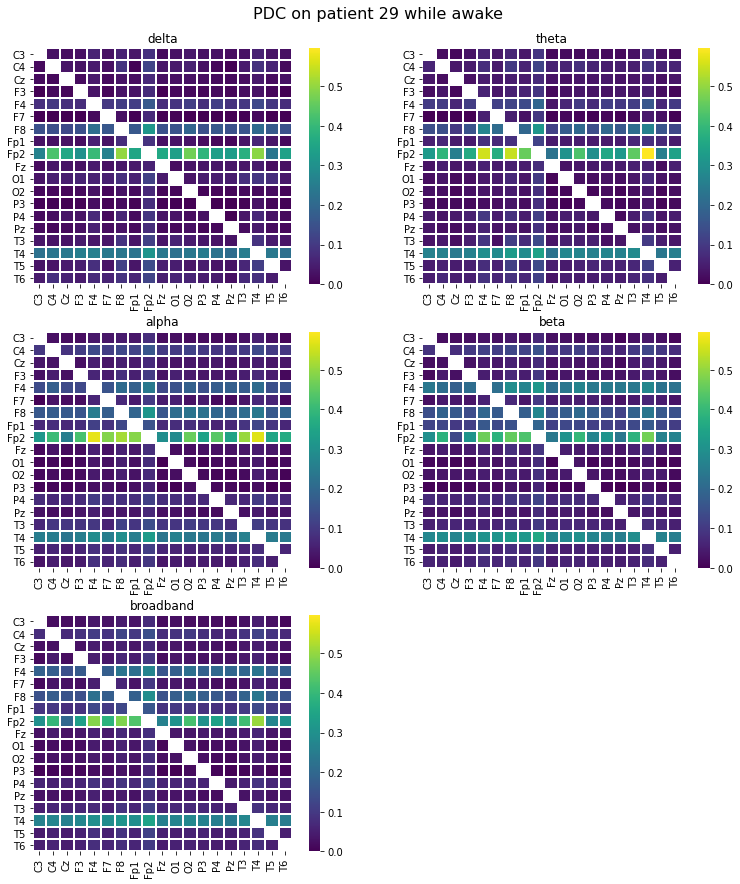

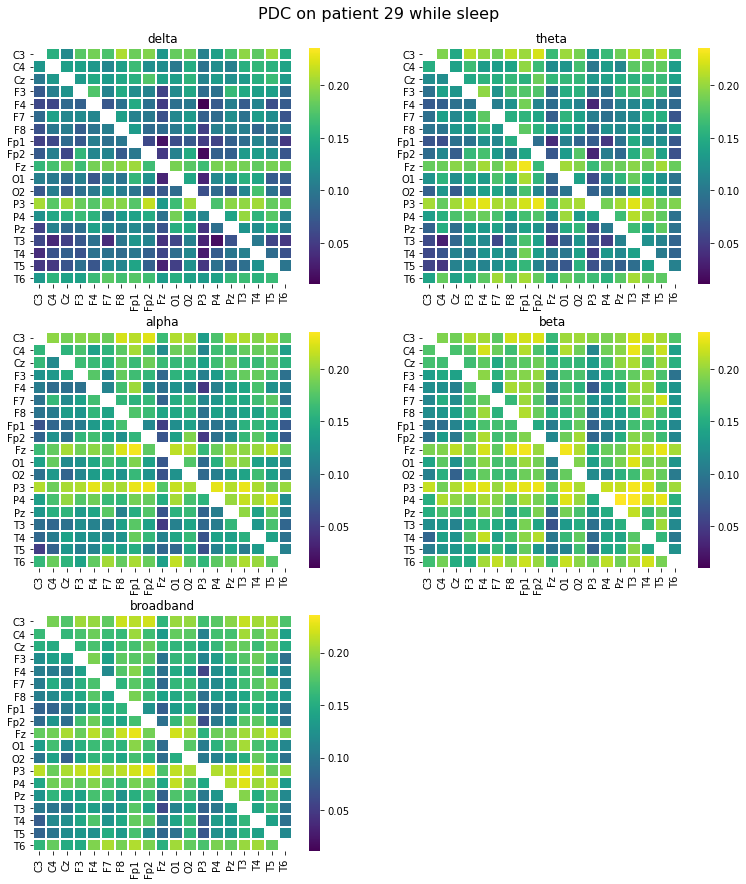

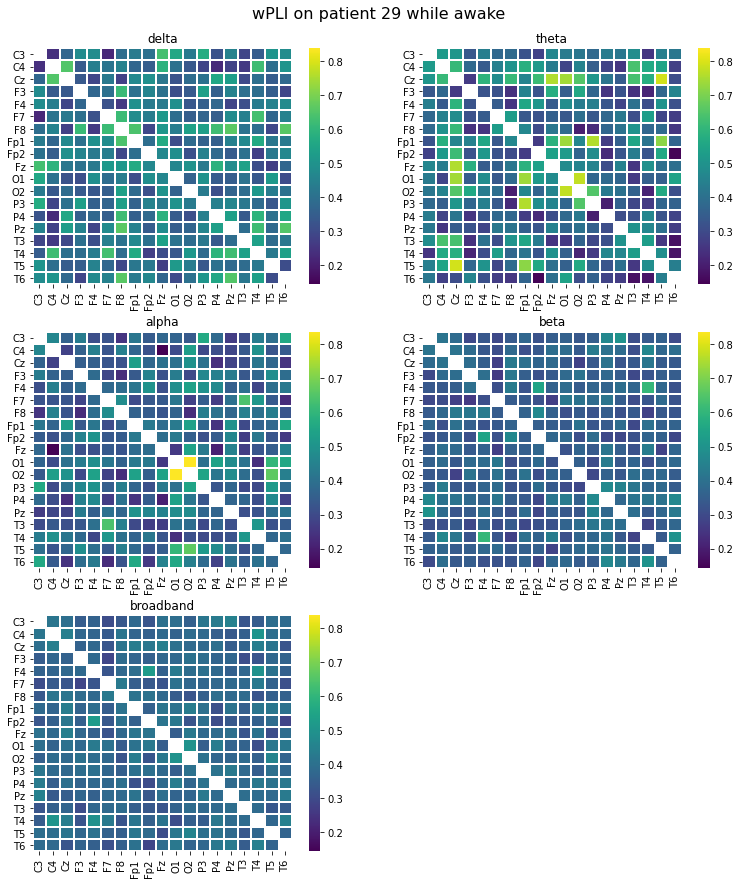

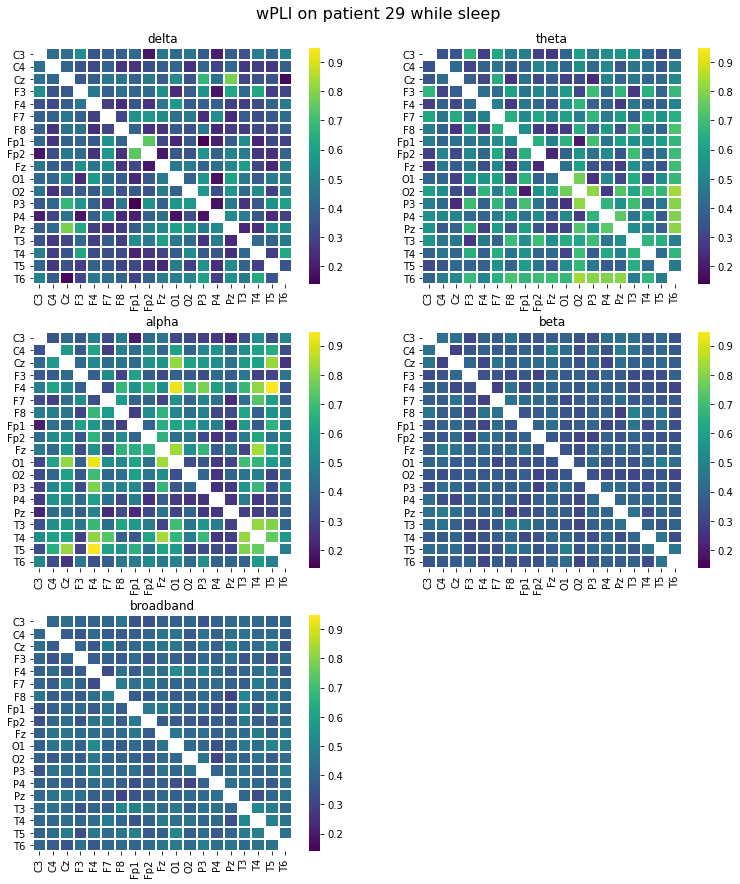

 76%|███████████████████████████████████████████████████████████▊                   | 28/37 [2:41:36<52:06, 347.34s/it]

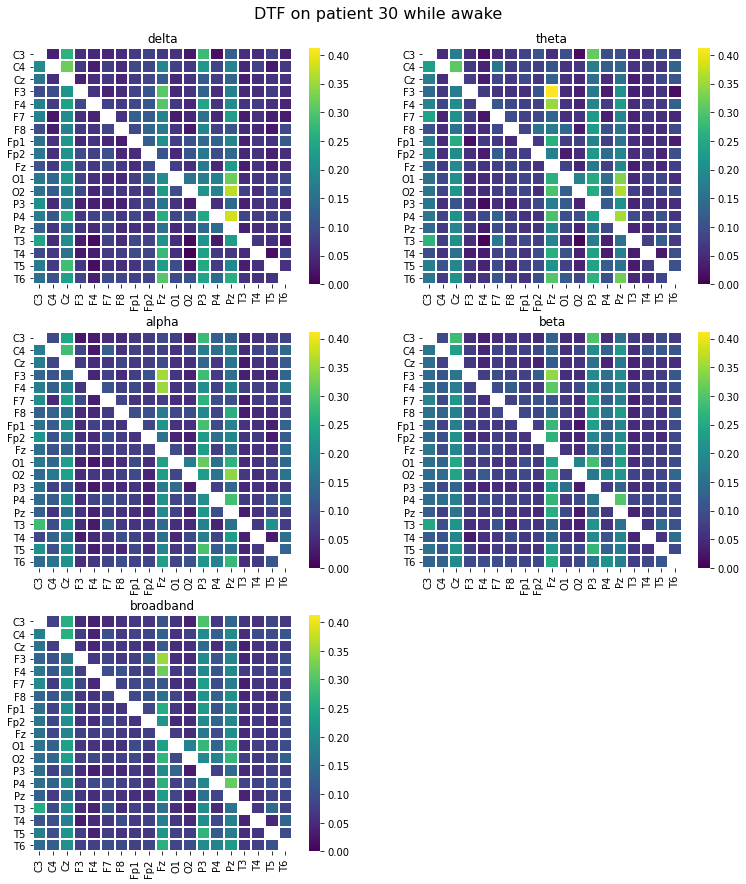

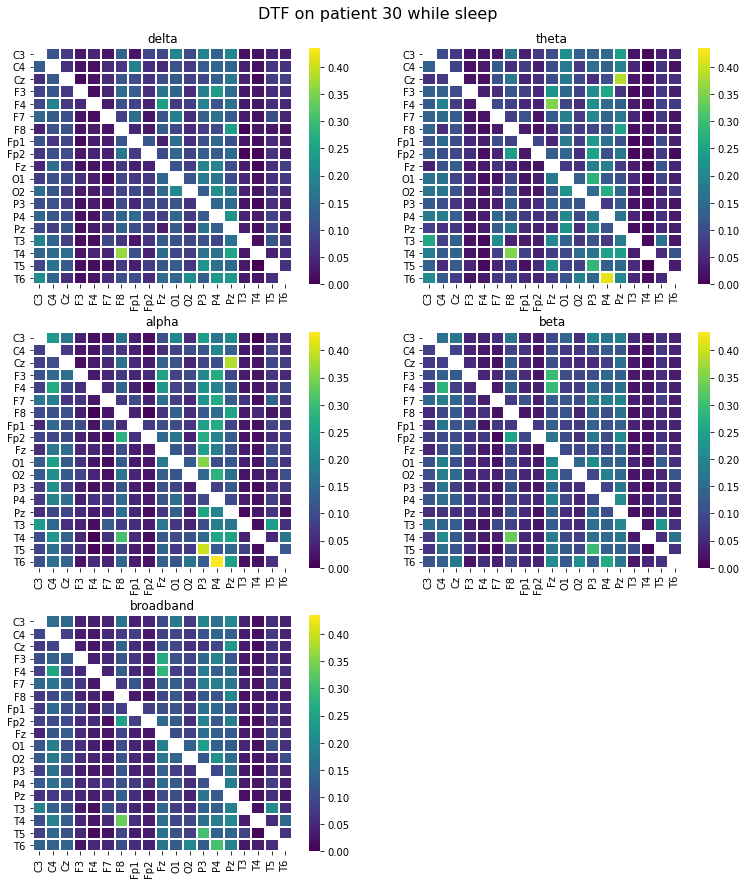

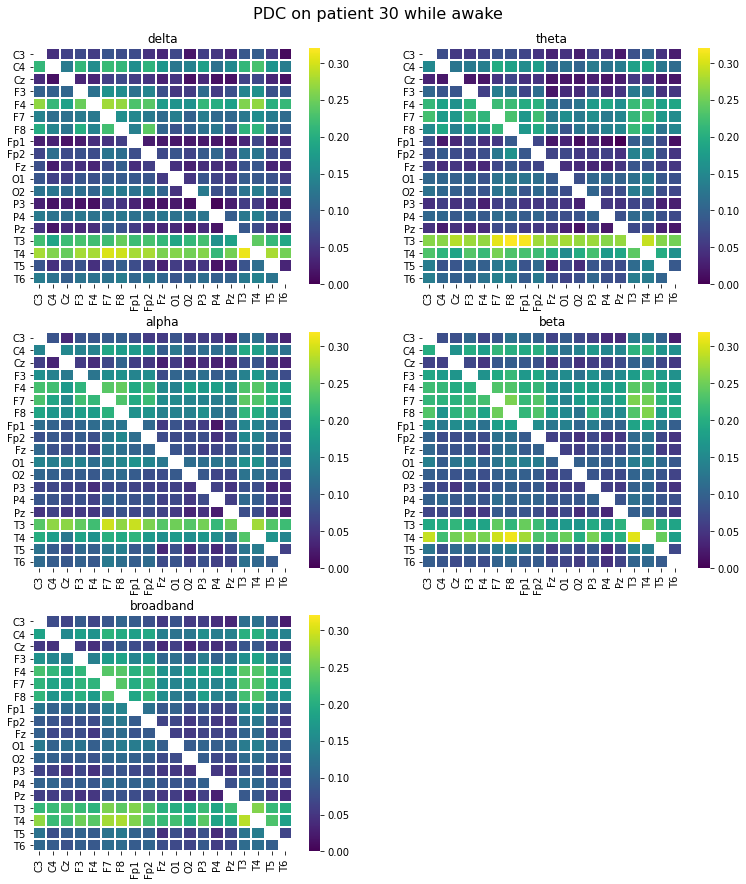

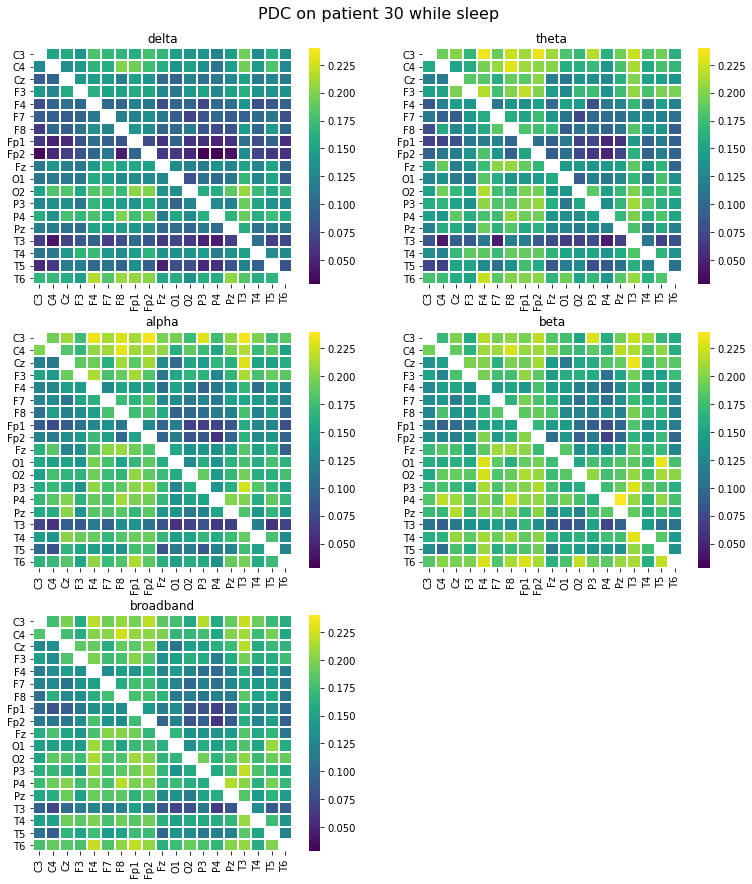

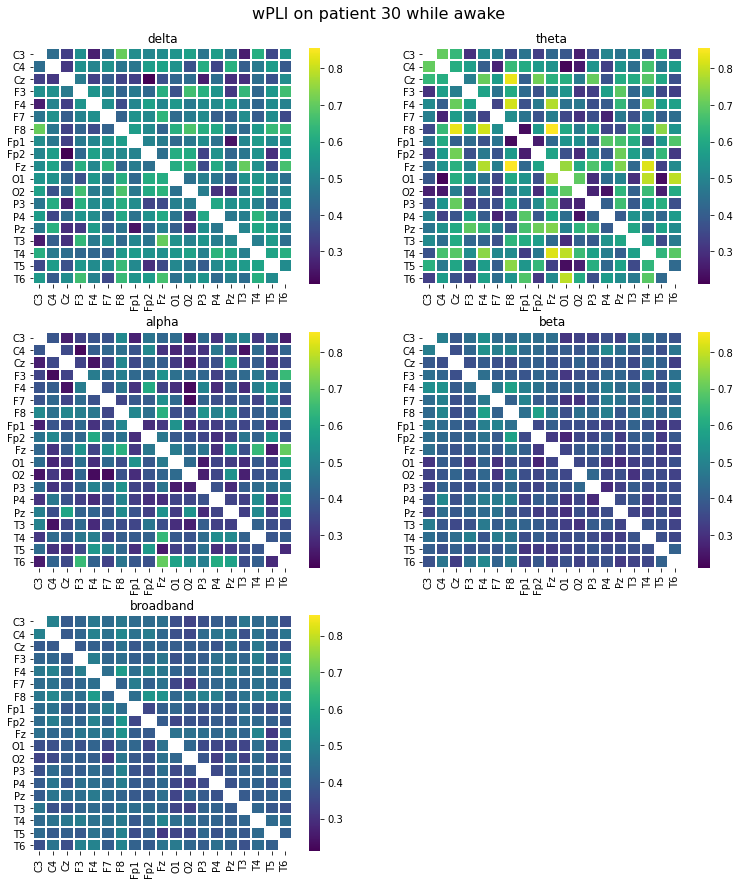

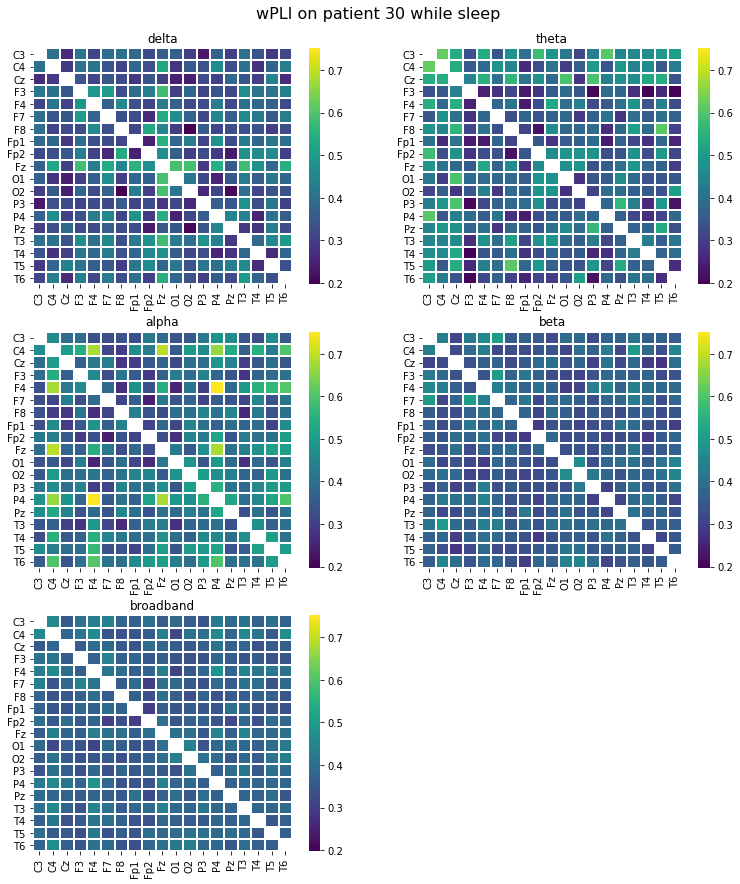

 78%|█████████████████████████████████████████████████████████████▉                 | 29/37 [2:47:10<45:44, 343.10s/it]

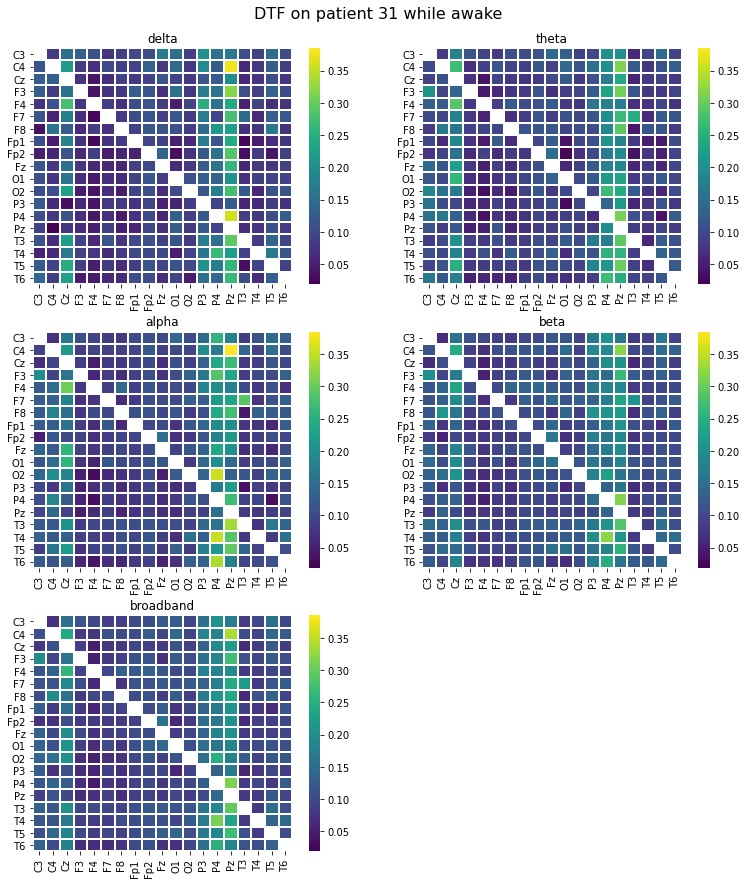

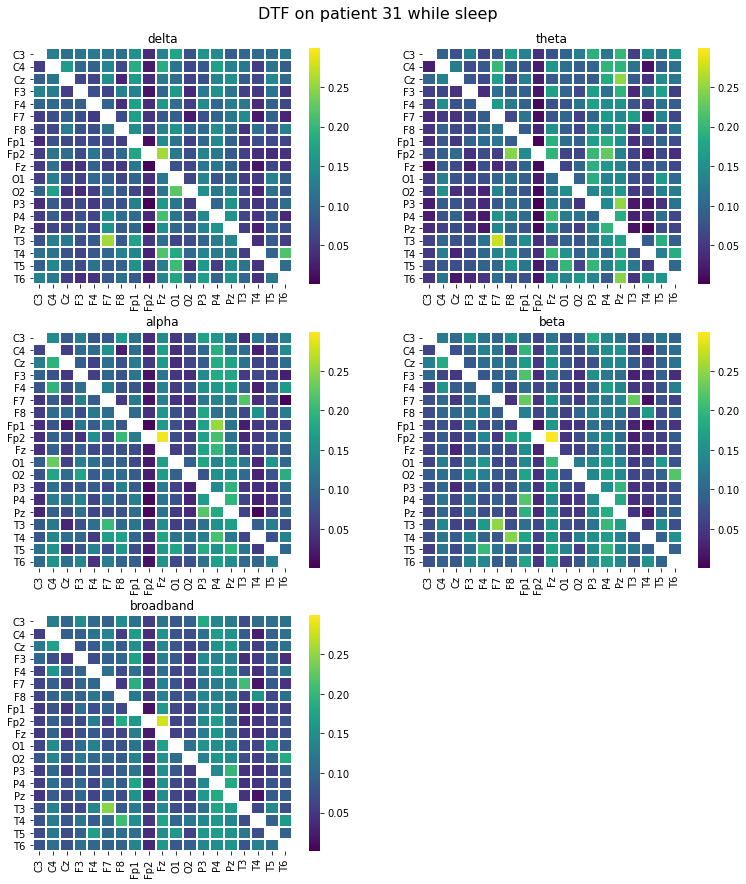

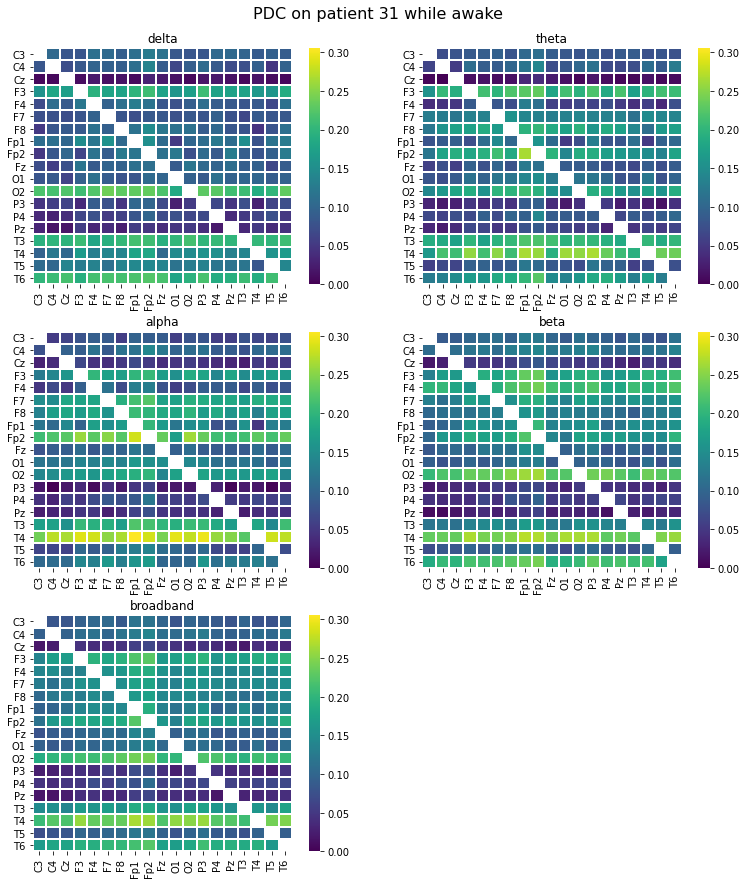

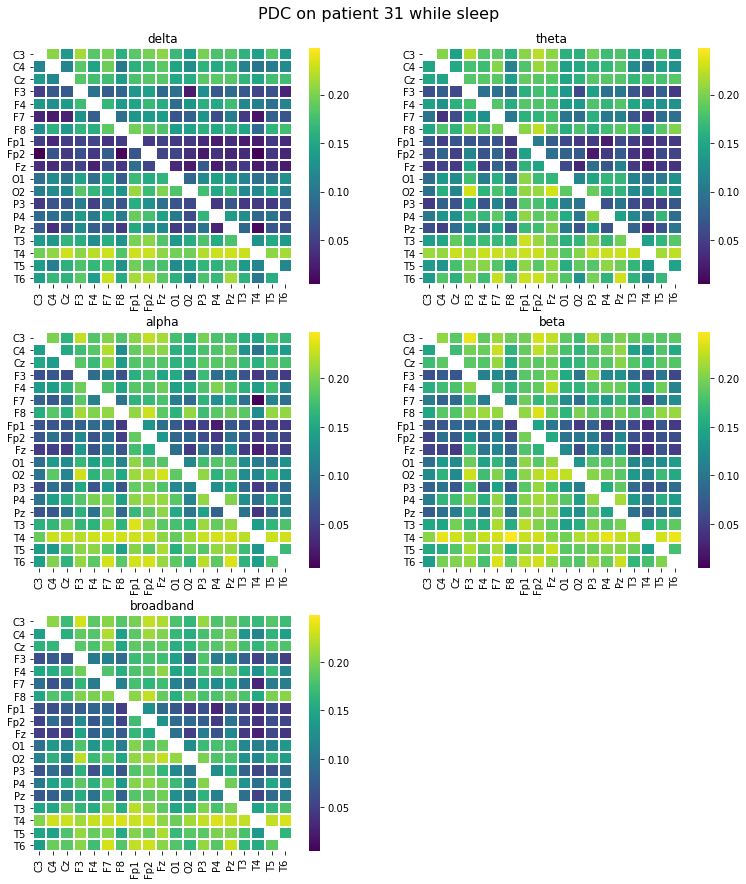

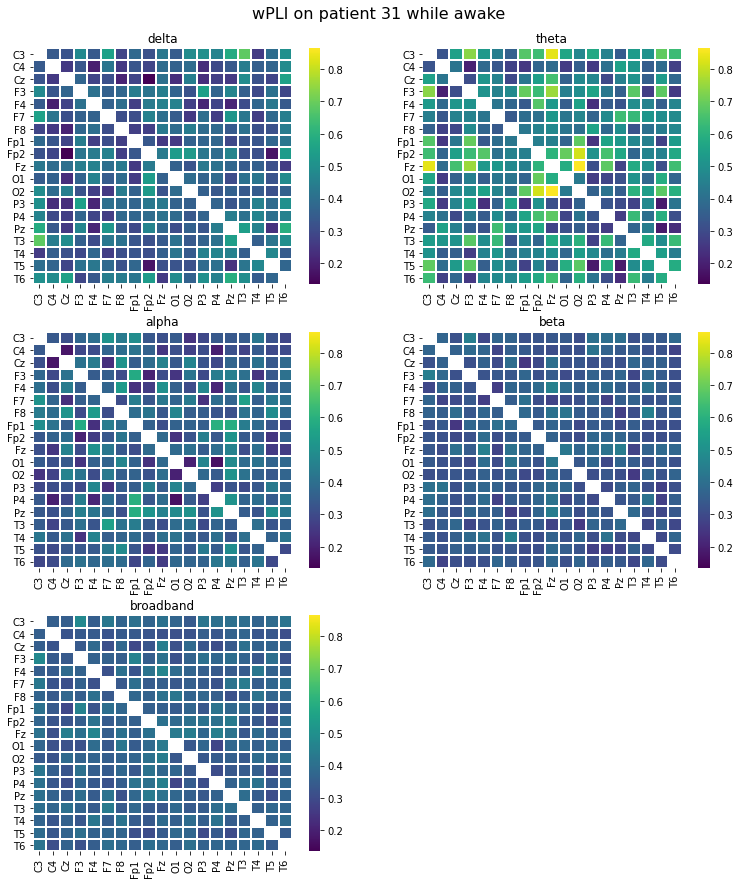

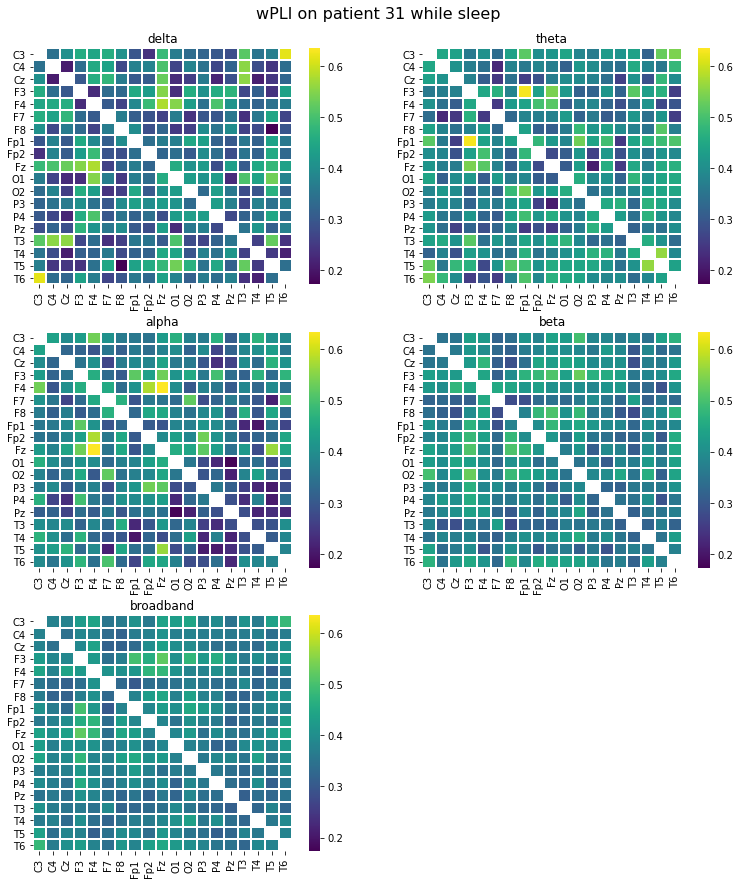

 81%|████████████████████████████████████████████████████████████████               | 30/37 [2:52:43<39:41, 340.19s/it]

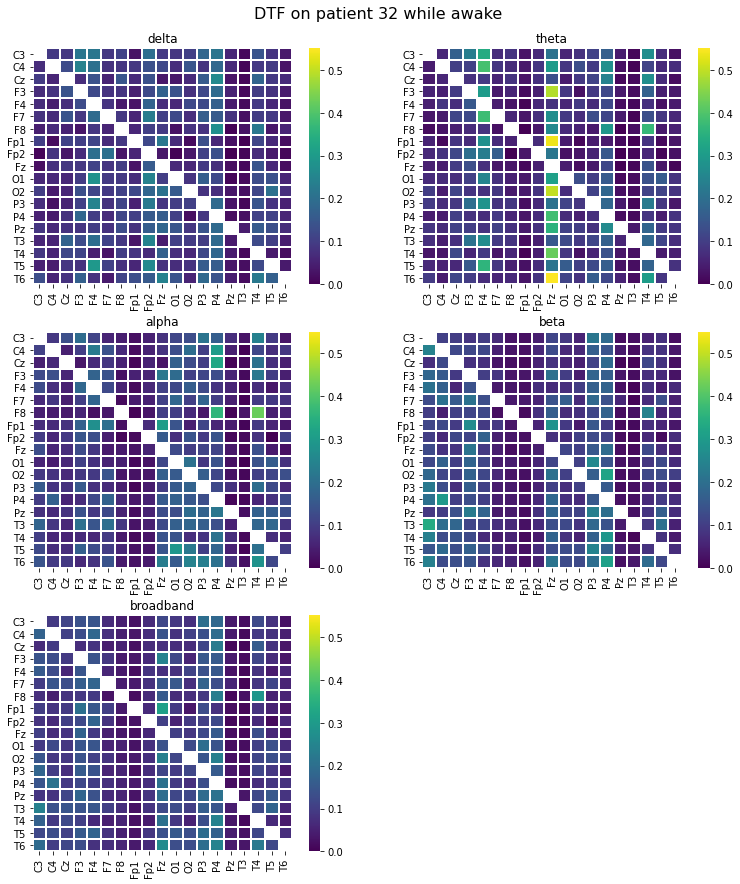

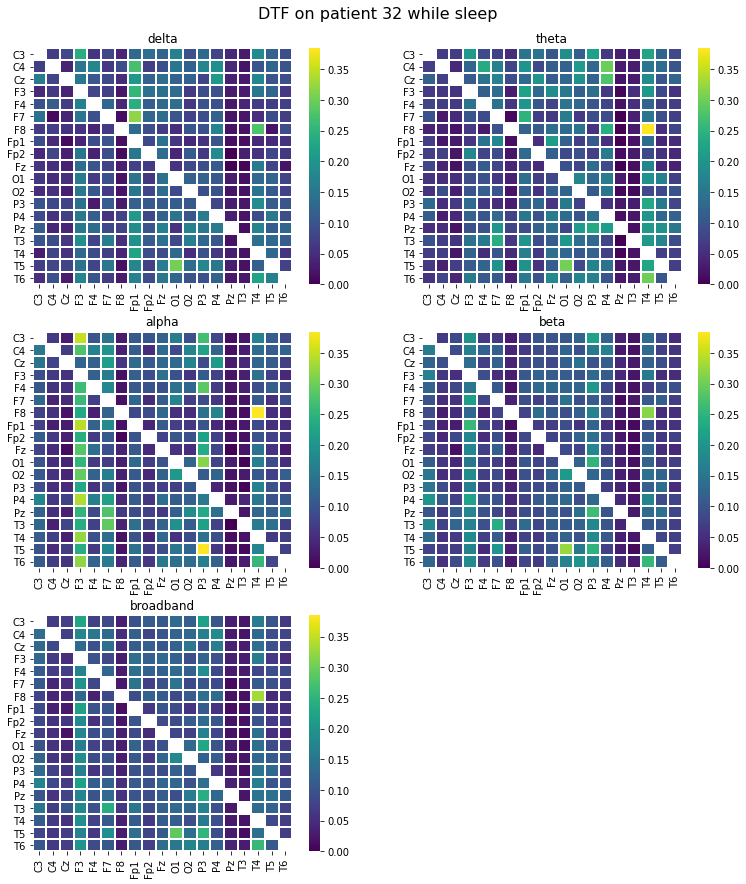

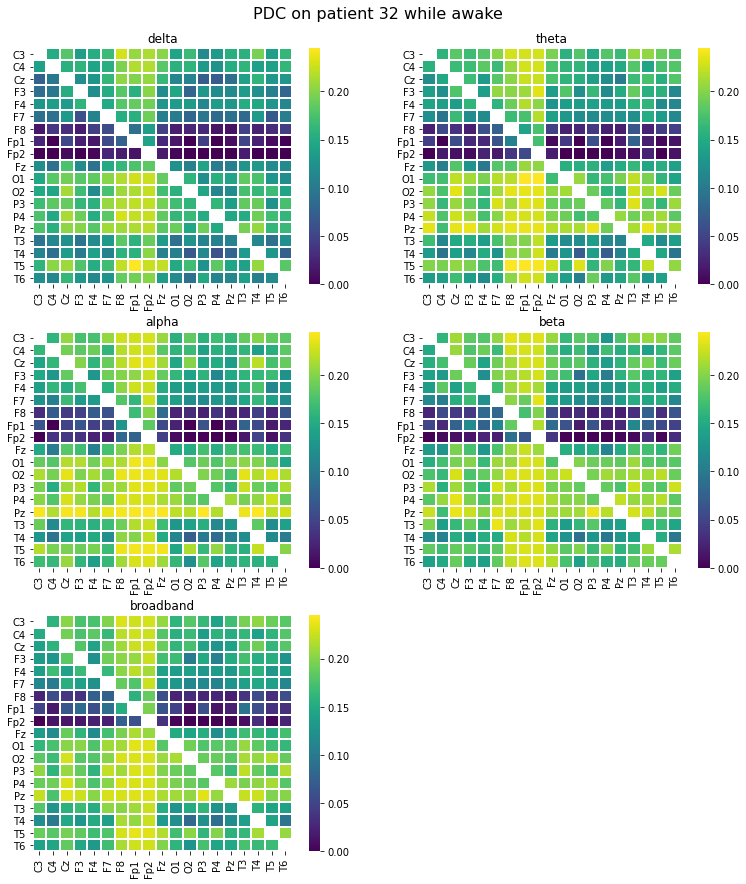

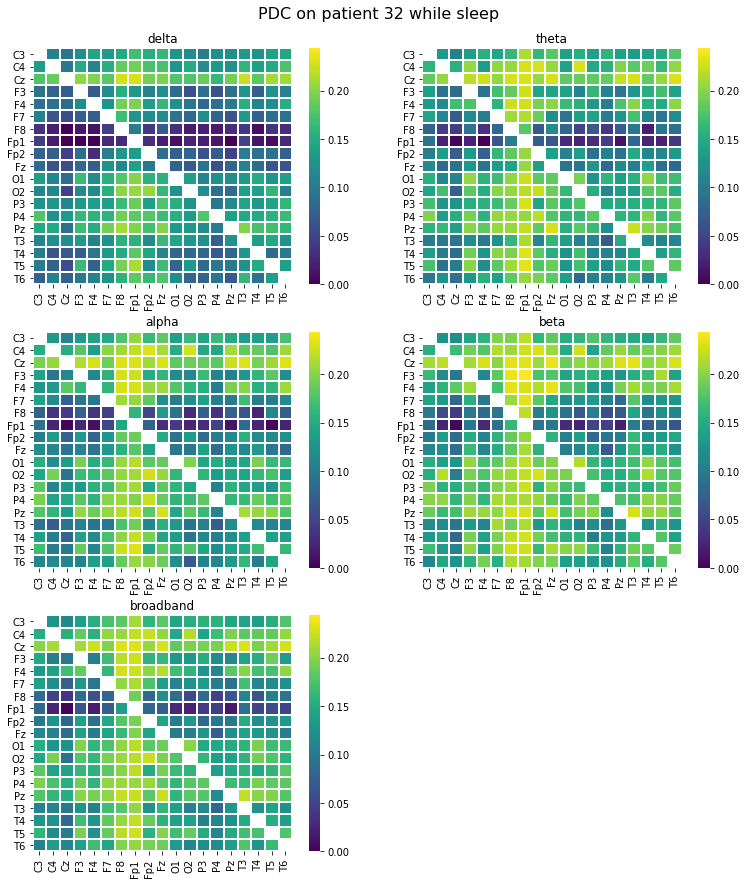

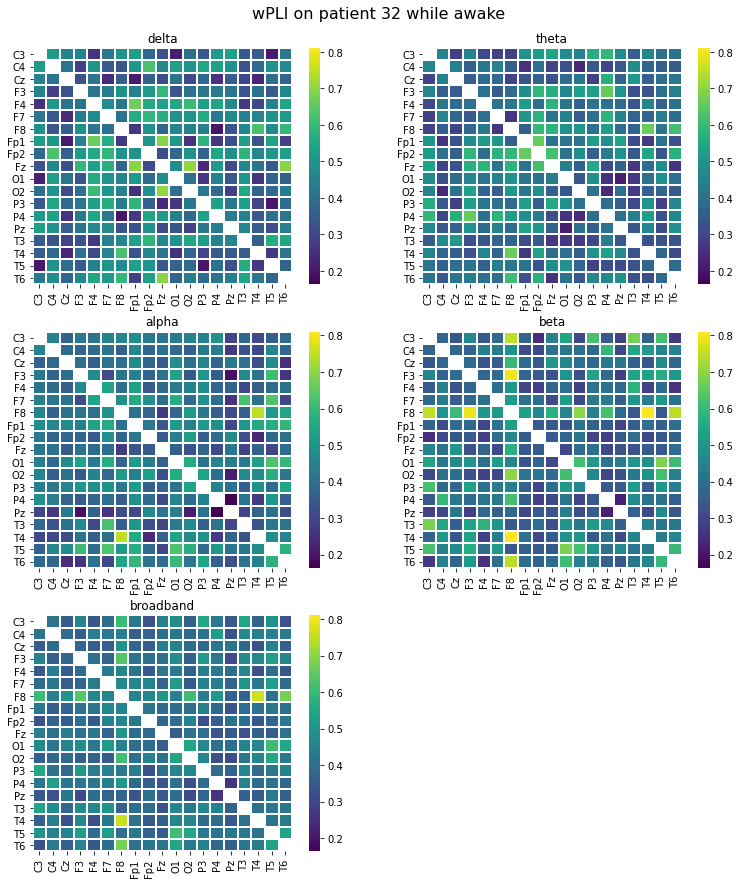

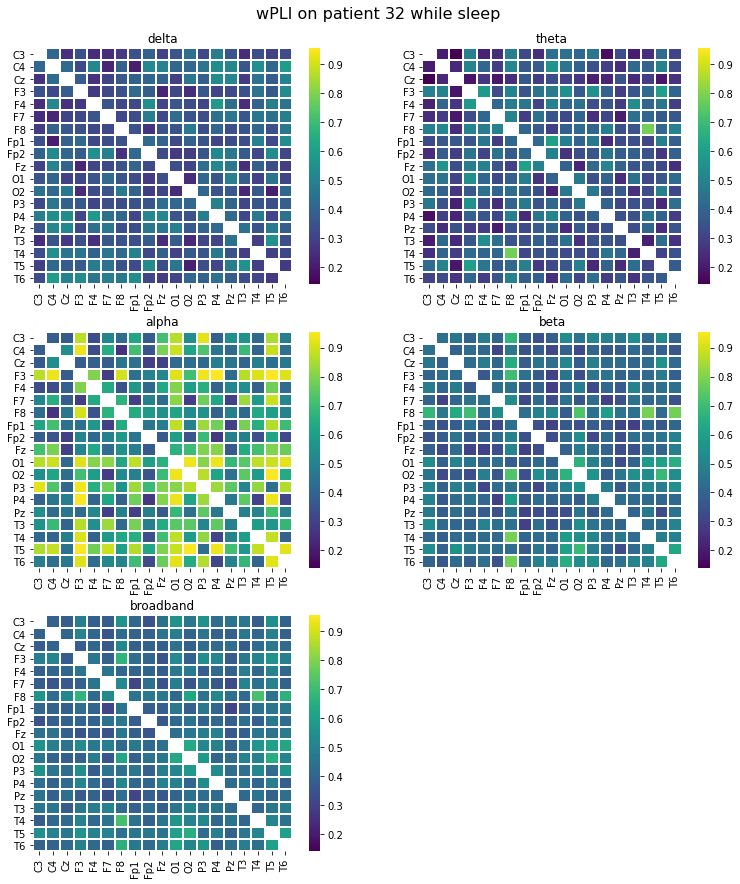

 84%|██████████████████████████████████████████████████████████████████▏            | 31/37 [2:58:16<33:48, 338.01s/it]

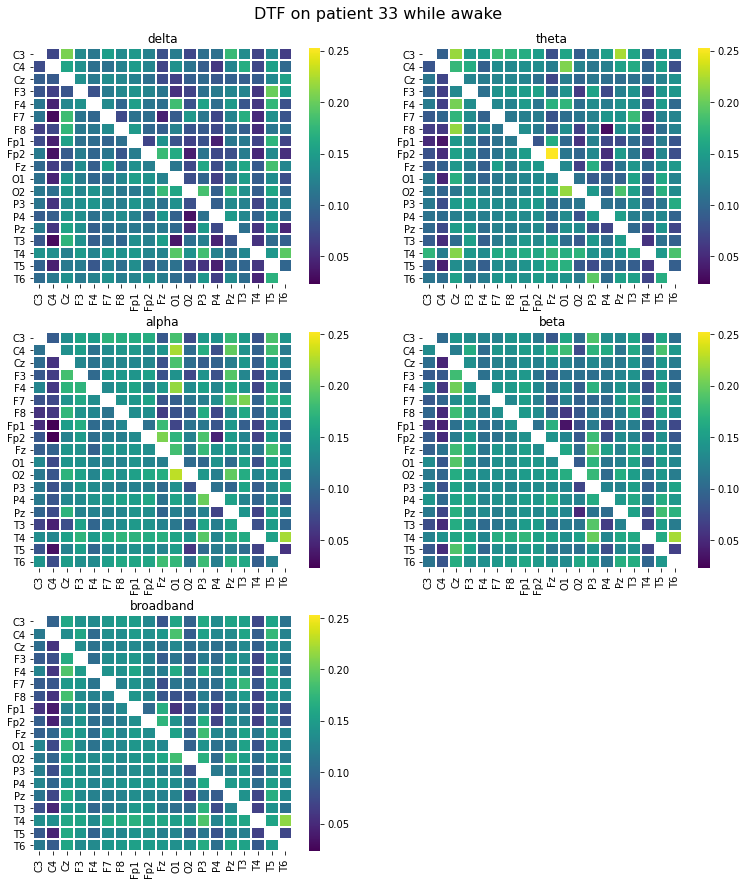

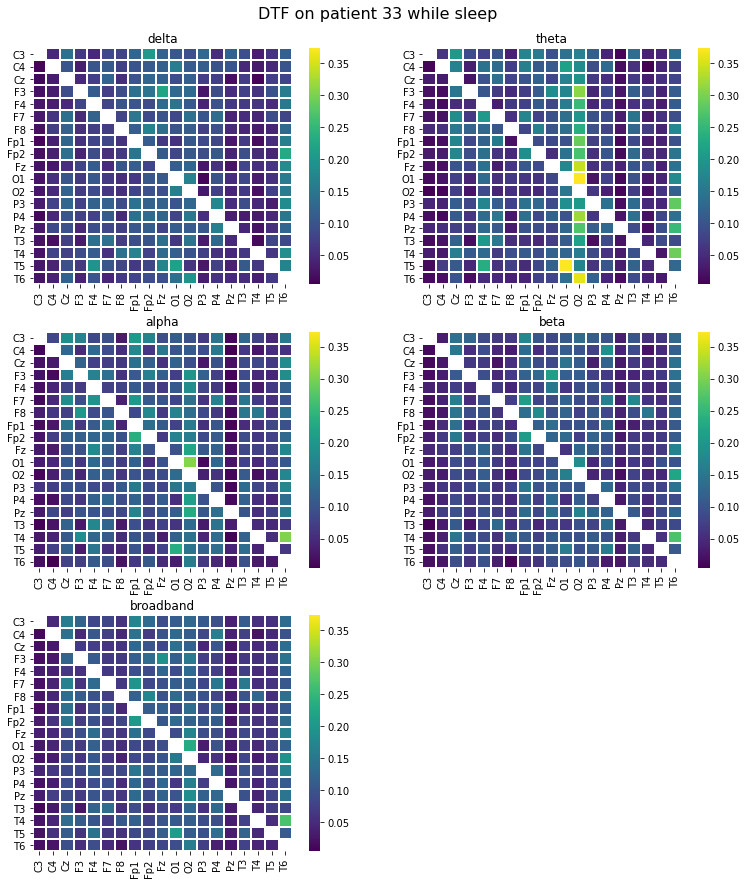

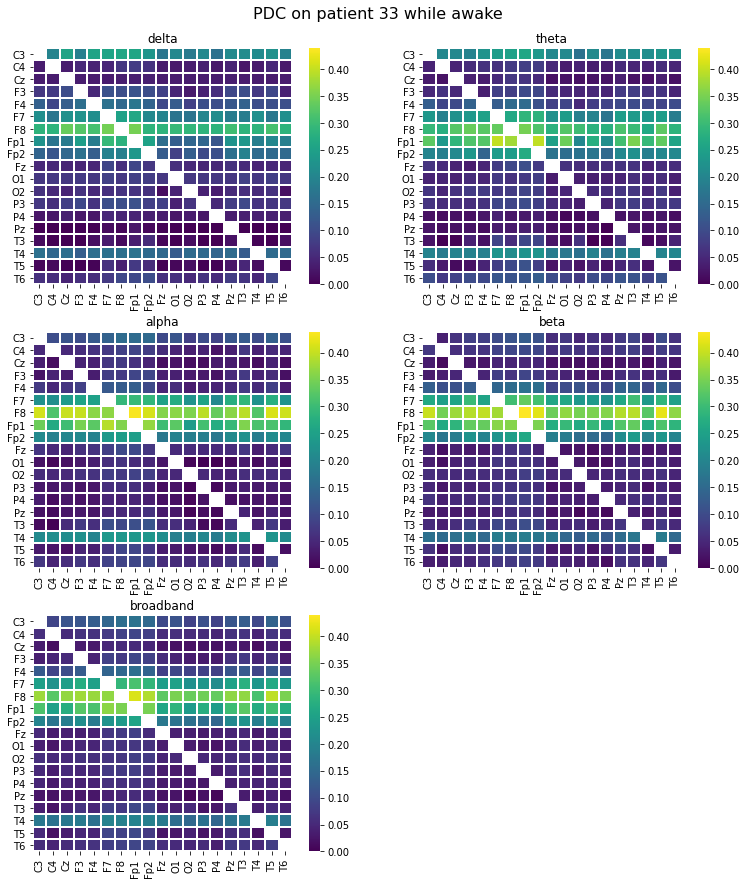

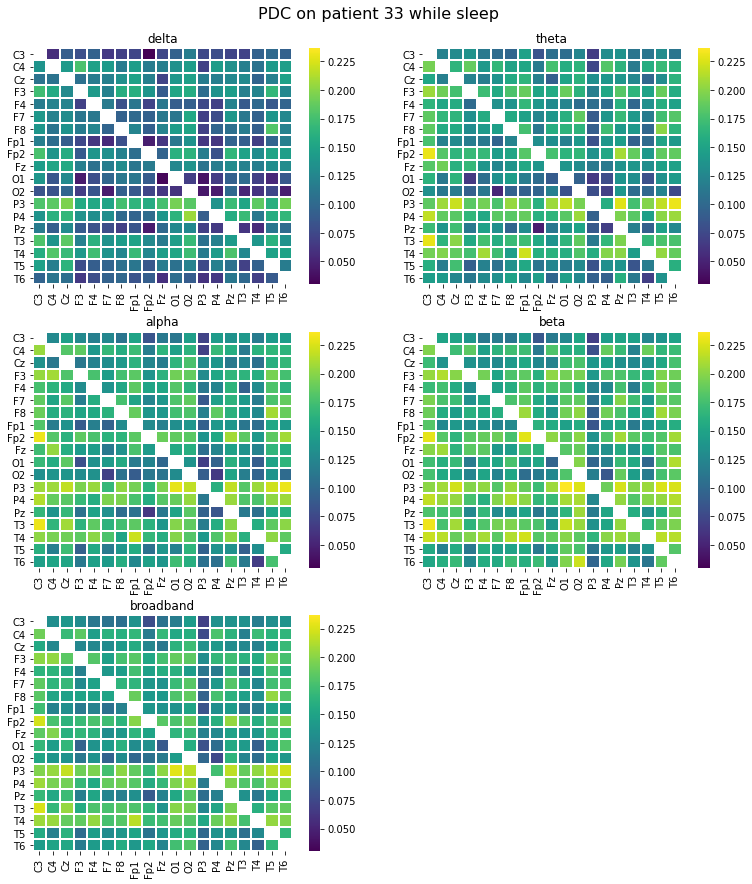

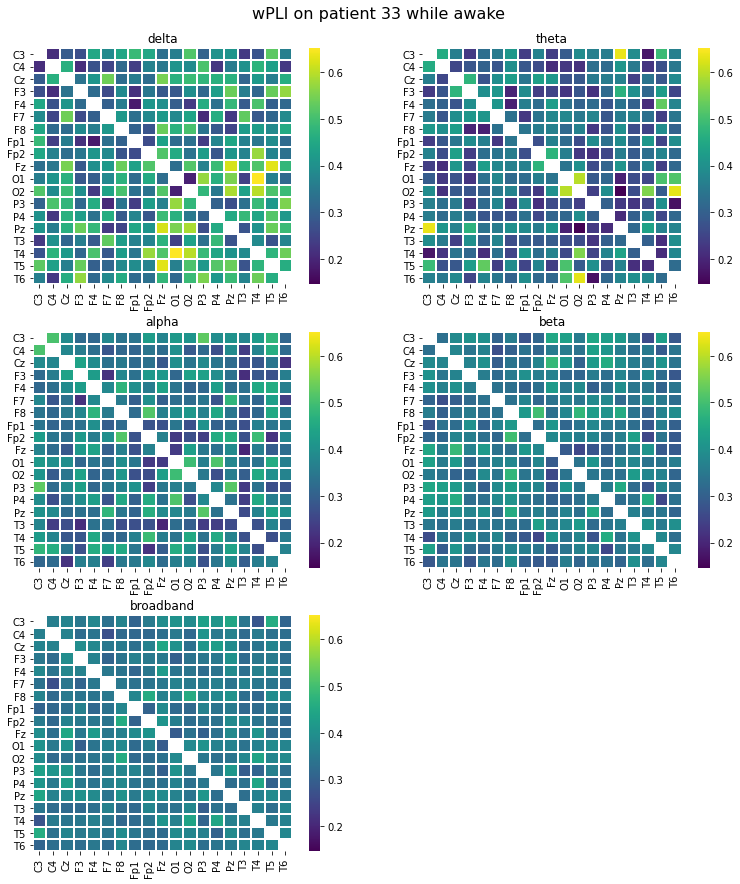

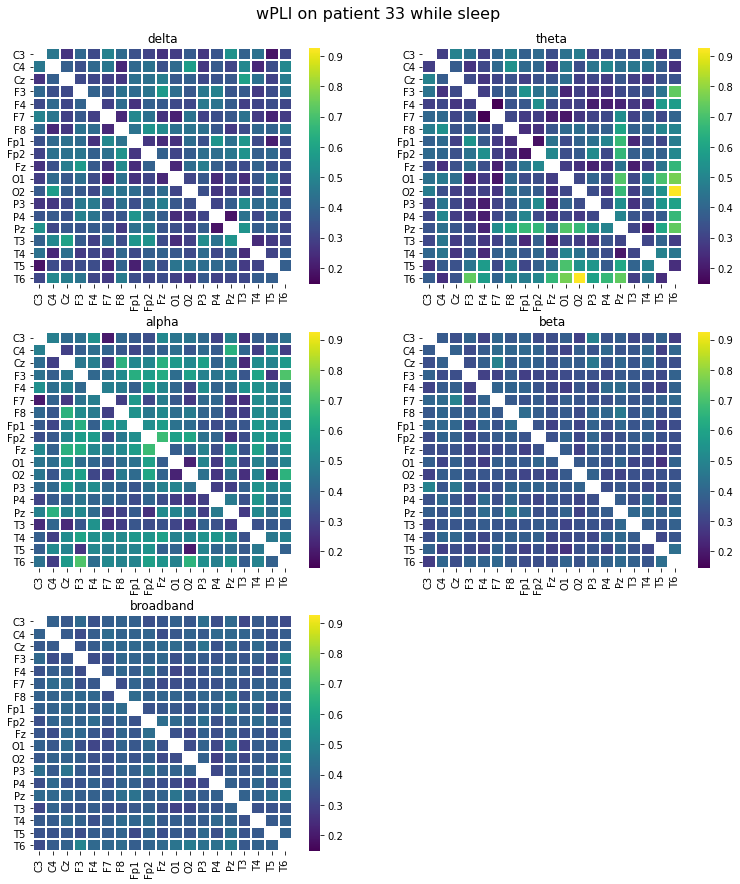

 86%|████████████████████████████████████████████████████████████████████▎          | 32/37 [3:03:45<27:56, 335.29s/it]

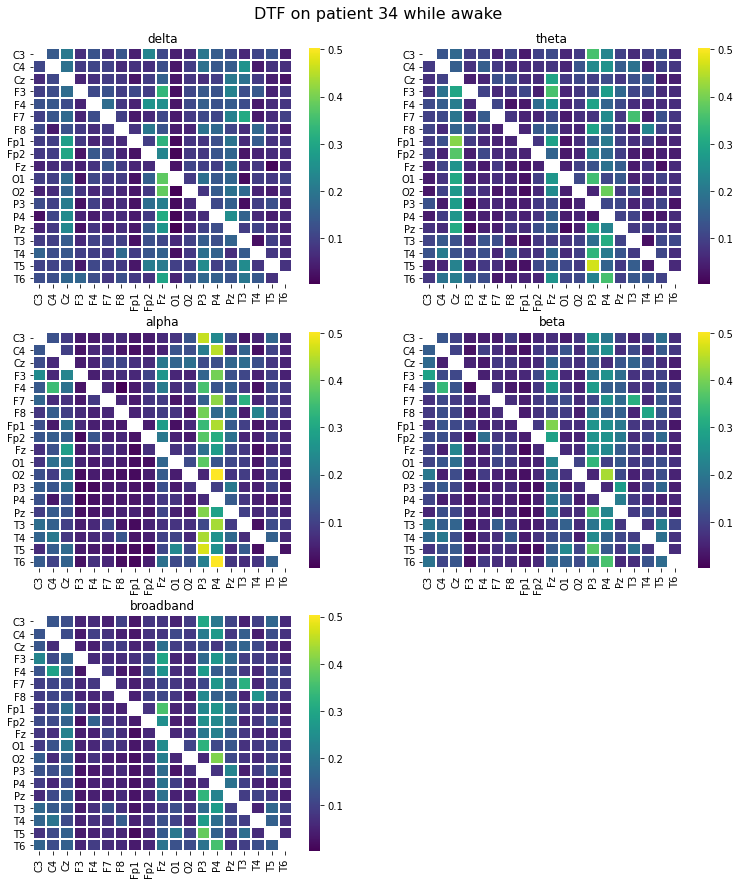

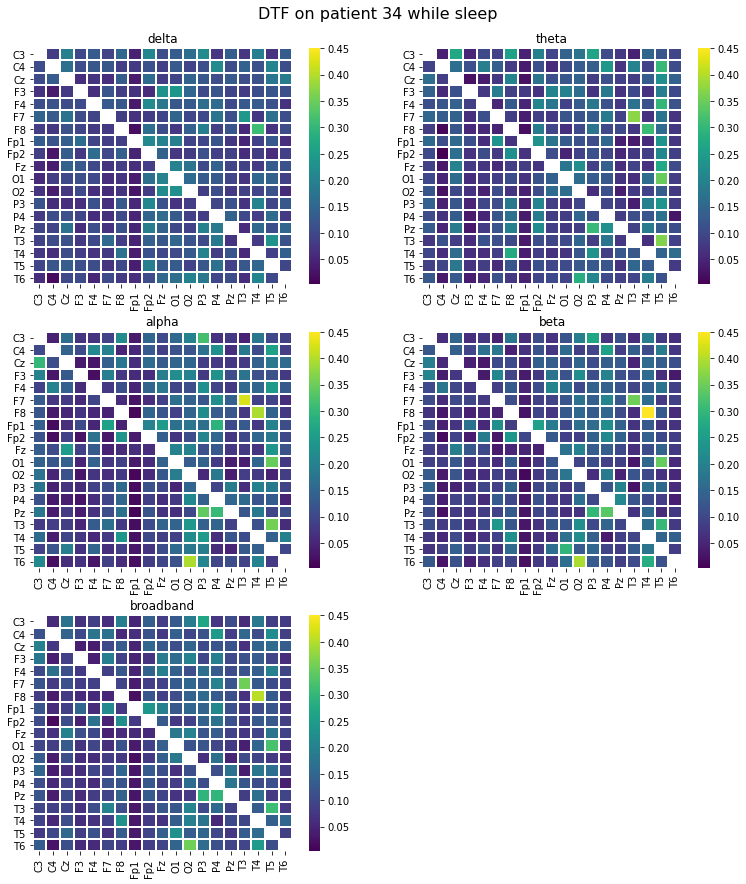

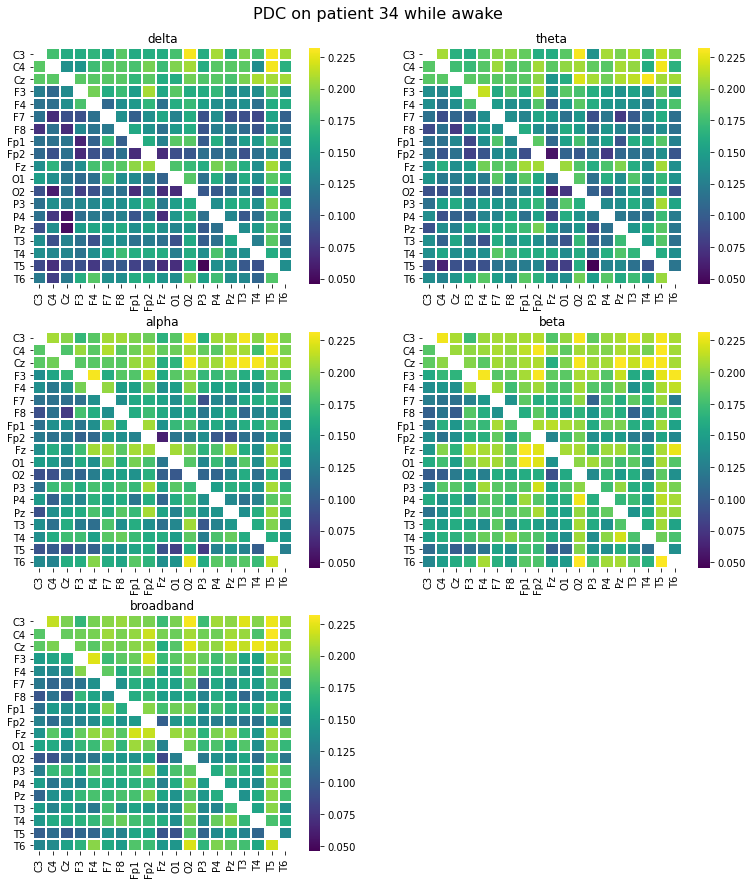

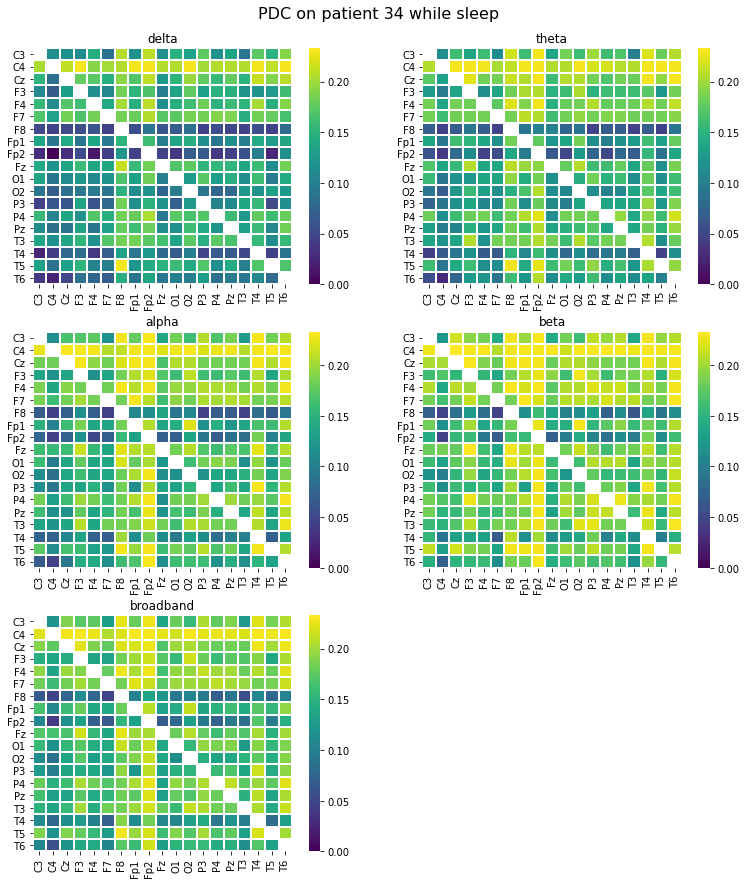

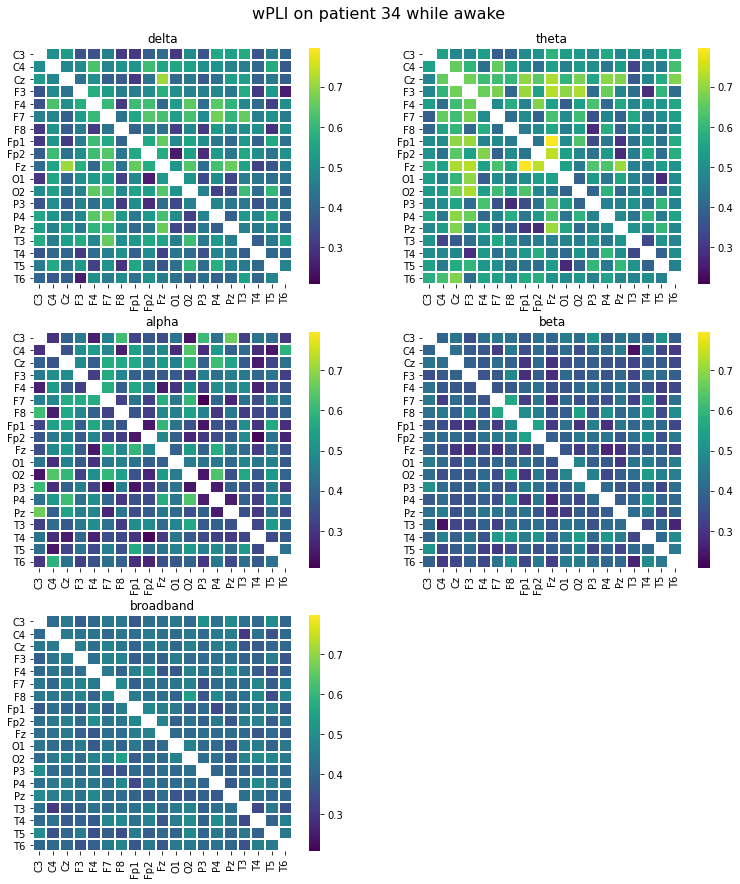

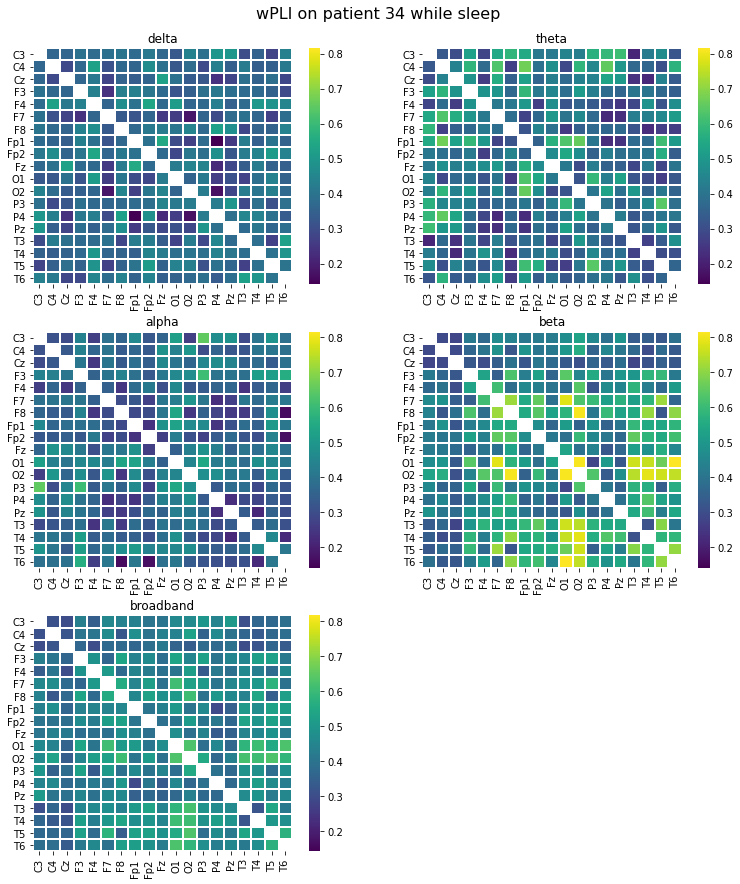

 89%|██████████████████████████████████████████████████████████████████████▍        | 33/37 [3:14:37<28:41, 430.25s/it]

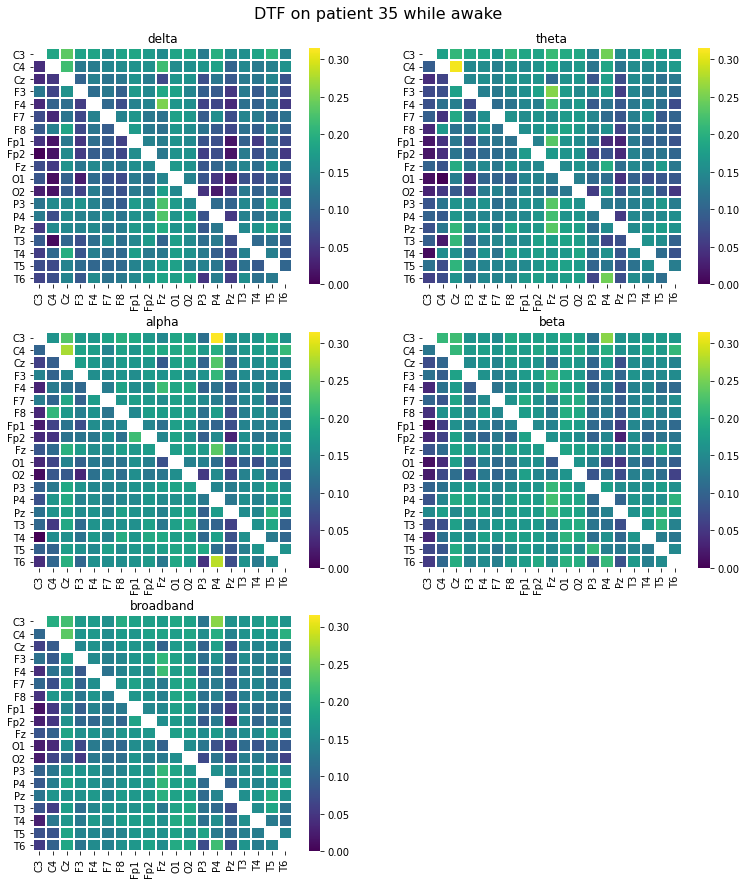

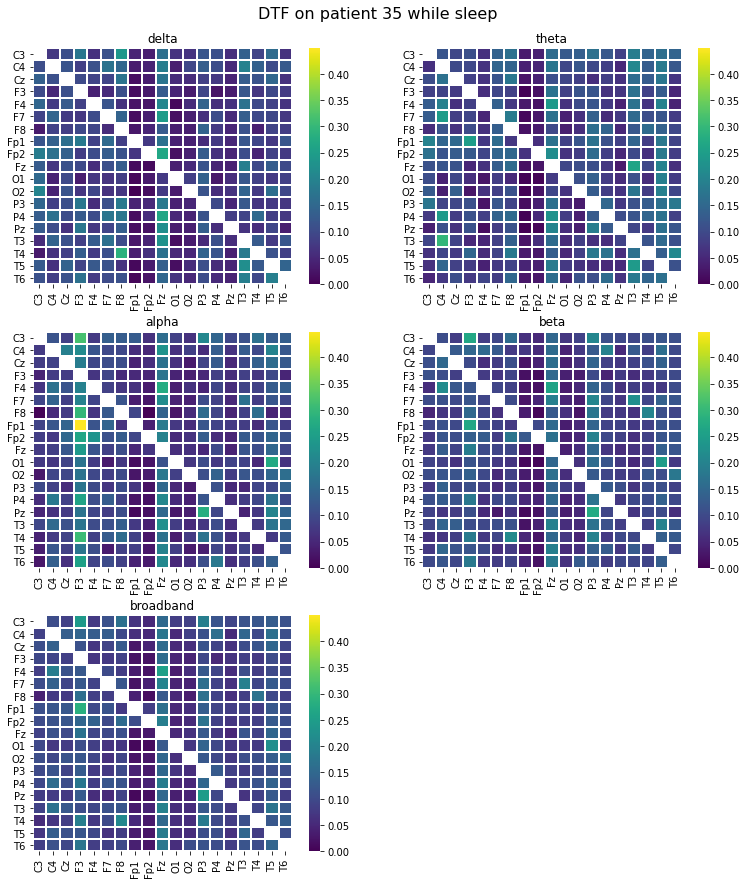

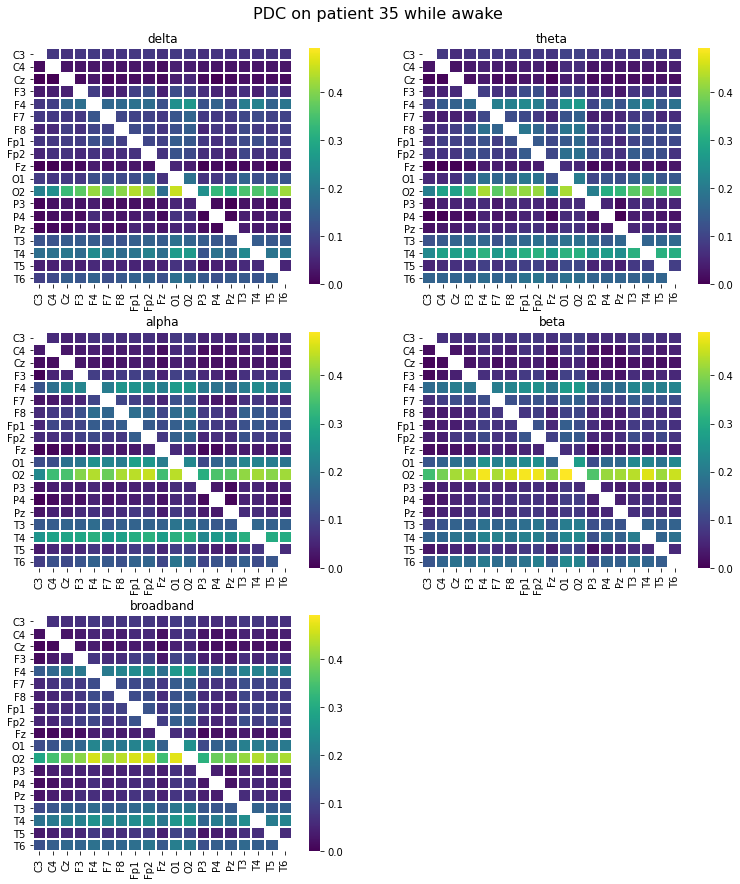

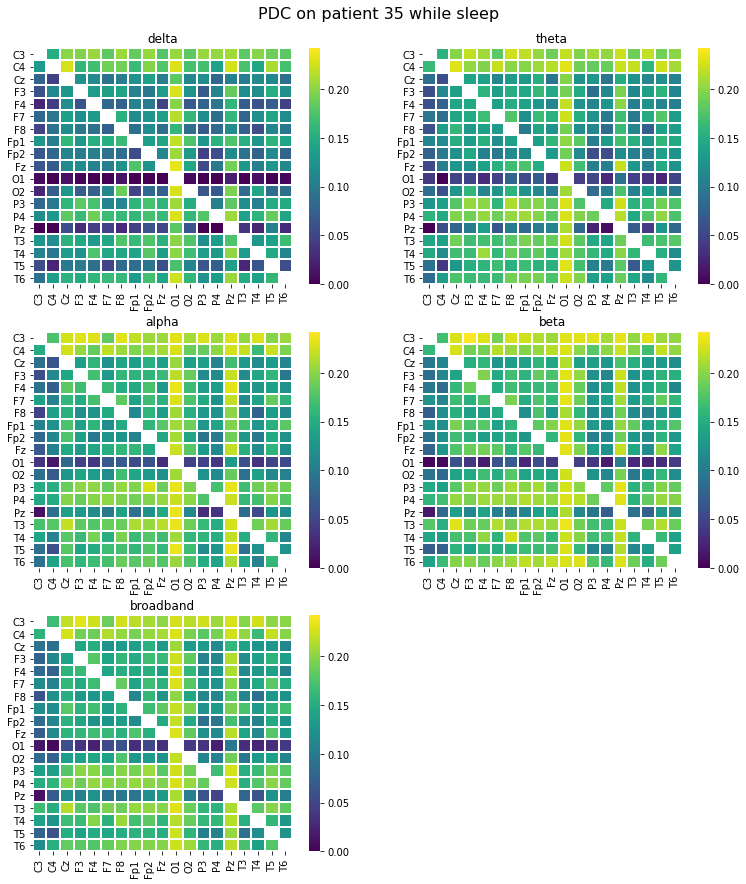

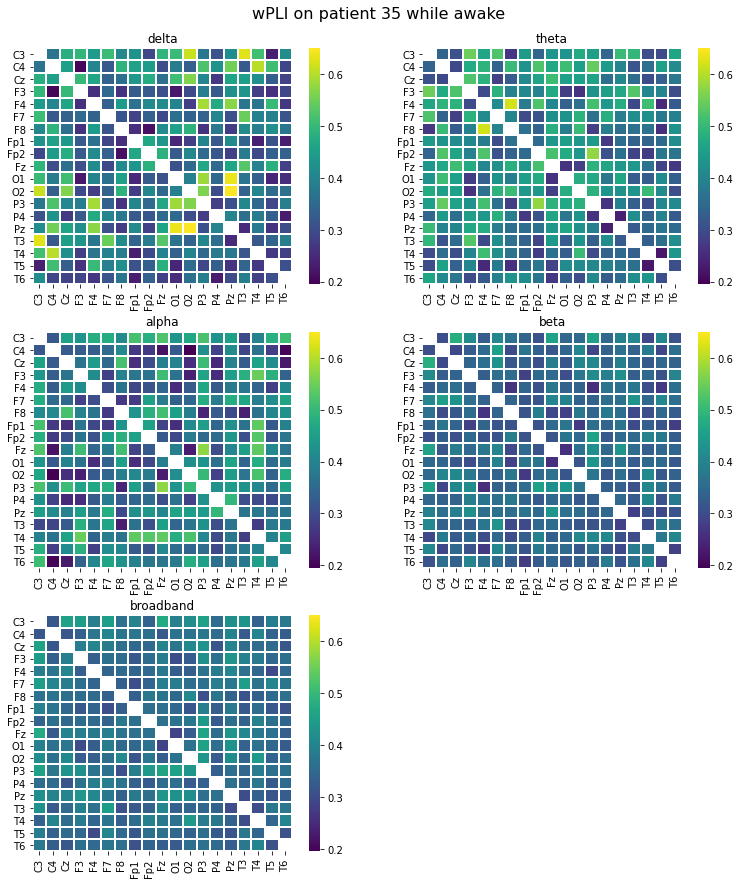

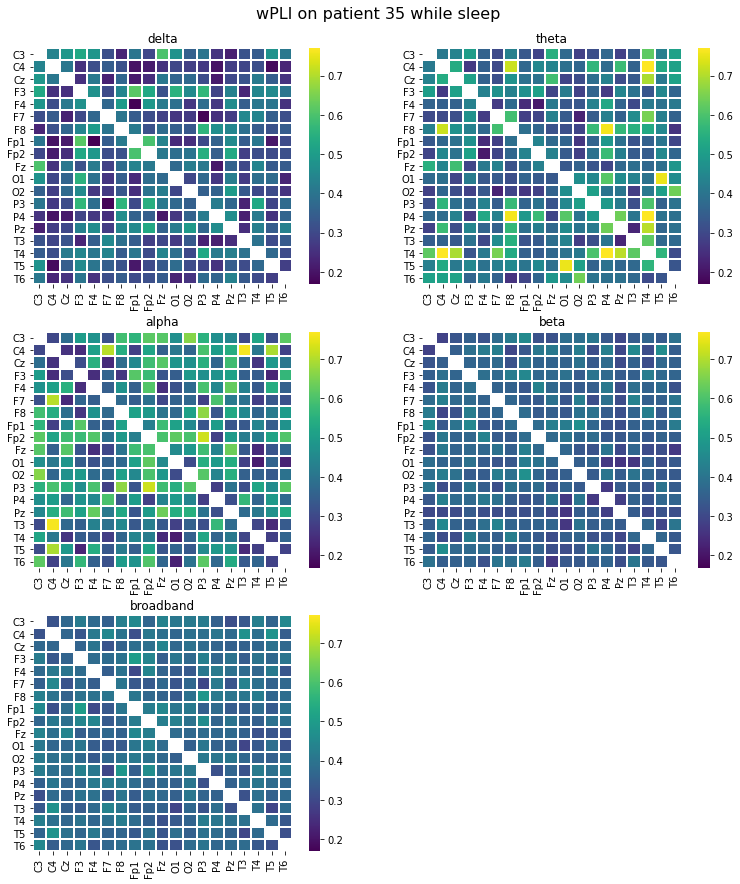

 92%|████████████████████████████████████████████████████████████████████████▌      | 34/37 [3:20:09<20:02, 400.95s/it]

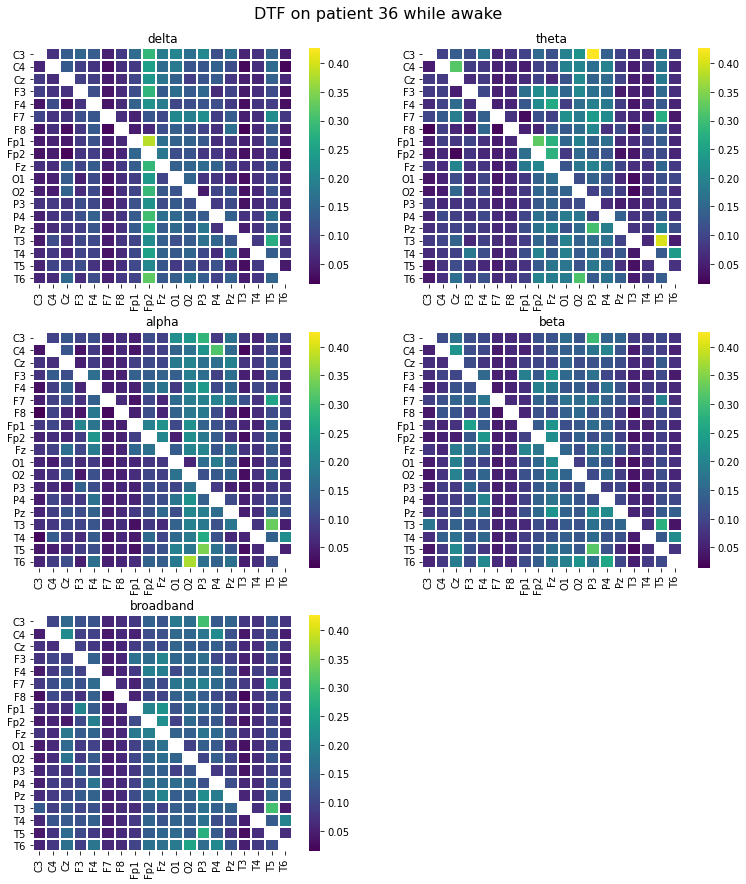

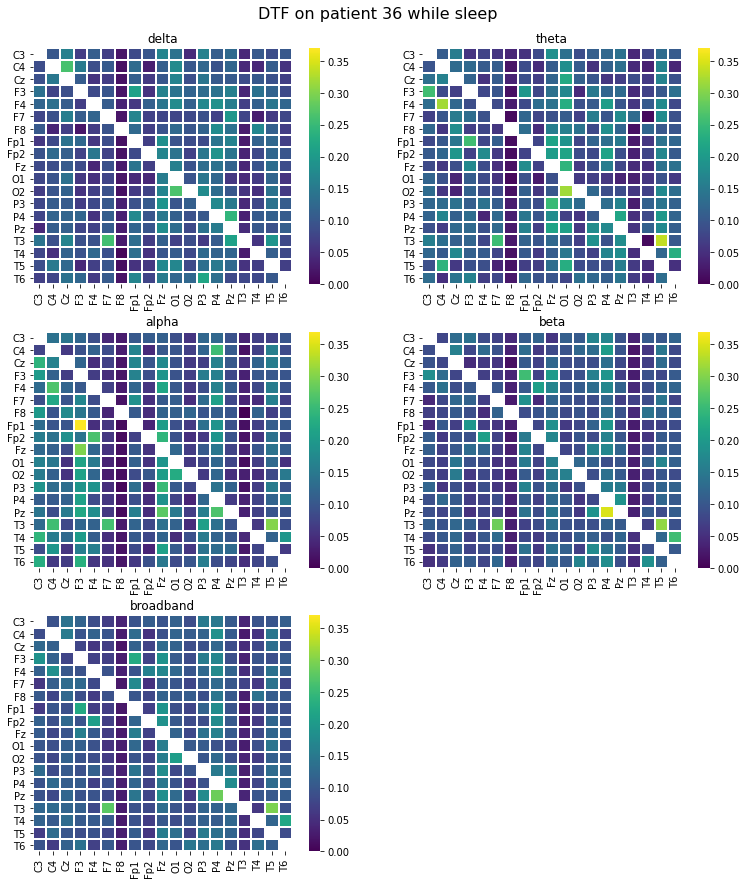

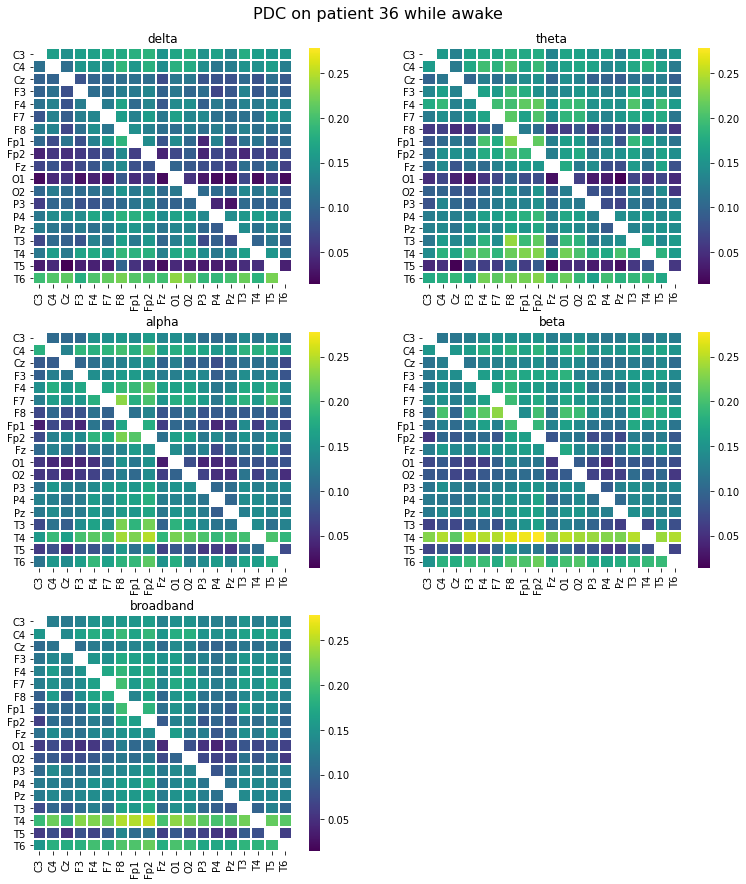

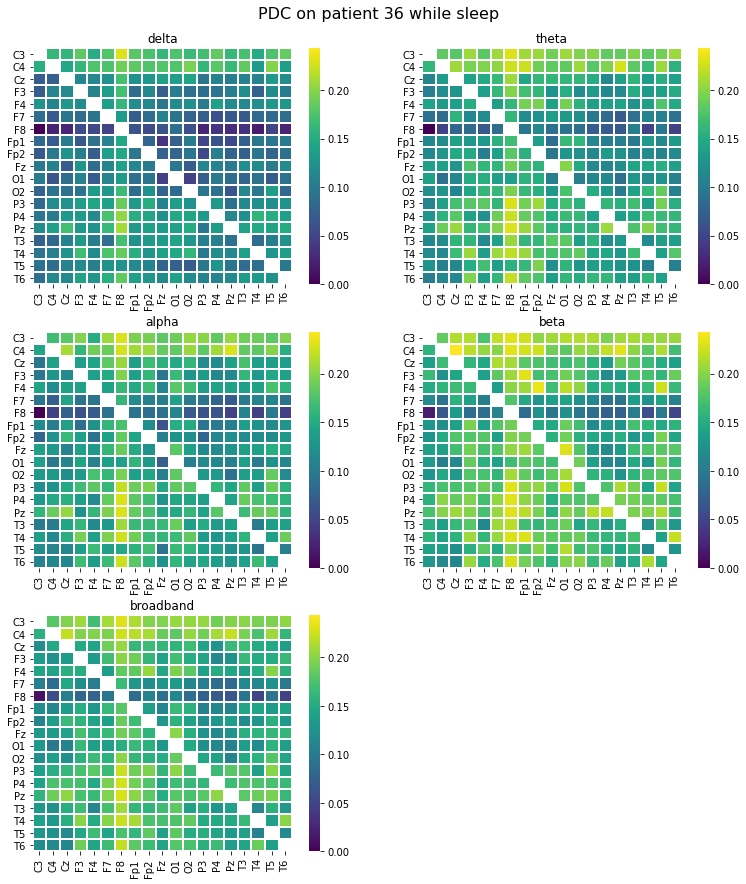

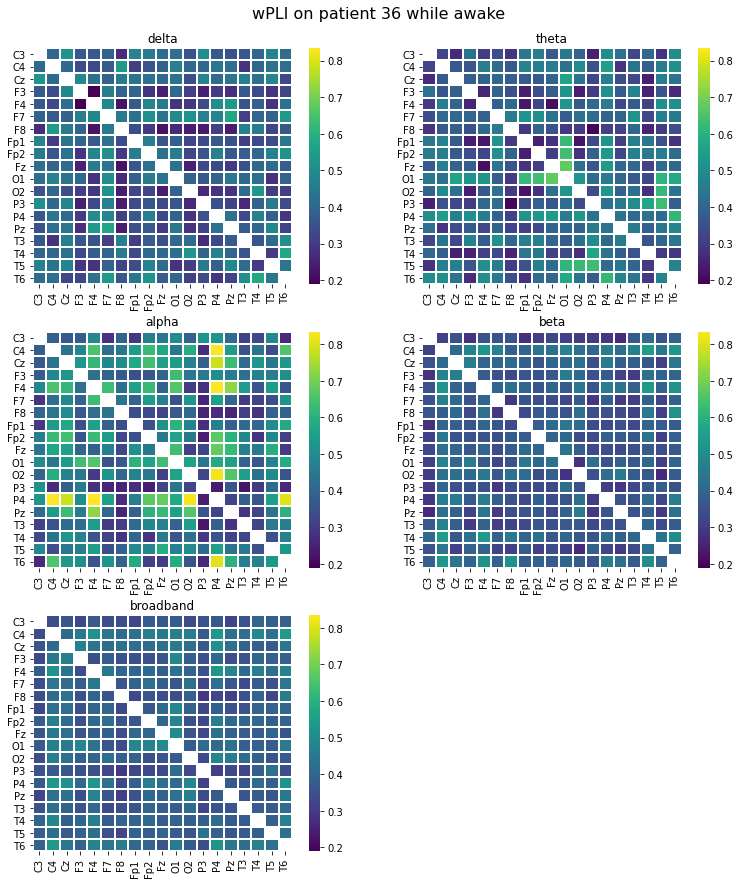

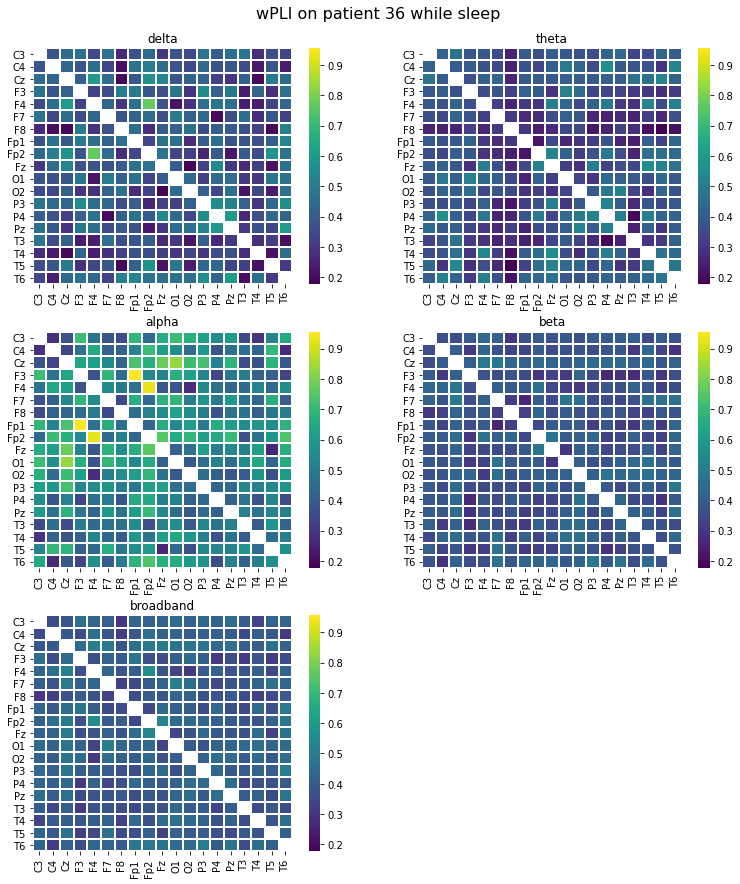

 95%|██████████████████████████████████████████████████████████████████████████▋    | 35/37 [3:25:44<12:42, 381.11s/it]

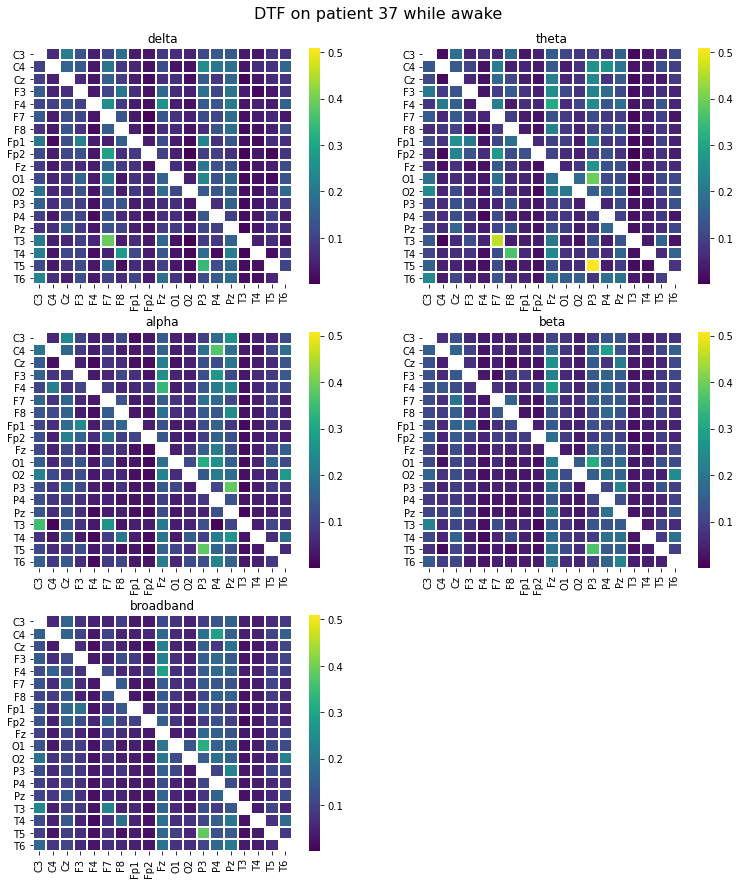

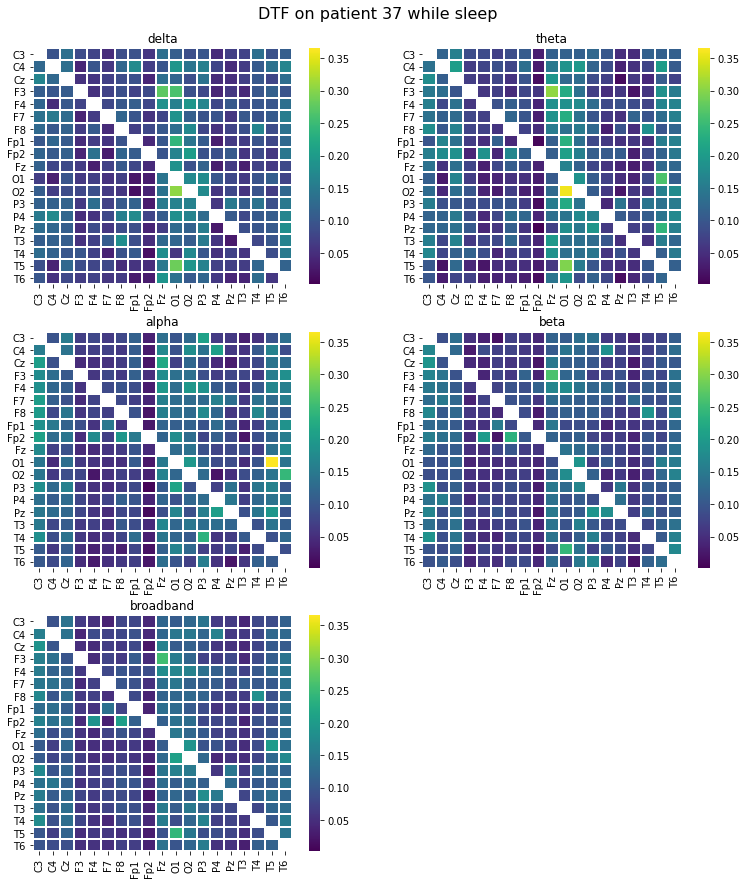

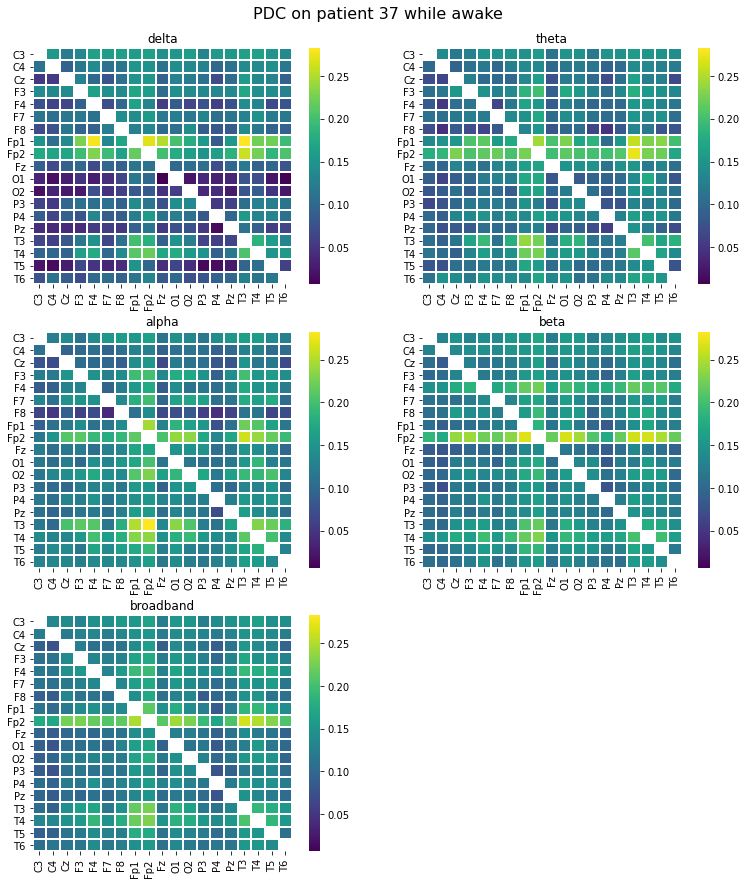

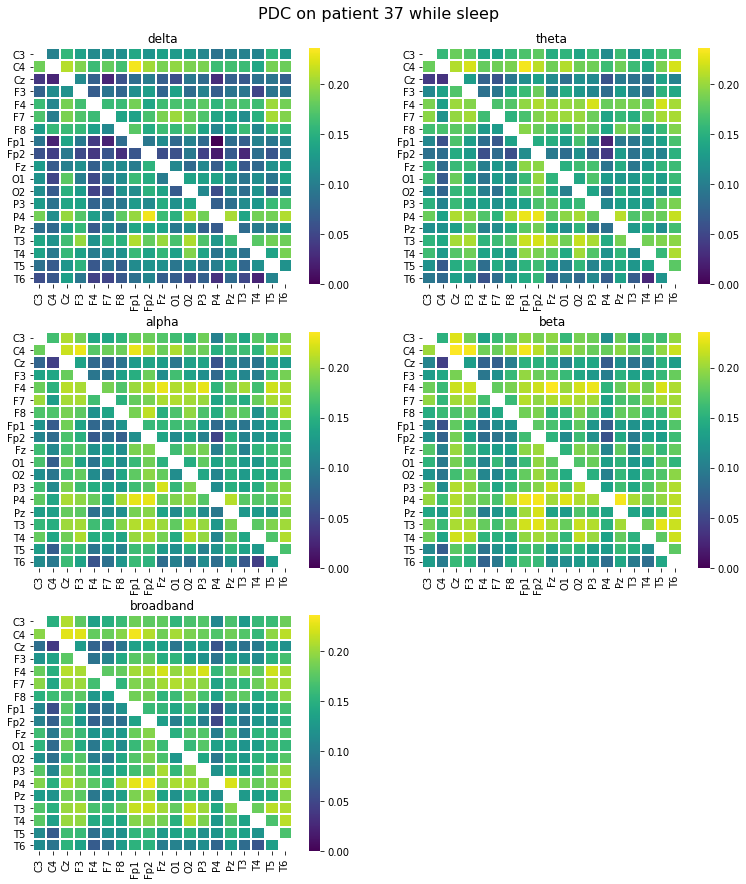

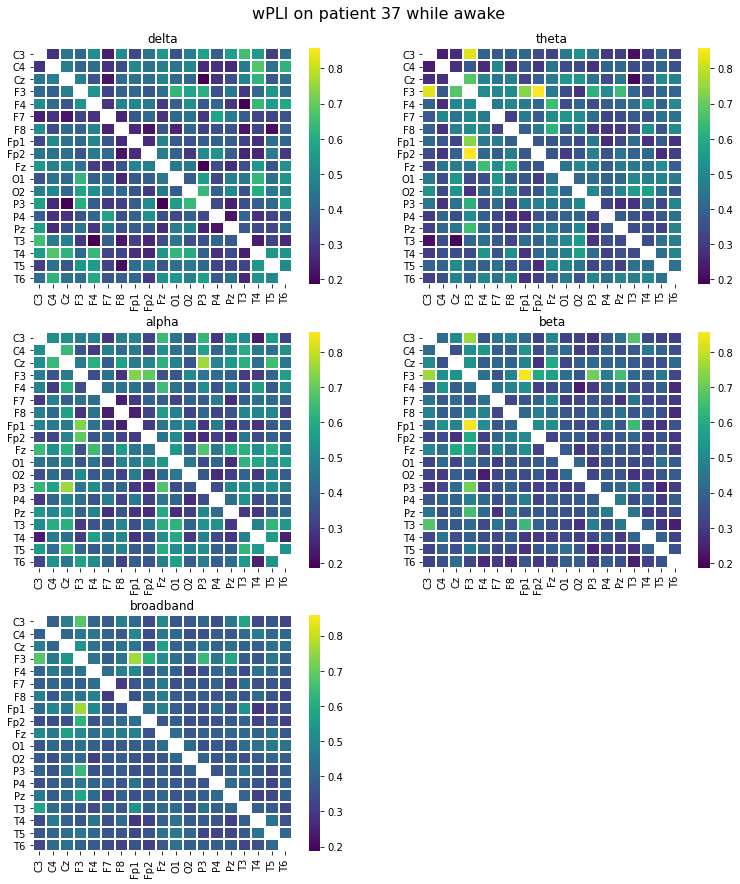

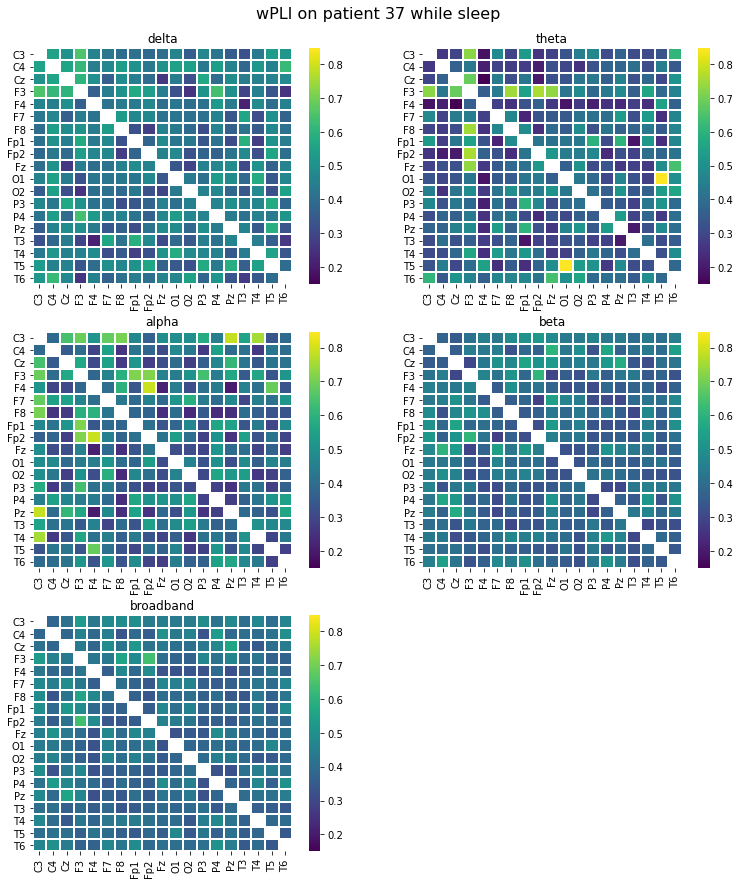

 97%|████████████████████████████████████████████████████████████████████████████▊  | 36/37 [3:31:26<06:09, 369.47s/it]

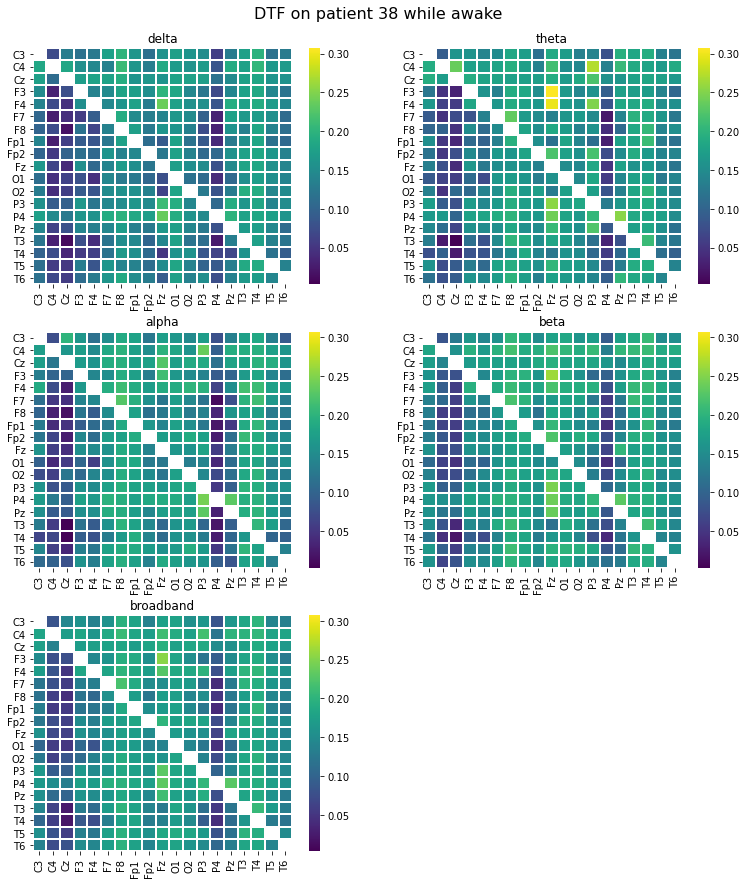

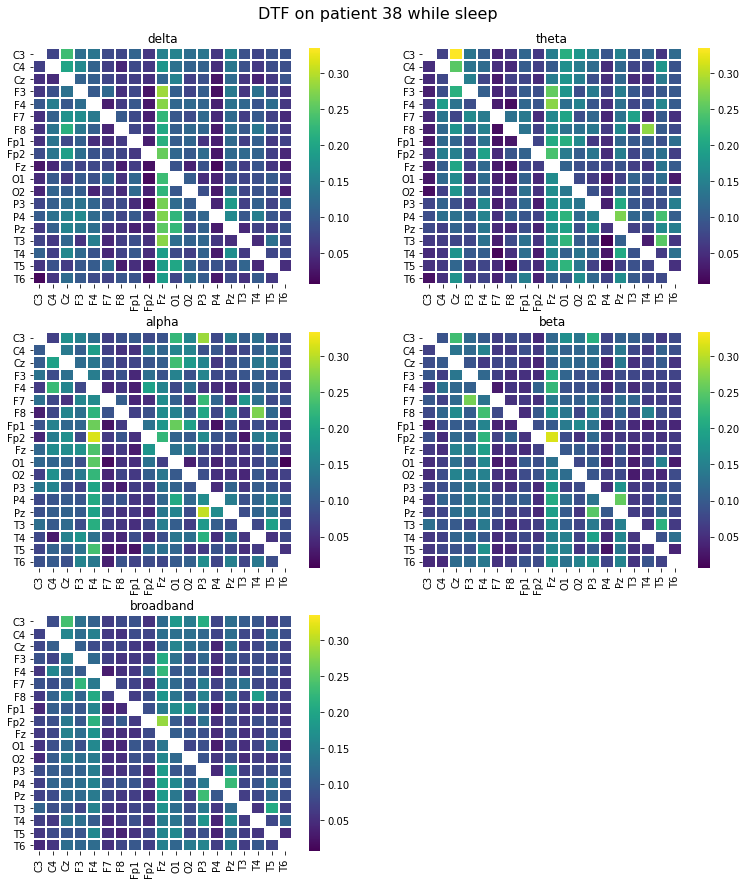

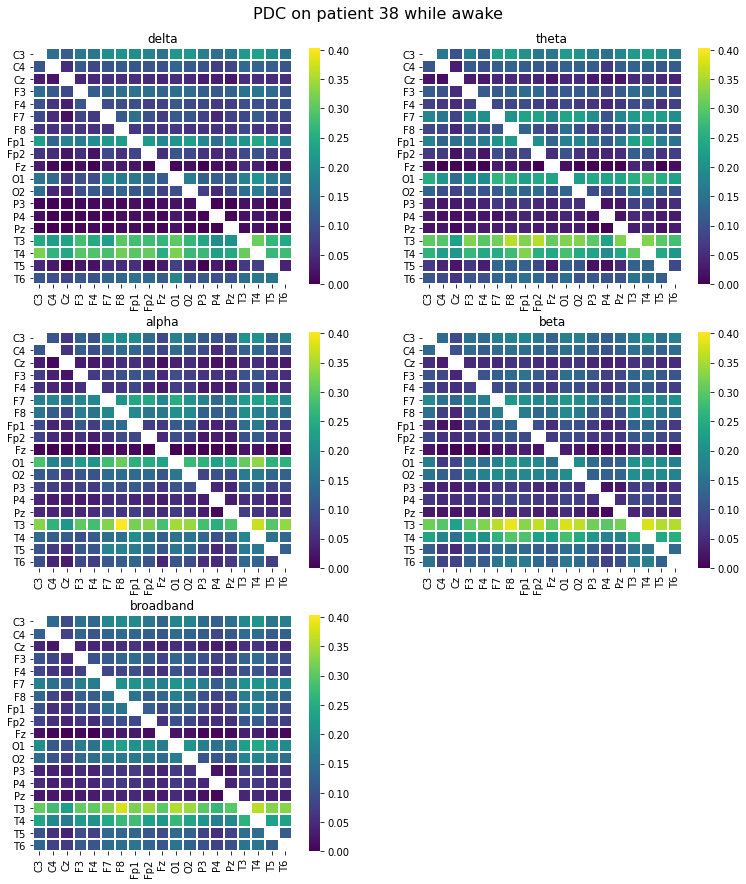

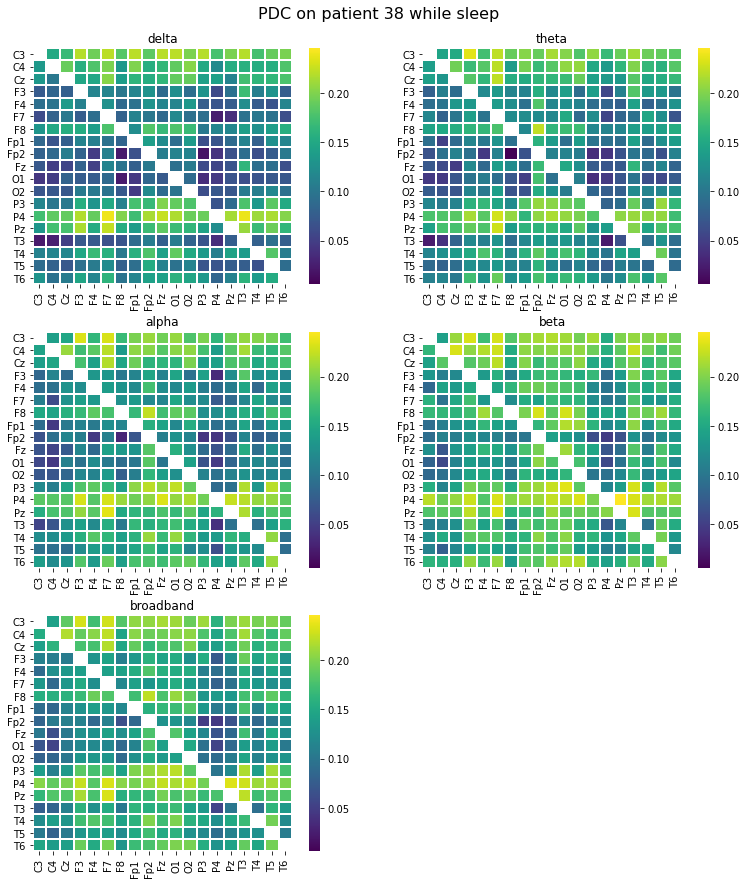

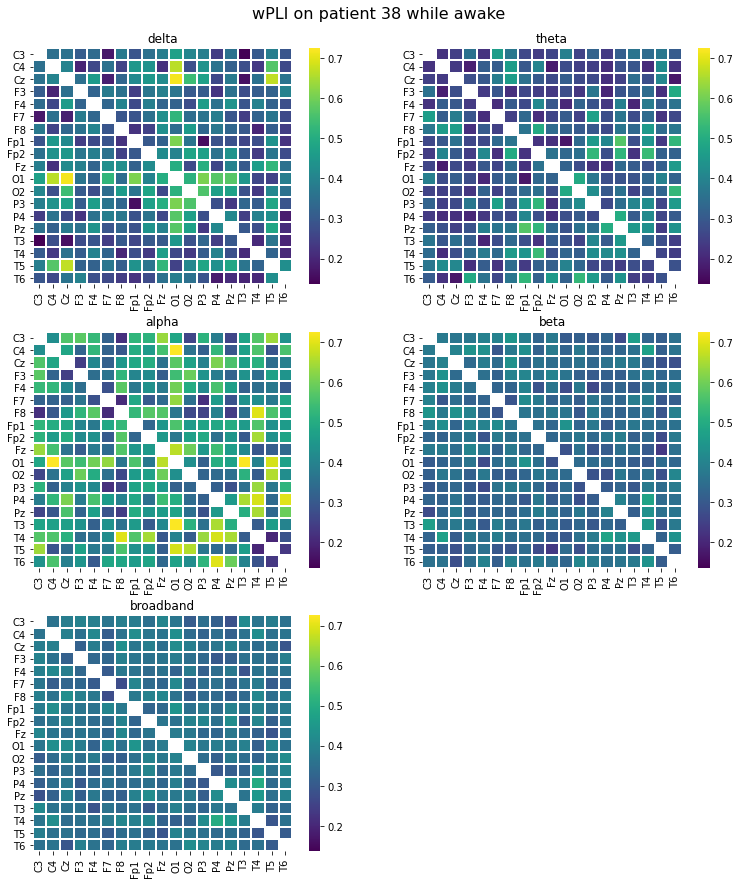

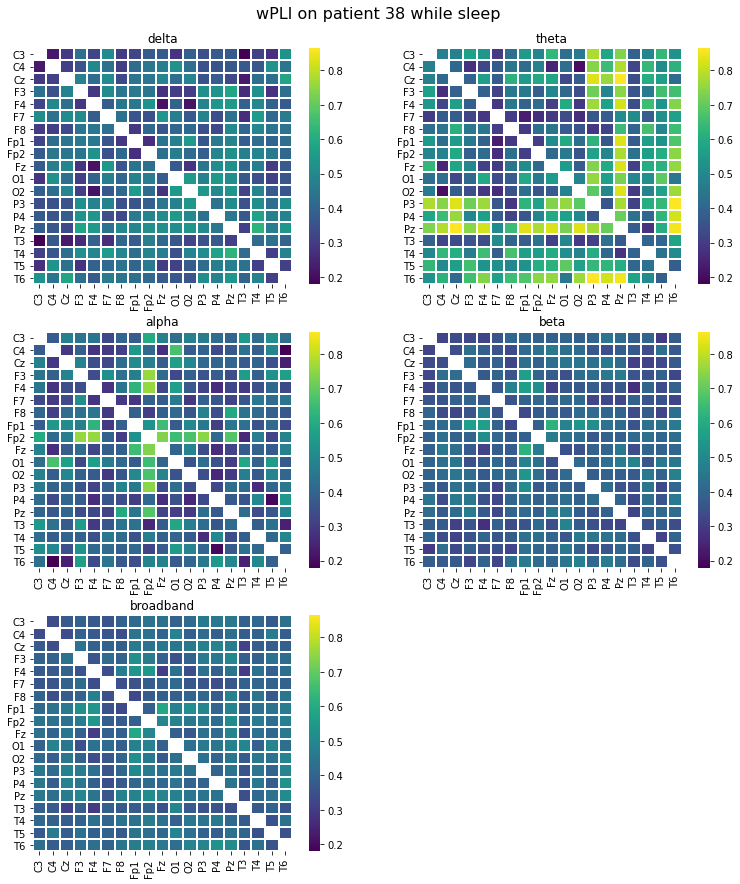

100%|███████████████████████████████████████████████████████████████████████████████| 37/37 [3:36:57<00:00, 351.81s/it]


In [34]:
for pat_num in tqdm(to_preprocess):
    patient_code = 'PAT'+str(pat_num)
    weaning = PAT_metadata[patient_code]
    epoched = prep.open_preprocessed_epoched(pat_num, weaning=weaning)
    a_awake, a_sleep = (epoched[0]).copy(), (epoched[1]).copy()
    cm_awake = cm.ConnectionsMatrices(a_awake, patient_number=pat_num, rec_status='awake', surrogate_test=True)
    cm_sleep = cm.ConnectionsMatrices(a_sleep, patient_number=pat_num, rec_status='sleep', surrogate_test=True)
    pickle.dump(cm_awake, open(direc_pickle+patient_code+'_'+'AWAKE.pickle', 'wb'))
    pickle.dump(cm_sleep, open(direc_pickle+patient_code+'_'+'SLEEP.pickle', 'wb'))
    for measure in ['DTF', 'PDC', 'wPLI']:
        cm_awake.plot_fbands_hmaps(measure=measure, hide_diag=True, savefigure=True, directory=direc)
        cm_sleep.plot_fbands_hmaps(measure=measure, hide_diag=True, savefigure=True, directory=direc)

### To create connectomes using the pickled connection matrices

In [29]:
data = {}
data['patient'] = []
for measure in ['DTF', 'PDC']:
    for f_band in ['delta', 'theta', 'alpha', 'beta', 'broadband']:
        data[measure +'_'+f_band+'_AWAKE_AVGBC'], data[measure +'_'+f_band+'_SLEEP_AVGBC'] = [], []
        data[measure +'_'+f_band+'_AWAKE_GE'], data[measure +'_'+f_band+'_SLEEP_GE'] = [], []
        data[measure +'_'+f_band+'_AWAKE_DA'], data[measure +'_'+f_band+'_SLEEP_DA'] = [], []
        data[measure +'_'+f_band+'_AWAKE_AVGCC'], data[measure +'_'+f_band+'_SLEEP_AVGCC'] = [], []
        data[measure +'_'+f_band+'_AWAKE_MOD'], data[measure +'_'+f_band+'_SLEEP_MOD'] = [], []
        data['wPLI_'+f_band+'_AWAKE_MEAN_SYNCH'], data['wPLI_'+f_band+'_SLEEP_MEAN_SYNCH'] = [], []

for pat_num in tqdm(to_preprocess):
    data['patient'].append(pat_num)
    patient_code = 'PAT'+str(pat_num)
    weaning = PAT_metadata[patient_code]
    cm_awake, cm_sleep = pickle.load(open(direc_pickle+patient_code+'_'+'AWAKE.pickle', 'rb')), pickle.load(open(direc_pickle+patient_code+'_'+'SLEEP.pickle', 'rb'))
    for measure in ['DTF', 'PDC']:
        cntome_awake = cntms.Connectomes(cm_awake, measure)#, thresholding_method='density', threshold=0.6)
        cntome_sleep = cntms.Connectomes(cm_sleep, measure)#, thresholding_method='density', threshold=0.6)
        
        #cntome_awake.plot_measure(n_strongest_connections=30, savefigure=True, fformat='.pdf', directory=direc)
        #cntome_sleep.plot_measure(n_strongest_connections=30, savefigure=True, fformat='.pdf', directory=direc)
        #cntome_awake.plot_measure(percentiles_to_get=10, central_percentile=False, savefigure=True, fformat='.pdf', directory=direc, data='weight')
        #cntome_sleep.plot_measure(percentiles_to_get=10, central_percentile=False, savefigure=True, fformat='.pdf', directory=direc, data='weight')
        
        grc_awake, grc_sleep = cntome_awake.global_reaching_centrality(), cntome_sleep.global_reaching_centrality()
        ge_awake, ge_sleep = cntome_awake.global_efficiency_weighted(), cntome_sleep.global_efficiency_weighted()
        da_awake, da_sleep = cntome_awake.degree_assortativity(), cntome_sleep.degree_assortativity()
        avg_cc_awake, avg_cc_sleep = cntome_awake.avg_clustering_coefficient(), cntome_sleep.avg_clustering_coefficient()
        mod_awake, mod_sleep = cntome_awake.modularity(), cntome_sleep.modularity()
        
        for i in range(len(cm_awake.f_bands)):
            f_band = cm_awake.f_bands[i]
            data[measure +'_'+f_band+'_AWAKE_GRC'].append(grc_awake[f_band]), data[measure +'_'+f_band+'_SLEEP_GRC'].append(grc_sleep[f_band])
            data[measure +'_'+f_band+'_AWAKE_GE'].append(ge_awake[f_band]), data[measure +'_'+f_band+'_SLEEP_GE'].append(ge_sleep[f_band])
            data[measure +'_'+f_band+'_AWAKE_DA'].append(da_awake[f_band]), data[measure +'_'+f_band+'_SLEEP_DA'].append(da_sleep[f_band])
            data[measure +'_'+f_band+'_AWAKE_AVGCC'].append(avg_cc_awake[f_band]), data[measure +'_'+f_band+'_SLEEP_AVGCC'].append(avg_cc_sleep[f_band])
            data[measure +'_'+f_band+'_AWAKE_MOD'].append(mod_awake[f_band]), data[measure +'_'+f_band+'_SLEEP_MOD'].append(mod_sleep[f_band])
    
    #for f_band in cm_awake.f_bands:
        #data['wPLI_'+f_band+'_AWAKE_MEAN_SYNCH'].append(cm_awake.wPLI[i].mean()), data['wPLI_'+f_band+'_SLEEP_MEAN_SYNCH'].append(cm_sleep.wPLI[i].mean())
    for i in range(len(cm_awake.f_bands)):
        f_band = cm_awake.f_bands[i]
        data['wPLI_'+f_band+'_AWAKE_MEAN_SYNCH'].append(cm_awake.wPLI[i].mean()), data['wPLI_'+f_band+'_SLEEP_MEAN_SYNCH'].append(cm_sleep.wPLI[i].mean())
        
DF = pd.DataFrame(data)

100%|██████████████████████████████████████████████████████████████████████████████████| 37/37 [03:28<00:00,  5.62s/it]


In [30]:
DF

,patient,DTF_delta_AWAKE_AVGBC,DTF_delta_SLEEP_AVGBC,DTF_delta_AWAKE_GE,DTF_delta_SLEEP_GE,DTF_delta_AWAKE_DA,DTF_delta_SLEEP_DA,DTF_delta_AWAKE_AVGCC,DTF_delta_SLEEP_AVGCC,DTF_delta_AWAKE_MOD,...,PDC_broadband_AWAKE_AVGBC,PDC_broadband_SLEEP_AVGBC,PDC_broadband_AWAKE_GE,PDC_broadband_SLEEP_GE,PDC_broadband_AWAKE_DA,PDC_broadband_SLEEP_DA,PDC_broadband_AWAKE_AVGCC,PDC_broadband_SLEEP_AVGCC,PDC_broadband_AWAKE_MOD,PDC_broadband_SLEEP_MOD
0,1,0.005848,0.000000,56.995002,60.513127,0.042228,0.042462,0.262287,0.566107,-0.041017,...,0.0,0.0,75.720099,78.889001,0.048301,-0.024400,0.924296,0.963847,-0.043733,-0.046104
1,2,0.003268,0.000000,58.994002,62.024983,0.046790,0.021336,0.335918,0.619934,-0.047117,...,0.0,0.0,78.562297,78.812677,-0.008832,-0.010079,0.945263,0.965724,-0.045160,-0.045860
2,3,0.000000,0.000344,68.817555,59.603956,0.047033,0.040124,0.710507,0.547892,-0.045886,...,0.0,0.0,64.408152,75.273051,0.055521,0.054485,0.569611,0.886871,-0.042183,-0.044502
3,4,0.000000,0.000000,62.869461,62.662411,0.038423,0.007989,0.534080,0.544706,-0.047329,...,0.0,0.0,66.644128,78.612213,0.055438,-0.004845,0.678464,0.966230,-0.042815,-0.044935
4,5,0.004816,0.000172,56.022219,60.859169,0.041585,0.042111,0.184118,0.506019,-0.047806,...,0.0,0.0,77.497426,78.726098,0.024386,-0.018513,0.889691,0.971213,-0.043620,-0.045284
5,6,0.002408,0.000860,55.149661,57.549227,0.042044,0.017038,0.361707,0.502414,-0.047731,...,0.0,0.0,73.183667,78.703620,0.054657,0.028782,0.865700,0.974990,-0.043919,-0.044721
6,7,0.000000,0.001892,65.033220,60.340775,0.048666,0.034504,0.622817,0.465590,-0.043565,...,0.0,0.0,61.488731,74.693514,0.055541,0.054923,0.553460,0.937881,-0.040563,-0.045794
7,8,0.000000,0.000000,67.700584,60.813628,0.030080,0.044949,0.668994,0.575231,-0.048185,...,0.0,0.0,65.614628,76.951156,0.055408,0.054520,0.742751,0.928576,-0.043619,-0.045093
8,9,0.000000,0.001892,63.449246,57.710905,0.047386,0.044470,0.591994,0.241489,-0.043494,...,0.0,0.0,63.779316,77.621857,0.055461,0.045323,0.585522,0.948590,-0.041607,-0.045188
9,10,0.000000,0.000344,61.565382,61.444787,0.050561,0.045914,0.490498,0.449635,-0.048570,...,0.0,0.0,69.283569,78.854330,0.054517,-0.021026,0.810843,0.960433,-0.043685,-0.046099


In [32]:
DF.to_csv('no_thresh_08042022.csv')

In [17]:
DF.filter(regex='MEAN_SYNCH$',axis=1)

,wPLI_delta_AWAKE_MEAN_SYNCH,wPLI_delta_SLEEP_MEAN_SYNCH,wPLI_theta_AWAKE_MEAN_SYNCH,wPLI_theta_SLEEP_MEAN_SYNCH,wPLI_alpha_AWAKE_MEAN_SYNCH,wPLI_alpha_SLEEP_MEAN_SYNCH,wPLI_beta_AWAKE_MEAN_SYNCH,wPLI_beta_SLEEP_MEAN_SYNCH,wPLI_broadband_AWAKE_MEAN_SYNCH,wPLI_broadband_SLEEP_MEAN_SYNCH
0,0.374143,0.350902,0.374143,0.350902,0.374143,0.350902,0.374143,0.350902,0.374143,0.350902
1,0.353198,0.371688,0.353198,0.371688,0.353198,0.371688,0.353198,0.371688,0.353198,0.371688
2,0.390946,0.360570,0.390946,0.360570,0.390946,0.360570,0.390946,0.360570,0.390946,0.360570
3,0.384421,0.405081,0.384421,0.405081,0.384421,0.405081,0.384421,0.405081,0.384421,0.405081
4,0.396470,0.391111,0.396470,0.391111,0.396470,0.391111,0.396470,0.391111,0.396470,0.391111
5,0.360702,0.338493,0.360702,0.338493,0.360702,0.338493,0.360702,0.338493,0.360702,0.338493
6,0.363522,0.399993,0.363522,0.399993,0.363522,0.399993,0.363522,0.399993,0.363522,0.399993
7,0.450603,0.480991,0.450603,0.480991,0.450603,0.480991,0.450603,0.480991,0.450603,0.480991
8,0.337969,0.337924,0.337969,0.337924,0.337969,0.337924,0.337969,0.337924,0.337969,0.337924
9,0.375567,0.365067,0.375567,0.365067,0.375567,0.365067,0.375567,0.365067,0.375567,0.365067


In [12]:
DF.filter(regex='AVGBC$',axis=1)

,DTF_delta_AWAKE_AVGBC,DTF_delta_SLEEP_AVGBC,DTF_theta_AWAKE_AVGBC,DTF_theta_SLEEP_AVGBC,DTF_alpha_AWAKE_AVGBC,DTF_alpha_SLEEP_AVGBC,DTF_beta_AWAKE_AVGBC,DTF_beta_SLEEP_AVGBC,DTF_broadband_AWAKE_AVGBC,DTF_broadband_SLEEP_AVGBC,PDC_delta_AWAKE_AVGBC,PDC_delta_SLEEP_AVGBC,PDC_theta_AWAKE_AVGBC,PDC_theta_SLEEP_AVGBC,PDC_alpha_AWAKE_AVGBC,PDC_alpha_SLEEP_AVGBC,PDC_beta_AWAKE_AVGBC,PDC_beta_SLEEP_AVGBC,PDC_broadband_AWAKE_AVGBC,PDC_broadband_SLEEP_AVGBC
0,0.027348,0.013416,0.031648,0.010148,0.031992,0.013244,0.028208,0.006880,0.025628,0.003612,0.003612,0.003612,0.003440,0.003784,0.003268,0.001892,0.000688,0.000688,0.000344,0.000344
1,0.024768,0.005504,0.021328,0.007568,0.021672,0.012728,0.020124,0.004472,0.016684,0.003096,0.004128,0.006880,0.002580,0.005332,0.000688,0.002924,0.000516,0.001892,0.000344,0.002236
2,0.007568,0.013760,0.006192,0.018748,0.004816,0.015824,0.002408,0.013588,0.002924,0.009116,0.010148,0.007396,0.007568,0.006192,0.009288,0.004128,0.016168,0.000688,0.011180,0.001204
3,0.013244,0.010492,0.009460,0.012212,0.013072,0.011180,0.005332,0.006880,0.004988,0.004128,0.028896,0.002408,0.019952,0.001548,0.028208,0.001376,0.023392,0.000516,0.023392,0.000860
4,0.022532,0.011008,0.029068,0.014104,0.030272,0.016684,0.018748,0.010664,0.018748,0.005848,0.008256,0.003096,0.007396,0.002752,0.005676,0.000860,0.003956,0.000344,0.003612,0.000172
5,0.021672,0.011352,0.025284,0.009976,0.022188,0.009632,0.012728,0.005848,0.011696,0.002752,0.005676,0.004816,0.003612,0.002924,0.001892,0.002064,0.000172,0.000688,0.000344,0.001032
6,0.010664,0.012040,0.010664,0.013588,0.012556,0.009460,0.006020,0.010492,0.005504,0.008256,0.037840,0.009460,0.026488,0.007052,0.024940,0.009460,0.023564,0.009288,0.025972,0.008428
7,0.008428,0.015480,0.006192,0.014448,0.004644,0.015652,0.002580,0.008600,0.001548,0.006364,0.010320,0.006880,0.012900,0.003956,0.020812,0.003612,0.010836,0.001720,0.009288,0.001892
8,0.003956,0.013932,0.003268,0.017888,0.003096,0.017716,0.002580,0.010836,0.002752,0.007912,0.014448,0.003612,0.015996,0.003784,0.019092,0.003784,0.014276,0.001720,0.013760,0.001720
9,0.021156,0.016512,0.019608,0.015308,0.017888,0.012040,0.014792,0.011008,0.012900,0.007052,0.009804,0.003440,0.006192,0.003612,0.005160,0.004472,0.003612,0.002580,0.002752,0.002752
